# Analysis of Unhealthy Shopping Patterns at ASDA Morley: Consumer Profiling Based on Basket Types and  Geographical Distribution

### GEOG5405M Urban Data Science Project
### Student ID: 201798764

<br><br>

# Introduction

## 1.1 Introduction

Unhealthy diets are a significant problem in the UK, closely linked to the types of food purchased in supermarkets. The choices customers make are influenced by a complex array of factors. This study utilises transactional data from ASDA to capture authentic customer shopping behaviours, aiming to understand the drivers behind purchases of healthy and unhealthy foods. By categorising these behaviours, we can gain insights into long-term consumer trends and preferences.

## 1.2 Research Questions / Hypothesis

#### 1. How do shopping pattern differ the purchase of healthy food versus unhealthy food?

#### 2. Are customers' shopping patterns consistently healthy, or do they vary?

#### 3. How does geographical location influence the likelihood of purchasing unhealthy food, and what is its relationship to overall shopping behavior?

<br><br><br>

# Methodology

## 2.1 Data

This study integrates 10 datasets to analyse consumer behaviour and socio-economic factors surrounding the ASDA Morley store and nearby regions. The data sources include transaction records, geographical boundaries, deprivation indices, and Census 2021 statistics. These datasets provide a comprehensive view of the influences on shopping habits and access to healthy food.

**Datasets Used**

- ASDA Transaction Data:
  - **Product**: Details of products sold, including nutritional content.
  - **Basket**: Records of individual transactions, including prices and discounts.
  - **Customer**: Information on customer visits and shopping behavior.
  - **Customer Postcode**: Geographic data on customer residences.

- **Geographical Boundary Data**
- **Postcode District Boundaries**: Defines UK postal district boundaries for spatial analysis.
- **Index of Multiple Deprivation (IMD)**: Measures socio-economic deprivation across UK regions.
- **Priority Places for Food Index (PPFI)**: Assesses food insecurity risks and accessibility in the UK.
- Demographic Data:
  - **General Health**: Health status estimates for residents.
  - **Highest Level of Qualification**: Educational attainment of residents.
  - **Car or Van Availability**: Household transportation resources.

<br>

### 2.1.1 ASDA transaction Data

__Overview__  
The primary transaction source dataset is provided by ASDA and comprises three interrelated datasets: Product, Basket, and Customer.  
__Data Source__  
Provided by ASDA.  
__Availability__  
The dataset encompasses transactions recorded from January 1, 2023, to May 31, 2023. These transactions were conducted at three specific locations: Kirkstall Supermarket, Killingbeck Superstore, and ASDA Morley Superstore.

#### 1. Product Dataset (File name: `product_data_new.csv`):

This dataset is stored in a CSV file format, consisting of 200,777 entries and 8 columns. It encompasses a wide range of products sold at ASDA, not limited to food and beverages. The columns in this dataset provide detailed information about each product.  

__Data Structure__
<br>
| Column                        | Description                                                                                              | Data Type |
|:------------------------------|:---------------------------------------------------------------------------------------------------------|:----------|
| `prod_id`                     | A unique identifier for each product.                                                                    | int64     |
| `prod_disp_nm`                | The display name of the product.                                                                         | object    |
| `brand_nm`                    | The brand associated with the product.                                                                   | object    |
| `bb_nutritional_val_json_txt` | Nutritional values formatted as a JSON string, detailing components like carbohydrates, fats, and proteins. | object    |
| `bb_nutritional_info_json_txt`| Dietary and allergen information also formatted as JSON, indicating attributes such as vegetarian, vegan, and presence of common allergens. | object    |
| `dept_desc`                  | The department or category to which the product belongs.                                                 | object    |
| `prod_start_dt`              | The date when the product started being available at the store. The date format should be confirmed if it needs conversion. | object    |
| `prod_end_dt`                | The anticipated end date of the product’s availability. The date format should be confirmed if it needs conversion. | object    |

<br>

__Sample Entries__  

| prod_id  | prod_disp_nm                         | brand_nm       | bb_nutritional_val_json_txt                                       | bb_nutritional_info_json_txt                                                                              | dept_desc     | prod_start_dt | prod_end_dt |
|----------|--------------------------------------|----------------|-------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------------|---------------|---------------|-------------|
| 5111187  | Chicken Katsu                        | ASDA           | `{carbohydrate:4.3000, energy:126.0000, fat:6.8000...}`           | `{Halal:0, Vegetarian:0, Vegan:0, SourceofFibre:0, ...}`                                                  | PIES PP       | 2022-05-12    | 2030-12-31  |
| 4962951  | Rice Spicy Chilli Microwave Rice     | Ben's Original | `{carbohydrate:33.0000, energy:167.0000, fat:1.8000...}`          | `{Halal:0, Vegetarian:1, Vegan:0, SourceofFibre:0, ...}`                                                  | RICE & PASTA  | 2021-06-30    | 2030-12-31  |
| 2000532  | Mint Collection                      | Bendicks       | `{carbohydrate:64.2000, energy:455.0000, fat:19.6000...}`         | `{Halal:0, Vegetarian:1, Vegan:0, SourceofFibre:0, ...}`                                                  | CONFECTIONERY | 2022-10-04    | 2030-12-31  |

<br>

#### 2. Basket Dataset (Files name: `basket_products_0.csv` through `basket_products_9.csv`)

This dataset is stored in CSV file format, containing 14,978,833 entries and 6 columns. Each row in the dataset represents a transaction item in an ASDA store, detailing which basket it belongs to, the quantity sold, the sale amount including VAT, any discount applied including VAT, and the type of ASDA promotional offer if any.  
__Data Structure__  

| Column              | Description                           | Data Type |
|---------------------|---------------------------------------|-----------|
| `basket_id`         | The identifier for the shopping basket| object    |
| `prod_id`           | Unique product identifier             | int64     |
| `unmeasured_qty`    | Quantity of the product sold          | int64     |
| `sale_amt_inc_vat`  | Sale amount of the product including VAT | float64 |
| `offer_disc_inc_vat`| Discount on the product including VAT | float64   |
| `asda_promo_type`   | Type of ASDA promotional offer        | object    |

<br>

__Sample Entries__  

| basket_id              | prod_id | unmeasured_qty | sale_amt_inc_vat | offer_disc_inc_vat | asda_promo_type |
|------------------------|---------|----------------|------------------|--------------------|-----------------|
| 202305224158314201651  | 4992224 | 1              | 2.70             | -0.75              | Linksave        |
| 202305224939314201321  | 4715670 | 1              | 2.50             | 0.00               | NaN             |
| 202305224939314200898  | 1372722 | 1              | 1.25             | 0.00               | NaN             |


<br>

#### 3. Customer Dataset (File name: `customer_baskets_latest.csv`)

This dataset is stored in CSV file format and contains 954,662 entries and 5 columns. Each row in the dataset represents a customer's visit to an ASDA store. It details the store where the shopping occurred, the time of the visit, the unique basket identifier, the shopping channel (online or in-store), and the customer's unique identifier.

__Data Structure__  

| Column        | Description                           | Data Type |
|---------------|---------------------------------------|-----------|
| `store_name`  | Name of the store visited             | object    |
| `visit_ts`    | Timestamp of the visit                | object    |
| `basket_id`   | Unique identifier for the shopping basket | object    |
| `channel_desc`| Description of the shopping channel (e.g., Online, In-store, Scan & Go) | object |
| `customer_id` | Unique identifier of the customer     | object    |

<br>

__Sample Entries__  

| store_name  | visit_ts                | basket_id              | channel_desc         | customer_id                        |
|-------------|-------------------------|------------------------|----------------------|------------------------------------|
| Morley      | 2023-05-13T11:55:00.000Z| 202305134158313302292  | Online Grocery       | 00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77 |
| Killingbeck | 2023-05-16T16:29:00.000Z| 202305164158313604145  | In-store (exc S&G)   | 00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77 |
| Morley      | 2023-02-04T13:08:00.000Z| 202305044158312403125  | In-store (exc S&G)   | 00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77 |
| Kirkstall   | 2023-05-09T19:24:00.000Z| 202305094158312905550  | In-store (exc S&G)   | 00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77 |
| Killingbeck | 2023-03-11T17:10:00.000Z| 202303114939307006257  | Scan & Go            | 00038b28-799f-4c5d-b379-c049d01e1b2b |


<br>

#### 4. Customer postcode (File name: `customer_postcode.csv`)

This dataset is stored in CSV file format and contains 90,057 entries and 2 columns. This dataset provides the first three digits of the postcode for all registered ASDA customers, representing a general area where the customer lives. Notably, a single customer may be associated with more than one postcode if they have moved.

__Data Structure__  

| Column        | Description                                 | Data Type |
|---------------|---------------------------------------------|-----------|
| `customer_id` | Unique identifier of the customer           | object    |
| `pc_first_part`| The first three digits of the customer's postcode | object |

<br>

__Sample Entries__  

| customer_id                        | pc_first_part |
|------------------------------------|---------------|
| 00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77 | null          |
| 00038b28-799f-4c5d-b379-c049d01e1b2b | PE13          |
| 0013676a-f7a3-4169-9417-9ac3ed6fe97c | B15           |
| 001f788b-d82e-4854-8285-a59eaf0556d3 | DN11          |
| 00038b28-799f-4c5d-b379-c049d01e1b2b | WF2           |

<br>

### 2.1.2 Postcode District Boundary Dataset (File name: `PostalDistrict.shp`)

__Overview__  
This dataset comprises geographical boundary data for UK postal districts, vital for spatial analysis and geographic mapping in various applications.  
__Data Source__  
- **Provider**: University of Edinburgh
- **Publisher**: University of Edinburgh
- **Creator**: Pope, Addy
- **Data Availability**: First accessioned in the EDINA ShareGeo Open repository on 2014-03-14 and migrated to Edinburgh DataShare on 2017-02-22.
- **Source Data License**: Open Government Licence (OGL), requiring attribution for the use of the data.
- **Link**: [University of Edinburgh DataShare](https://datashare.ed.ac.uk/handle/10283/2597)

__Data Structure__  
There are 2736 entries and 12 columns.

| Column   | Description                                     | Data Type  |
  |----------|-------------------------------------------------|------------|
  | `DistID` | Unique identifier for the district              | int64      |
  | `PostDist` | Postal district code                           | object     |
  | `PostArea` | Postal area code                               | object     |
  | `DistNum` | District number within the postal area          | object     |
  | `PCCnt`   | Count of postal codes within the district       | int64      |
  | `AnomCnt` | Count of anomalies within postal data           | int64      |
  | `RefPC`   | Reference postal code for the district          | object     |
  | `x`       | X coordinate (Easting)                          | int64      |
  | `y`       | Y coordinate (Northing)                         | int64      |
  | `Sprawl`  | Descriptive location tag (mostly urban/rural)   | object     |
  | `Locale`  | Specific locale within the district (if any)    | object     |
  | `geometry`| Geometric data defining the district boundaries | geometry   |

<br>

__Sample Entries__  

| DistID | PostDist | PostArea | DistNum | PCCnt | AnomCnt | RefPC   | x     | y     | Sprawl    | Locale  | geometry                                                    |
|--------|----------|----------|---------|-------|---------|---------|-------|-------|-----------|---------|------------------------------------------------------------|
| 0      | AB10     | AB       | 10      | 725   | 2       | AB106HA | 392949| 805109| Aberdeen  | None    | POLYGON ((392500.960 805927.935, 392536.991 805821.158,...)|
| 1      | AB11     | AB       | 11      | 660   | 1       | AB115QH | 394404| 805438| Aberdeen  | None    | MULTIPOLYGON (((397283.458 805385.540, 397279.432 805389...|
| 2      | AB12     | AB       | 12      | 704   | 0       | AB123LL | 393407| 800946| Aberdeen  | None    | MULTIPOLYGON (((381763.351 798479.977, 382316.912 798150...|

<br>

### 2.1.3 Index of Multiple Deprivation (IMD) Dataset (File name: `._IMD_2019.shp`)

__Overview__  
The Index of Multiple Deprivation (IMD) datasets measure relative deprivation across the UK, ranking areas from most to least deprived. Each UK nation publishes its data independently, covering themes like income, employment, education, health, and housing. The CDRC provides these datasets, along with enhanced versions like a "Harmonised" UK-wide dataset and a rebased English IMD for London. These datasets are essential for understanding and addressing deprivation and are accessible through the CDRC Mapmaker.  
__Data Source__  
- **Provider**: CDRC (Consumer Data Research Centre)
- **Link**: [CDRC IMD Data](https://data.cdrc.ac.uk/dataset/index-multiple-deprivation-imd)

**Data Structure**  
There are 32,844 entries and 63 columns. Only 4 columns are used in the study.

| Column      | Description                                                                     | Data Type  |
|-------------|---------------------------------------------------------------------------------|------------|
| `lsoa11cd`  | Unique identifier for the Lower Layer Super Output Area (LSOA)                  | object     |
| `lsoa11nm`  | Name of the LSOA                                                                | object     |
| ...         | ...                                                                             | ...        |
| `IMD_Decile`| Decile of the LSOA based on the IMD ranking                                     | int64      |
| ...         | ...                                                                             | ...        |
| `geometry`  | Geometric data defining the LSOA boundaries                                     | geometry   |

<br>

**Sample Entries**   
 
| lsoa11cd   | lsoa11nm           | IMD_Decile | geometry                                               |
|------------|--------------------|------------|--------------------------------------------------------|
| E01000001  | City of London 001A | 9          | POLYGON ((532105.092 182011.230, 532162.491 18...)      |
| E01000002  | City of London 001B | 10         | POLYGON ((532746.813 181786.891, 532671.688 18...)      |
| E01000003  | City of London 001C | 5          | POLYGON ((532135.145 182198.119, 532158.250 18...)      |

<br>

### 2.1.4 Priority Places for Food Index (PPFI) Version 2 (File name: `priority_places_for_food_oct22.csv`)

__Overview__  
The Priority Places for Food Index (PPFI) is a composite measure assessing food insecurity risk across the UK. Version 2.1 (July 2024) incorporates updated data on socio-demographics, foodbanks, and food retailer locations, reflecting changes in policy and neighbourhood boundaries. Initially developed in response to the 2022 cost of living crisis, the PPFI identifies areas most vulnerable to rising living costs and limited access to affordable, healthy food. This index is useful for supermarket location planning, improving budget food availability, and targeting resources effectively. Note that Version 2.1 adjusts for inaccuracies in Healthy Start Uptake data from July 2023 to February 2024.  
__Data Source__  
- **Provider**: CDRC (Consumer Data Research Centre)
- **Link**: [CDRC PPFI Data](https://data.cdrc.ac.uk/dataset/priority-places-food-index-version-2)

**Data Structure**  
This dataset consists of 42,618 entries with 11 columns.

| Column                                   | Description                                                                            | Data Type  |
|------------------------------------------|----------------------------------------------------------------------------------------|------------|
| `LSOA21CD`                                | Unique identifier for the Lower Layer Super Output Area (LSOA) 2021                    | object     |
| `LSOA21NM`                                | Name of the LSOA 2021                                                                  | object     |
| `pp_dec_domain_supermarket_proximity`     | Decile ranking based on proximity to the nearest supermarket                           | int64      |
| `pp_dec_domain_supermarket_accessibility` | Decile ranking based on accessibility to supermarkets                                  | int64      |
| `pp_dec_domain_ecommerce_access`          | Decile ranking based on access to e-commerce                                           | int64      |
| `pp_dec_domain_socio_demographic`         | Decile ranking based on socio-demographic factors                                      | int64      |
| `pp_dec_domain_nonsupermarket_proximity`  | Decile ranking based on proximity to non-supermarket food retailers                    | int64      |
| `pp_dec_domain_food_for_families`         | Decile ranking based on access to food resources for families                          | int64      |
| `pp_dec_domain_fuel_poverty`              | Decile ranking based on the risk of fuel poverty                                       | int64      |
| `pp_dec_combined`                         | Combined decile ranking across all domains                                             | int64      |
| `geometry`                                | Geometric data defining the LSOA boundaries                                            | geometry   |

<br>

**Sample Entries**   
 
| LSOA21CD   | LSOA21NM       | pp_dec_domain_supermarket_proximity | pp_dec_domain_supermarket_accessibility | pp_dec_domain_ecommerce_access | pp_dec_domain_socio_demographic | pp_dec_domain_nonsupermarket_proximity | pp_dec_domain_food_for_families | pp_dec_domain_fuel_poverty | pp_dec_combined | geometry                                               |
|------------|----------------|-------------------------------------|-----------------------------------------|--------------------------------|----------------------------------|------------------------------------------|----------------------------------|--------------------------------|----------------|--------------------------------------------------------|
| W01001954  | Cardiff 006F    | 8                                   | 9                                       | 10                             | 9                                | 5                                        | 4                                | 10                             | 10             | POLYGON ((312747.367 181262.100, 312751.477 18...)      |
| W01001955  | Swansea 025F    | 10                                  | 10                                      | 1                              | 1                                | 10                                       | 7                                | 4                              | 10             | POLYGON ((265805.115 194160.529, 265815.000 19...)      |

<br>

### 2.1.5 Demographic Data

#### 1. General Health Datset (Files name: `TS037 - General health.csv`)

__Overview__  
This dataset provides Census 2021 health estimates at the LSOA level, specifically for areas near the ASDA Morley store, including Leeds, Bradford, Wakefield, Kirklees, Three Rivers, and Hillingdon, which were selected when downloading the dataset. It classifies residents by their general health status as of 21 March 2021.  
__Data Source__  
- **Provider**: Office for National Statistics (ONS)
- **Link**: [ONS Census Data General Health](https://www.nomisweb.co.uk/datasets/c2021ts037)

**Data Structure**  
This dataset consists of 1,500 entries with 12 columns.

| Column                                | Data Type |
|---------------------------------------|-----------|
| 2021 super output area - lower layer  | object    |
| Total: All usual residents            | int64     |
| %                                     | int64     |
| Very good health                      | int64     |
| %.1                                   | float64   |
| Good health                           | int64     |
| %.2                                   | float64   |
| Fair health                           | int64     |
| %.3                                   | float64   |
| Bad health                            | int64     |
| %.4                                   | float64   |
| Very bad health                       | int64     |
| %.5                                   | float64   |

<br>

**Sample Entries**

| 2021 super output area - lower layer | Total: All usual residents | %  | Very good health | %.1 | Good health | %.2 | Fair health | %.3 | Bad health | %.4 | Very bad health | %.5 |
|--------------------------------------|----------------------------|----|-----------------|------|-------------|------|-------------|------|------------|------|----------------|------|
| E01011051 : Kirklees 001A            | 1,685                      | 100 | 849             | 50.4 | 590         | 35.0 | 185         | 11.0 | 49         | 2.9  | 12             | 0.7  |
| E01011055 : Kirklees 001B            | 1,280                      | 100 | 671             | 52.4 | 432         | 33.8 | 124         | 9.7  | 40         | 3.1  | 13             | 1.0  |

In [742]:
df_health_status1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   2021 super output area - lower layer  1500 non-null   object 
 1   Total: All usual residents            1500 non-null   int64  
 2   %                                     1500 non-null   int64  
 3   Very good health                      1500 non-null   int64  
 4   %.1                                   1500 non-null   float64
 5   Good health                           1500 non-null   int64  
 6   %.2                                   1500 non-null   float64
 7   Fair health                           1500 non-null   int64  
 8   %.3                                   1500 non-null   float64
 9   Bad health                            1500 non-null   int64  
 10  %.4                                   1500 non-null   float64
 11  Very bad health  

<br>

#### 2. Highest level of qualification Datset (Files name: `TS067 - Highest level of qualification.csv`)

__Overview__  
This dataset provides Census 2021 estimates on the highest level of qualification attained by residents aged 16 and over in England and Wales, as of 21 March 2021. It includes detailed educational data at the LSOA level.  
__Data Source__  
- **Provider**: Office for National Statistics (ONS)
- **Link**: [ONS Census Data Highest level of qualification](https://www.nomisweb.co.uk/datasets/c2021ts067)

**Data Structure**  
This dataset consists of 1,500 entries across 12 columns. Only the columns for LSOA and the number and percentage of residents with Level 4 qualifications or above are used in this study.

| Column                                             | Data Type |
|----------------------------------------------------|-----------|
| 2021 super output area - lower layer               | object    |
| Total: All usual residents aged 16 years and over  | int64     |
| %                                                  | int64     |
| No qualifications                                  | int64     |
| %.1                                                | float64   |
| Level 1 and entry level qualifications             | int64     |
| %.2                                                | float64   |
| Level 2 qualifications                             | int64     |
| %.3                                                | float64   |
| Apprenticeship                                     | int64     |
| %.4                                                | float64   |
| Level 3 qualifications                             | int64     |
| %.5                                                | float64   |
| Level 4 qualifications or above                    | int64     |
| %.6                                                | float64   |
| Other qualifications                               | int64     |
| %.7                                                | float64   |

<br>

**Sample Entries**

| 2021 super output area - lower layer | Total: All usual residents aged 16 years and over | %  | No qualifications | %.1 | Level 1 and entry level qualifications | %.2 | Level 2 qualifications | %.3 | Apprenticeship | %.4 | Level 3 qualifications | %.5 | Level 4 qualifications or above | %.6 | Other qualifications | %.7 |
|--------------------------------------|---------------------------------------------------|----|-------------------|-----|---------------------------------------|------|-----------------------|------|---------------|------|-------------------------|------|----------------------------|------|---------------------|------|
| E01011698 : Leeds 001A               | 1,211                                             | 100 | 187               | 15.4| 121                                   | 10.0 | 187                   | 15.4 | 58            | 4.8  | 202                     | 16.7 | 434                        | 35.8 | 22                  | 1.8  |
| E01011699 : Leeds 001B               | 1,098                                             | 100 | 125               | 11.4| 94                                    | 8.6  | 156                   | 14.2 | 58            | 5.3  | 164                     | 14.9 | 468                        | 42.6 | 33                  | 3.0  |
| E01011701 : Leeds 001C               | 1,140                                             | 100 | 136               | 11.9| 70                                    | 6.1  | 173                   | 15.2 | 49            | 4.3  | 183                     | 16.1 | 501                        | 43.9 | 28                  | 2.5  |

<br>

#### 3. Car or van availability Datset (Files name: `TS045 - Car or van availability.csv`)

__Overview__  
This dataset offers Census 2021 estimates detailing the availability of cars or vans to household members at the Lower Layer Super Output Area (LSOA) level in England and Wales as of Census Day, 21 March 2021. The data includes a breakdown of vehicle access at the household level, providing insights into transportation resources across different areas.
__Data Source__  
- **Provider**: Office for National Statistics (ONS)
- **Link**: [ONS Census Data Car or van availability](https://www.nomisweb.co.uk/datasets/c2021ts045)

**Data Structure**  
This dataset consists of 1,500 entries with 11 columns.

| Column                                | Data Type |  
|---------------------------------------|-----------|  
| 2021 super output area - lower layer  | object    |  
| Total: All households                 | int64     |  
| %                                     | int64     |  
| No cars or vans in household          | int64     |  
| %.1                                   | float64   |  
| 1 car or van in household             | int64     |  
| %.2                                   | float64   |  
| 2 cars or vans in household           | int64     |  
| %.3                                   | float64   |  
| 3 or more cars or vans in household   | int64     |  
| %.4                                   | float64   |  

<br>

**Sample Entries**

| 2021 super output area - lower layer | Total: All households | %   | No cars or vans in household | %.1 | 1 car or van in household | %.2 | 2 cars or vans in household | %.3 | 3 or more cars or vans in household | %.4 |
|--------------------------------------|-----------------------|-----|-----------------------------|-----|---------------------------|-----|-----------------------------|-----|------------------------------------|-----|
| E01011698 : Leeds 001A               | 632                   | 100 | 91                          | 14.4 | 258                       | 40.8 | 234                         | 37.0 | 49                                 | 7.8 |
| E01011699 : Leeds 001B               | 577                   | 100 | 40                          | 6.9  | 259                       | 44.9 | 219                         | 38.0 | 59                                 | 10.2 |
| E01011701 : Leeds 001C               | 596                   | 100 | 63                          | 10.6 | 239                       | 40.1 | 250                         | 41.9 | 44                                 | 7.4 |


<br>

<br><br>

# Data Analysis

### 3.1 Data Exploration
### 3.2 Data wrangling
### 3.3 Statistics and Visulisation
### 3.4 Data Analysis

<br>

## 3.1 Data Exploration

__Import the Libraries__

In [1]:
#!pip install mapclassify

In [2]:
# Core Libraries
import os
import time
import re
import json
import numpy as np
import pandas as pd
import geopandas as gpd

# Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm, ListedColormap, Normalize, LinearSegmentedColormap
from wordcloud import WordCloud

# Statistical and Scientific Libraries
import scipy.stats as stats
from scipy.stats import (
    ttest_ind, mannwhitneyu, chi2_contingency, 
    pearsonr, spearmanr, pointbiserialr, zscore,
    f_oneway)
import statsmodels.api as sm

# Machine Learning and Data Processing Libraries
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    silhouette_score, calinski_harabasz_score, 
    davies_bouldin_score, mean_squared_error)
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.tree import DecisionTreeRegressor
from kmodes.kprototypes import KPrototypes

# Association Rule Mining Libraries
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, fpgrowth, association_rules

# Geospatial Processing Libraries
from pyproj import Proj, transform
import pyproj
from scipy.spatial.distance import mahalanobis

# Utility Libraries
from statsmodels.tools.tools import add_constant

In [3]:
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

__Read the Transaction data__

In [4]:
df_product = pd.read_csv(r'Dataset\From ASDA\product_data_new.csv')
#df_customer_basket = pd.read_csv(r'Dataset\From ASDA\customer_baskets.csv')
df_customer_basket = pd.read_csv(r'Dataset\From ASDA\customer_baskets_latest.csv')
df_customer_postcode = pd.read_csv(r'Dataset\From ASDA\customer_postcode.csv')

In [5]:
print(len(df_product))
print(len(df_customer_basket))
print(len(df_customer_postcode))

200777
954662
90057


In [6]:
df_product.head(3)

,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31
2,2000532,Mint Collection,Bendicks,"{carbohydrate:64.2000,energy:455.0000,fat:19.6...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",CONFECTIONERY,2022-10-04,2030-12-31


In [7]:
df_product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200777 entries, 0 to 200776
Data columns (total 8 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   prod_id                       200777 non-null  int64 
 1   prod_disp_nm                  128259 non-null  object
 2   brand_nm                      125981 non-null  object
 3   bb_nutritional_val_json_txt   63689 non-null   object
 4   bb_nutritional_info_json_txt  52768 non-null   object
 5   dept_desc                     128260 non-null  object
 6   prod_start_dt                 128260 non-null  object
 7   prod_end_dt                   128260 non-null  object
dtypes: int64(1), object(7)
memory usage: 12.3+ MB


In [8]:
df_customer_basket.head(3)

,store_name,visit_ts,basket_id,channel_desc,customer_id
0,Morley,2023-05-13T11:55:00.000Z,202305134158313302292,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77
1,Morley,2023-05-16T16:29:00.000Z,202305164158313604145,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77
2,Morley,2023-05-04T13:30:00.000Z,202305044158312403125,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77


In [9]:
df_customer_basket.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 954662 entries, 0 to 954661
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   store_name    954662 non-null  object
 1   visit_ts      954662 non-null  object
 2   basket_id     954662 non-null  object
 3   channel_desc  954662 non-null  object
 4   customer_id   954662 non-null  object
dtypes: object(5)
memory usage: 36.4+ MB


In [10]:
df_customer_postcode.head(3)

,customer_id,pc_first_part
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,NaN
1,00038b28-799f-4c5d-b379-c049d01e1b2b,PE13
2,00038b28-799f-4c5d-b379-c049d01e1b2b,B15


In [11]:
df_customer_postcode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90057 entries, 0 to 90056
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customer_id    90057 non-null  object
 1   pc_first_part  68439 non-null  object
dtypes: object(2)
memory usage: 1.4+ MB


In [12]:
# Initialize an empty list to store DataFrames from each file
dataframes = []

# Loop through the data files
for i in range(10):
    file_path = f'Dataset/From ASDA/basket_products_{i}.csv'
    df = pd.read_csv(file_path)
    dataframes.append(df)

# Combine all DataFrames into one large DataFrame
df_basket_product = pd.concat(dataframes, ignore_index=True)

df_basket_product.head()

,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type
0,202305224158314201651,4992224,1,2.70,-0.75,Linksave
1,202305224939314201321,4715670,1,2.50,0.00,NaN
2,202305224939314200898,1372722,1,1.25,0.00,NaN
3,202305224939314206707,4664407,1,1.10,-0.55,Linksave
4,202305224158314206827,4715670,1,2.50,0.00,NaN


In [13]:
df_basket_product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14978833 entries, 0 to 14978832
Data columns (total 6 columns):
 #   Column              Dtype  
---  ------              -----  
 0   basket_id           object 
 1   prod_id             int64  
 2   unmeasured_qty      int64  
 3   sale_amt_inc_vat    float64
 4   offer_disc_inc_vat  float64
 5   asda_promo_type     object 
dtypes: float64(2), int64(2), object(2)
memory usage: 685.7+ MB


__Read the Demographic Data__

In [14]:
# Postcode
gdf_postcode = gpd.read_file('Dataset\Postcode\DS_10283_2597\GB_Postcodes\GB_Postcodes\PostalDistrict.shp')

In [15]:
gdf_postcode.head(2)

,DistID,PostDist,PostArea,DistNum,PCCnt,AnomCnt,RefPC,x,y,Sprawl,Locale,geometry
0,1,AB10,AB,10,725,2,AB106HA,392949,805109,Aberdeen,None,"POLYGON ((392500.960 805927.935, 392536.991 80..."
1,2,AB11,AB,11,660,1,AB115QH,394404,805438,Aberdeen,None,"MULTIPOLYGON (((397283.458 805385.540, 397279...."


In [16]:
# LSOA
gdf_lsoa_boundaries = gpd.read_file('Dataset\LSOA Boundaries\LSOA_Dec_2021_Boundaries_EW_BFE_V10\LSOA_2021_EW_BFE_V10.shp')

In [17]:
gdf_lsoa_boundaries.head(2)

,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry
0,E01000001,City of London 001A,None,532123,181632,51.5182,-0.09715,a5d3008f-fbd3-45ab-8e36-46ded7fa6eb9,"POLYGON ((532151.537 181867.433, 532152.500 18..."
1,E01000002,City of London 001B,None,532480,181715,51.5188,-0.09197,73ad1bef-5c83-4cf4-9185-a6b2e2079949,"POLYGON ((532634.497 181926.016, 532632.048 18..."


In [18]:
# IMD
gdf_imd =  gpd.read_file('Dataset\IMD_2019\English IMD 2019\English IMD 2019\IMD_2019.shp')

In [19]:
gdf_imd.head(2)

,lsoa11cd,lsoa11nm,lsoa11nmw,st_areasha,st_lengths,IMD_Rank,IMD_Decile,LSOA01NM,LADcd,LADnm,...,IndDec,OutScore,OutRank,OutDec,TotPop,DepChi,Pop16_59,Pop60+,WorkPop,geometry
0,E01000001,City of London 001A,City of London 001A,133320.768872,2291.846072,29199,9,City of London 001A,E09000001,City of London,...,5,1.503,1615,1,1296,175,656,465,715.00,"POLYGON ((532105.092 182011.230, 532162.491 18..."
1,E01000002,City of London 001B,City of London 001B,226191.272990,2433.960112,30379,10,City of London 001B,E09000001,City of London,...,7,1.196,2969,1,1156,182,580,394,619.75,"POLYGON ((532746.813 181786.891, 532671.688 18..."


In [20]:
# PPFI
df_PPFI = pd.read_csv(r'Dataset\Priority Places for Food Index(PPFI)\v1\priority_places_for_food_oct22.csv')

In [21]:
df_PPFI.head(2)

,geo_code,domain_supermarket_proximity,domain_supermarket_accessibility,domain_ecommerce_access,domain_socio_demographic,domain_nonsupermarket_proximity,domain_food_for_families,domain_fuel_poverty,country,country_denominator,combined,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined
0,95AA01S1,326,NaN,NaN,810,210,552,NaN,NI,890,613,4,0,0,10,3,7,0,7
1,95AA01S2,549,NaN,NaN,789,123,626,NaN,NI,890,672,7,0,0,9,2,8,0,8


In [22]:
# Health Status
df_health_status = pd.read_csv(r'Dataset\Demographical dataset(LSOA)\TS037 - General health.csv')
# Highest Level of Education
df_education = pd.read_csv(r'Dataset\Demographical dataset(LSOA)\TS067 - Highest level of qualification.csv')
# Car Availability
df_car_own = pd.read_csv(r'Dataset\Demographical dataset(LSOA)\TS045 - Car or van availability.csv')

In [23]:
df_health_status.head(2)

,2021 super output area - lower layer,Total: All usual residents,%,Very good health,%.1,Good health,%.2,Fair health,%.3,Bad health,%.4,Very bad health,%.5
0,E01011051 : Kirklees 001A,1685,100,849,50.4,590,35.0,185,11.0,49,2.9,12,0.7
1,E01011055 : Kirklees 001B,1280,100,671,52.4,432,33.8,124,9.7,40,3.1,13,1.0


In [24]:
df_education.head(2)

,2021 super output area - lower layer,Total: All usual residents aged 16 years and over,%,No qualifications,%.1,Level 1 and entry level qualifications,%.2,Level 2 qualifications,%.3,Apprenticeship,%.4,Level 3 qualifications,%.5,Level 4 qualifications or above,%.6,Other qualifications,%.7
0,E01011698 : Leeds 001A,1211,100,187,15.4,121,10.0,187,15.4,58,4.8,202,16.7,434,35.8,22,1.8
1,E01011699 : Leeds 001B,1098,100,125,11.4,94,8.6,156,14.2,58,5.3,164,14.9,468,42.6,33,3.0


In [25]:
df_car_own.head(2)

,2021 super output area - lower layer,Total: All households,%,No cars or vans in household,%.1,1 car or van in household,%.2,2 cars or vans in household,%.3,3 or more cars or vans in household,%.4
0,E01011698 : Leeds 001A,632,100,91,14.4,258,40.8,234,37.0,49,7.8
1,E01011699 : Leeds 001B,577,100,40,6.9,259,44.9,219,38.0,59,10.2


<br>

##  3.2 Data wrangling

###　The Basket Dataset: Part 1 of Data Cleaning 
The Basket dataset is divided into two segments to facilitate detailed data cleaning processes.  
**1. Extract shopping data from the Morley store  
2. Exclude returned purchases  
3. Add New Columns  
4. Convert the data format**

#### 1. Extract shopping data from the Morley store
Filter and retrieve transactions made at the Morley store from the customer_basket dataset.

In [26]:
df_customer_basket_Morley = df_customer_basket[(df_customer_basket['store_name'] == 'Morley') & (df_customer_basket['channel_desc'] != 'Online Grocery')]
basket_id_list_Morley = df_customer_basket_Morley['basket_id'].unique()
customer_id_list_Morley = df_customer_basket_Morley['customer_id'].unique()

In [27]:
df_customer_basket_Morley.head(3)

,store_name,visit_ts,basket_id,channel_desc,customer_id
0,Morley,2023-05-13T11:55:00.000Z,202305134158313302292,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77
1,Morley,2023-05-16T16:29:00.000Z,202305164158313604145,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77
2,Morley,2023-05-04T13:30:00.000Z,202305044158312403125,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77


In [28]:
print(basket_id_list_Morley)
print(len(basket_id_list_Morley))
print('--------------------------------------------------')
print(customer_id_list_Morley)
print(len(customer_id_list_Morley))

['202305134158313302292' '202305164158313604145' '202305044158312403125'
 ... '202301104158301004146' '202304224158311204195'
 '202303124158307102141']
459384
--------------------------------------------------
['00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77'
 '00038e5e-5784-41bf-9c15-c411af57b82f'
 '000990fa-5578-4c00-8146-767117716477' ...
 'fff83b6e-d307-485e-83d4-dc59f8ec671f'
 'fff93550-0500-4008-a54e-e163664f8d19'
 'fffcd61e-c625-4917-908b-5b4493c9efdd']
27811


Use the basket ID to extract the products purchased at the Morley store. Print the number of entries and check how many are remaining.

In [29]:
df_basket_product_Morley = df_basket_product[df_basket_product['basket_id'].isin(basket_id_list_Morley)]
print(len(df_basket_product))
print(len(df_basket_product_Morley))
df_basket_product_Morley.head(3)

14978833
7469062


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type
4,202305224158314206827,4715670,1,2.50,0.00,NaN
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave
7,202305224158314204294,4558001,1,1.50,0.00,NaN


<br>

#### 2. Exclude returned purchases

The column `unmeasured_qty` includes return transactions, indicated by numbers below 0. These returns, representing unsuccessful purchases, will be excluded from the analysis

In [30]:
df_basket_product_Morley['unmeasured_qty'].describe()

count    7.469062e+06
mean     1.011219e+00
std      3.691758e-01
min     -1.700000e+01
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.200000e+02
Name: unmeasured_qty, dtype: float64

In [31]:
df_basket_product_Morley = df_basket_product_Morley[df_basket_product_Morley['unmeasured_qty'] > 0]

In [32]:
# Check if there are any values less than 0 in the 'unmeasured_qty' column
negative_qty = df_basket_product_Morley[df_basket_product_Morley['unmeasured_qty'] < 0]

# Display the entries with negative 'unmeasured_qty' values
negative_qty

,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type


<br>

#### 3. Add New Columns
- `sale_price`: Represents the final price at which the product was sold. This is calculated by adding the discount amount (`offer_disc_inc_vat`) to the sale amount inclusive of VAT (`sale_amt_inc_vat`).
- `disc_perc`: Indicates the percentage of the discount applied relative to the original sale amount. It is calculated by dividing the absolute value of the discount amount by the sale amount inclusive of VAT.

In [33]:
# Create a new column 'sale_price' representing the final sale price
# Calculate 'sale_price' by adding 'offer_disc_inc_vat' to 'sale_amt_inc_vat' using .loc
df_basket_product_Morley.loc[:, 'sale_price'] = df_basket_product_Morley['sale_amt_inc_vat'] + df_basket_product_Morley['offer_disc_inc_vat']

# Create a new column 'disc_perc' representing the discount percentage
# Calculate 'disc_perc' by dividing the absolute value of 'offer_disc_inc_vat' by 'sale_amt_inc_vat' using .loc
df_basket_product_Morley.loc[:, 'disc_perc'] = abs(df_basket_product_Morley['offer_disc_inc_vat'] / df_basket_product_Morley['sale_amt_inc_vat'])

# Handle division by zero by replacing infinities with NaN
df_basket_product_Morley.loc[:, 'disc_perc'] = df_basket_product_Morley['disc_perc'].replace([float('inf'), -float('inf')], float('nan'))
df_basket_product_Morley.head(3)

,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
4,202305224158314206827,4715670,1,2.50,0.00,NaN,2.50,0.000000
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave,2.46,0.098901
7,202305224158314204294,4558001,1,1.50,0.00,NaN,1.50,0.000000


<br>

#### 4. Convert the data format

Convert the visit time (`visit_ts`) into datetime format

In [34]:
# Converting 'visit_ts' to datetime
df_customer_basket_Morley['visit_ts'] = pd.to_datetime(df_customer_basket_Morley['visit_ts'])

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\953459741.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customer_basket_Morley['visit_ts'] = pd.to_datetime(df_customer_basket_Morley['visit_ts'])


In [35]:
df_customer_basket_Morley.info()

<class 'pandas.core.frame.DataFrame'>
Index: 459384 entries, 0 to 954636
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   store_name    459384 non-null  object             
 1   visit_ts      459384 non-null  datetime64[ns, UTC]
 2   basket_id     459384 non-null  object             
 3   channel_desc  459384 non-null  object             
 4   customer_id   459384 non-null  object             
dtypes: datetime64[ns, UTC](1), object(4)
memory usage: 21.0+ MB


In [36]:
# Create date, month, and hour columns
df_customer_basket_Morley.loc[:, 'year'] = df_customer_basket_Morley['visit_ts'].dt.year
df_customer_basket_Morley.loc[:, 'month'] = df_customer_basket_Morley['visit_ts'].dt.month
df_customer_basket_Morley.loc[:, 'week'] = df_customer_basket_Morley['visit_ts'].dt.isocalendar().week
df_customer_basket_Morley.loc[:, 'day_of_week'] = df_customer_basket_Morley['visit_ts'].dt.dayofweek
df_customer_basket_Morley.loc[:, 'date'] = df_customer_basket_Morley['visit_ts'].dt.date
df_customer_basket_Morley.loc[:, 'hour'] = df_customer_basket_Morley['visit_ts'].dt.hour

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\2786715627.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customer_basket_Morley.loc[:, 'year'] = df_customer_basket_Morley['visit_ts'].dt.year
C:\Users\USER\AppData\Local\Temp\ipykernel_24120\2786715627.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customer_basket_Morley.loc[:, 'month'] = df_customer_basket_Morley['visit_ts'].dt.month
C:\Users\USER\AppData\Local\Temp\ipykernel_24120\2786715627.py:4: SettingWithCopyWarning: 
A value is trying

In [37]:
df_customer_basket_Morley.head(3)

,store_name,visit_ts,basket_id,channel_desc,customer_id,year,month,week,day_of_week,date,hour
0,Morley,2023-05-13 11:55:00+00:00,202305134158313302292,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,2023,5,19,5,2023-05-13,11
1,Morley,2023-05-16 16:29:00+00:00,202305164158313604145,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,2023,5,20,1,2023-05-16,16
2,Morley,2023-05-04 13:30:00+00:00,202305044158312403125,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,2023,5,18,3,2023-05-04,13


***

<br><br><br>

***

###　The Product Dataset

**1. Include only food and beverage products  
2. Parse columns originally in JSON format into a format that Python can interpret  
3. Cleaning the Product Dataset(No duplicate product id)  
4. Calculate the Health Score for Each Product  
5. Fill in the missing values in the health score  
6. Define a Function to Standardize NPM Scores for Food and Drinks  
7. Calculate the purchase summary of each product in the Morley Store  
8. Save and Export the Product Dataset**

#### 1. Include only food and beverage products

In [38]:
df_product.head()

,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31
2,2000532,Mint Collection,Bendicks,"{carbohydrate:64.2000,energy:455.0000,fat:19.6...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",CONFECTIONERY,2022-10-04,2030-12-31
3,4962917,Mexican Style Microwave Rice,Ben's Original,"{carbohydrate:30.0000,energy:157.0000,fat:2.20...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-16,2030-12-31
4,4667817,A4 Pad (colour May Vary),Pukka,NaN,NaN,STATIONERY,2020-07-17,2030-11-11


__Food List__

In [39]:
print(df_product['dept_desc'].unique())

['PIES PP' 'RICE & PASTA' 'CONFECTIONERY' 'STATIONERY' 'DESSERTS & BAKING'
 'BISCUITS' 'MVG' 'SOFT DRINKS' 'SNACKS' 'BEERS' 'VEGETABLES' 'FISH BI'
 'TOILETRIES' 'WINES' 'FESTIVE & HALLOWEEN' 'WOMENS ESSENTIALS'
 'COOKED MEATS PP' 'DAIRY' 'BEVERAGES & SUGAR' 'KIOSK' 'AUTOMOTIVE'
 'CEREALS' 'MEAL SOLUTIONS' 'BATH, KIDS & FURNISHINGS'
 'CARDS & CELEBRATION' 'READY MEALS PP' nan 'SPORTING GOODS' 'CHEESE PP'
 'CAKES/CHILLED BI' 'FURNITURE & LIGHTING' 'FRESH MEAT BI' 'BEDDING'
 'CONDIMENTS & COOKING' 'CAKES IS' 'BABY' 'CHIPS/POTATOES & VEG'
 'TOYS & HOBBIES' 'ELECTRONICS' 'SALADS' 'BOOKS' 'ELECTRICAL APPLIANCES'
 'KITCHEN & HOUSEWARES' 'SAVOURY & CANNED' 'HARDWARE' 'HEALTH'
 'DESSERTS & ICE CREAM' 'SPIRITS' 'BREAD/M.GDS/SNACK IS' 'PET CARE'
 'HOME & GARDEN' 'BREAD/MORN GOODS BI' 'FRESH POULTRY BI'
 'TOP FRUIT & CITRUS' 'FOOD TO GO' 'OPTICAL' 'S FRUIT/NUTS/EXOTIC'
 'POTATOES' 'SCHOOLWEAR' 'LAUNDRY' 'CLEANING & KITCHEN'
 'FROZEN MEAT&POULTRY' 'KIDS ESSENTIALS' 'PIZZA COUNTER' 'PAPER'
 'BACON &

In [40]:
food_list = [
    'PIES PP', 'RICE & PASTA', 'DESSERTS & BAKING', 'BISCUITS',
    'SOFT DRINKS', 'SNACKS', 'BEERS', 'VEGETABLES', 'FISH BI',
    'COOKED MEATS PP', 'DAIRY', 'BEVERAGES & SUGAR', 'CEREALS',
    'MEAL SOLUTIONS', 'CHEESE PP', 'CAKES/CHILLED BI', 'FRESH MEAT BI',
    'CONDIMENTS & COOKING', 'CAKES IS', 'CHIPS/POTATOES & VEG',
    'SALADS', 'SAVOURY & CANNED', 'DESSERTS & ICE CREAM', 'SPIRITS',
    'BREAD/M.GDS/SNACK IS', 'FOOD TO GO', 'S FRUIT/NUTS/EXOTIC',
    'POTATOES', 'FROZEN MEAT&POULTRY', 'PIZZA COUNTER', 'BACON & SAUSAGE BI',
    'MAIN MEALS/SNACKS', 'MEAT/POULTRY IS']

In [41]:
df_product_food = df_product[df_product['dept_desc'].isin(food_list)].copy()
df_product_food.reset_index(drop=True, inplace=True)
df_product_food.head()

,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31
2,4962917,Mexican Style Microwave Rice,Ben's Original,"{carbohydrate:30.0000,energy:157.0000,fat:2.20...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-16,2030-12-31
3,3932359,Strawberry Ready To Eat Dessert Pot,Angel Delight,"{carbohydrate:17.5000,energy:116.0000,fat:3.40...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",DESSERTS & BAKING,2017-03-07,2030-12-31
4,4846028,Peach Conserve,Bonne Maman,"{carbohydrate:59.0000,energy:241.0000,fat:0.10...",NaN,DESSERTS & BAKING,2021-03-09,2030-12-31


In [42]:
print(len(df_product))
print(len(df_product_food))

200777
69807


<br>

#### 2. Parse columns originally in JSON format into a format that Python can interpret

The `bb_nutritional_val_json_txt` and `bb_nutritional_info_json_txt` columns in the dataset are initially in JSON format, which may cause errors during data manipulation. The `parse_json` function is specifically designed to parse and clean data from these JSON-formatted columns.

The __parse_json__ function:
1. **Check for Null or Empty Values**
   - Identifies and handles `NaN` values or empty JSON objects (`{}`) by marking them as not available (`{'NA': True}`).

2. **Handle Missing Values After Colons**
   - Corrects cases where no value is present after a colon by inserting `null`, ensuring the JSON structure remains valid.

3. **Handling 'Nil' and 'Trace' Values**
   - **'Nil' Values:** Sequences where 'Nil' is followed by a numeric value (e.g., `Nil72.0000`) are corrected by removing the 'Nil' prefix, leaving just the numeric part.
   - **'Trace' Values:** The term 'Trace' is used when the content is too minimal to be detected by testing methods. 'Trace' is substituted with the numeric value `0`, ensuring it does not impact the computation of health scores.

4. **Removing the "<" Symbol**
   - Converts entries like `"fat": <0.5000` into `"fat": 0.5000` to correct formatting issues and ensure data accuracy.

In [43]:
def parse_json(x):
    try:
        # Check if the input is NaN or an empty JSON object, and mark as NA if so
        if pd.isna(x) or x == '{}':
            return {'NA': True}

        # Handle cases where no value is present after the colon
        x = re.sub(r':(?=\s*[},])', ':null', x)

        # Handle situations where 'Nil' is followed by a number, e.g., 'Nil72.0000' replaced with '72.0'
        x = re.sub(r'Nil(\d+\.\d+)', r'\1', x)

        # Remove the '<' sign, replace 'Trace' and 'Nil'
        x = re.sub(r'<(\d*\.?\d+)', r'\1', x)  # Remove the less-than sign
        x = re.sub(r'(\bTrace\b|Nil\b)', '0', x)  # Replace 'Trace' and 'Nil' with '0'

        # Ensure all keys are properly quoted
        x = re.sub(r'(\w+)(?=:)', r'"\1"', x)

        # Replace single quotes with double quotes to match JSON format requirements
        x = x.replace("'", '"')

        # Attempt to load the JSON
        return json.loads(x)
    except json.JSONDecodeError as e:
        print(f"JSON decode error in data: {x}, error: {e}")
        return {'NA': True}  # Return a standard NA dict if JSON parsing fails
    except Exception as e:
        print(f"Unexpected error: {x}, error: {e}")
        return {'NA': True}  # Return a standard NA dict for any other exceptions

In [44]:
df_product_food['nutrition_dict'] = df_product_food['bb_nutritional_val_json_txt'].apply(parse_json)
df_product_food['nutrition_cate'] = df_product_food['bb_nutritional_info_json_txt'].apply(parse_json)

In [45]:
df_product_food.head(3)

,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31,"{'carbohydrate': 4.3, 'energy': 126.0, 'fat': ...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou..."
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31,"{'carbohydrate': 33.0, 'energy': 167.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."
2,4962917,Mexican Style Microwave Rice,Ben's Original,"{carbohydrate:30.0000,energy:157.0000,fat:2.20...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-16,2030-12-31,"{'carbohydrate': 30.0, 'energy': 157.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."


<br>

#### 3. Cleaning the Product Dataset
Ensure each product entry is unique and includes nutritional information if available.

__Problems to Address__:
1. Duplicate product IDs
2. Products lacking nutrition information

__Datasets Created__:  
- `Dataset 1`: Product Data with Unique Product IDs and Nutritional Information
  Contains unique product IDs along with nutritional information for each product.
- `Dataset 2`: Product Data with Nutritional Information
  Product IDs may not be unique, but each entry includes nutritional information.
- `Dataset 3`: Product Data with Unique Product IDs
  Features unique product IDs; however, some entries lack nutritional information.

__Step-by-Step Process__:  
**a. Create three datasets**  
**b. Compare the datasets** to understand differences in product entries and the extent of missing data.  
**c. Identifying Products Lacking Nutrition Information**  
**d. Identifying Products with Duplicate IDs**  
**e. Merge datasets** to form a comprehensive dataset that includes unique product IDs with associated nutrition information, addressing gaps in data where possible.  

<br>

__a. Create three datasets__
- __Create Dataset 1: Product Data with Unique Product IDs and Nutritional Information__  
This dataset features unique product IDs and includes nutritional information for each product.  
✔️ Unique product IDs  
✔️ Nutritional information

In [46]:
def is_na_dict(value):
    """
    Check if the given value is a dictionary representing a missing value.
    Returns True if the value is {'NA': True}, otherwise returns False.
    """
    return value == {'NA': True}

In [47]:
# Remove rows where 'nutrition_dict' or 'nutrition_cate' columns have {'NA': True}
df_product_food_with_nutrition_unique_id = df_product_food[
    ~df_product_food['nutrition_dict'].apply(is_na_dict) &
    ~df_product_food['nutrition_cate'].apply(is_na_dict)
]

# Print the number of remaining records and display the first few rows
print(len(df_product_food_with_nutrition_unique_id))
df_product_food_with_nutrition_unique_id.head(3)

30969


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31,"{'carbohydrate': 4.3, 'energy': 126.0, 'fat': ...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou..."
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31,"{'carbohydrate': 33.0, 'energy': 167.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."
2,4962917,Mexican Style Microwave Rice,Ben's Original,"{carbohydrate:30.0000,energy:157.0000,fat:2.20...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-16,2030-12-31,"{'carbohydrate': 30.0, 'energy': 157.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."


In [48]:
df_product_food_with_nutrition_unique_id = df_product_food_with_nutrition_unique_id.drop_duplicates(subset=['prod_id'], keep='first')

# Check for duplicated product IDs
print(df_product_food_with_nutrition_unique_id['prod_id'].duplicated().any())

False


In [49]:
# Print the number of remaining records and display the first few rows
print(len(df_product_food_with_nutrition_unique_id))
df_product_food_with_nutrition_unique_id.head(3)

11154


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31,"{'carbohydrate': 4.3, 'energy': 126.0, 'fat': ...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou..."
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31,"{'carbohydrate': 33.0, 'energy': 167.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."
2,4962917,Mexican Style Microwave Rice,Ben's Original,"{carbohydrate:30.0000,energy:157.0000,fat:2.20...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-16,2030-12-31,"{'carbohydrate': 30.0, 'energy': 157.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."


In [50]:
df_product_food_with_nutrition_unique_id.to_csv('Results\Dataset\product_with_nutrition_unique_id.csv', index=False)

The results show that there are __11,154 unique products with nutrition information__.

<br>

- __Create Dataset 2: Product Data with Nutritional Information__  
In this dataset, product IDs may not be unique, but each entry includes nutritional information.  
❌ Unique product IDs  
✔️ Nutritional information

In [51]:
# Filter the DataFrame to include only rows with nutrition information
df_product_food_with_nutrition = df_product_food[~df_product_food['nutrition_dict'].apply(is_na_dict)]

print(f"Number of rows with nutrition information: {len(df_product_food_with_nutrition)}")
df_product_food_with_nutrition.head(3)

Number of rows with nutrition information: 43735


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
0,5111187,Chicken Katsu,ASDA,"{carbohydrate:4.3000,energy:126.0000,fat:6.800...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",PIES PP,2022-05-12,2030-12-31,"{'carbohydrate': 4.3, 'energy': 126.0, 'fat': ...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou..."
1,4962951,Rice Spicy Chilli Microwave Rice,Ben's Original,"{carbohydrate:33.0000,energy:167.0000,fat:1.80...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-30,2030-12-31,"{'carbohydrate': 33.0, 'energy': 167.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."
2,4962917,Mexican Style Microwave Rice,Ben's Original,"{carbohydrate:30.0000,energy:157.0000,fat:2.20...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",RICE & PASTA,2021-06-16,2030-12-31,"{'carbohydrate': 30.0, 'energy': 157.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."


In [52]:
df_product_food_with_nutrition.to_csv('Results\Dataset\product_with_nutrition.csv', index=False)

<br>

- __Create Dataset 3: Product Data with Unique Product IDs__  
This dataset features unique product IDs; however, some entries do not include nutritional information.  
✔️ Unique product IDs
❌ Nutritional information

In [53]:
df_product_food_unique_id = df_product_food.copy()
df_product_food_unique_id.drop_duplicates(subset=['prod_id'], keep='first', inplace=True)

In [54]:
print(df_product_food_unique_id['prod_id'].duplicated().any())

False


In [55]:
print(len(df_product_food_unique_id))
#print(df_product_food_unique_id['prod_id'].nunique())

df_product_food_unique_id = df_product_food_unique_id.sort_values(by='prod_id', ascending=True)
df_product_food_unique_id.head(3)

13748


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
36001,156,Original Green Ginger Wine,Stones,NaN,NaN,SPIRITS,1900-01-01,2030-12-31,{'NA': True},{'NA': True}
9847,170,Triple Distilled Vodka,ASDA,NaN,"{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",SPIRITS,1900-01-01,2030-12-31,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."
67368,209,Bristol Cream Sherry,Harveys,NaN,NaN,SPIRITS,1900-01-01,2030-12-31,{'NA': True},{'NA': True}


In [56]:
df_product_food_unique_id.to_csv('Results\Dataset\product_with_unique_id.csv', index=False)

From the unique product IDs, there are __13,748__ products.

<br>

__b. Compare the datasets to understand differences in product entries and the extent of missing data.__

Now, I have three datasets available for comparison to understand the differences between each. Based on these differences, I can conclude the ideal ways to supplement the missing value in the data.  
- Dataset 1 : `df_product_food_with_nutrition_unique_id`
- Dataset 2 : `df_product_food_with_nutrition`
- Dataset 3 : `df_product_food_unique_id`

Problems and How to Address:  
- **Products Lacking Nutrition Information**  
    `df_product_food_unique_id` - `df_product_food_with_nutrition_unique_id` =  Products without nutrition information  
- **Duplicate Product IDs**  
    `df_product_food_with_nutrition` - `df_product_food_with_nutrition_unique_id` = Products with duplicate IDs

<br>

__c. Identifying Products Lacking Nutrition Information__

In [57]:
#'prod_id' is used as the key for merging
df_merge = pd.merge(df_product_food_unique_id, df_product_food_with_nutrition_unique_id, 
                     on='prod_id', how='outer', indicator=True)

# Filter to identify products that exist only in df_product_food_unique_id
products_without_nutrition = df_merge[df_merge['_merge'] == 'left_only']

print(len(products_without_nutrition))
products_without_nutrition.head(3)

2594


,prod_id,prod_disp_nm_x,brand_nm_x,bb_nutritional_val_json_txt_x,bb_nutritional_info_json_txt_x,dept_desc_x,prod_start_dt_x,prod_end_dt_x,nutrition_dict_x,nutrition_cate_x,prod_disp_nm_y,brand_nm_y,bb_nutritional_val_json_txt_y,bb_nutritional_info_json_txt_y,dept_desc_y,prod_start_dt_y,prod_end_dt_y,nutrition_dict_y,nutrition_cate_y,_merge
0,156,Original Green Ginger Wine,Stones,NaN,NaN,SPIRITS,1900-01-01,2030-12-31,{'NA': True},{'NA': True},NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
1,170,Triple Distilled Vodka,ASDA,NaN,"{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",SPIRITS,1900-01-01,2030-12-31,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2,209,Bristol Cream Sherry,Harveys,NaN,NaN,SPIRITS,1900-01-01,2030-12-31,{'NA': True},{'NA': True},NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


In [58]:
# Remove all columns that end with '_y' because they are all empty
columns_to_drop = [col for col in products_without_nutrition.columns if col.endswith('_y')]
products_without_nutrition = products_without_nutrition.drop(columns=columns_to_drop)

# Remove the '_merge' column as it is no longer needed after identifying the exclusive entries
products_without_nutrition = products_without_nutrition.drop(columns=['_merge'])

# Rename columns to remove the '_x' suffix from remaining column names
products_without_nutrition = products_without_nutrition.rename(columns={col: col.rstrip('_x') for col in products_without_nutrition.columns if col.endswith('_x')})

print(len(products_without_nutrition))
products_without_nutrition.head(3)

2594


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
0,156,Original Green Ginger Wine,Stones,NaN,NaN,SPIRITS,1900-01-01,2030-12-31,{'NA': True},{'NA': True}
1,170,Triple Distilled Vodka,ASDA,NaN,"{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",SPIRITS,1900-01-01,2030-12-31,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."
2,209,Bristol Cream Sherry,Harveys,NaN,NaN,SPIRITS,1900-01-01,2030-12-31,{'NA': True},{'NA': True}


In [59]:
print(products_without_nutrition['prod_id'].duplicated().any())

False


In [60]:
# products_without_nutrition.to_csv('Results\Dataset\product_without_nutrition.csv', index=False)

Fill the Missing Values

In [61]:
products_without_nutrition['bb_nutritional_val_json_txt'].value_counts()

bb_nutritional_val_json_txt
{}                                                                                                                               541
{carbohydrate:1.1000,energy:9.0000,fat:<0.5000,fibre:<0.5000,protein:<0.5000,salt:<0.0100,saturatedFat:0.2000,sugar:<0.5000}       3
{carbohydrate:14.0000,energy:67.0000,fat:<0.5000,fibre:2.5000,protein:1.0000,salt:2.1000,saturatedFat:0.1000,sugar:11.0000}        2
{carbohydrate:9.1000,energy:273.0000,fat:26.0000,fibre:<0.5000,protein:<0.5000,salt:1.7000,saturatedFat:2.1000,sugar:6.3000}       2
{carbohydrate:53.2000,energy:399.0000,fat:14.2000,fibre:6.0000,protein:16.7000,salt:1.1000,saturatedFat:1.2000,sugar:5.0000}       2
                                                                                                                                ... 
{carbohydrate:29.0000,energy:197.0000,fat:5.5000,fibre:1.8000,protein:7.0000,salt:0.5600,saturatedFat:1.9000,sugar:3.5000}         1
{carbohydrate:68.0000,energy:430.0000,fat

In [62]:
products_without_nutrition['nutrition_dict'].value_counts()

nutrition_dict
{'NA': True}                                                                                                                            2483
{'carbohydrate': 1.1, 'energy': 9.0, 'fat': 0.5, 'fibre': 0.5, 'protein': 0.5, 'salt': 0.01, 'saturatedFat': 0.2, 'sugar': 0.5}            3
{'carbohydrate': 0.5, 'energy': 7.0, 'fat': 0.6, 'fibre': 0.5, 'protein': 0.5, 'salt': 0.96, 'saturatedFat': 0.4, 'sugar': 0.5}            2
{'carbohydrate': 14.0, 'energy': 67.0, 'fat': 0.5, 'fibre': 2.5, 'protein': 1.0, 'salt': 2.1, 'saturatedFat': 0.1, 'sugar': 11.0}          2
{'carbohydrate': 9.1, 'energy': 273.0, 'fat': 26.0, 'fibre': 0.5, 'protein': 0.5, 'salt': 1.7, 'saturatedFat': 2.1, 'sugar': 6.3}          2
                                                                                                                                        ... 
{'carbohydrate': 53.5, 'energy': 400.0, 'fat': 18.2, 'fibre': 1.9, 'protein': 6.4, 'salt': 0.43, 'saturatedFat': 9.3, 'sugar': 17.9}       

In [63]:
# Count missing values in each category
missing_values_each_category = products_without_nutrition['dept_desc'].value_counts()
missing_values_each_category

dept_desc
SPIRITS                 461
BEERS                   324
BEVERAGES & SUGAR       264
CONDIMENTS & COOKING    180
RICE & PASTA            145
FRESH MEAT BI           143
VEGETABLES              112
DESSERTS & BAKING        94
SOFT DRINKS              88
S FRUIT/NUTS/EXOTIC      82
BACON & SAUSAGE BI       71
SAVOURY & CANNED         59
FROZEN MEAT&POULTRY      57
MEAL SOLUTIONS           52
DAIRY                    48
FISH BI                  47
PIZZA COUNTER            44
SNACKS                   43
PIES PP                  40
BREAD/M.GDS/SNACK IS     35
DESSERTS & ICE CREAM     35
CAKES/CHILLED BI         31
SALADS                   24
CHIPS/POTATOES & VEG     22
CAKES IS                 19
FOOD TO GO               16
CHEESE PP                15
COOKED MEATS PP          15
BISCUITS                 14
POTATOES                  9
CEREALS                   3
MAIN MEALS/SNACKS         1
MEAT/POULTRY IS           1
Name: count, dtype: int64

In [64]:
# Total number of products in each category
total_products_each_category = df_product_food_unique_id['dept_desc'].value_counts()
total_products_each_category

dept_desc
RICE & PASTA            1671
DAIRY                   1038
CONDIMENTS & COOKING     905
SOFT DRINKS              889
DESSERTS & BAKING        746
SAVOURY & CANNED         743
BEERS                    595
BISCUITS                 520
SNACKS                   517
SPIRITS                  516
BEVERAGES & SUGAR        497
CAKES/CHILLED BI         458
MEAL SOLUTIONS           420
PIES PP                  415
COOKED MEATS PP          399
DESSERTS & ICE CREAM     387
CEREALS                  372
CHEESE PP                341
FROZEN MEAT&POULTRY      307
FRESH MEAT BI            289
BACON & SAUSAGE BI       247
VEGETABLES               241
S FRUIT/NUTS/EXOTIC      206
CHIPS/POTATOES & VEG     180
FISH BI                  173
SALADS                   167
BREAD/M.GDS/SNACK IS     125
CAKES IS                 123
FOOD TO GO               116
PIZZA COUNTER            114
POTATOES                  29
MAIN MEALS/SNACKS          1
MEAT/POULTRY IS            1
Name: count, dtype: int64

In [65]:
# Calculate the proportion of missing values in each category
proportion_missing = missing_values_each_category / total_products_each_category
proportion_missing = proportion_missing.sort_values(ascending=False)
proportion_missing 

dept_desc
MEAT/POULTRY IS         1.000000
MAIN MEALS/SNACKS       1.000000
SPIRITS                 0.893411
BEERS                   0.544538
BEVERAGES & SUGAR       0.531187
FRESH MEAT BI           0.494810
VEGETABLES              0.464730
S FRUIT/NUTS/EXOTIC     0.398058
PIZZA COUNTER           0.385965
POTATOES                0.310345
BACON & SAUSAGE BI      0.287449
BREAD/M.GDS/SNACK IS    0.280000
FISH BI                 0.271676
CONDIMENTS & COOKING    0.198895
FROZEN MEAT&POULTRY     0.185668
CAKES IS                0.154472
SALADS                  0.143713
FOOD TO GO              0.137931
DESSERTS & BAKING       0.126005
MEAL SOLUTIONS          0.123810
CHIPS/POTATOES & VEG    0.122222
SOFT DRINKS             0.098988
PIES PP                 0.096386
DESSERTS & ICE CREAM    0.090439
RICE & PASTA            0.086774
SNACKS                  0.083172
SAVOURY & CANNED        0.079408
CAKES/CHILLED BI        0.067686
DAIRY                   0.046243
CHEESE PP               0.043988


<br>

__d. Identifying Products with Duplicate IDs__

In [66]:
# Merge the two datasets on 'prod_id', retaining only entries that appear in both datasets.
df_merge = pd.merge(df_product_food_with_nutrition, df_product_food_with_nutrition_unique_id, 
                     on='prod_id', how='inner', indicator=True)

# Identify and isolate 'prod_id' that are duplicated in the merged dataset.
# This indicates these IDs are present more than once across the datasets.
duplicate_ids = df_merge['prod_id'][df_merge['prod_id'].duplicated(keep=False)]

# Create a new DataFrame to display all rows with the duplicated product IDs from the merged dataset.
products_with_duplicate_ids =df_merge[df_merge['prod_id'].isin(duplicate_ids)]

print(len(products_with_duplicate_ids))

products_with_duplicate_ids = products_with_duplicate_ids.sort_values(by='prod_id', ascending=True)
products_with_duplicate_ids.head(3)

42732


,prod_id,prod_disp_nm_x,brand_nm_x,bb_nutritional_val_json_txt_x,bb_nutritional_info_json_txt_x,dept_desc_x,prod_start_dt_x,prod_end_dt_x,nutrition_dict_x,nutrition_cate_x,prod_disp_nm_y,brand_nm_y,bb_nutritional_val_json_txt_y,bb_nutritional_info_json_txt_y,dept_desc_y,prod_start_dt_y,prod_end_dt_y,nutrition_dict_y,nutrition_cate_y,_merge
24711,408,Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.5000,energy:19.0000,fat:0.0000...",NaN,SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.5, 'energy': 19.0, 'fat': 0...",{'NA': True},Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,NoSoya:1,NoShell...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'NoS...",both
24707,408,Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,NoSoya:1,NoShell...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'NoS...",Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,NoSoya:1,NoShell...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'NoS...",both
24708,408,Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,SourceofFibre:0,...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,NoSoya:1,NoShell...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'NoS...",both


In [67]:
# List all columns that end with '_y'
columns_to_drop_y = [col for col in products_with_duplicate_ids.columns if col.endswith('_y')]
# Add the '_merge' column to the list of columns to drop
columns_to_drop = columns_to_drop_y + ['_merge']

# Drop these columns from the DataFrame
products_with_duplicate_ids = products_with_duplicate_ids.drop(columns=columns_to_drop)

# Rename columns to remove the '_x' suffix
products_with_duplicate_ids = products_with_duplicate_ids.rename(columns=lambda x: x.rstrip('_x'))

products_with_duplicate_ids.head(3)

,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
24711,408,Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.5000,energy:19.0000,fat:0.0000...",NaN,SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.5, 'energy': 19.0, 'fat': 0...",{'NA': True}
24707,408,Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,NoSoya:1,NoShell...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'NoS..."
24708,408,Red Grape Sparkling Juice Drink,Shloer,"{carbohydrate:4.8000,energy:21.0000,fat:0.0000...","{Halal:0,Vegetarian:1,Vegan:1,SourceofFibre:0,...",SOFT DRINKS,1900-01-01,2030-12-31,"{'carbohydrate': 4.8, 'energy': 21.0, 'fat': 0...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou..."


In [68]:
# products_with_duplicate_ids.to_csv('Results\Dataset\product_with_duplicate_id.csv', index=False)

In [69]:
products_with_duplicate_ids['prod_id'].value_counts()

prod_id
4989369    24
4212876    22
5155580    20
4432151    18
4441714    16
           ..
5091827     2
1500914     2
5091989     2
5092122     2
5567997     2
Name: count, Length: 10440, dtype: int64

In [70]:
products_with_duplicate_ids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42732 entries, 24711 to 38431
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   prod_id                       42732 non-null  int64 
 1   prod_disp_nm                  42732 non-null  object
 2   brand_nm                      42424 non-null  object
 3   bb_nutritional_val_json_txt   42732 non-null  object
 4   bb_nutritional_info_json_txt  30255 non-null  object
 5   dept_desc                     42732 non-null  object
 6   prod_start_dt                 42732 non-null  object
 7   prod_end_dt                   42732 non-null  object
 8   nutrition_dict                42732 non-null  object
 9   nutrition_cate                42732 non-null  object
dtypes: int64(1), object(9)
memory usage: 3.6+ MB


In [71]:
# Create a list of product IDs from the 'prod_id' column
duplicate_product_id_list = products_with_duplicate_ids['prod_id'].tolist()

# print(duplicate_product_id_list)

In [72]:
# Step 1: Filter rows where 'nutrition_cate' is not {'NA': True}
df_product_food_with_nutrition_1 = df_product_food_with_nutrition[
    df_product_food_with_nutrition['nutrition_cate'].apply(lambda x: x != {'NA': True})]

# Step 2: Sort by 'prod_start_dt' in descending order to have the latest dates first
df_product_food_with_nutrition_2 = df_product_food_with_nutrition_1.sort_values(by='prod_start_dt', ascending=False)

# Step 3: Drop duplicates based on 'prod_id', keeping the first occurrence
df_product_food_all_with_nutrition_unique_id = df_product_food_with_nutrition_2.drop_duplicates(subset='prod_id', keep='first')

print(len(df_product_food_all_with_nutrition_unique_id))
df_product_food_all_with_nutrition_unique_id.head(3)

11154


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
50835,5344717,Sugar Free Paradise Punch Cans,Tango,"{carbohydrate:Trace,energy:3.0000,fat:Trace,pr...","{Halal:0,Vegetarian:1,Vegan:1,SourceofFibre:0,...",SOFT DRINKS,2023-05-30,2024-05-14,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou..."
12955,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,"{carbohydrate:65.0000,energy:388.0000,fat:13.0...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",CAKES/CHILLED BI,2023-05-30,2030-12-31,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou..."
65198,4958368,Olive Sourdough Bloomer,ASDA Extra Special,"{carbohydrate:42.0000,energy:245.0000,fat:4.50...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",BREAD/M.GDS/SNACK IS,2023-05-30,2030-12-31,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."


__11154__ is the total number of products that have nutrition information. This result represents only the products with available nutrition data, excluding those without nutrition data.

In [73]:
# df_product_food_all_with_nutrition_unique_id.to_csv('Results\Dataset\products.csv', index=False)

<br>

__e. Merge datasets__  
One containing unique IDs with associated nutrition information, and the other containing unique IDs but lacking nutrition details.
`df_product_food_all_with_nutrition_unique_id` + `products_without_nutrition`

In [74]:
# Concatenate datasets vertically: adding rows
df_product_food_all = pd.concat([df_product_food_all_with_nutrition_unique_id, products_without_nutrition], ignore_index=True)
print(len(df_product_food_all))
df_product_food_all.head(3)

13748


,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate
0,5344717,Sugar Free Paradise Punch Cans,Tango,"{carbohydrate:Trace,energy:3.0000,fat:Trace,pr...","{Halal:0,Vegetarian:1,Vegan:1,SourceofFibre:0,...",SOFT DRINKS,2023-05-30,2024-05-14,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou..."
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,"{carbohydrate:65.0000,energy:388.0000,fat:13.0...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",CAKES/CHILLED BI,2023-05-30,2030-12-31,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou..."
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,"{carbohydrate:42.0000,energy:245.0000,fat:4.50...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",BREAD/M.GDS/SNACK IS,2023-05-30,2030-12-31,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou..."


In [75]:
# Check if any product IDs are duplicated
print(df_product_food_all['prod_id'].duplicated().any())

False


In [1057]:
food_and_drink_list = df_product_food_all['prod_id'].unique().tolist()
#food_and_drink_list

In [77]:
# df_product_food_all.to_csv(r'Results\Dataset\all_products.csv', index=False)

<br>

In [78]:
df_product_food_all.to_csv(r'Results\Dataset\all_products.csv', index=False)

<br>

__4. Calculate the Health Score for Each Product__  
- **Add a New Column for Product Type**
- **Rename Categories for Clarity**
- **Define a Function to Calculate the Health Score**  

__Add a New Column for Product Type__

In [79]:
food_categories = [
    "CAKES IS", "CAKES/CHILLED BI", "BISCUITS", "CHEESE PP", "SNACKS", 
    "DESSERTS & ICE CREAM", "PIES PP", "BACON & SAUSAGE BI", "CONDIMENTS & COOKING", 
    "COOKED MEATS PP", "PIZZA COUNTER", "FRESH MEAT BI", "DESSERTS & BAKING", 
    "MEAL SOLUTIONS", "RICE & PASTA", "BREAD/M.GDS/SNACK IS", "CEREALS", "FISH BI", 
    "FOOD TO GO", "FROZEN MEAT&POULTRY", "S FRUIT/NUTS/EXOTIC", "SAVOURY & CANNED", 
    "CHIPS/POTATOES & VEG", "SALADS", "VEGETABLES", "POTATOES", "MAIN MEALS/SNACKS", 
    "MEAT/POULTRY IS"]

In [80]:
df_product_food_all['is_food'] = df_product_food_all['dept_desc'].apply(lambda x: 1 if x in food_categories else 0)

In [81]:
df_product_food_all[['dept_desc', 'is_food']].head()

,dept_desc,is_food
0,SOFT DRINKS,0
1,CAKES/CHILLED BI,1
2,BREAD/M.GDS/SNACK IS,1
3,CAKES/CHILLED BI,1
4,BREAD/M.GDS/SNACK IS,1


__Rename the categories__

In [82]:
category_mapping = {
    'CAKES IS': 'Standard Cakes',
    'CAKES/CHILLED BI': 'Chilled Cakes',
    'BISCUITS': 'Cookies & Biscuits',
    'CHEESE PP': 'Pre-Packaged Cheeses',
    'SNACKS': 'Assorted Snacks',
    'DESSERTS & ICE CREAM': 'Desserts and Ice Cream',
    'PIES PP': 'Pre-Packaged Pies',
    'BACON & SAUSAGE BI': 'Brought-In Bacon & Sausages',
    'CONDIMENTS & COOKING': 'Cooking Condiments',
    'COOKED MEATS PP': 'Pre-Packaged Cooked Meats',
    'PIZZA COUNTER': 'Fresh Pizza',
    'FRESH MEAT BI': 'Brought-In Fresh Meat',
    'DESSERTS & BAKING': 'Baking Supplies & Desserts',
    'MEAL SOLUTIONS': 'Ready-to-Eat Meals',
    'RICE & PASTA': 'Rice and Pasta',
    'BREAD/M.GDS/SNACK IS': 'In-Store Bakery & Snacks',
    'CEREALS': 'Breakfast Cereals',
    'FISH BI': 'Brought-In Fish',
    'FOOD TO GO': 'Grab & Go Foods',
    'FROZEN MEAT&POULTRY': 'Frozen Meats & Poultry',
    'S FRUIT/NUTS/EXOTIC': 'Specialty Fruits & Nuts',
    'BEVERAGES & SUGAR': 'Beverages & Sweeteners',
    'DAIRY': 'Dairy Products',
    'SAVOURY & CANNED': 'Canned Goods & Savories',
    'CHIPS/POTATOES & VEG': 'Chips, Potatoes & Vegetables',
    'SALADS': 'Fresh Salads',
    'VEGETABLES': 'Fresh Vegetables',
    'SPIRITS': 'Distilled Spirits',
    'POTATOES': 'Fresh Potatoes',
    'SOFT DRINKS': 'Non-alcoholic Beverages',
    'BEERS': 'Beers & Ales',
    'MAIN MEALS/SNACKS': 'Complete Meal Solutions',
    'MEAT/POULTRY IS': 'In-Store Meat & Poultry'}

In [83]:
df_product_food_all['category'] = df_product_food_all['dept_desc'].map(category_mapping)
df_product_food_all.head(3)

,prod_id,prod_disp_nm,brand_nm,bb_nutritional_val_json_txt,bb_nutritional_info_json_txt,dept_desc,prod_start_dt,prod_end_dt,nutrition_dict,nutrition_cate,is_food,category
0,5344717,Sugar Free Paradise Punch Cans,Tango,"{carbohydrate:Trace,energy:3.0000,fat:Trace,pr...","{Halal:0,Vegetarian:1,Vegan:1,SourceofFibre:0,...",SOFT DRINKS,2023-05-30,2024-05-14,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,Non-alcoholic Beverages
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,"{carbohydrate:65.0000,energy:388.0000,fat:13.0...","{Halal:0,Vegetarian:0,Vegan:0,SourceofFibre:0,...",CAKES/CHILLED BI,2023-05-30,2030-12-31,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1,Chilled Cakes
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,"{carbohydrate:42.0000,energy:245.0000,fat:4.50...","{Halal:0,Vegetarian:1,Vegan:0,SourceofFibre:0,...",BREAD/M.GDS/SNACK IS,2023-05-30,2030-12-31,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",1,In-Store Bakery & Snacks


In [84]:
df_product_food_all = df_product_food_all[['prod_id', 'prod_disp_nm', 'brand_nm', 'category', 'nutrition_dict', 'nutrition_cate', 'is_food']]
df_product_food_all.head(3)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,Chilled Cakes,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,In-Store Bakery & Snacks,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",1


In [85]:
print(len(df_product_food_all))
df_product_food_all.to_csv(r'Results\Dataset\all_products.csv', index=False)

13748


__Define a Function to Calculate the Health Score__  
The health score calculation is based on the Nutrient Profiling Model (NPM) developed by the UK Food Standards Agency (FSA). This model evaluates a product's nutritional quality by considering a range of factors including energy (calories), total sugars, saturated fat, sodium, and beneficial components such as fruits, vegetables, nuts, fiber, and protein. The method for calculating the score for food and non-alcoholic drinks involves the following steps:

a. **Calculate A Points**  
b. **Estimate the Percentage of Fruits, Vegetables, and Nuts**  
c. **Calculate C Points**  
d. **Calculate the Overall Score**
e. **Determine Healthiness**  
f. **Apply the Calculation to the DataFrame**  

Notes:  
- Due to data limitations, the estimation for fruits, vegetables, and nuts relies on categorical assumptions rather than explicit data records.
- Although alcohol is typically excluded from the NPM scoring, this research applies the same scoring criteria to alcoholic drinks as it does to other beverages for consistency.


__a. Calculate A Points__  
1. Define a function to calculate the A points based on the nutritional content of a food or drink.
2. Use energy, saturated fat, total sugar, and sodium to determine the A points.
3. Convert sodium from grams to milligrams if necessary.
4. Sum the points for each nutrient to get the total A points.

In [86]:
def calculate_a_points(nutrition_data):
    energy_points = 0
    fat_points = 0
    sugar_points = 0
    sodium_points = 0
    
    energy = nutrition_data.get('energy', 0) or 0
    fat = nutrition_data.get('saturatedFat', 0) or 0
    sugar = nutrition_data.get('sugar', 0) or 0
    sodium = nutrition_data.get('salt', 0) * 1000 if nutrition_data.get('salt') is not None else 0  # Convert grams to milligrams

    # Points for energy
    if energy > 3350:
        energy_points = 10
    elif energy > 3015:
        energy_points = 9
    elif energy > 2680:
        energy_points = 8
    elif energy > 2345:
        energy_points = 7
    elif energy > 2010:
        energy_points = 6
    elif energy > 1675:
        energy_points = 5
    elif energy > 1340:
        energy_points = 4
    elif energy > 1005:
        energy_points = 3
    elif energy > 670:
        energy_points = 2
    elif energy > 335:
        energy_points = 1

    # Points for saturated fat
    if fat > 10:
        fat_points = 10
    elif fat > 9:
        fat_points = 9
    elif fat > 8:
        fat_points = 8
    elif fat > 7:
        fat_points = 7
    elif fat > 6:
        fat_points = 6
    elif fat > 5:
        fat_points = 5
    elif fat > 4:
        fat_points = 4
    elif fat > 3:
        fat_points = 3
    elif fat > 2:
        fat_points = 2
    elif fat > 1:
        fat_points = 1

    # Points for total sugar
    if sugar > 45:
        sugar_points = 10
    elif sugar > 40:
        sugar_points = 9
    elif sugar > 36:
        sugar_points = 8
    elif sugar > 31:
        sugar_points = 7
    elif sugar > 27:
        sugar_points = 6
    elif sugar > 22.5:
        sugar_points = 5
    elif sugar > 18:
        sugar_points = 4
    elif sugar > 13.5:
        sugar_points = 3
    elif sugar > 9:
        sugar_points = 2
    elif sugar > 4.5:
        sugar_points = 1

    # Points for sodium
    if sodium > 900:
        sodium_points = 10
    elif sodium > 810:
        sodium_points = 9
    elif sodium > 720:
        sodium_points = 8
    elif sodium > 630:
        sodium_points = 7
    elif sodium > 540:
        sodium_points = 6
    elif sodium > 450:
        sodium_points = 5
    elif sodium > 360:
        sodium_points = 4
    elif sodium > 270:
        sodium_points = 3
    elif sodium > 180:
        sodium_points = 2
    elif sodium > 90:
        sodium_points = 1

    a_points = energy_points + fat_points + sugar_points + sodium_points
    return a_points

__b. Estimate the Percentage of Fruits, Vegetables, and Nuts__
1. Define a function to estimate the percentage of fruits, vegetables, and nuts based on the product category.
2. Adjust the base percentage using product attributes that relate to fruits, vegetables, and nuts (e.g., "Ofaday", "Vegetarian", "Vegan").
3. Ensure the final percentage is within the range of 0 to 100.

In [87]:
def estimate_fruit_veg_nut_percentage(category, attributes):
    # Base percentage based on category
    if category in ['Fresh Vegetables', 'Specialty Fruits & Nuts']:
        base_percentage = 80
    elif category in ['Fresh Salads']:
        base_percentage = 60
    else:
        base_percentage = 0

    # Adjust percentage based on product attributes, only considering attributes related to fruits, vegetables, and nuts
    if attributes.get('Ofaday', 0) == 1:
        base_percentage += 20
    if attributes.get('Vegetarian', 0) == 1:
        base_percentage += 10
    if attributes.get('Vegan', 0) == 1:
        base_percentage += 10
    if attributes.get('NoSesame', 0) == 0 or attributes.get('NoPeanuts', 0) == 0 or attributes.get('NoNuts', 0) == 0:
        base_percentage += 10  # Assume that if any of these attributes is 0, add 10%, this value can be adjusted

    # Ensure the percentage is between 0 and 100
    base_percentage = min(base_percentage, 100)
    
    return base_percentage

__c. Calculate C Points__
1. Define a function to calculate the C points based on the nutritional content and estimated percentage of fruits, vegetables, and nuts.
2. Use the fibre and protein content to determine additional C points.
3. Sum the points for fibre, protein, and the estimated fruit, vegetable, and nut content to get the total C points.

In [88]:
def calculate_c_points(nutrition_data, category, attributes):
    fibre_points = 0
    protein_points = 0
    fruit_veg_nut_points = 0
    
    fibre = nutrition_data.get('fibre', 0) or 0
    protein = nutrition_data.get('protein', 0) or 0
    
    # Estimate the percentage of fruit, veg, and nuts
    fruit_veg_nut_percentage = estimate_fruit_veg_nut_percentage(category, attributes)
    
    # Points for fruit, veg & nut content
    if fruit_veg_nut_percentage > 80:
        fruit_veg_nut_points = 5
    elif fruit_veg_nut_percentage > 60:
        fruit_veg_nut_points = 2
    elif fruit_veg_nut_percentage > 40:
        fruit_veg_nut_points = 1
    else:
        fruit_veg_nut_points = 0

    # Points for fibre
    if fibre > 3.5:
        fibre_points = 5
    elif fibre > 2.8:
        fibre_points = 4
    elif fibre > 2.1:
        fibre_points = 3
    elif fibre > 1.4:
        fibre_points = 2
    elif fibre > 0.7:
        fibre_points = 1

    # Points for protein
    if protein > 8:
        protein_points = 5
    elif protein > 6.4:
        protein_points = 4
    elif protein > 4.8:
        protein_points = 3
    elif protein > 3.2:
        protein_points = 2
    elif protein > 1.6:
        protein_points = 1

    c_points = fruit_veg_nut_points + fibre_points + protein_points
    return c_points, fibre_points, fruit_veg_nut_points

__d. Calculate the Overall Score__
1. Define a function to calculate the overall NPM score using the A and C points.
2. Apply special rules if the A points are 11 or more and the C points for fruits, vegetables, and nuts are less than 5.
3. Subtract the C points from the A points to get the overall score.

In [89]:
def calculate_health_score(nutrition_data, category, attributes):
    if 'NA' in nutrition_data:
        return None
    
    a_points = calculate_a_points(nutrition_data)
    c_points, fibre_points, fruit_veg_nut_points = calculate_c_points(nutrition_data, category, attributes)
    
    if a_points is None or c_points is None:
        return None
    
    # Calculate overall score based on the given conditions
    if a_points >= 11 and fruit_veg_nut_points < 5:
        overall_score = a_points - (fibre_points + fruit_veg_nut_points)
    else:
        overall_score = a_points - c_points

    return overall_score

__e. Determine Healthiness__  
Check if the product is food or drink.
- For `food`:  
  If the score is less than 4, classify it as healthy (return 1).
  Otherwise, classify it as less healthy (return 0).
- For `drinks`:  
  If the score is less than 1, classify it as healthy (return 1).
  Otherwise, classify it as less healthy (return 0).
- In cases where the NPM_score is `NaN`:  
  Return NaN for the healthiness classification to indicate that the health status is undetermined.

In [90]:
# Define the classify_health function with updated criteria
def classify_health(score, is_food):
    if np.isnan(score):
        return np.nan  # Return NaN if the score is NaN
    if is_food:  # For food
        if score <= 4:
            return 1  # healthy
        else:
            return 0  # less healthy
    else:  # For drinks
        if score <= 1:
            return 1  # healthy
        else:
            return 0  # less healthy

__f. Apply the Calculation to the DataFrame__

In [91]:
df_product_food_all.head(1)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0


In [92]:
df_product_food_all_score = df_product_food_all.copy()

In [93]:
# Apply the calculate_health_score function to the DataFrame
df_product_food_all_score['NPM_score'] = df_product_food_all_score.apply(
    lambda row: calculate_health_score(row['nutrition_dict'], row['category'], row['nutrition_cate']), axis=1)

In [94]:
df_product_food_all_score['NPM_score'].isna().sum()

2483

In [95]:
# Filter the DataFrame to get rows where 'NPM_score' is NaN
nan_npm_rows = df_product_food_all_score[df_product_food_all_score['NPM_score'].isna()]

# Display these rows
nan_npm_rows.head(3)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score
11154,156,Original Green Ginger Wine,Stones,Distilled Spirits,{'NA': True},{'NA': True},0,NaN
11155,170,Triple Distilled Vodka,ASDA,Distilled Spirits,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,NaN
11156,209,Bristol Cream Sherry,Harveys,Distilled Spirits,{'NA': True},{'NA': True},0,NaN


In [96]:
# Apply the classify_health function to the DataFrame
df_product_food_all_score['is_healthy'] = df_product_food_all_score.apply(
    lambda row: classify_health(row['NPM_score'], row['is_food']), axis=1)

df_product_food_all_score['is_healthy'].isna().sum()

2483

In [97]:
# Display the resulting DataFrame
df_product_food_all_score[['prod_disp_nm', 'nutrition_dict', 'is_food', 'NPM_score', 'is_healthy']].head()

,prod_disp_nm,nutrition_dict,is_food,NPM_score,is_healthy
0,Sugar Free Paradise Punch Cans,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...",0,0.0,1.0
1,True Colours Rainbow Party Traybake,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...",1,16.0,0.0
2,Olive Sourdough Bloomer,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...",1,2.0,1.0
3,Celebration Cake,"{'carbohydrate': 67.0, 'energy': 406.0, 'fat':...",1,17.0,0.0
4,Danish Pastries 6 pack(Selection may Vary),"{'carbohydrate': 44.0, 'energy': 414.0, 'fat':...",1,13.0,0.0


**Check the result is correct**

**Food**

In [98]:
# Display is_food = 1 and NPM_score < 4 (excluding NaN)
print("\nis_food = 1 and NPM_score < 4 (excluding NaN):")
print(df_product_food_all_score[(df_product_food_all_score['is_food'] == 1) & 
                                (df_product_food_all_score['NPM_score'] < 4) & 
                                (~df_product_food_all_score['NPM_score'].isna())]
      [['prod_disp_nm', 'is_food', 'NPM_score', 'is_healthy']].head(3))

print('----------------------------------------------------------------------------')

# Display is_food = 1 and NPM_score >= 4 (excluding NaN)
print("\nis_food = 1 and NPM_score >= 4 (excluding NaN):")
print(df_product_food_all_score[(df_product_food_all_score['is_food'] == 1) & 
                                (df_product_food_all_score['NPM_score'] >= 4) & 
                                (~df_product_food_all_score['NPM_score'].isna())]
      [['prod_disp_nm', 'is_food', 'NPM_score', 'is_healthy']].head(3))

print('----------------------------------------------------------------------------')

# Display is_food = 1 and NPM_score is NaN
print("\nis_food = 1 and NPM_score is NaN:")
print(df_product_food_all_score[(df_product_food_all_score['is_food'] == 1) & 
                                (df_product_food_all_score['NPM_score'].isna())]
      [['prod_disp_nm', 'is_food', 'NPM_score', 'is_healthy']].head(3))


is_food = 1 and NPM_score < 4 (excluding NaN):
                            prod_disp_nm  is_food  NPM_score  is_healthy
2               Olive Sourdough Bloomer         1        2.0         1.0
10       90 Calorie Crispy Choc Brownies        1        0.0         1.0
11  Mild Salsa & Tortillas Chicken for 2        1        1.0         1.0
----------------------------------------------------------------------------

is_food = 1 and NPM_score >= 4 (excluding NaN):
                                 prod_disp_nm  is_food  NPM_score  is_healthy
1         True Colours Rainbow Party Traybake        1       16.0         0.0
3                            Celebration Cake        1       17.0         0.0
4  Danish Pastries 6 pack(Selection may Vary)        1       13.0         0.0
----------------------------------------------------------------------------

is_food = 1 and NPM_score is NaN:
       prod_disp_nm  is_food  NPM_score  is_healthy
11200    Table Salt        1        NaN         NaN
11201 

**Drink**

In [99]:
# Display is_food = 0 and NPM_score < 1 (excluding NaN)
print("\nis_food = 0 and NPM_score < 1 (excluding NaN):")
print(df_product_food_all_score[(df_product_food_all_score['is_food'] == 0) & 
                                (df_product_food_all_score['NPM_score'] < 1) & 
                                (~df_product_food_all_score['NPM_score'].isna())]
      [['prod_disp_nm', 'is_food', 'NPM_score', 'is_healthy']].head(3))

print('----------------------------------------------------------------------------')

# Display is_food = 0 and NPM_score >= 1 (excluding NaN)
print("\nis_food = 0 and NPM_score >= 1 (excluding NaN):")
print(df_product_food_all_score[(df_product_food_all_score['is_food'] == 0) & 
                                (df_product_food_all_score['NPM_score'] >= 1) & 
                                (~df_product_food_all_score['NPM_score'].isna())]
      [['prod_disp_nm', 'is_food', 'NPM_score', 'is_healthy']].head(3))

print('----------------------------------------------------------------------------')

# Display is_food = 0 and NPM_score is NaN
print("\nis_food = 0 and NPM_score is NaN:")
print(df_product_food_all_score[(df_product_food_all_score['is_food'] == 0) & 
                                (df_product_food_all_score['NPM_score'].isna())]
      [['prod_disp_nm', 'is_food', 'NPM_score', 'is_healthy']].head(3))


is_food = 0 and NPM_score < 1 (excluding NaN):
                     prod_disp_nm  is_food  NPM_score  is_healthy
0  Sugar Free Paradise Punch Cans        0        0.0         1.0
8                       Ruby Beer        0        0.0         1.0
9                      Zero Sugar        0        0.0         1.0
----------------------------------------------------------------------------

is_food = 0 and NPM_score >= 1 (excluding NaN):
                                          prod_disp_nm  is_food  NPM_score  \
97                          Pineapple & Grapefruit Can        0        1.0   
102  Low Tide Alcohol Free American Pale Ale Beer  ...        0        1.0   
115                                    Grenadine Syrup        0       11.0   

     is_healthy  
97          1.0  
102         1.0  
115         0.0  
----------------------------------------------------------------------------

is_food = 0 and NPM_score is NaN:
                     prod_disp_nm  is_food  NPM_score  is_healthy

In [100]:
# Calculate the value counts and sort by index in descending order
npm_score_counts = df_product_food_all_score['NPM_score'].value_counts().sort_index(ascending=False)
npm_score_counts

NPM_score
 30.0       3
 29.0       1
 28.0      10
 27.0       5
 26.0      19
 25.0      33
 24.0      41
 23.0      75
 22.0     134
 21.0     323
 20.0     272
 19.0     212
 18.0     235
 17.0     228
 16.0     294
 15.0     327
 14.0     400
 13.0     399
 12.0     521
 11.0     554
 10.0     411
 9.0      348
 8.0      364
 7.0      340
 6.0      315
 5.0      380
 4.0      284
 3.0      353
 2.0      507
 1.0      779
 0.0     1432
-1.0      321
-2.0      258
-3.0      236
-4.0      222
-5.0      171
-6.0      101
-7.0       94
-8.0      125
-9.0       94
-10.0      26
-11.0       9
-12.0       6
-13.0       1
-14.0       2
Name: count, dtype: int64

In [101]:
df_product_food_all_score['NPM_score'].describe()

count    11265.000000
mean         6.928628
std          8.013198
min        -14.000000
25%          0.000000
50%          6.000000
75%         13.000000
max         30.000000
Name: NPM_score, dtype: float64

In [102]:
# Calculate the value counts for is_food and is_healthy combinations
food_drink_healthy_counts = df_product_food_all_score.groupby(['is_food', 'is_healthy']).size().unstack(fill_value=0)

# Rename the columns for better readability
food_drink_healthy_counts.columns = ['Unhealthy', 'Healthy']
food_drink_healthy_counts.index = ['Drink', 'Food']

# Display the result
food_drink_healthy_counts

,Unhealthy,Healthy
Drink,733,1637
Food,5837,3058


In [103]:
df_product_food_all_score[df_product_food_all_score['NPM_score'] > 28]

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy
2034,5248276,Salted Caramel 3in1 Extra Value Pack,NYCoffee,Beverages & Sweeteners,"{'carbohydrate': 80.0, 'energy': 443.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,30.0,0.0
2077,5258657,2in1 Extra Value Pack,NYCoffee,Beverages & Sweeteners,"{'carbohydrate': 65.0, 'energy': 520.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,30.0,0.0
7123,4338302,Ice and Glaze! Luxurious Salted Caramel Flavou...,Betty Crocker,Baking Supplies & Desserts,"{'carbohydrate': 71.4, 'energy': 425.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'NoS...",1,29.0,0.0
7170,4188098,8 Hot Chocolate Pods. Dolce Gusto Compatible,Galaxy,Beverages & Sweeteners,"{'carbohydrate': 71.0, 'energy': 414.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,30.0,0.0


<br>

#### 5. Fill in the missing values in the health score

In [104]:
# Counting the number of NA values in the 'NPM_score' column
na_count = df_product_food_all_score['NPM_score'].isna().sum()
# Printing the number of NA values
print('Number of products :', df_product_food_all_score['prod_id'].nunique())
print("Number of NA values in 'NPM_score':", na_count)

Number of products : 13748
Number of NA values in 'NPM_score': 2483


In [105]:
# Filter the DataFrame to show rows where 'NPM_score' is NA
na_health_score_rows = df_product_food_all_score[df_product_food_all_score['NPM_score'].isna()]
na_health_score_rows

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy
11154,156,Original Green Ginger Wine,Stones,Distilled Spirits,{'NA': True},{'NA': True},0,NaN,NaN
11155,170,Triple Distilled Vodka,ASDA,Distilled Spirits,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,NaN,NaN
11156,209,Bristol Cream Sherry,Harveys,Distilled Spirits,{'NA': True},{'NA': True},0,NaN,NaN
11157,215,The Original Irish Cream,Baileys,Distilled Spirits,{'NA': True},{'NA': True},0,NaN,NaN
11158,236,Premium Vodka,Smirnoff,Distilled Spirits,{'NA': True},"{'Halal': 0, 'NoCeleryincludingceleriac': 1, '...",0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
13743,5442120,Draught In Can,Guinness,Beers & Ales,{'NA': True},"{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",0,NaN,NaN
13744,5443000,Distiller's Cut London Dry Gin,Whitley Neill,Distilled Spirits,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,NaN,NaN
13745,5536888,English Pale Ale,Old Speckled Hen,Beers & Ales,{'NA': True},{'NA': True},0,NaN,NaN
13746,5557789,English Pale Ale,Old Speckled Hen,Beers & Ales,{'NA': True},"{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,NaN,NaN


In [106]:
# Calculate the total number of products in each category
total_products_each_category = df_product_food_all_score['category'].value_counts()
print(total_products_each_category)
print('-------------------------------------------------------------')

# Count NA values in 'health_score' for each category
na_count_each_category = df_product_food_all_score[df_product_food_all_score['NPM_score'].isna()].groupby('category').size()
na_count_each_category = na_count_each_category.sort_values(ascending=False)
print(na_count_each_category)
print('-------------------------------------------------------------')

# Calculate the proportion of NA values in each category
proportion_na = na_count_each_category / total_products_each_category
proportion_na = proportion_na.sort_values(ascending=False)

proportion_na

category
Rice and Pasta                  1674
Dairy Products                  1037
Cooking Condiments               903
Non-alcoholic Beverages          895
Baking Supplies & Desserts       746
Canned Goods & Savories          742
Beers & Ales                     595
Assorted Snacks                  521
Cookies & Biscuits               520
Distilled Spirits                516
Beverages & Sweeteners           497
Chilled Cakes                    459
Ready-to-Eat Meals               419
Pre-Packaged Pies                414
Pre-Packaged Cooked Meats        399
Desserts and Ice Cream           388
Breakfast Cereals                372
Pre-Packaged Cheeses             341
Frozen Meats & Poultry           307
Brought-In Fresh Meat            289
Brought-In Bacon & Sausages      248
Fresh Vegetables                 241
Specialty Fruits & Nuts          208
Chips, Potatoes & Vegetables     180
Brought-In Fish                  173
Fresh Salads                     167
In-Store Bakery & Snacks     

category
In-Store Meat & Poultry         1.000000
Complete Meal Solutions         1.000000
Distilled Spirits               0.893411
Beers & Ales                    0.541176
Beverages & Sweeteners          0.529175
Brought-In Fresh Meat           0.494810
Fresh Vegetables                0.456432
Specialty Fruits & Nuts         0.394231
Fresh Pizza                     0.377193
Fresh Potatoes                  0.310345
Brought-In Bacon & Sausages     0.286290
Brought-In Fish                 0.265896
Frozen Meats & Poultry          0.185668
In-Store Bakery & Snacks        0.184000
Cooking Condiments              0.168328
Grab & Go Foods                 0.144231
Fresh Salads                    0.143713
Ready-to-Eat Meals              0.124105
Chips, Potatoes & Vegetables    0.122222
Baking Supplies & Desserts      0.119303
Standard Cakes                  0.113821
Pre-Packaged Pies               0.091787
Non-alcoholic Beverages         0.084916
Assorted Snacks                 0.078695
Rice an

**Average Health Score by Category**

In [107]:
average_health_scores = df_product_food_all_score.groupby('category')['NPM_score'].mean()
average_health_scores = average_health_scores.sort_values(ascending=False)
average_health_scores

category
Pre-Packaged Cheeses            18.070336
Chilled Cakes                   15.825581
Cookies & Biscuits              14.960707
Standard Cakes                  14.192661
Cooking Condiments              10.945406
Desserts and Ice Cream          10.067039
Pre-Packaged Cooked Meats        9.698701
Fresh Pizza                      9.661972
Assorted Snacks                  9.200000
Pre-Packaged Pies                9.175532
Brought-In Bacon & Sausages      9.050847
Baking Supplies & Desserts       8.313546
Beverages & Sweeteners           8.085470
Rice and Pasta                   6.918394
Ready-to-Eat Meals               6.305177
Brought-In Fish                  5.929134
Brought-In Fresh Meat            5.424658
Grab & Go Foods                  5.213483
Frozen Meats & Poultry           5.144000
In-Store Bakery & Snacks         4.882353
Dairy Products                   4.394338
Canned Goods & Savories          4.026012
Breakfast Cereals                1.781081
Distilled Spirits        

Fill missing values in categories with less than or approximately 50% missing data using the category's average score.

In [108]:
# List of categories to exclude from filling
exclude_categories = ['In-Store Meat & Poultry', 'Complete Meal Solutions', 'Distilled Spirits']

In [109]:
# Convert the average_health_scores dictionary to a DataFrame
df_avg_health_scores = pd.DataFrame(list(average_health_scores.items()), columns=['category', 'avg_NPM_score'])
df_avg_health_scores.head()

,category,avg_NPM_score
0,Pre-Packaged Cheeses,18.070336
1,Chilled Cakes,15.825581
2,Cookies & Biscuits,14.960707
3,Standard Cakes,14.192661
4,Cooking Condiments,10.945406


In [110]:
# Merge the original DataFrame with the averages DataFrame
df_product_food_all_score = df_product_food_all_score.merge(df_avg_health_scores, on='category', how='left')

In [111]:
# Fill NaN values in NPM_score with the corresponding avg_NPM_score only for categories not in exclude_categories
df_product_food_all_score['NPM_score'] = df_product_food_all_score.apply(
    lambda row: row['avg_NPM_score'] if pd.isna(row['NPM_score']) and row['category'] not in exclude_categories else row['NPM_score'],
    axis=1)

# Dropping the extra column as it's no longer needed after filling NaN values
df_product_food_all_score.drop(columns=['avg_NPM_score'], inplace=True)

In [112]:
# Count NA values in 'health_score' for each category
na_count_each_category = df_product_food_all_score[df_product_food_all_score['NPM_score'].isna()].groupby('category').size()
na_count_each_category = na_count_each_category.sort_values(ascending=False)
print(na_count_each_category)
print('-------------------------------------------------------------')

# Calculate the proportion of NA values in each category
proportion_na = na_count_each_category / total_products_each_category
proportion_na = proportion_na.sort_values(ascending=False)

proportion_na

category
Distilled Spirits          461
Complete Meal Solutions      1
In-Store Meat & Poultry      1
dtype: int64
-------------------------------------------------------------


category
Complete Meal Solutions         1.000000
In-Store Meat & Poultry         1.000000
Distilled Spirits               0.893411
Assorted Snacks                      NaN
Baking Supplies & Desserts           NaN
Beers & Ales                         NaN
Beverages & Sweeteners               NaN
Breakfast Cereals                    NaN
Brought-In Bacon & Sausages          NaN
Brought-In Fish                      NaN
Brought-In Fresh Meat                NaN
Canned Goods & Savories              NaN
Chilled Cakes                        NaN
Chips, Potatoes & Vegetables         NaN
Cookies & Biscuits                   NaN
Cooking Condiments                   NaN
Dairy Products                       NaN
Desserts and Ice Cream               NaN
Fresh Pizza                          NaN
Fresh Potatoes                       NaN
Fresh Salads                         NaN
Fresh Vegetables                     NaN
Frozen Meats & Poultry               NaN
Grab & Go Foods                      NaN
In-Stor

In [113]:
# Apply the classify_health function to update the is_healthy column
df_product_food_all_score['is_healthy'] = df_product_food_all_score.apply(
    lambda row: classify_health(row['NPM_score'], row['is_food']), axis=1)

In [114]:
# Check for NaN values in the 'is_healthy' column
nan_healthy_count = df_product_food_all_score['is_healthy'].isna().sum()
nan_healthy_count

463

In [115]:
nan_healthy_rows = df_product_food_all_score[df_product_food_all_score['is_healthy'].isna()]
nan_healthy_rows[['NPM_score', 'is_healthy']].head()

,NPM_score,is_healthy
11154,NaN,NaN
11155,NaN,NaN
11156,NaN,NaN
11157,NaN,NaN
11158,NaN,NaN


In [116]:
df_product_food_all_score.to_csv(r'Results\Dataset\all_products_score.csv', index=False)

<br>

#### 6. Function to Standardize NPM Scores Across Food and Beverages

The goal of this function is to standardize Nutrient Profiling Model (NPM) scores for both food and beverages, taking into account their different health standards. Specifically, for food items, a score higher than 4 is considered unhealthy, while for beverages, a score above 1 is considered unhealthy. The function will adjust these scores to a consistent scale where 0 is the baseline. This means that scores above 0 indicate unhealthiness. Standardizing the scores in this way will enable direct comparisons across all food and beverage products, regardless of their original categorization.

In [117]:
df_product_stand = pd.read_csv(r'Results\Dataset\all_products_score.csv')
df_product_stand.head(3)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,Chilled Cakes,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1,16.0,0.0
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,In-Store Bakery & Snacks,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",1,2.0,1.0


In [118]:
# Separate the food and drink data
df_food = df_product_stand[df_product_stand['is_food'] == 1]
df_drink = df_product_stand[df_product_stand['is_food'] == 0]

In [119]:
print('Food NPM Score Distribution')
print(df_food['NPM_score'].describe())
print('------------------------------------------')
print('Drink NPM Score Distribution')
print(df_drink['NPM_score'].describe())

Food NPM Score Distribution
count    10206.000000
mean         7.710402
std          7.905805
min        -14.000000
25%          2.000000
50%          8.000000
75%         13.000000
max         29.000000
Name: NPM_score, dtype: float64
------------------------------------------
Drink NPM Score Distribution
count    3079.000000
mean        2.980036
std         5.638492
min        -7.000000
25%         0.000000
50%         0.490842
75%         3.000000
max        30.000000
Name: NPM_score, dtype: float64


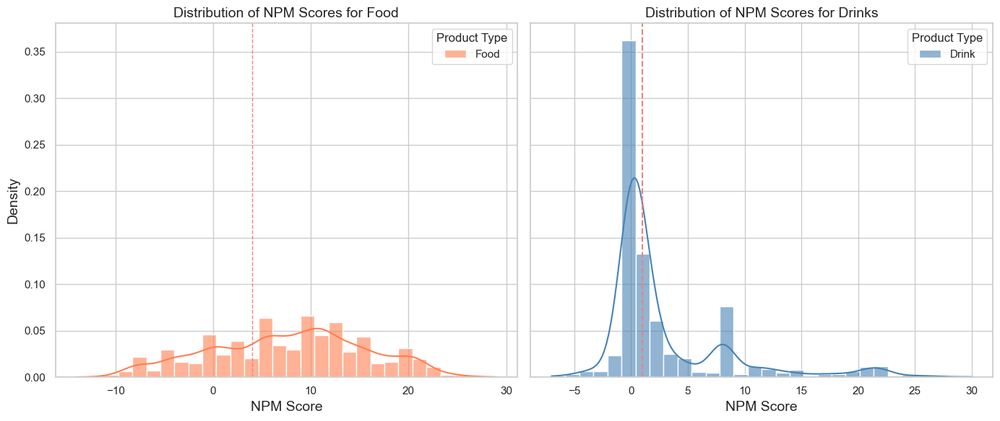

In [120]:
# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Set up the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Plot the distribution of NPM scores for food
sns.histplot(df_food['NPM_score'], bins=30, kde=True, color='#ff7f50', label='Food', stat='density', alpha=0.6, ax=axes[0])
axes[0].set_title('Distribution of NPM Scores for Food', fontsize=14)
axes[0].set_xlabel('NPM Score', fontsize=14)
axes[0].set_ylabel('Density', fontsize=14)
axes[0].legend(title='Product Type', title_fontsize='12', loc='upper right')
axes[0].grid(True)
axes[0].axvline(x=4, color='#f08080', linestyle='--', linewidth=1)

# Plot the distribution of NPM scores for drinks
sns.histplot(df_drink['NPM_score'], bins=30, kde=True, color='#4682b4', label='Drink', stat='density', alpha=0.6, ax=axes[1])
axes[1].set_title('Distribution of NPM Scores for Drinks', fontsize=14)
axes[1].set_xlabel('NPM Score', fontsize=14)
axes[1].legend(title='Product Type', title_fontsize='12', loc='upper right')
axes[1].grid(True)
axes[1].axvline(x=1, color='#f08080', linestyle='--', linewidth=1.5)

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

In [121]:
# Calculate mean and standard deviation for food and drink NPM scores
food_mean = df_food['NPM_score'].mean()
food_std = df_food['NPM_score'].std()

drink_mean = df_drink['NPM_score'].mean()
drink_std = df_drink['NPM_score'].std()

In [122]:
# Define a function to standardize NPM scores using Z-score method
def standardise_npm(row):
    if row['is_food'] == 1:
        return round((row['NPM_score'] - food_mean) / food_std, 3)  # For food items, use food mean and std
    else:
        return round((row['NPM_score'] - drink_mean) / drink_std, 3)  # For drink items, use drink mean and std

In [123]:
# Apply the function to create a new standardized NPM score column
df_product_stand['standardised_NPM'] = df_product_stand.apply(standardise_npm, axis=1)
df_product_stand[['is_food', 'is_healthy', 'NPM_score', 'standardised_NPM']].head(20)

,is_food,is_healthy,NPM_score,standardised_NPM
0,0,1.0,0.0,-0.529
1,1,0.0,16.0,1.049
2,1,1.0,2.0,-0.722
3,1,0.0,17.0,1.175
4,1,0.0,13.0,0.669
5,1,0.0,17.0,1.175
6,1,0.0,16.0,1.049
7,1,0.0,13.0,0.669
8,0,1.0,0.0,-0.529
9,0,1.0,0.0,-0.529


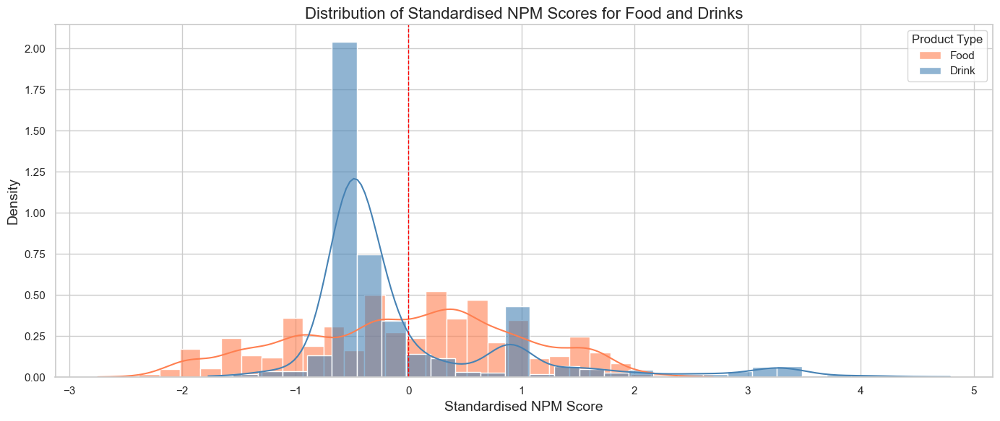

In [124]:
# Separate the food and drink data with standardized NPM scores
df_food = df_product_stand[df_product_stand['is_food'] == 1]
df_drink = df_product_stand[df_product_stand['is_food'] == 0]

# Set up the figure and axes
plt.figure(figsize=(14, 6))

# Plot the distribution of standardized NPM scores for food
sns.histplot(df_food['standardised_NPM'], bins=30, kde=True, color='#ff7f50', label='Food', stat='density', alpha=0.6)

# Plot the distribution of standardized NPM scores for drinks
sns.histplot(df_drink['standardised_NPM'], bins=30, kde=True, color='#4682b4', label='Drink', stat='density', alpha=0.6)

# Add titles and labels
plt.title('Distribution of Standardised NPM Scores for Food and Drinks', fontsize=16)
plt.xlabel('Standardised NPM Score', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend(title='Product Type', title_fontsize='12', loc='upper right')

# Draw vertical red line at x=0 to separate healthy and unhealthy
plt.axvline(x=0, color='red', linestyle='--', linewidth=1)

# Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()

In [125]:
df_product_stand.head(2)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,Chilled Cakes,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1,16.0,0.0,1.049


In [126]:
df_product_stand = df_product_stand[['prod_id', 'standardised_NPM']]
df_product_stand.head(3)

,prod_id,standardised_NPM
0,5344717,-0.529
1,5340295,1.049
2,4958368,-0.722


In [127]:
df_product_food_all_score = df_product_food_all_score.merge(df_product_stand, on='prod_id')
print(len(df_product_food_all_score))
df_product_food_all_score.head(1)

13748


,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529


In [128]:
df_product_food_all_score.to_csv(r'Results\Dataset\all_products_score.csv', index=False)

<br>

#### 7. Calculate the purchase summary of each product in the Morley Store
To analyse the sales performance of each product in the Morley store, the following steps will be executed:  
- __List Creation for Food and Drink Products__
- __Group and Analyse Customer Purchases__

- **List Creation for Food and Drink Products**  
  Generate a list of all product IDs that categorize as food and drink items. This list will serve as a reference for filtering the dataset.

In [129]:
df_all_product = pd.read_csv(r'Results\Dataset\all_products_score.csv')
print(len(df_all_product))
# Create a list of all food product prod_ids
food_drink_product_id = df_all_product['prod_id']

13748


In [130]:
# Filter the shopping product records to include only those that contain food products
df_basket_product_food_drink_Morley = df_basket_product_Morley[df_basket_product_Morley['prod_id'].isin(food_drink_product_id)]

In [131]:
print(len(df_basket_product_Morley))
print(len(df_basket_product_food_drink_Morley))
df_basket_product_food_drink_Morley.head(3)

7468072
4899712


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
4,202305224158314206827,4715670,1,2.50,0.00,NaN,2.50,0.000000
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave,2.46,0.098901
11,202305224158314204892,3383892,1,1.25,0.00,NaN,1.25,0.000000


- **Group and Analyze Customer Purchases**  
  Utilize the customer purchase dataset to aggregate data by product ID. This step involves grouping the data to extract insights into how each product is selling in the Morley store, focusing specifically on those items identified as food or drink.

In [132]:
# Group by prod_id and calculate the total sum and average values
product_purchase_summary = df_basket_product_food_drink_Morley.groupby('prod_id').agg(
    total_quantity=('unmeasured_qty', 'sum'),    # Sum the unmeasured_qty to get total purchase quantity
    purchase_occurrences=('prod_id', 'count'),   # Count the occurrences of prod_id to get the number of purchases
    avg_sale_amount=('sale_amt_inc_vat', 'mean'), # Calculate the mean of sale_amt_inc_vat to get the average sale amount
    avg_offer_discount=('offer_disc_inc_vat', 'mean'), # Calculate the mean of offer_disc_inc_vat to get the average offer discount
    avg_sale_price=('sale_price', 'mean'),      # Calculate the mean of sale_price to get the average sale price
    avg_dis_perc=('disc_perc', 'mean')
).reset_index()   

product_purchase_summary.head(3)

,prod_id,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,156,46,46,5.922826,0.0,5.922826,0.0
1,170,434,434,15.317880,0.0,15.317880,0.0
2,209,66,66,12.025758,0.0,12.025758,0.0


In [133]:
print(product_purchase_summary.isnull().sum())

prod_id                 0
total_quantity          0
purchase_occurrences    0
avg_sale_amount         0
avg_offer_discount      0
avg_sale_price          0
avg_dis_perc            0
dtype: int64


In [134]:
df_all_product.head(1)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529


In [135]:
df_product_final = df_all_product.merge(product_purchase_summary, on='prod_id', how='left')
df_product_final.head(3)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529,23.0,23.0,3.320435,0.0,3.320435,0.0
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,Chilled Cakes,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1,16.0,0.0,1.049,3.0,3.0,8.000000,0.0,8.000000,0.0
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,In-Store Bakery & Snacks,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",1,2.0,1.0,-0.722,48.0,48.0,1.161875,0.0,1.161875,0.0


In [136]:
# Check for missing values in the dataset
print(df_product_final.isnull().sum())

prod_id                    0
prod_disp_nm               0
brand_nm                 100
category                   0
nutrition_dict             0
nutrition_cate             0
is_food                    0
NPM_score                463
is_healthy               463
standardised_NPM         463
total_quantity          1118
purchase_occurrences    1118
avg_sale_amount         1118
avg_offer_discount      1118
avg_sale_price          1118
avg_dis_perc            1118
dtype: int64


#### 8. Save and Export the Product Dataset

In [137]:
df_product_final.to_csv(r'Results\Dataset\dataset1_product.csv', index=False)

***

<br><br><br>

***

###　The Basket Dataset_2: Part 2 of Data Cleaning

__1. Enhancing Basket Data with Product Information__  
  (Data Merging - Data Aggregation - Merge with Shopping Time)  
__2. Save and Export the Basket Dataset__

#### 1. Enhancing Basket Data with Product Information

To improve the basket dataset, we will add relevant product details from the product dataset. This will give a more complete view of each purchase at the Morley Store by including additional product attributes.
- __Data Merging__  
- __Data Aggregation__  
  a. Group by `basket_id`  
  b. Calculate Total Spend  
  c. Categorize Products
- __Merge with Shopping Time__

<br>

- __Data Merging__  
Combine the basket dataset with necessary columns from the product dataset using the appropriate identifiers. This step ensures that each entry in the basket dataset is supplemented with detailed product information such as product name, category, and nutritional scores.

In [138]:
# Morley basket dataset include only food and drink products
df_basket_product_food_drink_Morley.head(3)

,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
4,202305224158314206827,4715670,1,2.50,0.00,NaN,2.50,0.000000
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave,2.46,0.098901
11,202305224158314204892,3383892,1,1.25,0.00,NaN,1.25,0.000000


In [139]:
df_all_product = pd.read_csv(r'Results\Dataset\dataset1_product.csv')
df_all_product.head(3)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529,23.0,23.0,3.320435,0.0,3.320435,0.0
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,Chilled Cakes,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1,16.0,0.0,1.049,3.0,3.0,8.000000,0.0,8.000000,0.0
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,In-Store Bakery & Snacks,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",1,2.0,1.0,-0.722,48.0,48.0,1.161875,0.0,1.161875,0.0


In [140]:
df_product_npm = df_all_product[['prod_id', 'prod_disp_nm', 'category','is_food', 'NPM_score', 'is_healthy', 'standardised_NPM']]
df_product_npm.head(3)

,prod_id,prod_disp_nm,category,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Non-alcoholic Beverages,0,0.0,1.0,-0.529
1,5340295,True Colours Rainbow Party Traybake,Chilled Cakes,1,16.0,0.0,1.049
2,4958368,Olive Sourdough Bloomer,In-Store Bakery & Snacks,1,2.0,1.0,-0.722


In [141]:
df_basket_npm = df_basket_product_food_drink_Morley.merge(df_product_npm, on='prod_id')
print(len(df_basket_npm))
df_basket_npm.head(3)

4899712


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc,prod_disp_nm,category,is_food,NPM_score,is_healthy,standardised_NPM
0,202305224158314206827,4715670,1,2.5,0.0,NaN,2.5,0.0,2 Finger Milk Chocolate Biscuit Bars Bumper Mu...,Cookies & Biscuits,1,20.0,0.0,1.555
1,202305224158314203767,4715670,1,2.5,0.0,NaN,2.5,0.0,2 Finger Milk Chocolate Biscuit Bars Bumper Mu...,Cookies & Biscuits,1,20.0,0.0,1.555
2,202305224158314203981,4715670,1,2.5,0.0,NaN,2.5,0.0,2 Finger Milk Chocolate Biscuit Bars Bumper Mu...,Cookies & Biscuits,1,20.0,0.0,1.555


- __Data Aggregation__  
  a. Group by `basket_id`  
  b. Calculate Key Metrics for Each Basket  
  c. Categorise Products

__a. Group by `basket_id`__  
Aggregate the data by basket ID to summarize the purchases

In [142]:
# Start measuring time
start_time = time.time()

# Step 1: Group by and Aggregate
df_basket_summary = df_basket_npm.groupby('basket_id', as_index=False).agg(
    total_spend=('sale_amt_inc_vat', 'sum'),  # Sum of sales amount
    total_discounts=('offer_disc_inc_vat', 'sum'),  # Sum of offer discounts
    product_count=('prod_id', 'count'),  # Count of products in each basket
    has_linksave=('asda_promo_type', lambda x: 'Linksave' in x.values),  # Check for 'Linksave' promotion
    total_NPM_stand_score=('standardised_NPM', 'sum'),  # Total health score
    healthy_count=('is_healthy', lambda x: (x == 1).sum()),  # Count of healthy products
    unhealthy_count=('is_healthy', lambda x: (x == 0).sum()),  # Count of unhealthy products
    healthy_spend=('sale_amt_inc_vat', lambda x: x[df_basket_npm.loc[x.index, 'is_healthy'] == 1].sum()),  # Spend on healthy products
    unhealthy_spend=('sale_amt_inc_vat', lambda x: x[df_basket_npm.loc[x.index, 'is_healthy'] == 0].sum())  # Spend on unhealthy products
)

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

# Print the first 3 rows of the summary DataFrame
print(df_basket_summary.head(3))

# Save the summary DataFrame to a CSV file
df_basket_summary.to_csv(r'Results/Dataset/basket_summary.csv', index=False)

Execution time: 446.49 seconds
               basket_id  total_spend  total_discounts  product_count  \
0  202301014158300100008         3.30             0.00              2   
1  202301014158300100018         6.11            -1.31             12   
2  202301014158300100022         2.01            -0.24              3   

   has_linksave  total_NPM_stand_score  healthy_count  unhealthy_count  \
0         False                  0.184              0                2   
1          True                  0.049              0               12   
2          True                 -1.587              3                0   

   healthy_spend  unhealthy_spend  
0           0.00             3.30  
1           0.00             6.11  
2           2.01             0.00  


__b. Calculate Key Metrics for Each Basket__  
Evaluate important metrics to understand the expenditure patterns and healthiness of purchases within each basket:
  - Final Spend  
  - Discount Percentage  
  - Average NPM Score Per Product
  - Percentage of Healthy Products
  - Percentage of Healthy Spend
  - Healthiness Indicator

In [143]:
# df_basket = df_basket_summary.copy()
df_basket = pd.read_csv(r'Results\Dataset\basket_summary.csv')

In [144]:
# Final Spend
df_basket['sale_price'] = df_basket['total_spend'] + df_basket['total_discounts']
df_basket[['basket_id', 'total_spend', 'total_discounts', 'sale_price']].head()

,basket_id,total_spend,total_discounts,sale_price
0,202301014158300100008,3.30,0.00,3.30
1,202301014158300100018,6.11,-1.31,4.80
2,202301014158300100022,2.01,-0.24,1.77
3,202301014158300100023,7.00,0.00,7.00
4,202301014158300100024,13.43,-0.80,12.63


In [145]:
# Discount Percentage
df_basket['discount_%'] = df_basket['total_discounts'] / df_basket['total_spend']

# Average NPM Score Per Product
df_basket['NPM_per_prod'] = df_basket['total_NPM_stand_score'] / df_basket['product_count']

# Percentage of Healthy Products
df_basket['healthy_count_%'] = df_basket['healthy_count'] / df_basket['product_count']

# Percentage of Healthy Spend
df_basket['healthy_spend_%'] = df_basket['healthy_spend'] / df_basket['total_spend']

In [146]:
# Healthiness Indicator
# Add a new column 'is_healthy' using a conditional expression
df_basket['is_healthy'] = (df_basket['total_NPM_stand_score'] < 0).astype(int)
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,sale_price,discount_%,NPM_per_prod,healthy_count_%,healthy_spend_%,is_healthy
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,3.3,0.000000,0.092000,0.0,0.0,0
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,4.8,-0.214403,0.004083,0.0,0.0,0


__c. Categorise Products__  
Create separate columns in the dataset for each product category.

In [147]:
# Start measuring time
start_time = time.time()

# Generate Category Counts
category_counts = pd.crosstab(df_basket_npm['basket_id'], df_basket_npm['category']).reset_index()

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 69.40 seconds


In [148]:
# Merge Aggregated Data with Category Counts
df_basket = df_basket.merge(category_counts, on='basket_id')

print(len(df_basket))
# Display the first few rows of the final DataFrame
df_basket.head()

372967


,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,In-Store Bakery & Snacks,In-Store Meat & Poultry,Non-alcoholic Beverages,Pre-Packaged Cheeses,Pre-Packaged Cooked Meats,Pre-Packaged Pies,Ready-to-Eat Meals,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.00,3.30,...,0,0,0,0,0,0,0,0,0,0
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.00,6.11,...,0,0,0,0,0,7,0,0,0,0
2,202301014158300100022,2.01,-0.24,3,True,-1.587,3,0,2.01,0.00,...,0,0,3,0,0,0,0,0,0,0
3,202301014158300100023,7.00,0.00,4,True,-1.261,3,1,4.80,2.20,...,0,0,0,0,0,0,0,0,0,0
4,202301014158300100024,13.43,-0.80,12,True,-10.957,8,4,8.21,5.22,...,0,0,0,2,2,0,0,0,1,0


- __Merge with Shopping Time__  

In [149]:
df_customer_basket_Morley.head(3)

,store_name,visit_ts,basket_id,channel_desc,customer_id,year,month,week,day_of_week,date,hour
0,Morley,2023-05-13 11:55:00+00:00,202305134158313302292,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,2023,5,19,5,2023-05-13,11
1,Morley,2023-05-16 16:29:00+00:00,202305164158313604145,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,2023,5,20,1,2023-05-16,16
2,Morley,2023-05-04 13:30:00+00:00,202305044158312403125,In-store (exc S&G),00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,2023,5,18,3,2023-05-04,13


In [150]:
df_shopping_time = df_customer_basket_Morley[['basket_id', 'visit_ts', 'customer_id', 'month',
                                              'week', 'day_of_week', 'date', 'hour']]
df_shopping_time.head()

,basket_id,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202305134158313302292,2023-05-13 11:55:00+00:00,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,5,19,5,2023-05-13,11
1,202305164158313604145,2023-05-16 16:29:00+00:00,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,5,20,1,2023-05-16,16
2,202305044158312403125,2023-05-04 13:30:00+00:00,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,5,18,3,2023-05-04,13
3,202305094158312905550,2023-05-09 19:24:00+00:00,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,5,19,1,2023-05-09,19
40,202304044158309403172,2023-04-04 14:39:00+00:00,00038e5e-5784-41bf-9c15-c411af57b82f,4,14,1,2023-04-04,14


In [151]:
# Merge with Shopping time
df_basket = df_basket.merge(df_shopping_time, on='basket_id')
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


#### 2. Save and Export the Basket Dataset

In [152]:
df_basket.to_csv(r'Results\Dataset\dataset2_basket.csv', index=False)

***

<br><br>

***

### The Customer Dataset

To provide a comprehensive analysis of customer behaviors, four specific datasets are created:

**1. Extract Customers Who Purchase Food/Drink in Morley**  
  - Dataset: `df_customer_Morley`  
    This dataset includes customer IDs of those who shop in the Morley store and purchase food or drink products.  

**2. Calculate Visiting Frequency**  
  - Dataset: `df_customer_frequency`
    This dataset captures the frequency of visits by each customer to the Morley store, providing insights into customer loyalty and shopping habits.  

**3. Aggregate Basket Data for Monthly Customer Purchase Summaries**
  - Dataset: `df_customer_monthly`
    This dataset aggregates basket data to summarise monthly purchases for each customer, offering a view into monthly spending and shopping patterns.  

**Subsequent Steps for Geographical Analysis**:  
Due to a substantial number of customer records lacking postcode information, specific measures have been implemented to create a dataset tailored for geographical analysis. This approach ensures that broader data analyses remain accurate by utilizing a complete dataset. For geographical insights, a filtered subset of customers will be used, based on select criteria to effectively address the gaps in postcode information.  

**4. Consolidating Customer Postcodes**  
  - Dataset: `df_customer_postcode`
    This step involves refining customer records to ensure each customer is associated with a single, primary postcode.  

**5. Filter Postcodes with Sufficient Transactions and Customers**  
  Retain only those postcode districts that have a robust number of transactions and customers.  
  
**6. Create a Customer Dataset for Targeted Postcode Areas**
  - Dataset: `df_customer_postcode_target`
    Develop a focused dataset that includes only customers from postcode districts identified as having sufficient data.

#### 1. Extract Customers Who Purchase Food/Drink in Morley
Identify and extract records of customers who have shopped in the Morley store and specifically purchased food or drink products. This step focuses on filtering the dataset to only include relevant customer activities.

In [153]:
df_basket = pd.read_csv(r'Results\Dataset\dataset2_basket.csv')
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


In [154]:
df_basket.columns

Index(['basket_id', 'total_spend', 'total_discounts', 'product_count',
       'has_linksave', 'total_NPM_stand_score', 'healthy_count',
       'unhealthy_count', 'healthy_spend', 'unhealthy_spend', 'sale_price',
       'discount_%', 'NPM_per_prod', 'healthy_count_%', 'healthy_spend_%',
       'is_healthy', 'Assorted Snacks', 'Baking Supplies & Desserts',
       'Beers & Ales', 'Beverages & Sweeteners', 'Breakfast Cereals',
       'Brought-In Bacon & Sausages', 'Brought-In Fish',
       'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
       'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
       'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
       'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
       'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
       'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
       'Non-alcoholic Beverages', 'Pre-Packaged Cheeses',
       'Pre-Packaged Cooked Meats', '

In [155]:
# Extract unique customer IDs from df_basket to create a new DataFrame
df_customer_Morley = pd.DataFrame(df_basket['customer_id'].unique(), columns=['customer_id'])
print(len(df_customer_Morley))
df_customer_Morley.head()

26621


,customer_id
0,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b
1,352c54c7-8987-49a3-af37-f9f97a4680f0
2,b01f9f6c-06da-43f1-9abb-603fd8d262fd
3,13df8cbc-f95b-4741-a84f-752f6db3ffdd
4,4ce086da-a8d0-4993-a937-1dc7d5ec991a


#### 2. Calculate Visiting Frequency
Determine the frequency of visits for each customer to gauge how often they shop at the Morley store. This analysis aids in assessing customer loyalty and identifying shopping patterns.
- __Total Basket Count Per Customer__
- __Weekly Average Baskets__
- __Monthly Average Baskets__
- __Create the Final Frequency Dataset__

- __Total Basket Count Per Customer__  
  Calculate both the total and the average number of baskets per customer throughout the dataset's duration. This metric quantifies individual customer activity and offers insights into whether customers are one-time shoppers or consistently visit the store.

In [156]:
# Understanding the span of weeks covered by the data
df_basket['week'].describe()

count    372967.000000
mean         11.534447
std           6.471460
min           1.000000
25%           6.000000
50%          12.000000
75%          17.000000
max          52.000000
Name: week, dtype: float64

Max week is 52 which seems unusual; check the data for potential anomalies or data entry errors

In [157]:
# Filter the DataFrame to get data for week 52
week_52_data = df_basket[df_basket['week'] == 52]

# Display the data for week 52
week_52_data.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


Week 52 is the last week of the year; January 1 may be categorized as week 52 due to how weeks are numbered.

In [158]:
# Calculate the number of unique weeks in the dataset
num_weeks = df_basket['week'].nunique()

# Display the result
print(f"The dataset contains {num_weeks} unique weeks.")

The dataset contains 23 unique weeks.


In [159]:
df_basket['customer_id'].nunique()

26621

In [160]:
# Group by 'customer_id' and count the number of unique baskets per customer
customer_total_baskets = df_basket.groupby('customer_id')['basket_id'].nunique().reset_index()

# Rename columns for better understanding
customer_total_baskets.rename(columns={'basket_id': 'total_baskets_count'}, inplace=True)

# Display the results
customer_total_baskets.head()

,customer_id,total_baskets_count
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4
1,00038e5e-5784-41bf-9c15-c411af57b82f,2
2,000990fa-5578-4c00-8146-767117716477,2
3,000ba767-5074-49ba-aba1-989ad3c47a9e,6
4,000c6b12-334d-425b-bb9c-57bae1f72ccd,9


In [161]:
customer_total_baskets['actual_weekly_basket'] = customer_total_baskets['total_baskets_count']/23

In [162]:
customer_total_baskets.head()

,customer_id,total_baskets_count,actual_weekly_basket
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4,0.173913
1,00038e5e-5784-41bf-9c15-c411af57b82f,2,0.086957
2,000990fa-5578-4c00-8146-767117716477,2,0.086957
3,000ba767-5074-49ba-aba1-989ad3c47a9e,6,0.260870
4,000c6b12-334d-425b-bb9c-57bae1f72ccd,9,0.391304


In [163]:
customer_total_baskets['total_baskets_count'].describe()

count    26621.000000
mean        14.010255
std         17.207238
min          1.000000
25%          3.000000
50%          8.000000
75%         19.000000
max        297.000000
Name: total_baskets_count, dtype: float64

In [164]:
customer_total_baskets['actual_weekly_basket'].describe()

count    26621.000000
mean         0.609142
std          0.748141
min          0.043478
25%          0.130435
50%          0.347826
75%          0.826087
max         12.913043
Name: actual_weekly_basket, dtype: float64

In [165]:
# Calculate the value counts of 'total_baskets_count' and sort them in descending order.
customer_total_basket_counts = customer_total_baskets['total_baskets_count'].value_counts().sort_values(ascending=False)
customer_total_basket_counts

total_baskets_count
3      3079
4      2171
2      2141
5      1667
1      1579
       ... 
110       1
192       1
173       1
186       1
132       1
Name: count, Length: 161, dtype: int64

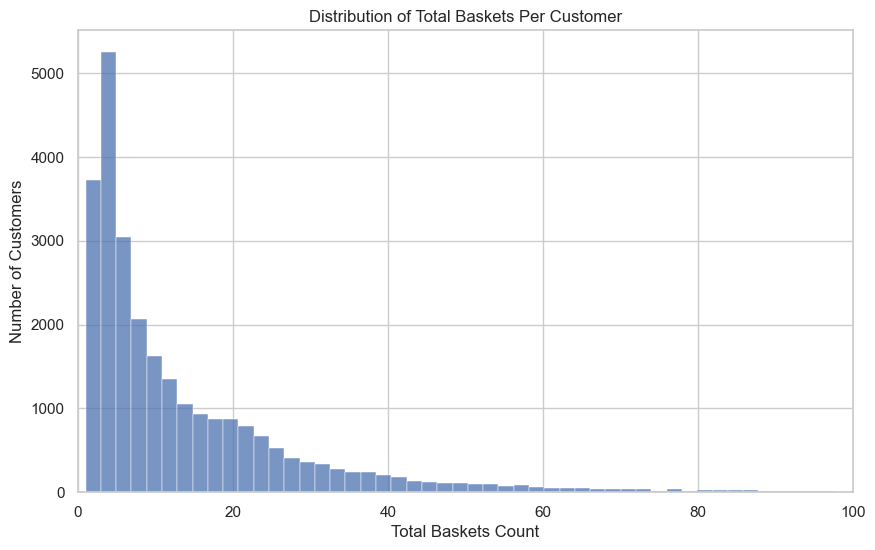

In [166]:
# Set the style for the plots
sns.set(style="whitegrid")

# Create a histogram of the total baskets per customer
plt.figure(figsize=(10, 6))
sns.histplot(customer_total_baskets['total_baskets_count'], bins=150, kde=False)
plt.title('Distribution of Total Baskets Per Customer')
plt.xlabel('Total Baskets Count')
plt.ylabel('Number of Customers')
plt.xlim(0, 100)
plt.grid(True)

# Display the plot
plt.show()

- __Weekly Average Baskets__  
Calculate the average number of baskets per customer each week to assess the consistency and regularity of their shopping visits.

In [167]:
# Calculate total baskets per customer per month
monthly_baskets = df_basket.groupby(['customer_id', 'month']).size().reset_index(name='total_baskets_month')

# Calculate monthly average baskets per customer
monthly_avg_baskets = monthly_baskets.groupby('customer_id')['total_baskets_month'].mean().reset_index()
monthly_avg_baskets.rename(columns={'total_baskets_month': 'avg_baskets_per_month'}, inplace=True)

- __Monthly Average Baskets__  
Calculate the monthly average number of baskets per customer to gain insights into their shopping trends and loyalty over extended periods.

In [168]:
# Calculate total baskets per customer per week
weekly_baskets = df_basket.groupby(['customer_id', 'week']).size().reset_index(name='total_baskets_week')

# Calculate weekly average baskets per customer
weekly_avg_baskets = weekly_baskets.groupby('customer_id')['total_baskets_week'].mean().reset_index()
weekly_avg_baskets.rename(columns={'total_baskets_week': 'avg_baskets_per_week'}, inplace=True)

In [169]:
# Merge the results on 'customer_id'
df_average_baskets = pd.merge(weekly_avg_baskets, monthly_avg_baskets, on='customer_id')

In [170]:
df_average_baskets = df_average_baskets[['customer_id', 'avg_baskets_per_week', 'avg_baskets_per_month']]
df_average_baskets.head()

,customer_id,avg_baskets_per_week,avg_baskets_per_month
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,1.333333,4.0
1,00038e5e-5784-41bf-9c15-c411af57b82f,1.000000,1.0
2,000990fa-5578-4c00-8146-767117716477,1.000000,1.0
3,000ba767-5074-49ba-aba1-989ad3c47a9e,1.200000,1.5
4,000c6b12-334d-425b-bb9c-57bae1f72ccd,1.500000,3.0


- __Create the Final Frequency Dataset__

In [171]:
df_customer_frequency = df_average_baskets.merge(customer_total_baskets, on='customer_id')
df_customer_frequency.head(3)

,customer_id,avg_baskets_per_week,avg_baskets_per_month,total_baskets_count,actual_weekly_basket
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,1.333333,4.0,4,0.173913
1,00038e5e-5784-41bf-9c15-c411af57b82f,1.000000,1.0,2,0.086957
2,000990fa-5578-4c00-8146-767117716477,1.000000,1.0,2,0.086957


<br>

#### 3. Aggregate Basket Data for Monthly Customer Purchase Summaries
Dataset: `df_customer_monthly`  
This dataset aggregates basket data to summarise monthly purchases for each customer, offering a view into monthly spending and shopping patterns.  

In [172]:
# Group by 'customer_id' and 'month' and aggregate various metrics
df_customer_months = df_basket.groupby(['customer_id', 'month']).agg({
    'basket_id': 'nunique',  # Number of unique baskets per month
    'sale_price': ['sum', 'mean'],  # Total monthly expenditure per customer and average expenditure per basket
    'total_NPM_stand_score': ['sum', 'mean'],  # Sum and mean of NPM standard scores per month
    'product_count': ['sum', 'mean'],  # Total and average number of products purchased per month
    'healthy_count': ['sum', 'mean'],  # Total and average number of healthy products purchased per month
    'unhealthy_count': ['sum', 'mean'],  # Total and average number of unhealthy products purchased per month
    'healthy_count_%': 'mean',  # Average percentage of healthy products per basket
    
    'healthy_spend': ['sum', 'mean'],  # Total and average expenditure on healthy products per month
    'unhealthy_spend': ['sum', 'mean'],  # Total and average expenditure on unhealthy products per month
    'healthy_spend_%': 'mean',  # Average percentage of expenditure on healthy products per basket
    
    'discount_%': 'mean',  # Average discount percentage per month
    'is_healthy': 'sum',  # Number of healthy baskets per month
}).reset_index()

In [173]:
# Flatten the MultiIndex for columns
df_customer_months.columns = ['_'.join(col).rstrip('_') if type(col) is tuple else col for col in df_customer_months.columns]

In [174]:
# Rename the columns for better readability
df_customer_months.rename(columns={
    'basket_id_nunique': 'baskets_count',
    'sale_price_sum': 'total_spent',
    'sale_price_mean': 'avg_spent_per_basket',
    'total_NPM_stand_score_sum': 'NPM_score_total',
    'total_NPM_stand_score_mean': 'NPM_score_per_basket',
    'product_count_sum': 'total_products_count',
    'product_count_mean': 'avg_products_per_basket',
    'healthy_count_sum': 'total_healthy_products_count',
    'healthy_count_mean': 'avg_healthy_products_per_basket',
    'unhealthy_count_sum': 'total_unhealthy_products_count',
    'unhealthy_count_mean': 'avg_unhealthy_products_per_basket',
    'healthy_spend_sum': 'total_spent_on_healthy',
    'healthy_spend_mean': 'avg_spent_on_healthy_per_basket',
    'unhealthy_spend_sum': 'total_spent_on_unhealthy',
    'unhealthy_spend_mean': 'avg_spent_on_unhealthy_per_basket',
    'healthy_count_%_mean': 'avg_healthy_product_pct',
    'healthy_spend_%_mean': 'avg_healthy_spend_pct',
    'discount_%_mean': 'avg_discount_rate',
    'is_healthy_sum': 'number_of_healthy_baskets'
}, inplace=True)

In [175]:
df_customer_months.columns

Index(['customer_id', 'month', 'baskets_count', 'total_spent',
       'avg_spent_per_basket', 'NPM_score_total', 'NPM_score_per_basket',
       'total_products_count', 'avg_products_per_basket',
       'total_healthy_products_count', 'avg_healthy_products_per_basket',
       'total_unhealthy_products_count', 'avg_unhealthy_products_per_basket',
       'avg_healthy_product_pct', 'total_spent_on_healthy',
       'avg_spent_on_healthy_per_basket', 'total_spent_on_unhealthy',
       'avg_spent_on_unhealthy_per_basket', 'avg_healthy_spend_pct',
       'avg_discount_rate', 'number_of_healthy_baskets'],
      dtype='object')

In [176]:
# Display the resulting DataFrame
df_customer_months.head(2)

,customer_id,month,baskets_count,total_spent,avg_spent_per_basket,NPM_score_total,NPM_score_per_basket,total_products_count,avg_products_per_basket,total_healthy_products_count,...,total_unhealthy_products_count,avg_unhealthy_products_per_basket,avg_healthy_product_pct,total_spent_on_healthy,avg_spent_on_healthy_per_basket,total_spent_on_unhealthy,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,number_of_healthy_baskets
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,5,4,64.93,16.2325,-19.005,-4.75125,47,11.75,27,...,20,5.0,0.546465,36.54,9.135,33.59,8.3975,0.495473,-0.095164,3
1,00038e5e-5784-41bf-9c15-c411af57b82f,3,1,3.40,3.4000,-4.103,-4.10300,5,5.00,3,...,2,2.0,0.600000,3.00,3.000,1.00,1.0000,0.750000,-0.150000,1


In [177]:
# Group by customer_id and calculate sums for necessary fields and averages where specified
df_customer_monthly = df_customer_months.groupby('customer_id').agg({
    'baskets_count': 'sum',
    'total_spent': 'sum',
    'avg_spent_per_basket': 'mean',
    'NPM_score_total': 'sum',
    'NPM_score_per_basket': 'mean',
    'total_products_count': 'sum',
    'avg_products_per_basket': 'mean',
    'total_healthy_products_count': 'sum',
    'avg_healthy_products_per_basket': 'mean',
    'total_unhealthy_products_count': 'sum',
    'avg_unhealthy_products_per_basket': 'mean',
    'avg_healthy_product_pct': 'mean',
    'total_spent_on_healthy': 'sum',
    'avg_spent_on_healthy_per_basket': 'mean',
    'total_spent_on_unhealthy': 'sum',
    'avg_spent_on_unhealthy_per_basket': 'mean',
    'avg_healthy_spend_pct': 'mean',
    'avg_discount_rate': 'mean',
    'number_of_healthy_baskets': 'sum',
})

In [178]:
df_customer_months.columns

Index(['customer_id', 'month', 'baskets_count', 'total_spent',
       'avg_spent_per_basket', 'NPM_score_total', 'NPM_score_per_basket',
       'total_products_count', 'avg_products_per_basket',
       'total_healthy_products_count', 'avg_healthy_products_per_basket',
       'total_unhealthy_products_count', 'avg_unhealthy_products_per_basket',
       'avg_healthy_product_pct', 'total_spent_on_healthy',
       'avg_spent_on_healthy_per_basket', 'total_spent_on_unhealthy',
       'avg_spent_on_unhealthy_per_basket', 'avg_healthy_spend_pct',
       'avg_discount_rate', 'number_of_healthy_baskets'],
      dtype='object')

In [179]:
df_customer_monthly.head(2)

,baskets_count,total_spent,avg_spent_per_basket,NPM_score_total,NPM_score_per_basket,total_products_count,avg_products_per_basket,total_healthy_products_count,avg_healthy_products_per_basket,total_unhealthy_products_count,avg_unhealthy_products_per_basket,avg_healthy_product_pct,total_spent_on_healthy,avg_spent_on_healthy_per_basket,total_spent_on_unhealthy,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,number_of_healthy_baskets
customer_id,,,,,,,,,,,,,,,,,,,
00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4,64.93,16.2325,-19.005,-4.75125,47,11.75,27,6.75,20,5.0,0.546465,36.54,9.135,33.59,8.3975,0.495473,-0.095164,3
00038e5e-5784-41bf-9c15-c411af57b82f,2,5.75,2.8750,-3.017,-1.50850,7,3.50,3,1.50,4,2.0,0.300000,3.00,1.500,3.35,1.6750,0.375000,-0.075000,1


In [180]:
# Calculate the number of unique months each customer has data for
group_sizes = df_customer_months.groupby('customer_id')['month'].nunique()

In [181]:
# Calculate monthly averages or totals divided by the number of months
for column in ['baskets_count', 'total_spent', 'NPM_score_total', 'total_products_count', 
               'total_healthy_products_count', 'total_unhealthy_products_count', 
               'total_spent_on_healthy', 'total_spent_on_unhealthy', 'number_of_healthy_baskets']:
    df_customer_monthly[column] /= group_sizes

# Rename the columns to reflect that they are averages or total per month
df_customer_monthly.rename(columns={
    'baskets_count': 'avg_baskets_count_per_month',
    'total_spent': 'avg_total_spent_per_month',
    'NPM_score_total': 'avg_NPM_score_total_per_month',
    'total_products_count': 'avg_total_products_count_per_month',
    'total_healthy_products_count': 'avg_total_healthy_products_count_per_month',
    'total_unhealthy_products_count': 'avg_total_unhealthy_products_count_per_month',
    'total_spent_on_healthy': 'avg_total_spent_on_healthy_per_month',
    'total_spent_on_unhealthy': 'avg_total_spent_on_unhealthy_per_month',
    'number_of_healthy_baskets': 'avg_number_of_healthy_baskets_per_month'
}, inplace=True)

In [182]:
df_customer_monthly.head(3)

,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,avg_total_unhealthy_products_count_per_month,avg_unhealthy_products_per_basket,avg_healthy_product_pct,avg_total_spent_on_healthy_per_month,avg_spent_on_healthy_per_basket,avg_total_spent_on_unhealthy_per_month,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,avg_number_of_healthy_baskets_per_month
customer_id,,,,,,,,,,,,,,,,,,,
00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4.0,64.930,16.2325,-19.0050,-4.75125,47.0,11.75,27.0,6.75,20.0,5.0,0.546465,36.54,9.135,33.590,8.3975,0.495473,-0.095164,3.0
00038e5e-5784-41bf-9c15-c411af57b82f,1.0,2.875,2.8750,-1.5085,-1.50850,3.5,3.50,1.5,1.50,2.0,2.0,0.300000,1.50,1.500,1.675,1.6750,0.375000,-0.075000,0.5
000990fa-5578-4c00-8146-767117716477,1.0,19.535,19.5350,-10.7495,-10.74950,12.0,12.00,9.5,9.50,2.5,2.5,0.810924,13.75,13.750,6.240,6.2400,0.703405,-0.026285,1.0


In [183]:
# Reset the index of the DataFrame to turn 'customer_id' back into a column
df_customer_monthly.reset_index(inplace=True)

In [184]:
df_customer_monthly.head(3)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,avg_total_unhealthy_products_count_per_month,avg_unhealthy_products_per_basket,avg_healthy_product_pct,avg_total_spent_on_healthy_per_month,avg_spent_on_healthy_per_basket,avg_total_spent_on_unhealthy_per_month,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,avg_number_of_healthy_baskets_per_month
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4.0,64.930,16.2325,-19.0050,-4.75125,47.0,11.75,27.0,6.75,20.0,5.0,0.546465,36.54,9.135,33.590,8.3975,0.495473,-0.095164,3.0
1,00038e5e-5784-41bf-9c15-c411af57b82f,1.0,2.875,2.8750,-1.5085,-1.50850,3.5,3.50,1.5,1.50,2.0,2.0,0.300000,1.50,1.500,1.675,1.6750,0.375000,-0.075000,0.5
2,000990fa-5578-4c00-8146-767117716477,1.0,19.535,19.5350,-10.7495,-10.74950,12.0,12.00,9.5,9.50,2.5,2.5,0.810924,13.75,13.750,6.240,6.2400,0.703405,-0.026285,1.0


In [185]:
# Check for duplicated values in the 'customer_id' column
duplicates = df_customer_monthly['customer_id'].duplicated()

# Print out the customer IDs that are duplicated
print(df_customer_monthly[duplicates]['customer_id'])

Series([], Name: customer_id, dtype: object)


In [186]:
df_customer_monthly.to_csv('Results\Dataset\df_customer_monthly.csv', index=False)

<br>

#### 4. Consolidating Customer Postcodes
Merge the customer data with the postcode dataset to analyse the geographical distribution of customers by postcode district. This step enhances the customer dataset with detailed location insights.
- __Merge with postcode dataset__
- __Ensure Unique Customer IDs with Appropriate Postcodes__  
  a. Filter Out Specific Postcodes  
  b. Prioritize Postcodes  
  c. Ensure Unique Postcode Per Customer  

In [187]:
df_customer = pd.DataFrame(df_basket['customer_id']).drop_duplicates().reset_index(drop=True)
df_customer.head()

,customer_id
0,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b
1,352c54c7-8987-49a3-af37-f9f97a4680f0
2,b01f9f6c-06da-43f1-9abb-603fd8d262fd
3,13df8cbc-f95b-4741-a84f-752f6db3ffdd
4,4ce086da-a8d0-4993-a937-1dc7d5ec991a


In [188]:
print(len(df_customer))
df_customer.head(2)

26621


,customer_id
0,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b
1,352c54c7-8987-49a3-af37-f9f97a4680f0


- __Merge with postcode dataset__

In [189]:
df_customer = df_customer.merge(df_customer_postcode, on='customer_id')
print(len(df_customer))
df_customer.head()

48446


,customer_id,pc_first_part
0,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,LS27
1,352c54c7-8987-49a3-af37-f9f97a4680f0,WF17
2,b01f9f6c-06da-43f1-9abb-603fd8d262fd,SE17
3,b01f9f6c-06da-43f1-9abb-603fd8d262fd,GU11
4,b01f9f6c-06da-43f1-9abb-603fd8d262fd,WF17


In [190]:
df_customer.to_csv('Results\Dataset\customer_with_postcode.csv', index=False)

The number of entries in the dataset increased after merging with the postcode data, suggesting that some customers may be associated with more than one postcode.

In [191]:
# Sort by 'customer_id' in ascending order
df_customer = df_customer.sort_values(by='customer_id', ascending=True)
# Find duplicates based on 'customer_id'
duplicate_rows = df_customer[df_customer.duplicated('customer_id', keep=False)]
duplicate_rows

,customer_id,pc_first_part
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12
4801,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,BL4
4802,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,DD7
4803,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,NaN
4804,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,CB2
...,...,...
48009,ffad96b6-3906-4e3c-809f-94ae942877f5,SN12
48010,ffad96b6-3906-4e3c-809f-94ae942877f5,CF41
48007,ffad96b6-3906-4e3c-809f-94ae942877f5,NaN
36453,ffd16948-0166-45ad-aeb1-a5a6c0425c0a,NaN


From the results, it is observed that the customer with ID `000fccf4-a7f5-4bbe-8e98-e9a586519dcb` is linked to multiple postcodes: "LS12", "BL4", "DD7", and "CB2". This dataset includes all ASDA shoppers, not just those from Morley. The presence of several postcodes for one customer may suggest residential moves. The next steps will aim to identify the most likely postcode that accurately reflects the customer's primary shopping location in the Morley store.

In [192]:
df_customer['pc_first_part'].value_counts()

pc_first_part
LS27    4273
WF17    2251
WF3     2071
BD11    1091
LS10     783
        ... 
IG1        1
TN9        1
LL20       1
PH21       1
M20        1
Name: count, Length: 2161, dtype: int64

- __Ensure Unique Customer IDs with Appropriate Postcodes__
  Given that the ASDA Morley store is located in postcode district LS27, it is unlikely for customers with distant postcodes to be frequent shoppers. Therefore, priority is given to customers with postcodes near LS27.

  Steps for Managing Postcodes:  
  **a. Drop Entries Lacking a Postcode**  
  **b. Filter Out Specific Postcodes**  
  **c. Ensure Unique Postcode Per Customer**
    - Refine Based on Proximity
    - Random Selection for Non-Priority Postcodesmer

__a. Drop Entries Lacking a Postcode__  
Remove any entries from the dataset where the postcode is missing.

In [193]:
print(len(df_customer))
# Drop rows where the customer_id does not have an associated postcode
df_customer = df_customer.dropna(subset=['pc_first_part'])
print(len(df_customer))

48446
38083


__b. Filter Out Specific Postcodes__  
Remove customers whose postcodes do not start with `LS`, `BD`, or `WF`. These prefixes represent Leeds, Bradford, and Wakefield, respectively, and are geographically closest to the Morley store. This filtering ensures that we focus on the most likely customer base.

In [194]:
# Adjusting the DataFrame filter to precisely match specified postal codes
df_customer_prefix = df_customer[df_customer['pc_first_part'].str.match(r'^(LS|BD|WF)\d', na=False)]
# Printing the number of unique customer IDs after the more precise filter
print("Number of customer has only one postcode:", len(df_customer_prefix['customer_id'].unique()))

df_customer_prefix

Number of customer has only one postcode: 16553


,customer_id,pc_first_part
41776,00038e5e-5784-41bf-9c15-c411af57b82f,WF15
39316,000ba767-5074-49ba-aba1-989ad3c47a9e,WF17
20646,000c6b12-334d-425b-bb9c-57bae1f72ccd,LS27
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12
4805,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,BD12
...,...,...
17424,ffef90ba-1329-4690-9503-22ab6ac4c61b,WF3
20419,ffeffd42-ca9a-43f4-9a2e-a46f68dda3bf,WF5
35782,fff83b6e-d307-485e-83d4-dc59f8ec671f,BD19
28634,fff93550-0500-4008-a54e-e163664f8d19,WF13


In [195]:
# Checking for duplicated customer IDs
duplicates = df_customer_prefix['customer_id'].duplicated(keep=False)

# Filter to keep only rows where 'customer_id' has a unique postcode
df_customer_unique_postcode = df_customer_prefix[~duplicates]
df_customer_unique_postcode.describe()

,customer_id,pc_first_part
count,15805,15805
unique,15805,71
top,00038e5e-5784-41bf-9c15-c411af57b82f,LS27
freq,1,4050


In [196]:
# Displaying all records where customer_id is duplicated
df_customer_duplicates = df_customer_prefix[duplicates]
print("Number of customer IDs with duplicates:", len(df_customer_duplicates['customer_id'].unique()))
df_customer_duplicates

Number of customer IDs with duplicates: 748


,customer_id,pc_first_part
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12
4805,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,BD12
28753,00196c7c-3ad0-4ced-907b-e98ee11957cd,WF12
28752,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10
22834,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS7
...,...,...
42071,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,LS27
42072,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,WF9
42075,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,WF5
3269,ffa44f67-e9cd-4478-b9b0-82038e334b7a,WF3


In [197]:
# df_customer_duplicates.to_csv('Results\Dataset\customer_id_duplicate.csv', index=False)

__c. Ensure Unique Postcode Per Customer__  
  - Refine Based on Proximity
  - Random Selection for Non-Priority Postcodes

__Refine Based on Proximity__

In [198]:
# Create priority mapping
priority_mapping = {
    'LS27': 1,
    'LS10': 2, 'LS11': 2, 'LS12': 2, 'LS28': 2, 'WF3': 2, 'WF17': 2, 'BD4': 2, 'BD11': 2,
    'LS13': 3, 'LS4': 3, 'LS3': 3, 'LS1': 3, 'LS98': 3, 'LS99': 3, 'WF2': 3, 'WF5': 3, 'WF12': 3,
    'WF13': 3, 'WF16': 3, 'BD19': 3, 'BD12': 3, 'BD5': 3, 'BD99': 3, 'BD3': 3}

In [199]:
df_customer_duplicates = df_customer_duplicates.copy()

# Assign priority values based on the priority mapping
df_customer_duplicates.loc[:, 'priority'] = df_customer_duplicates['pc_first_part'].map(priority_mapping).fillna(999)

df_customer_duplicates.head(3)

,customer_id,pc_first_part,priority
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12,2.0
4805,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,BD12,3.0
28753,00196c7c-3ad0-4ced-907b-e98ee11957cd,WF12,3.0


__Random Selection for Non-Priority Postcodes__

In [200]:
# Add a random column for random sorting within the same priority
df_customer_duplicates.loc[:, 'random'] = np.random.rand(len(df_customer_duplicates))

# Sort by customer_id, priority (lowest number is highest priority), and the random column
df_customer_duplicates.sort_values(by=['customer_id', 'priority', 'random'], inplace=True)

# Display the DataFrame
df_customer_duplicates

,customer_id,pc_first_part,priority,random
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12,2.0,0.676406
4805,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,BD12,3.0,0.121833
28752,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10,2.0,0.085957
28753,00196c7c-3ad0-4ced-907b-e98ee11957cd,WF12,3.0,0.302116
22848,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12,2.0,0.796406
...,...,...,...,...
42071,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,LS27,1.0,0.395789
42075,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,WF5,3.0,0.442704
42072,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,WF9,999.0,0.201007
3269,ffa44f67-e9cd-4478-b9b0-82038e334b7a,WF3,2.0,0.529389


In [201]:
# Drop duplicates to keep only the highest priority postcode for each customer
df_customer_duplicates_filter = df_customer_duplicates.drop_duplicates(subset='customer_id', keep='first')

# Display the resulting DataFrame
print(df_customer_duplicates_filter['customer_id'].nunique())
df_customer_duplicates_filter

748


,customer_id,pc_first_part,priority,random
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12,2.0,0.676406
28752,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10,2.0,0.085957
22848,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12,2.0,0.796406
36650,01c7c60e-0da8-4c9e-861f-07445db37087,BD12,3.0,0.623665
17692,01db5794-ac48-4f9d-8faa-6d17eb74392a,WF10,999.0,0.162304
...,...,...,...,...
22037,fdd27b8b-dc62-4f7a-85e5-72bc55a8065d,LS13,3.0,0.307846
48137,fe138139-b667-41f1-92f4-6c055f0747f0,LS12,2.0,0.602528
20576,ff6ff5d4-0ad4-4509-9e47-d8c505fb7ef6,LS12,2.0,0.197138
42071,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,LS27,1.0,0.395789


In [202]:
df_customer_postcodes = df_customer_duplicates_filter[['customer_id', 'pc_first_part']]
df_customer_postcodes

,customer_id,pc_first_part
4800,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12
28752,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10
22848,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12
36650,01c7c60e-0da8-4c9e-861f-07445db37087,BD12
17692,01db5794-ac48-4f9d-8faa-6d17eb74392a,WF10
...,...,...
22037,fdd27b8b-dc62-4f7a-85e5-72bc55a8065d,LS13
48137,fe138139-b667-41f1-92f4-6c055f0747f0,LS12
20576,ff6ff5d4-0ad4-4509-9e47-d8c505fb7ef6,LS12
42071,ff99c7ee-6763-4fe7-9708-30507cc6d0f1,LS27


In [203]:
# Check for duplicates in the 'customer_id' column
df_customer_postcodes['customer_id'].duplicated().any()

False

In [204]:
df_customer_postcodes.to_csv(r'Results\Dataset\customer_postcode_unique.csv', index=False)

<br>

#### 5. Filter Postcodes with Sufficient Transactions and Customers  
To ensure the analysis is based on robust and representative data, only postcode districts with substantial numbers of transactions and customer counts are retained. This selection criteria guarantees that the chosen postcodes can accurately depict their respective areas, thereby preventing data distortion from atypical shopping behaviors that do not reflect the usual patterns within each postcode. The evaluation of postcode districts is based on data from January 2023 to May 2023, a five-month period:
- A postcode district must have more than 30 unique customers.
- A postcode district should record more than 400 transactions, which equates to at least one purchase per week by approximately 20 shoppers over five months.

- __Identify Postcodes with More Than 30 Customers__

In [205]:
# Count the number of unique customers in each postcode
df_customer_postcodes['pc_first_part'].value_counts()

pc_first_part
LS27    223
WF3      87
WF17     77
LS10     55
LS12     37
BD11     35
LS11     34
BD4      27
LS28     21
WF12     18
WF2      17
BD19     12
BD12     10
WF13     10
WF10      9
WF16      7
WF5       6
LS14      4
LS16      4
LS8       4
BD6       4
WF14      4
BD5       3
LS13      3
WF15      3
WF8       2
WF7       2
WF6       2
LS1       2
WF4       2
LS9       2
BD18      2
LS21      2
LS26      2
BD13      1
BD2       1
LS17      1
BD22      1
LS6       1
LS4       1
LS2       1
LS7       1
LS25      1
BD20      1
LS18      1
BD10      1
BD23      1
BD8       1
LS15      1
WF1       1
Name: count, dtype: int64

In [206]:
# Identify postcodes with more than 30 customers
postcodes_over_30_customers = df_customer_postcodes['pc_first_part'].value_counts()
postcodes_over_30_customers = postcodes_over_30_customers[postcodes_over_30_customers > 29]
postcodes_over_30_customers

pc_first_part
LS27    223
WF3      87
WF17     77
LS10     55
LS12     37
BD11     35
LS11     34
Name: count, dtype: int64

- __Identify Postcodes with More Than 400 Transactions__

In [207]:
df_basket_postcode = df_basket.copy()
df_basket_postcode.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


In [208]:
df_basket_postcode = df_basket_postcode[['basket_id', 'customer_id']]
print(len(df_basket_postcode))
df_basket_postcode.head()

372967


,basket_id,customer_id
0,202301014158300100008,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b
1,202301014158300100018,352c54c7-8987-49a3-af37-f9f97a4680f0
2,202301014158300100022,b01f9f6c-06da-43f1-9abb-603fd8d262fd
3,202301014158300100023,13df8cbc-f95b-4741-a84f-752f6db3ffdd
4,202301014158300100024,4ce086da-a8d0-4993-a937-1dc7d5ec991a


In [209]:
df_basket_postcode = df_basket_postcode.merge(df_customer_postcodes, on='customer_id', how='left')
print(len(df_basket_postcode))
df_basket_postcode.head()

372967


,basket_id,customer_id,pc_first_part
0,202301014158300100008,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,NaN
1,202301014158300100018,352c54c7-8987-49a3-af37-f9f97a4680f0,NaN
2,202301014158300100022,b01f9f6c-06da-43f1-9abb-603fd8d262fd,NaN
3,202301014158300100023,13df8cbc-f95b-4741-a84f-752f6db3ffdd,NaN
4,202301014158300100024,4ce086da-a8d0-4993-a937-1dc7d5ec991a,NaN


In [210]:
df_basket_postcode['pc_first_part'].isna().sum()

360327

The total number of transactions in the basket dataset is 372,967; however, approximately 97% of the entries, amounting to 360,327, lack a postcode.

In [211]:
# Count the total number of unique 'customer_id' entries in the entire DataFrame
total_unique_customer_count = df_basket_postcode['customer_id'].nunique()

# Filter the DataFrame for rows where 'pc_first_part' is NaN
na_postcode_customers = df_basket_postcode[df_basket_postcode['pc_first_part'].isna()]

# Count the number of unique 'customer_id' entries in the filtered DataFrame for NA postcodes
unique_na_postcode_customer_count = na_postcode_customers['customer_id'].nunique()

# Print the results
print(f"Total number of unique customer IDs: {total_unique_customer_count}")
print(f"Number of unique customer IDs with NA postcodes: {unique_na_postcode_customer_count}")

Total number of unique customer IDs: 26621
Number of unique customer IDs with NA postcodes: 25873


There are 26,621 customers who shop at the Morley store, but 97% of them lack a postcode.  
Subsequent steps will focus on identifying postcode areas with sufficient sample sizes while being mindful of the data limitations. **Only the geographical analysis portion will use the targeted customer ID dataset, focusing on specific postcode areas.**

In [212]:
# Count the number of transactions in each postcode
df_basket_postcode['pc_first_part'].value_counts()

pc_first_part
LS27    5403
WF3     2010
WF17    1148
BD11     653
LS10     510
LS11     446
LS12     418
BD4      311
LS28     275
BD19     233
WF2      228
WF5      147
WF12     139
WF16     108
BD12      74
WF6       50
WF10      48
WF13      48
BD18      46
LS1       40
LS13      39
LS16      38
LS4       28
WF15      22
LS26      21
LS8       19
BD6       14
BD20      13
BD5       13
WF14      11
LS14       9
WF7        9
BD8        9
WF8        8
LS2        7
WF1        7
LS21       6
WF4        4
LS6        4
LS18       3
BD2        3
BD13       3
LS25       3
LS17       3
LS9        2
BD10       2
BD23       2
LS15       1
LS7        1
BD22       1
Name: count, dtype: int64

In [213]:
# Identify postcodes with more than 400 transactions
postcodes_over_340_trans = df_basket_postcode['pc_first_part'].value_counts()
postcodes_over_340_trans = postcodes_over_340_trans[postcodes_over_340_trans > 340]
postcodes_over_340_trans

pc_first_part
LS27    5403
WF3     2010
WF17    1148
BD11     653
LS10     510
LS11     446
LS12     418
Name: count, dtype: int64

In [214]:
# Convert both series to DataFrame
df_customers = postcodes_over_30_customers.to_frame(name='customer_count')
df_transactions = postcodes_over_340_trans.to_frame(name='transaction_count')

# Join the two dataframes on the index, which is 'pc_first_part'
df_focus_postcode = df_customers.join(df_transactions, how='inner')

# Filter to find where both conditions are met
df_focus_postcode = df_focus_postcode[(df_focus_postcode['customer_count'] > 29) & (df_focus_postcode['transaction_count'] > 340)]

# Check the resulting DataFrame
df_focus_postcode

,customer_count,transaction_count
pc_first_part,,
LS27,223,5403
WF3,87,2010
WF17,77,1148
LS10,55,510
LS12,37,418
BD11,35,653
LS11,34,446


<br>

#### 6. Create a Customer Geometry Dataset for Geographical Analysis
This target customer dataset only used for geographical analysis

In [215]:
df_customer_postcode = pd.read_csv(r'Results\Dataset\customer_postcode_unique.csv')
print(len(df_customer_postcode))
df_customer_postcode.head()

748


,customer_id,pc_first_part
0,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12
1,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10
2,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12
3,01c7c60e-0da8-4c9e-861f-07445db37087,BD12
4,01db5794-ac48-4f9d-8faa-6d17eb74392a,WF10


In [216]:
focus_postcodes = df_focus_postcode.index.tolist()
focus_postcodes

['LS27', 'WF3', 'WF17', 'LS10', 'LS12', 'BD11', 'LS11']

In [217]:
# Filter df_customer to keep only those rows where the postcode is in the list of focus postcodes.
df_customer_target = df_customer_postcode[df_customer_postcode['pc_first_part'].isin(focus_postcodes)]
print(len(df_customer_target))
# Display
df_customer_target.head()

548


,customer_id,pc_first_part
0,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12
1,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10
2,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12
9,0358f9b6-1d8c-4716-84b0-19d73b3b3dd8,LS11
11,03952704-e7ee-47d9-9c35-fa1de03b1787,LS10


##### Merge with the Postcode Geometry Dataset

In [218]:
gdf_postcode.head(2)

,DistID,PostDist,PostArea,DistNum,PCCnt,AnomCnt,RefPC,x,y,Sprawl,Locale,geometry
0,1,AB10,AB,10,725,2,AB106HA,392949,805109,Aberdeen,None,"POLYGON ((392500.960 805927.935, 392536.991 80..."
1,2,AB11,AB,11,660,1,AB115QH,394404,805438,Aberdeen,None,"MULTIPOLYGON (((397283.458 805385.540, 397279...."


In [219]:
gdf_postcode = gdf_postcode[['PostDist', 'geometry']]

In [220]:
df_customer_target = df_customer_target.merge(gdf_postcode, left_on='pc_first_part', right_on='PostDist', how='left')

In [221]:
# Drop the 'PostDist' column from the DataFrame
df_customer_target = df_customer_target.drop(columns=['PostDist'])

In [222]:
df_customer_target.head()

,customer_id,pc_first_part,geometry
0,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12,"POLYGON ((423781.114 431092.400, 423782.054 43..."
1,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10,"POLYGON ((428438.106 428725.078, 428843.895 42..."
2,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12,"POLYGON ((423781.114 431092.400, 423782.054 43..."
3,0358f9b6-1d8c-4716-84b0-19d73b3b3dd8,LS11,"POLYGON ((429186.692 432749.546, 429173.524 43..."
4,03952704-e7ee-47d9-9c35-fa1de03b1787,LS10,"POLYGON ((428438.106 428725.078, 428843.895 42..."


In [223]:
# Convert the DataFrame to a GeoDataFrame
gdf_customer_target = gpd.GeoDataFrame(df_customer_target, geometry='geometry')

In [224]:
# Check the current CRS
print("Original CRS:", gdf_customer_target.crs)

Original CRS: PROJCS["Transverse_Mercator",GEOGCS["GCS_Airy 1830",DATUM["D_unknown",SPHEROID["airy",6377563.396,299.324975315032]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.9996012717],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


In [225]:
# Convert the CRS to WGS84 (EPSG:4326), which is latitude and longitude
gdf_customer_target = gdf_customer_target.to_crs(epsg=4326)

# Print the new CRS to confirm the change
print("New CRS (WGS84):", gdf_customer_target.crs)

New CRS (WGS84): EPSG:4326


In [226]:
gdf_customer_target.head()

,customer_id,pc_first_part,geometry
0,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12,"POLYGON ((-1.63911 53.77541, -1.63909 53.77543..."
1,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10,"POLYGON ((-1.56866 53.75389, -1.56250 53.75387..."
2,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12,"POLYGON ((-1.63911 53.77541, -1.63909 53.77543..."
3,0358f9b6-1d8c-4716-84b0-19d73b3b3dd8,LS11,"POLYGON ((-1.55692 53.79003, -1.55710 53.79165..."
4,03952704-e7ee-47d9-9c35-fa1de03b1787,LS10,"POLYGON ((-1.56866 53.75389, -1.56250 53.75387..."


In [227]:
# Save the GeoDataFrame to a GeoPackage file
gdf_customer_target.to_file(r'Results\Dataset\customer_postcode_target.gpkg', layer='customer_data', driver="GPKG")

***

<br><br>

***

### Demographic Data

- **Health Status**

In [228]:
df_health_status.head(2)

,2021 super output area - lower layer,Total: All usual residents,%,Very good health,%.1,Good health,%.2,Fair health,%.3,Bad health,%.4,Very bad health,%.5
0,E01011051 : Kirklees 001A,1685,100,849,50.4,590,35.0,185,11.0,49,2.9,12,0.7
1,E01011055 : Kirklees 001B,1280,100,671,52.4,432,33.8,124,9.7,40,3.1,13,1.0


In [229]:
df_health_status['Very_good_and_good_health_%'] = df_health_status['%.1'] + df_health_status['%.2']
df_health_status['Bad_and_very_bad_health_%'] = df_health_status['%.4'] + df_health_status['%.5']

In [230]:
# Split the "2021 super output area - lower layer" column, remove spaces, and create two new columns
df_health_status[['lsoa21cd', 'lsoa11nm']] = df_health_status['2021 super output area - lower layer'].str.split(':', expand=True)

# Remove leading and trailing spaces from the new columns
df_health_status['lsoa21cd'] = df_health_status['lsoa21cd'].str.strip()
df_health_status['lsoa11nm'] = df_health_status['lsoa11nm'].str.strip()

In [231]:
df_health_status = df_health_status[['lsoa21cd', 'lsoa11nm', 'Very_good_and_good_health_%', 'Bad_and_very_bad_health_%']]
df_health_status.head(2)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%
0,E01011051,Kirklees 001A,85.4,3.6
1,E01011055,Kirklees 001B,86.2,4.1


- **Highest Level of Education**

In [232]:
df_education.head(2)

,2021 super output area - lower layer,Total: All usual residents aged 16 years and over,%,No qualifications,%.1,Level 1 and entry level qualifications,%.2,Level 2 qualifications,%.3,Apprenticeship,%.4,Level 3 qualifications,%.5,Level 4 qualifications or above,%.6,Other qualifications,%.7
0,E01011698 : Leeds 001A,1211,100,187,15.4,121,10.0,187,15.4,58,4.8,202,16.7,434,35.8,22,1.8
1,E01011699 : Leeds 001B,1098,100,125,11.4,94,8.6,156,14.2,58,5.3,164,14.9,468,42.6,33,3.0


In [233]:
# Split the "2021 super output area - lower layer" column, remove spaces, and create two new columns
df_education[['lsoa21cd', 'lsoa11nm']] = df_education['2021 super output area - lower layer'].str.split(':', expand=True)

# Remove leading and trailing spaces from the new columns
df_education['lsoa21cd'] = df_education['lsoa21cd'].str.strip()
df_education['lsoa11nm'] = df_education['lsoa11nm'].str.strip()

In [234]:
df_education = df_education[['lsoa21cd', 'lsoa11nm', '%.6']]
df_education.head(2)

,lsoa21cd,lsoa11nm,%.6
0,E01011698,Leeds 001A,35.8
1,E01011699,Leeds 001B,42.6


In [235]:
# Rename the %.6 column to L4_qua_or_above_%
df_education = df_education.rename(columns={"%.6": "L4_qua_or_above_%"})

In [236]:
# Display the result
df_education.head()

,lsoa21cd,lsoa11nm,L4_qua_or_above_%
0,E01011698,Leeds 001A,35.8
1,E01011699,Leeds 001B,42.6
2,E01011701,Leeds 001C,43.9
3,E01011702,Leeds 001D,56.0
4,E01011703,Leeds 001E,49.5


- **Car Availability by Household**

In [237]:
df_car_own.head(2)

,2021 super output area - lower layer,Total: All households,%,No cars or vans in household,%.1,1 car or van in household,%.2,2 cars or vans in household,%.3,3 or more cars or vans in household,%.4
0,E01011698 : Leeds 001A,632,100,91,14.4,258,40.8,234,37.0,49,7.8
1,E01011699 : Leeds 001B,577,100,40,6.9,259,44.9,219,38.0,59,10.2


In [238]:
# Split the "2021 super output area - lower layer" column, remove spaces, and create two new columns
df_car_own[['lsoa21cd', 'lsoa11nm']] = df_car_own['2021 super output area - lower layer'].str.split(':', expand=True)

# Remove leading and trailing spaces from the new columns
df_car_own['lsoa21cd'] = df_car_own['lsoa21cd'].str.strip()
df_car_own['lsoa11nm'] = df_car_own['lsoa11nm'].str.strip()

In [239]:
df_car_own = df_car_own[['lsoa21cd', 'lsoa11nm', '%.1']]
df_car_own.head(2)

,lsoa21cd,lsoa11nm,%.1
0,E01011698,Leeds 001A,14.4
1,E01011699,Leeds 001B,6.9


In [240]:
df_car_own.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lsoa21cd  1500 non-null   object 
 1   lsoa11nm  1500 non-null   object 
 2   %.1       1500 non-null   float64
dtypes: float64(1), object(2)
memory usage: 35.3+ KB


In [241]:
# Convert %.1 to represent the percentage of people with a car
df_car_own['%.1'] = 100 - df_car_own['%.1']

# Display the result
df_car_own.head()

,lsoa21cd,lsoa11nm,%.1
0,E01011698,Leeds 001A,85.6
1,E01011699,Leeds 001B,93.1
2,E01011701,Leeds 001C,89.4
3,E01011702,Leeds 001D,92.2
4,E01011703,Leeds 001E,94.0


In [242]:
# Rename the column to car_ownership_%
df_car_own = df_car_own.rename(columns={"%.1": "car_ownership_%"})

# Display the result
df_car_own.head()

,lsoa21cd,lsoa11nm,car_ownership_%
0,E01011698,Leeds 001A,85.6
1,E01011699,Leeds 001B,93.1
2,E01011701,Leeds 001C,89.4
3,E01011702,Leeds 001D,92.2
4,E01011703,Leeds 001E,94.0


In [243]:
# Merge the DataFrames on 'lsoa21cd' and 'lsoa11nm'
df_demographic = pd.merge(df_health_status, df_education, on=['lsoa21cd', 'lsoa11nm'])
df_demographic = pd.merge(df_demographic, df_car_own, on=['lsoa21cd', 'lsoa11nm'])

In [244]:
df_demographic.head(2)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1
1,E01011055,Kirklees 001B,86.2,4.1,31.5,90.1


Merge with LSOA boundaries

In [245]:
gdf_lsoa_boundaries.head()

,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry
0,E01000001,City of London 001A,None,532123,181632,51.5182,-0.097150,a5d3008f-fbd3-45ab-8e36-46ded7fa6eb9,"POLYGON ((532151.537 181867.433, 532152.500 18..."
1,E01000002,City of London 001B,None,532480,181715,51.5188,-0.091970,73ad1bef-5c83-4cf4-9185-a6b2e2079949,"POLYGON ((532634.497 181926.016, 532632.048 18..."
2,E01000003,City of London 001C,None,532239,182033,51.5217,-0.095330,006f42e4-b42a-4899-bcf7-8acc586057f4,"POLYGON ((532153.703 182165.155, 532158.250 18..."
3,E01000005,City of London 001E,None,533581,181283,51.5147,-0.076280,0c70f0f0-2d6b-4183-9361-44e0d2c4f0a6,"POLYGON ((533619.062 181402.364, 533639.868 18..."
4,E01000006,Barking and Dagenham 016A,None,544994,184274,51.5387,0.089317,e09f46ef-ff51-415c-be44-29cdfd4a10ae,"POLYGON ((545126.852 184310.838, 545145.213 18..."


In [246]:
gdf_lsoa_boundaries = gdf_lsoa_boundaries[['LSOA21CD', 'LSOA21NM', 'geometry']]

In [247]:
df_demographic = df_demographic.merge(gdf_lsoa_boundaries, left_on='lsoa21cd', right_on='LSOA21CD', how='left')

In [248]:
df_demographic.head()

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,LSOA21CD,LSOA21NM,geometry
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1,E01011051,Kirklees 001A,"POLYGON ((421447.957 428468.095, 421451.399 42..."
1,E01011055,Kirklees 001B,86.2,4.1,31.5,90.1,E01011055,Kirklees 001B,"POLYGON ((419668.326 429788.194, 419672.307 42..."
2,E01011056,Kirklees 001C,83.3,3.3,30.9,86.2,E01011056,Kirklees 001C,"POLYGON ((420555.719 429284.312, 420530.334 42..."
3,E01011057,Kirklees 001D,84.2,4.1,34.1,85.3,E01011057,Kirklees 001D,"POLYGON ((419180.032 429253.850, 419188.164 42..."
4,E01011058,Kirklees 001E,79.4,5.0,26.6,85.8,E01011058,Kirklees 001E,"POLYGON ((421052.449 428509.024, 421024.981 42..."


In [249]:
# Drop the 'LSOA21CD' and 'LSOA21NM' columns
df_demographic = df_demographic.drop(columns=['LSOA21CD', 'LSOA21NM'])

# Reorder the columns
df_demographic = df_demographic[['lsoa21cd', 'lsoa11nm', 'Very_good_and_good_health_%', 'Bad_and_very_bad_health_%', 'L4_qua_or_above_%', 'car_ownership_%', 'geometry']]

In [250]:
df_demographic.head(2)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,geometry
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1,"POLYGON ((421447.957 428468.095, 421451.399 42..."
1,E01011055,Kirklees 001B,86.2,4.1,31.5,90.1,"POLYGON ((419668.326 429788.194, 419672.307 42..."


In [251]:
gdf_demographic = gpd.GeoDataFrame(df_demographic, geometry='geometry')
gdf_demographic.head(2)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,geometry
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1,"POLYGON ((421447.957 428468.095, 421451.399 42..."
1,E01011055,Kirklees 001B,86.2,4.1,31.5,90.1,"POLYGON ((419668.326 429788.194, 419672.307 42..."


### Priority Places for Food Index(PPFI)

In [252]:
df_PPFI.head()

,geo_code,domain_supermarket_proximity,domain_supermarket_accessibility,domain_ecommerce_access,domain_socio_demographic,domain_nonsupermarket_proximity,domain_food_for_families,domain_fuel_poverty,country,country_denominator,combined,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined
0,95AA01S1,326,NaN,NaN,810,210,552,NaN,NI,890,613,4,0,0,10,3,7,0,7
1,95AA01S2,549,NaN,NaN,789,123,626,NaN,NI,890,672,7,0,0,9,2,8,0,8
2,95AA01S3,321,NaN,NaN,688,116,473,NaN,NI,890,289,4,0,0,8,2,6,0,4
3,95AA02W1,690,NaN,NaN,470,577,231,NaN,NI,890,370,8,0,0,6,7,3,0,5
4,95AA03W1,421,NaN,NaN,218,381,387,NaN,NI,890,70,5,0,0,3,5,5,0,1


In [253]:
df_PPFI = df_PPFI.merge(gdf_lsoa_boundaries, left_on='geo_code', right_on='LSOA21CD', how='left')

In [254]:
df_PPFI.head(2)

,geo_code,domain_supermarket_proximity,domain_supermarket_accessibility,domain_ecommerce_access,domain_socio_demographic,domain_nonsupermarket_proximity,domain_food_for_families,domain_fuel_poverty,country,country_denominator,...,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined,LSOA21CD,LSOA21NM,geometry
0,95AA01S1,326,NaN,NaN,810,210,552,NaN,NI,890,...,0,0,10,3,7,0,7,NaN,NaN,None
1,95AA01S2,549,NaN,NaN,789,123,626,NaN,NI,890,...,0,0,9,2,8,0,8,NaN,NaN,None


In [255]:
df_PPFI = df_PPFI[['LSOA21CD', 'LSOA21NM', 'pp_dec_domain_supermarket_proximity', 'pp_dec_domain_supermarket_accessibility',
                   'pp_dec_domain_ecommerce_access', 'pp_dec_domain_socio_demographic', 'pp_dec_domain_nonsupermarket_proximity', 
                   'pp_dec_domain_food_for_families', 'pp_dec_domain_fuel_poverty', 'pp_dec_combined', 'geometry']]

In [256]:
df_PPFI.head(2)

,LSOA21CD,LSOA21NM,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined,geometry
0,NaN,NaN,4,0,0,10,3,7,0,7,None
1,NaN,NaN,7,0,0,9,2,8,0,8,None


In [257]:
gdf_PPFI = gpd.GeoDataFrame(df_PPFI, geometry='geometry')
gdf_PPFI.head(2)

,LSOA21CD,LSOA21NM,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined,geometry
0,NaN,NaN,4,0,0,10,3,7,0,7,None
1,NaN,NaN,7,0,0,9,2,8,0,8,None


<br><br>

## 3.3 Statistics and Visulisation

##### 1. Products Offered at ASDA Morley Store
##### 2. Shopping Patterns at ASDA Morley Store 

<br>

### 1. Products Offered at ASDA Morley Store

The store offers a wide selection of 12,630 products across 33 food and beverage categories. From January to May 2023, the store processed 372,967 transactions focusing solely on food and drink items, totaling sales of 4,899,712 items by a diverse customer base.

Below are the key insights and visualizations that will be explored:
- `Product Overview`: Total number of products available.
- `Sales Volume`: Quantity of products sold.
- `Category Breakdown`: Listing of available categories.
- `Price Distribution`: Overview of the price range across all products.

**Health and Unhealthy Products**
- Percentage of products classified as healthy.
- Percentage of sold products that are healthy.
- Health distribution across each category.

**Discounts and Promotions**
- Percentage of products sold at a discount.
- Percentage of transactions involving discounts.

**Sales Performance**
- Identification of products with the highest sales volumes.
- Top 5 most popular healthy products.
- Top 5 most popular unhealthy products.

**Hypotheses**:
1. **Is Healthy Food More Expensive?**
2. **Do Healthy Foods Receive More Discounts?**

<br>

- `Product Overview`: Total number of products available.

In [258]:
print(f"Total number of products available: {len(df_basket_product_food_drink_Morley['prod_id'].unique())}")

Total number of products available: 12630


- `Sales Volume`: Quantity of products sold.

In [259]:
print(f"Total quantity of products sold: {product_purchase_summary['total_quantity'].sum()}")

Total quantity of products sold: 4933531


- `Category Breakdown`: Listing of available categories.

In [260]:
print(df_product_food_all['category'].nunique())
print(df_product_food_all['category'].value_counts())

33
category
Rice and Pasta                  1674
Dairy Products                  1037
Cooking Condiments               903
Non-alcoholic Beverages          895
Baking Supplies & Desserts       746
Canned Goods & Savories          742
Beers & Ales                     595
Assorted Snacks                  521
Cookies & Biscuits               520
Distilled Spirits                516
Beverages & Sweeteners           497
Chilled Cakes                    459
Ready-to-Eat Meals               419
Pre-Packaged Pies                414
Pre-Packaged Cooked Meats        399
Desserts and Ice Cream           388
Breakfast Cereals                372
Pre-Packaged Cheeses             341
Frozen Meats & Poultry           307
Brought-In Fresh Meat            289
Brought-In Bacon & Sausages      248
Fresh Vegetables                 241
Specialty Fruits & Nuts          208
Chips, Potatoes & Vegetables     180
Brought-In Fish                  173
Fresh Salads                     167
In-Store Bakery & Snacks  

- `Price Distribution`: Overview of the price range across all products.

In [261]:
product_purchase_summary.head(1)

,prod_id,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,156,46,46,5.922826,0.0,5.922826,0.0


In [262]:
# Print descriptive statistics for the average listed price of products
print("Descriptive Statistics for Average Listed Price of Products:")
print(product_purchase_summary['avg_sale_amount'].describe())
print('----------------------------------------------------')
# Print descriptive statistics for the average final sale price of products
print("Descriptive Statistics for Average Final Sale Price of Products:")
print(product_purchase_summary['avg_sale_price'].describe())

Descriptive Statistics for Average Listed Price of Products:
count    12630.000000
mean         2.777446
std          3.503611
min          0.010000
25%          1.259707
50%          1.854288
75%          2.817123
max         84.000000
Name: avg_sale_amount, dtype: float64
----------------------------------------------------
Descriptive Statistics for Average Final Sale Price of Products:
count    12630.000000
mean         2.712036
std          3.496759
min          0.000000
25%          1.205847
50%          1.790748
75%          2.780737
max         84.000000
Name: avg_sale_price, dtype: float64


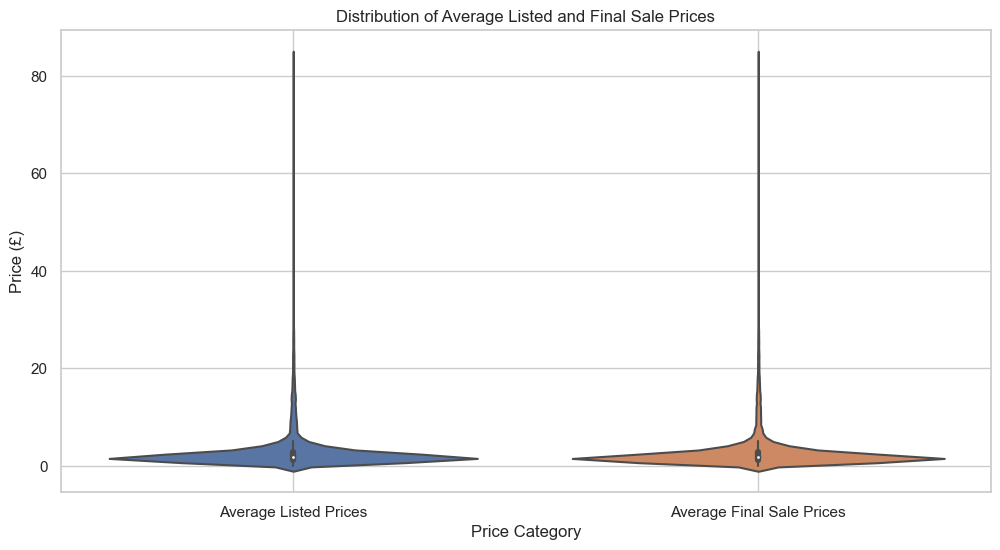

In [263]:
# Create a DataFrame for plotting
prices_data = product_purchase_summary[['avg_sale_amount', 'avg_sale_price']]
prices_data = prices_data.melt(var_name='Type', value_name='Price')
prices_data['Type'] = prices_data['Type'].replace({'avg_sale_amount': 'Average Listed Prices', 'avg_sale_price': 'Average Final Sale Prices'})

# Create violin plot
plt.figure(figsize=(12, 6))
sns.violinplot(data=prices_data, x='Type', y='Price')
plt.title('Distribution of Average Listed and Final Sale Prices')
plt.xlabel('Price Category')  # Setting custom x-axis label
plt.ylabel('Price (£)')
plt.grid(True)

plt.show()

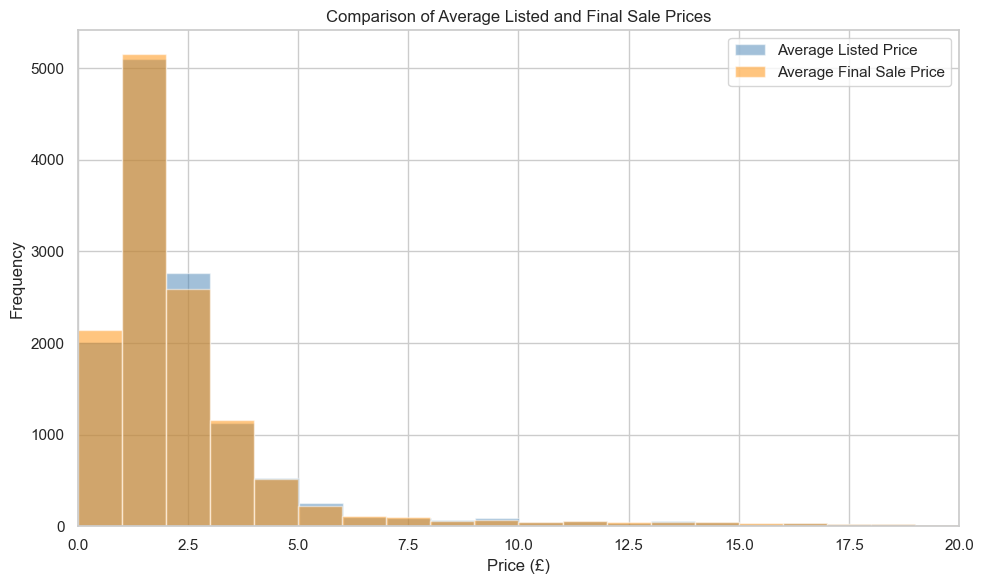

In [264]:
# Creating a histogram for average listed and final sale prices on the same plot
plt.figure(figsize=(10, 6))

# Histogram for average listed prices
plt.hist(product_purchase_summary['avg_sale_amount'], bins=84, color='#4682b4', alpha=0.5, label='Average Listed Price')

# Histogram for average final sale prices
plt.hist(product_purchase_summary['avg_sale_price'], bins=84, color='#ff8c00', alpha=0.5, label='Average Final Sale Price')

plt.title('Comparison of Average Listed and Final Sale Prices')
plt.xlabel('Price (£)')
plt.ylabel('Frequency')
plt.xlim(0, 20)  # Setting x-axis limits for better focus on the range 0-5
plt.legend()

plt.tight_layout()
plt.show()

The price distribution of products at the ASDA Morley store is **heavily skewed towards the lower end**. The majority of the products are priced below £5, with over 50% of the products costing less than £2. This suggests that most items are quite affordable, making them appealing to a wide range of consumers

<br>

**Health and Unhealthy Products**
- Percentage of products classified as healthy.
- Percentage of sold products that are healthy.
- Health distribution across each category.

- **Percentage of products classified as healthy**
- **Percentage of sold products that are healthy**

In [265]:
df_product_food_all_score.head(1)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529


In [266]:
df_basket_npm.head(1)

,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc,prod_disp_nm,category,is_food,NPM_score,is_healthy,standardised_NPM
0,202305224158314206827,4715670,1,2.5,0.0,NaN,2.5,0.0,2 Finger Milk Chocolate Biscuit Bars Bumper Mu...,Cookies & Biscuits,1,20.0,0.0,1.555


In [267]:
# Define colors and labels
colors = ['#fb607f', '#93c572']  # Red for Unhealthy, Green for Healthy
labels = ['Unhealthy', 'Healthy']

# Calculate the percentage of 0s and 1s in the 'is_healthy' column for all products
healthy_counts = df_product_food_all_score['is_healthy'].value_counts(normalize=True) * 100

# Calculate the percentage of sold products that are healthy or unhealthy
sold_healthy_counts = df_basket_npm['is_healthy'].value_counts(normalize=True) * 100

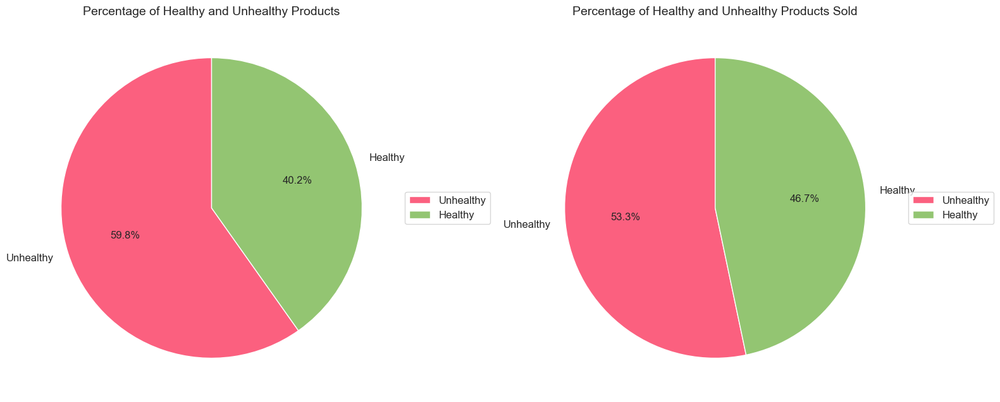

In [268]:
# Create a subplot with 1 row and 2 columns for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# First Pie Chart: Percentage of Healthy and Unhealthy Products
axes[0].pie(healthy_counts, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 12})
axes[0].set_title('Percentage of Healthy and Unhealthy Products', fontsize=14)
axes[0].legend(labels, loc="center left", bbox_to_anchor=(1, 0.5), fontsize=12)

# Second Pie Chart: Percentage of Sold Healthy and Unhealthy Products
axes[1].pie(sold_healthy_counts, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 12})
axes[1].set_title('Percentage of Healthy and Unhealthy Products Sold', fontsize=14)
axes[1].legend(labels, loc="center left", bbox_to_anchor=(1, 0.5), fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()

In the ASDA Morley store, approximately 60% of the available products are classified as unhealthy according to the NPM model. However, despite the high availability of unhealthy products, around 47% of the items actually sold are healthy. This suggests that while some customers are opting for healthier choices, the majority of purchases remain unhealthy. **Given that over half of the products sold are unhealthy, there is significant potential for improvement in both the range of health-conscious products provided by the supermarket and in encouraging healthier purchasing behavior among consumers.**

*Note: "Sold products" refers to individual transactions, meaning the same product could be counted multiple times if purchased more than once.*

In [269]:
# Calculate the value counts for is_food and is_healthy combinations
food_drink_healthy_counts = df_product_food_all_score.groupby(['is_food', 'is_healthy']).size().unstack(fill_value=0)

# Rename the columns for better readability
food_drink_healthy_counts.columns = ['Unhealthy', 'Healthy']
food_drink_healthy_counts.index = ['Drink', 'Food']

# Display the result
food_drink_healthy_counts

,Unhealthy,Healthy
Drink,1044,2035
Food,6899,3307


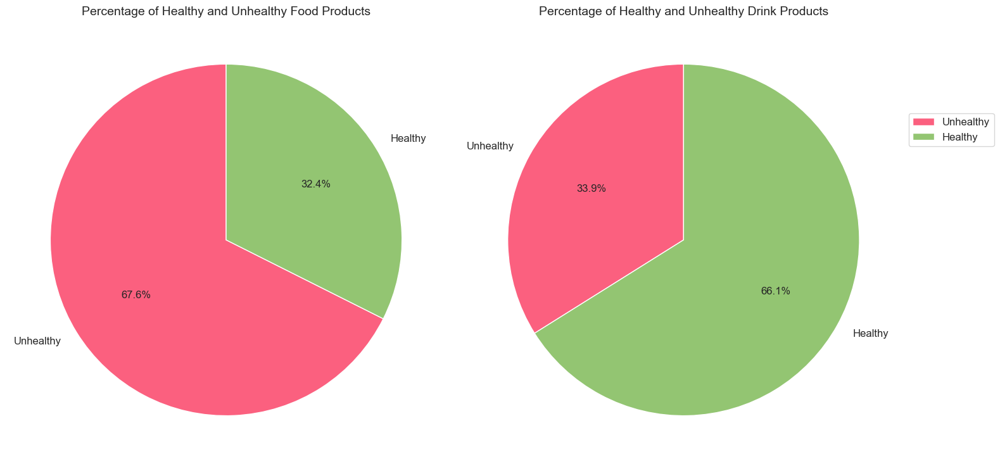

In [270]:
# Calculate the percentage for each combination
food_drink_healthy_percentage = food_drink_healthy_counts.div(food_drink_healthy_counts.sum(axis=1), axis=0) * 100

# Plotting the pie charts
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Define labels and colors
labels = ['Unhealthy', 'Healthy']
colors = ['#fb607f','#93c572']

# Plot for Food
axes[0].pie(food_drink_healthy_percentage.loc['Food'], labels=labels, autopct='%1.1f%%', 
            colors=colors, startangle=90, textprops={'fontsize': 12})
axes[0].set_title('Percentage of Healthy and Unhealthy Food Products', fontsize=14)

# Plot for Drink
axes[1].pie(food_drink_healthy_percentage.loc['Drink'], labels=labels, autopct='%1.1f%%', 
            colors=colors, startangle=90, textprops={'fontsize': 12})
axes[1].set_title('Percentage of Healthy and Unhealthy Drink Products', fontsize=14)

# Add a legend for both charts
plt.legend(labels, loc="upper left", bbox_to_anchor=(1, 0.8), fontsize=12)

# Display the plot
plt.tight_layout()
plt.show()

Among food and drink products, drinks have a higher percentage of unhealthy items compared to food.

- **Health distribution across each category**

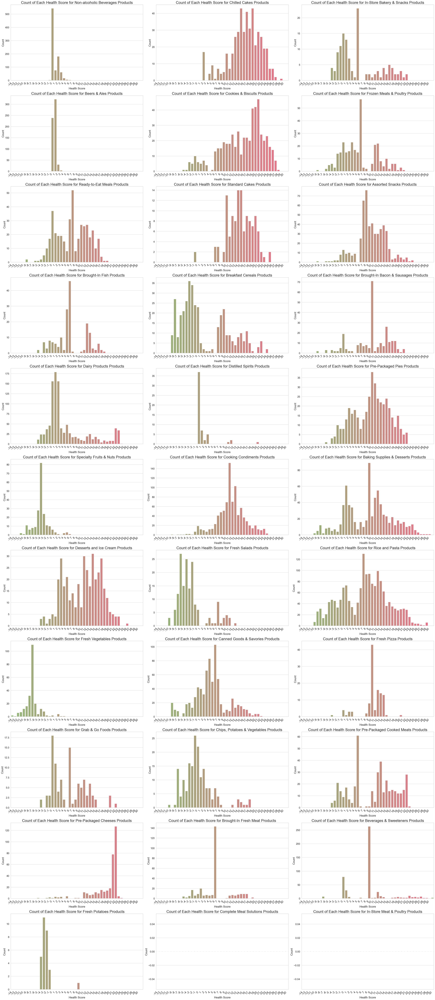

In [271]:
# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Custom color map from green (healthy) to red (unhealthy)
color_map = LinearSegmentedColormap.from_list("health_gradient", ["#93c572", "#fb607f"], N=45)

# Get unique categories
unique_categories = df_product_food_all_score['category'].unique()

# Calculate the number of rows needed for three columns
num_rows = (len(unique_categories) + 2) // 3  # Plus 2 for rounding up division if not divisible by 3

# Define the plot dimensions based on the number of categories
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(38.4, 8 * num_rows))

# Flatten axes array if needed for easier iteration
axes = axes.flatten() if len(unique_categories) > 3 else [axes]

# Loop through each category and create plots
for ax, category in zip(axes, unique_categories):
    # Filter the DataFrame by category
    category_data = df_product_food_all_score[df_product_food_all_score['category'] == category]
    score_counts = category_data['NPM_score'].value_counts().sort_index()

    # Ensure all health score values from -14 to 30 are present in the index
    all_scores = pd.Series(index=range(-14, 31), data=0)  # Creating a series of zeros for scores -14 to 30
    score_counts = all_scores.add(score_counts, fill_value=0).astype(int)  # Add zeros to ensure all indices -14 to 30 are present

    # Create a bar plot for the health scores
    colors = [color_map((i + 14) / 44) for i in range(-14, 31)]
    sns.barplot(ax=ax, x=score_counts.index, y=score_counts.values, palette=colors)
    ax.set_title(f'Count of Each Health Score for {category} Products', fontsize=24)
    ax.set_xlabel('Health Score', fontsize=18)
    ax.set_ylabel('Count', fontsize=18)

    # Adjust x-tick and y-tick labels
    x_labels = [str(i) for i in range(-14, 31)]
    ax.set_xticks(ticks=range(len(x_labels)))  # Set custom x-ticks
    ax.set_xticklabels(labels=x_labels, rotation=45, ha='right', fontsize=18)  # Adjust font size for X-axis tick labels
    ax.tick_params(axis='y', labelsize=16)  # Adjust font size for Y-axis tick labels

# Adjust layout
plt.tight_layout()

# Hide unused axes if the number of categories is not a multiple of three
if len(unique_categories) % 3 != 0:
    for i in range(3 - len(unique_categories) % 3):
        axes[-(i + 1)].set_visible(False)

plt.show()

Each plot shows the distribution of health scores within a specific category. The color intensity indicates the healthiness of the products, with red bars representing higher (unhealthier) scores. The y-axis represents the count of products in each category. Categories like `Chilled Cakes`, `Pre-packed Cheeses`, and `Standard Cakes` are predominantly **unhealthy** with higher scores. In contrast, categories such as `Fresh Vegetables`, `Fresh Salads`,and `Fruits and Nuts` offer mostly **healthy** products.

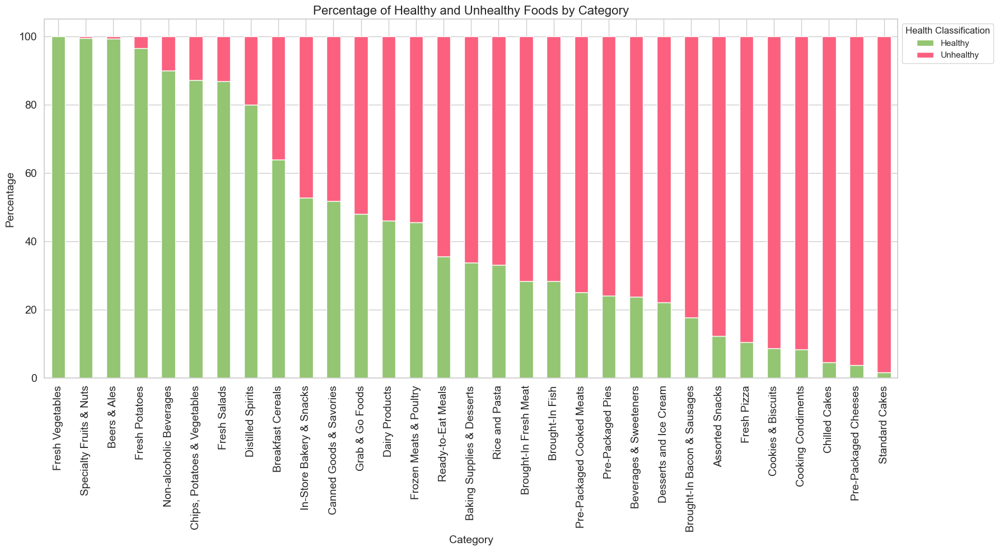

In [272]:
# Step 1: Filter out NaN values in 'is_healthy'
df_filtered = df_product_food_all_score.dropna(subset=['is_healthy'])

# Step 2: Group by Category and Health Status
health_data = df_filtered.groupby(['category', 'is_healthy']).size().reset_index(name='count')

# Step 3: Calculate the total counts per category
total_counts = df_filtered.groupby('category').size().reset_index(name='total_count')

# Step 4: Merge the count data with total counts
health_data = pd.merge(health_data, total_counts, on='category')

# Step 5: Calculate percentages
health_data['percentage'] = (health_data['count'] / health_data['total_count']) * 100

# Prepare for plotting
plot_data = health_data.pivot(index='category', columns='is_healthy', values='percentage').fillna(0)
plot_data.columns = ['Unhealthy', 'Healthy']  # Rename columns for clarity

# Sort by 'Healthy' percentage in descending order
plot_data = plot_data.sort_values(by='Healthy', ascending=False)

# Step 6: Plotting
ax = plot_data[['Healthy', 'Unhealthy']].plot(kind='bar', stacked=True, color=['#93c572', '#fb607f'], figsize=(18, 10))
plt.xlabel('Category', fontsize=14)
plt.ylabel('Percentage', fontsize=14)
plt.title('Percentage of Healthy and Unhealthy Foods by Category', fontsize=16)
plt.legend(title='Health Classification', bbox_to_anchor=(1.0, 1.0))
plt.xticks(rotation=90)

# Adjust the font size of x and y ticks
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

`Fresh Vegetables`, `Specialty Fruits & Nuts`, and `Fresh Potatoes` offer the highest percentage(over 90%) of healthy products. On the other hand, `Standard Cakes`, `Chilled Cakes`, and `Pre-Packaged Cheeses` have over 90% unhealthy products.

*Note: `Complete Meal Solutions` and `In-Store Meat & Poultry` each contain only one product and do not have nutrition information, so they do not appear in the plot."

In [273]:
df_product_food_all_score['category'].value_counts()

category
Rice and Pasta                  1674
Dairy Products                  1037
Cooking Condiments               903
Non-alcoholic Beverages          895
Baking Supplies & Desserts       746
Canned Goods & Savories          742
Beers & Ales                     595
Assorted Snacks                  521
Cookies & Biscuits               520
Distilled Spirits                516
Beverages & Sweeteners           497
Chilled Cakes                    459
Ready-to-Eat Meals               419
Pre-Packaged Pies                414
Pre-Packaged Cooked Meats        399
Desserts and Ice Cream           388
Breakfast Cereals                372
Pre-Packaged Cheeses             341
Frozen Meats & Poultry           307
Brought-In Fresh Meat            289
Brought-In Bacon & Sausages      248
Fresh Vegetables                 241
Specialty Fruits & Nuts          208
Chips, Potatoes & Vegetables     180
Brought-In Fish                  173
Fresh Salads                     167
In-Store Bakery & Snacks     

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\1631650564.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=13)


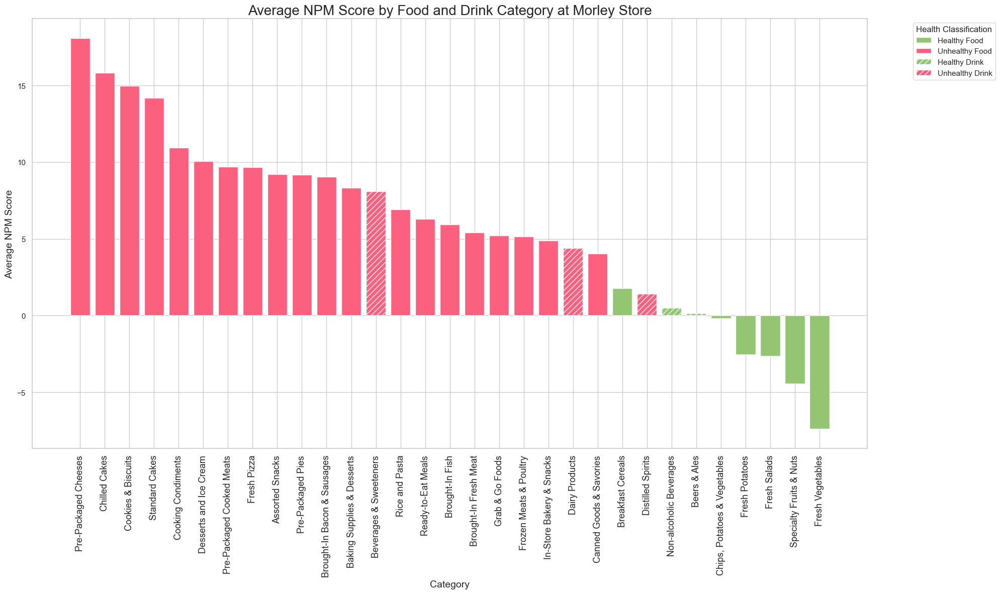

In [274]:
# Group by category and is_food, then calculate the mean NPM score
average_npm_scores = df_product_food_all_score.groupby(['category', 'is_food'])['NPM_score'].mean().reset_index()

# Pivot the data for plotting
average_npm_scores_pivot = average_npm_scores.pivot(index='category', columns='is_food', values='NPM_score')

# Flatten the pivot table and reset index for easier sorting
average_npm_scores_flat = average_npm_scores_pivot.stack().reset_index().rename(columns={0: 'NPM_score'})

# Sort by NPM score
average_npm_scores_sorted = average_npm_scores_flat.sort_values(by='NPM_score', ascending=False)

# Create a color palette and hatch pattern for health and type classification
def determine_color_and_hatch(is_food, npm_score):
    if is_food == 1:  # Food
        if npm_score > 4:
            return '#fb607f', ''  # Red for unhealthy food
        else:
            return '#93c572', ''  # Green for healthy food
    else:  # Drink
        if npm_score > 1:
            return '#fb607f', '///'  # Red with hatch for unhealthy drink
        else:
            return '#93c572', '///'  # Green with hatch for healthy drink

# Create a bar plot for average NPM scores
fig, ax = plt.subplots(figsize=(20, 12))

# Plot each type (Food and Drink) with appropriate colors and hatches based on health classification
for idx, row in average_npm_scores_sorted.iterrows():
    category = row['category']
    is_food = row['is_food']
    npm_score = row['NPM_score']
    color, hatch = determine_color_and_hatch(is_food, npm_score)
    bar = ax.bar(
        category, npm_score, color=color, hatch=hatch, edgecolor='white')
    if idx == 0:
        bar[0].set_label(f'{is_food} ({npm_score})')

# Add labels and title
plt.xlabel('Category', fontsize=14)
plt.ylabel('Average NPM Score', fontsize=14)
plt.title('Average NPM Score by Food and Drink Category at Morley Store', fontsize=20)

# Rotate x-axis labels and set font size
plt.xticks(rotation=90)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=13)

# Create a custom legend
handles = [
    mpatches.Patch(facecolor='#93c572', label='Healthy Food'),
    mpatches.Patch(facecolor='#fb607f', label='Unhealthy Food'),
    mpatches.Patch(facecolor='#93c572', hatch='///', label='Healthy Drink', edgecolor='white'),
    mpatches.Patch(facecolor='#fb607f', hatch='///', label='Unhealthy Drink', edgecolor='white')
]
ax.legend(title='Health Classification', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as an image file
plt.savefig(r'average_npm_score_category_morley_store.png', dpi=300, bbox_inches='tight')

# Show plot
plt.tight_layout()
plt.show()

Out of 33 categories, 5 are drink categories and 27 are food categories. Most of these categories have an average NPM score that classifies them as unhealthy—food categories with a score over 4 and drink categories with a score over 1 are considered unhealthy. It's worth noting that only 8 out of the 33 categories are considered healthy. **This unequal distribution of healthy and unhealthy scores across categories highlights a significant opportunity for the store to enhance the overall healthiness of its product offerings.**

In [275]:
# Print the average NPM scores
print("Average NPM Scores for Food and Drink by Category:")
print(average_npm_scores_sorted)

Average NPM Scores for Food and Drink by Category:
                        category  is_food  NPM_score
24          Pre-Packaged Cheeses        1  18.070336
9                  Chilled Cakes        1  15.825581
11            Cookies & Biscuits        1  14.960707
30                Standard Cakes        1  14.192661
12            Cooking Condiments        1  10.945406
14        Desserts and Ice Cream        1  10.067039
25     Pre-Packaged Cooked Meats        1   9.698701
16                   Fresh Pizza        1   9.661972
0                Assorted Snacks        1   9.200000
26             Pre-Packaged Pies        1   9.175532
5    Brought-In Bacon & Sausages        1   9.050847
1     Baking Supplies & Desserts        1   8.313546
3         Beverages & Sweeteners        0   8.085470
28                Rice and Pasta        1   6.918394
27            Ready-to-Eat Meals        1   6.305177
6                Brought-In Fish        1   5.929134
7          Brought-In Fresh Meat        1   5.42

<br>

**Discounts and Promotions**
- **Percentage of products offered with a discount**: Overall, Healthy Products, and unhealthy products.
- **Distribution of discount percentages** for healthy and unhealthy products.

In [276]:
df_product_food_all_score.head(1)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529


In [277]:
product_purchase_summary.head(3)

,prod_id,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,156,46,46,5.922826,0.0,5.922826,0.0
1,170,434,434,15.317880,0.0,15.317880,0.0
2,209,66,66,12.025758,0.0,12.025758,0.0


In [278]:
df_basket_npm.head(1)

,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc,prod_disp_nm,category,is_food,NPM_score,is_healthy,standardised_NPM
0,202305224158314206827,4715670,1,2.5,0.0,NaN,2.5,0.0,2 Finger Milk Chocolate Biscuit Bars Bumper Mu...,Cookies & Biscuits,1,20.0,0.0,1.555


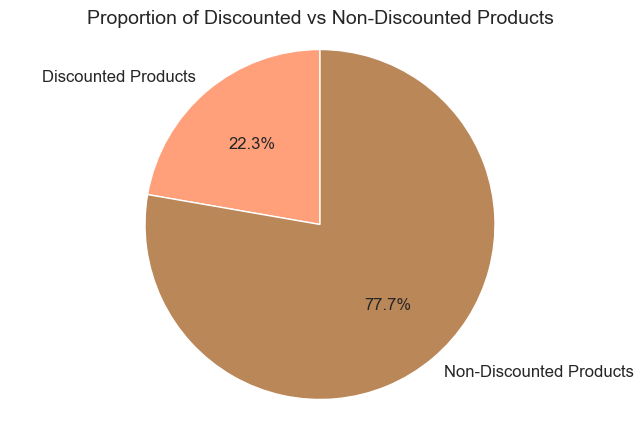

In [279]:
# Categorize products based on whether they have a discount or not
discounted_products = (product_purchase_summary['avg_dis_perc'] > 0).sum()
non_discounted_products = (product_purchase_summary['avg_dis_perc'] == 0).sum()

# Create a pie chart
labels = ['Discounted Products', 'Non-Discounted Products']
sizes = [discounted_products, non_discounted_products]
colors = ['#ffa07a', '#ba8759']

plt.figure(figsize=(8, 5))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 12})
plt.title('Proportion of Discounted vs Non-Discounted Products', fontsize=14)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

**Overall Discount Proportion**:  
Approximately 22% of all products are offered at a discount, leaving 78% without any discount.

In [280]:
# Filter for healthy and unhealthy products
healthy_products_df = df_product_food_all_score[df_product_food_all_score['is_healthy'] == 1]
unhealthy_products_df = df_product_food_all_score[df_product_food_all_score['is_healthy'] == 0]

# Merge with the summary to get the discount information
healthy_products_with_discount = healthy_products_df.merge(product_purchase_summary[['prod_id', 'avg_dis_perc']], on='prod_id')
unhealthy_products_with_discount = unhealthy_products_df.merge(product_purchase_summary[['prod_id', 'avg_dis_perc']], on='prod_id')

# Calculate the number of discounted and non-discounted products among the healthy products
num_discounted_healthy_products = (healthy_products_with_discount['avg_dis_perc'] > 0).sum()
num_non_discounted_healthy_products = (healthy_products_with_discount['avg_dis_perc'] == 0).sum()

# Calculate the number of discounted and non-discounted products among the unhealthy products
num_discounted_unhealthy_products = (unhealthy_products_with_discount['avg_dis_perc'] > 0).sum()
num_non_discounted_unhealthy_products = (unhealthy_products_with_discount['avg_dis_perc'] == 0).sum()

# Calculate the total number of healthy and unhealthy products
total_healthy_products = num_discounted_healthy_products + num_non_discounted_healthy_products
total_unhealthy_products = num_discounted_unhealthy_products + num_non_discounted_unhealthy_products

In [281]:
# Print counts for healthy products
print("Healthy Products:")
print(f"Total: {total_healthy_products}")
print(f"Discounted: {num_discounted_healthy_products}")
print(f"Non-Discounted: {num_non_discounted_healthy_products}")
print('----------------------------------------------')

# Print counts for unhealthy products
print("Unhealthy Products:")
print(f"Total: {total_unhealthy_products}")
print(f"Discounted: {num_discounted_unhealthy_products}")
print(f"Non-Discounted: {num_non_discounted_unhealthy_products}")

Healthy Products:
Total: 4874
Discounted: 1435
Non-Discounted: 3439
----------------------------------------------
Unhealthy Products:
Total: 7315
Discounted: 1327
Non-Discounted: 5988


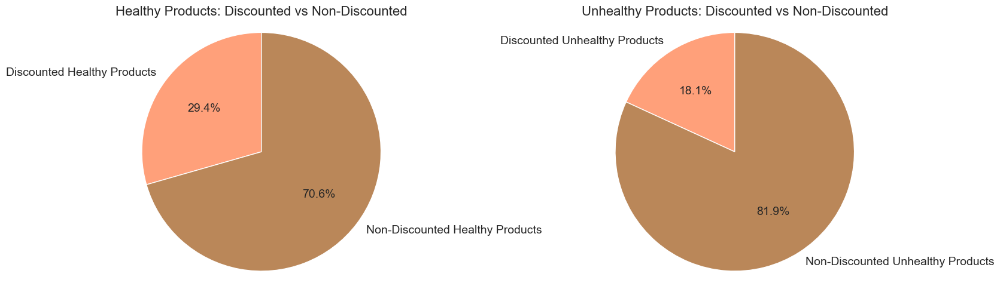

In [282]:
# Plot pie charts for healthy products
plt.figure(figsize=(16, 5))

# Pie chart for healthy products
plt.subplot(1, 2, 1)
labels = ['Discounted Healthy Products', 'Non-Discounted Healthy Products']
sizes = [num_discounted_healthy_products, num_non_discounted_healthy_products]
colors = ['#ffa07a', '#ba8759']
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 14})
plt.title('Healthy Products: Discounted vs Non-Discounted', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Pie chart for unhealthy products
plt.subplot(1, 2, 2)
labels = ['Discounted Unhealthy Products', 'Non-Discounted Unhealthy Products']
sizes = [num_discounted_unhealthy_products, num_non_discounted_unhealthy_products]
colors = ['#ffa07a', '#ba8759']
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 14})
plt.title('Unhealthy Products: Discounted vs Non-Discounted', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.show()

Healthy products have a higher percentage of discounts, with almost 30% being discounted, compared to 18% for unhealthy products. This indicates that **healthy products are more likely to be discounted**.

In [283]:
# Filter out products with no discount before calculating summary statistics
discounted_healthy_products = healthy_products_with_discount[healthy_products_with_discount['avg_dis_perc'] > 0]
discounted_unhealthy_products = unhealthy_products_with_discount[unhealthy_products_with_discount['avg_dis_perc'] > 0]

# Calculate the number of discounted and non-discounted products among the healthy products
count_discounted_healthy_products = len(discounted_healthy_products)
count_non_discounted_healthy_products = len(healthy_products_with_discount) - count_discounted_healthy_products

# Calculate the number of discounted and non-discounted products among the unhealthy products
count_discounted_unhealthy_products = len(discounted_unhealthy_products)
count_non_discounted_unhealthy_products = len(unhealthy_products_with_discount) - count_discounted_unhealthy_products

# Calculate summary statistics for discount percentages among discounted products only
healthy_discount_stats = discounted_healthy_products['avg_dis_perc'].describe()
unhealthy_discount_stats = discounted_unhealthy_products['avg_dis_perc'].describe()

print("Summary Statistics for Discount Percentage (Healthy Products with Discount):")
print(healthy_discount_stats)
print('----------------------------------------------------')
print("Summary Statistics for Discount Percentage (Unhealthy Products with Discount):")
print(unhealthy_discount_stats)

Summary Statistics for Discount Percentage (Healthy Products with Discount):
count    1435.000000
mean        0.170844
std         0.133520
min         0.000026
25%         0.068396
50%         0.150028
75%         0.236137
max         1.000000
Name: avg_dis_perc, dtype: float64
----------------------------------------------------
Summary Statistics for Discount Percentage (Unhealthy Products with Discount):
count    1327.000000
mean        0.141381
std         0.118443
min         0.000229
25%         0.053480
50%         0.109959
75%         0.200459
max         0.905726
Name: avg_dis_perc, dtype: float64


In [284]:
# Extract rows where 'avg_dis_perc' is large than 0.7 in the unhealthy_products_with_discount DataFrame
unhealthy_products_max_discount = unhealthy_products_with_discount[unhealthy_products_with_discount['avg_dis_perc'] > 0.7]

# Display the extracted rows
unhealthy_products_max_discount

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM,avg_dis_perc
591,5338381,Corner Peach & Apricot Yogurt,Muller,Dairy Products,"{'carbohydrate': 13.9, 'energy': 111.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,3.0,0.0,0.004,0.729338
1653,5169814,Corner Toffee Yogurt with Chocolate Hoops,Muller,Dairy Products,"{'carbohydrate': 19.1, 'energy': 144.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",0,5.0,0.0,0.358,0.723703
3296,4673812,SCHWZ LOADED,NaN,Cooking Condiments,"{'carbohydrate': 50.9, 'energy': 299.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",1,7.0,0.0,-0.090,0.905726


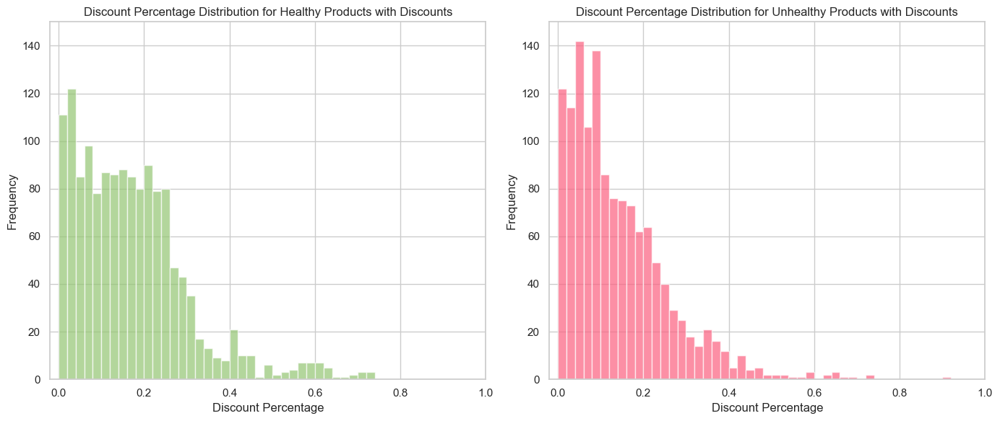

In [285]:
# Visualize the distribution of discount percentages
plt.figure(figsize=(14, 6))

# Define the bins from 0 to 1 with a step size of 0.05
bins = np.arange(0, 1, 0.02)

# Histogram for Healthy Products (only those with discounts)
plt.subplot(1, 2, 1)
plt.hist(discounted_healthy_products['avg_dis_perc'], bins=bins, color='#93c572', alpha=0.7)
plt.title('Discount Percentage Distribution for Healthy Products with Discounts')
plt.xlabel('Discount Percentage')
plt.ylabel('Frequency')
plt.xlim(-0.02, 1)
plt.ylim(0, 150)

# Histogram for Unhealthy Products (only those with discounts)
plt.subplot(1, 2, 2)
plt.hist(discounted_unhealthy_products['avg_dis_perc'], bins=bins, color='#fb607f', alpha=0.7)
plt.title('Discount Percentage Distribution for Unhealthy Products with Discounts')
plt.xlabel('Discount Percentage')
plt.ylabel('Frequency')
plt.xlim(-0.02, 1)
plt.ylim(0, 150)

plt.tight_layout()
plt.show()

**Discount Percentage Distribution**
- **Healthy Products with Discounts**: The average discount for healthy products is approximately 17%, with a standard deviation of 13%. Most discounts for healthy products are concentrated around the 20% mark, with fewer items receiving higher discounts.
- **Unhealthy Products with Discounts**: The average discount for unhealthy products is slightly lower at 14%, with a standard deviation of 11%. Like healthy products, discounts for unhealthy products also cluster around the 20% mark.

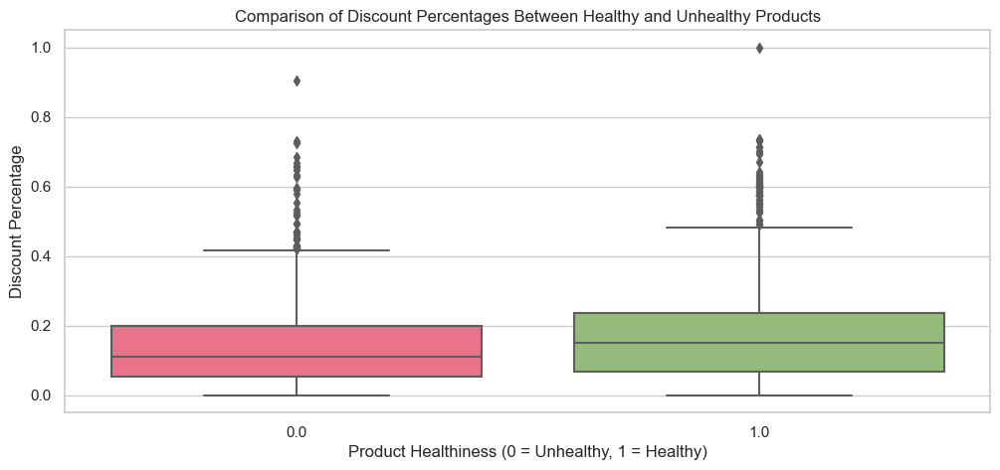

In [286]:
# Combine the healthy and unhealthy products with discounts into a single DataFrame
combined_discounted_products = pd.concat([discounted_healthy_products, discounted_unhealthy_products])

# Create a boxplot to compare discount percentages between healthy and unhealthy products
plt.figure(figsize=(12, 5))
sns.boxplot(x='is_healthy', y='avg_dis_perc', data=combined_discounted_products, 
            palette=['#fb607f', '#93c572'])  # Red for Unhealthy, Green for Healthy
plt.title('Comparison of Discount Percentages Between Healthy and Unhealthy Products')
plt.xlabel('Product Healthiness (0 = Unhealthy, 1 = Healthy)')
plt.ylabel('Discount Percentage')
plt.show()

**Boxplot Comparison**: The boxplot comparing discount percentages for healthy and unhealthy products shows a similar median discount for both categories, but **healthy products display a wider range of discount percentages, indicating that healthy items are more likely to receive higher discounts**.

<br>

**Sales Performance**
- Identification of products with the highest sales volumes.
- Top 5 most popular healthy products.
- Top 5 most popular unhealthy products.

In [287]:
df_product_food_all_score.head(1)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529


In [288]:
product_purchase_summary.head(1)

,prod_id,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,156,46,46,5.922826,0.0,5.922826,0.0


- Identification of products with the highest sales volumes.

In [289]:
# Merge the two DataFrames on 'prod_id' to get the product names, categories, health status, and brand names
df_merged = pd.merge(product_purchase_summary, df_product_food_all_score[['prod_id', 'prod_disp_nm', 'brand_nm', 'category', 'is_healthy', 'NPM_score']], on='prod_id')

# Sort the merged DataFrame by 'total_quantity' in descending order to get the top-selling products
top_10_best_selling_products = df_merged.sort_values(by='total_quantity', ascending=False).head(10)

# Display the top 10 best-selling products
print("Top 10 Best Selling Products:")
top_10_best_selling_products[['prod_disp_nm', 'category', 'brand_nm', 'total_quantity', 'is_healthy', 'NPM_score']]

Top 10 Best Selling Products:


,prod_disp_nm,category,brand_nm,total_quantity,is_healthy,NPM_score
326,Semi Skimmed Milk,Dairy Products,ASDA,63102,1.0,1.000000
299,Whole Cucumber,Fresh Salads,ASDA,36880,1.0,-2.657343
4253,Tender & Crunchy Broccoli,Fresh Vegetables,ASDA,24852,1.0,-12.000000
313,Loose Banana (Average Weight 0.18kg),Specialty Fruits & Nuts,ASDA Grower's Selection,24371,1.0,-2.000000
5812,Seedless Red Grapes,Specialty Fruits & Nuts,ASDA Grower's Selection,22153,1.0,-4.444444
6793,7 Bananas,Specialty Fruits & Nuts,ASDA Grower's Selection,19531,1.0,-3.000000
5786,Seedless Green Grapes,Specialty Fruits & Nuts,ASDA Grower's Selection,19496,1.0,-4.444444
318,Whole Milk,Dairy Products,ASDA,19195,0.0,2.000000
336,Semi Skimmed Milk,Dairy Products,ASDA,18351,1.0,1.000000
289,Carrots,Fresh Vegetables,ASDA Grower's Selection,18061,1.0,-7.000000


- Top 30 most popular healthy products.

In [290]:
# Split into healthy and unhealthy products
healthy_products = df_merged[df_merged['is_healthy'] == 1]
unhealthy_products = df_merged[df_merged['is_healthy'] == 0]

# Sort each by 'total_quantity' to find the most popular products
top_30_healthy_products = healthy_products.sort_values(by='total_quantity', ascending=False).head(30)
top_30_unhealthy_products = unhealthy_products.sort_values(by='total_quantity', ascending=False).head(30)

# Display the top 5 healthy products
print("Top 30 Most Popular Healthy Products:")
top_30_healthy_products[['prod_disp_nm', 'category', 'brand_nm', 'NPM_score', 'total_quantity']]

Top 30 Most Popular Healthy Products:


,prod_disp_nm,category,brand_nm,NPM_score,total_quantity
326,Semi Skimmed Milk,Dairy Products,ASDA,1.000000,63102
299,Whole Cucumber,Fresh Salads,ASDA,-2.657343,36880
4253,Tender & Crunchy Broccoli,Fresh Vegetables,ASDA,-12.000000,24852
313,Loose Banana (Average Weight 0.18kg),Specialty Fruits & Nuts,ASDA Grower's Selection,-2.000000,24371
5812,Seedless Red Grapes,Specialty Fruits & Nuts,ASDA Grower's Selection,-4.444444,22153
6793,7 Bananas,Specialty Fruits & Nuts,ASDA Grower's Selection,-3.000000,19531
5786,Seedless Green Grapes,Specialty Fruits & Nuts,ASDA Grower's Selection,-4.444444,19496
336,Semi Skimmed Milk,Dairy Products,ASDA,1.000000,18351
289,Carrots,Fresh Vegetables,ASDA Grower's Selection,-7.000000,18061
4937,British Carrots,Fresh Vegetables,ASDA Grower's Selection,-7.000000,16681


- Top 5 most popular unhealthy products.

In [291]:
# Display the top 30 unhealthy products
print("Top 30 Most Popular Unhealthy Products:")
top_30_unhealthy_products[['prod_disp_nm', 'category', 'brand_nm', 'NPM_score', 'total_quantity', 'avg_sale_price']]

Top 30 Most Popular Unhealthy Products:


,prod_disp_nm,category,brand_nm,NPM_score,total_quantity,avg_sale_price
318,Whole Milk,Dairy Products,ASDA,2.000000,19195,1.620575
319,Whole Milk,Dairy Products,ASDA,2.000000,12501,2.384462
6126,10 Unsmoked Back Bacon Rashers,Brought-In Bacon & Sausages,ASDA Butcher's Selection,14.000000,11004,1.835850
4145,Orange Juice from Concentrate,Dairy Products,ASDA Smart Price,2.000000,9559,0.889287
2894,Grated Cheddar,Pre-Packaged Cheeses,ASDA Smart Price,21.000000,8727,2.705643
536,Milk Chocolate Digestives,Cookies & Biscuits,ASDA,20.000000,8041,0.776745
5999,10 Smoked Back Bacon Rashers,Brought-In Bacon & Sausages,ASDA Butcher's Selection,14.000000,7999,1.845473
3099,Bourbon Biscuits,Cookies & Biscuits,ASDA,15.000000,7863,0.604323
124,Granulated Sugar,Beverages & Sweeteners,Silver Spoon,11.000000,7523,1.179385
3066,Grated Mozzarella Cheese,Pre-Packaged Cheeses,ASDA,20.000000,7062,2.205132


**Comparison of Meat Products Across Different Categories: Price, Sales, and Health**  
-- `Brought-In Fresh Meat`  
-- `Frozen Meats & Poultry`  
-- `Brought-In Bacon & Sausages`  
-- `Pre-Packaged Cooked Meats`

In [292]:
# Define the categories to keep
categories_to_keep = [
    'Brought-In Fresh Meat', 'Frozen Meats & Poultry', 'Brought-In Bacon & Sausages', 'Pre-Packaged Cooked Meats']

# Filter the DataFrame to only include these categories
df_meat = df_merged[df_merged['category'].isin(categories_to_keep)]

In [293]:
print(len(df_meat))
df_meat.head(2)

1086


,prod_id,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc,prod_disp_nm,brand_nm,category,is_healthy,NPM_score
286,9030,3,3,2.500000,0.0,2.500000,0.0,Vegetarian Mince,Quorn,Brought-In Bacon & Sausages,1.0,-9.0
424,68824,475,475,0.793095,0.0,0.793095,0.0,Smooth Brussels Pate with Garlic,ASDA,Pre-Packaged Cooked Meats,0.0,18.0


In [294]:
# Sort the dataframe by "avg_sale_amount" in descending order and get the top 10
top_10_meat_products = df_meat.sort_values(by='total_quantity', ascending=False).head(10)

top_10_meat_products[['prod_disp_nm', 'brand_nm','category', 'NPM_score', 'is_healthy', 'avg_sale_price', 'total_quantity']]

,prod_disp_nm,brand_nm,category,NPM_score,is_healthy,avg_sale_price,total_quantity
3931,Lean Beef Mince (Typically Less Than 5% Fat),ASDA Butcher's Selection,Brought-In Fresh Meat,-2.0,1.0,3.376278,11563
6126,10 Unsmoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,14.0,0.0,1.835850,11004
5999,10 Smoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,14.0,0.0,1.845473,7999
7641,Thick Sliced Corned Beef 4 Slices,ASDA,Pre-Packaged Cooked Meats,14.0,0.0,1.412983,6001
6051,6 Thick Cut Unsmoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,14.0,0.0,1.794367,5591
2997,12 Pork Chipolatas,ASDA Extra Special,Brought-In Bacon & Sausages,17.0,0.0,2.043246,5520
3016,6 Pork Sausages,ASDA Extra Special,Brought-In Bacon & Sausages,17.0,0.0,2.105738,4585
2684,Prime Beef Sirloin Steak,ASDA Butcher's Selection,Brought-In Fresh Meat,1.0,1.0,3.265735,4124
6183,Wafer Thin Honey Roast Ham Approx 40 Slices,ASDA,Pre-Packaged Cooked Meats,12.0,0.0,2.182240,3982
973,Finely Sliced Topside Beef,ASDA,Pre-Packaged Cooked Meats,1.0,1.0,1.347872,3982


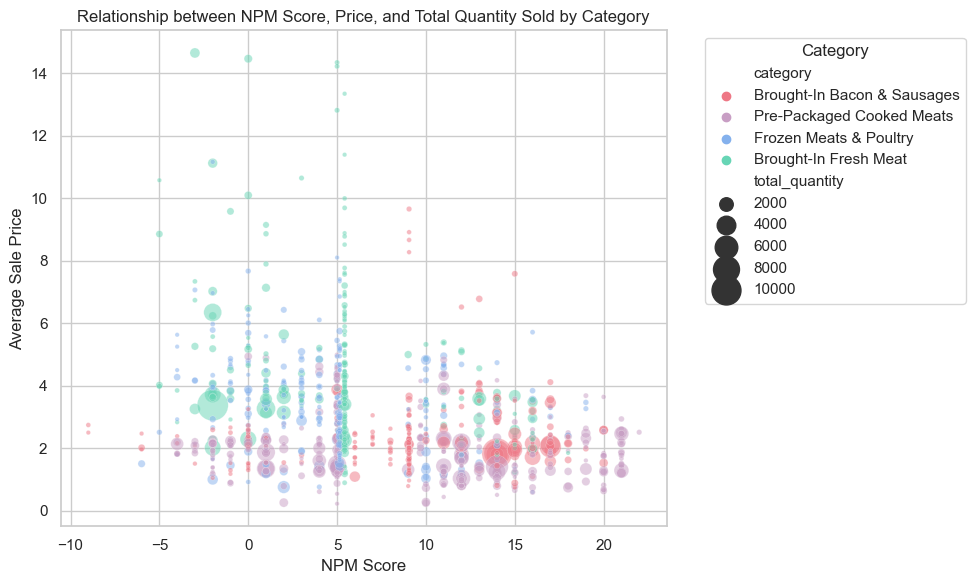

In [295]:
# Define custom colors for each category
custom_palette = {
    'Brought-In Fresh Meat': '#67D5B5',
    'Frozen Meats & Poultry': '#84B1ED',
    'Brought-In Bacon & Sausages': '#EE7785',
    'Pre-Packaged Cooked Meats': '#C89EC4'
}

# Create the bubble plot with custom colors
plt.figure(figsize=(10, 6))
sns.scatterplot(x='NPM_score', y='avg_sale_price', hue='category', size='total_quantity', sizes=(10, 500),
                palette=custom_palette, data=df_meat, alpha=0.5)

# Set the title and labels
plt.title('Relationship between NPM Score, Price, and Total Quantity Sold by Category')
plt.xlabel('NPM Score')
plt.ylabel('Average Sale Price')

# Adjust the legend
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

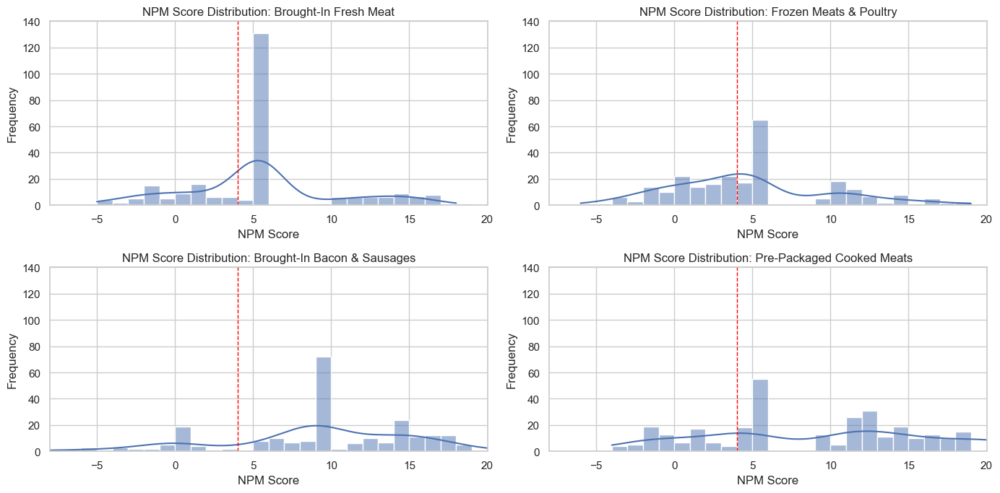

In [296]:
categories = ['Brought-In Fresh Meat', 'Frozen Meats & Poultry', 'Brought-In Bacon & Sausages', 'Pre-Packaged Cooked Meats']

# Create a 2x2 plot grid for the four categories
fig, axes = plt.subplots(2, 2, figsize=(14, 7))

bins = range(-10, 20, 1)

# Plot histograms for each category
for i, category in enumerate(categories):
    ax = axes[i // 2, i % 2]
    sns.histplot(df_meat[df_meat['category'] == category]['NPM_score'], kde=True, ax=ax, bins=bins)
    ax.set_title(f'NPM Score Distribution: {category}')
    ax.set_xlabel('NPM Score')
    ax.set_ylabel('Frequency')
    ax.set_xlim(-8, 20)
    ax.set_ylim(0, 140)
    
    # Add a red dashed line at x=0
    ax.axvline(4, color='red', linestyle='--', linewidth=1)

plt.tight_layout()
plt.show()

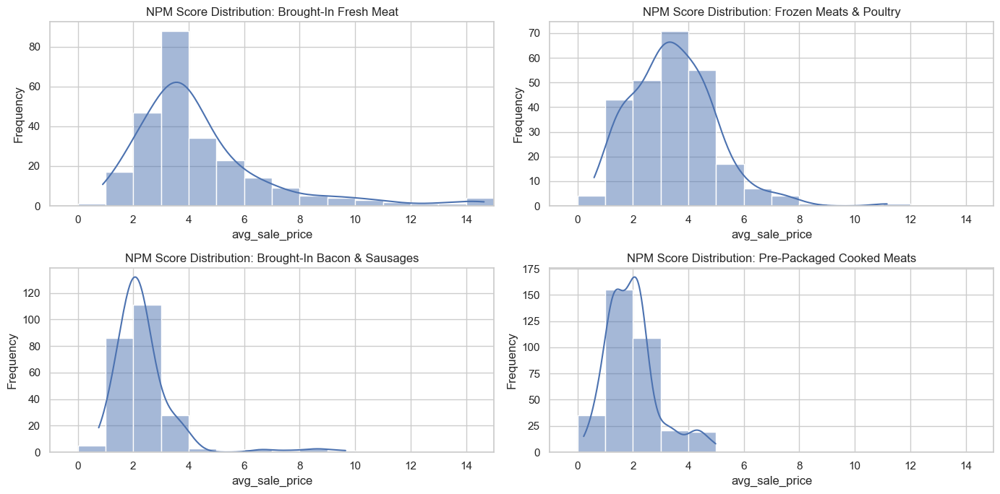

In [297]:
categories = ['Brought-In Fresh Meat', 'Frozen Meats & Poultry', 'Brought-In Bacon & Sausages', 'Pre-Packaged Cooked Meats']

# Create a 2x2 plot grid for the four categories
fig, axes = plt.subplots(2, 2, figsize=(14, 7))

bins = range(-10, 20, 1)

# Plot histograms for each category
for i, category in enumerate(categories):
    ax = axes[i // 2, i % 2]
    sns.histplot(df_meat[df_meat['category'] == category]['avg_sale_price'], kde=True, ax=ax, bins=bins)
    ax.set_title(f'NPM Score Distribution: {category}')
    ax.set_xlabel('avg_sale_price')
    ax.set_ylabel('Frequency')
    ax.set_xlim(-1, 15)
    #ax.set_ylim(0, 140)

plt.tight_layout()
plt.show()

In [298]:
# Print descriptive statistics for NPM_score in each category
for category in categories:
    print(f"Descriptive Statistics for NPM Score - {category}:")
    print(df_meat[df_meat['category'] == category]['NPM_score'].describe())
    print("\n")

Descriptive Statistics for NPM Score - Brought-In Fresh Meat:
count    253.000000
mean       5.352104
std        4.870211
min       -5.000000
25%        3.000000
50%        5.424658
75%        5.424658
max       18.000000
Name: NPM_score, dtype: float64


Descriptive Statistics for NPM Score - Frozen Meats & Poultry:
count    254.000000
mean       4.702142
std        5.100385
min       -6.000000
25%        1.000000
50%        5.000000
75%        5.144000
max       19.000000
Name: NPM_score, dtype: float64


Descriptive Statistics for NPM Score - Brought-In Bacon & Sausages:
count    240.000000
mean       8.993362
std        5.927442
min       -9.000000
25%        6.000000
50%        9.050847
75%       14.000000
max       20.000000
Name: NPM_score, dtype: float64


Descriptive Statistics for NPM Score - Pre-Packaged Cooked Meats:
count    339.000000
mean       9.207624
std        7.206022
min       -4.000000
25%        4.000000
50%       11.000000
75%       14.500000
max       22.000000

In [299]:
# Print descriptive statistics for NPM_score in each category
for category in categories:
    print(f"Descriptive Statistics for NPM Score - {category}:")
    print(df_meat[df_meat['category'] == category]['avg_sale_price'].describe())
    print("\n")

Descriptive Statistics for NPM Score - Brought-In Fresh Meat:
count    253.000000
mean       4.378829
std        2.455938
min        0.896329
25%        2.958177
50%        3.719250
75%        5.083556
max       14.645449
Name: avg_sale_price, dtype: float64


Descriptive Statistics for NPM Score - Frozen Meats & Poultry:
count    254.000000
mean       3.454555
std        1.520224
min        0.600000
25%        2.392175
50%        3.381049
75%        4.375135
max       11.160976
Name: avg_sale_price, dtype: float64


Descriptive Statistics for NPM Score - Brought-In Bacon & Sausages:
count    240.000000
mean       2.368780
std        1.206826
min        0.753585
25%        1.785571
50%        2.136238
75%        2.582274
max        9.652823
Name: avg_sale_price, dtype: float64


Descriptive Statistics for NPM Score - Pre-Packaged Cooked Meats:
count    339.000000
mean       1.958456
std        0.920085
min        0.225000
25%        1.304469
50%        1.860904
75%        2.290187
max 

In [300]:
# Print descriptive statistics for NPM_score in each category
for category in categories:
    print(f"Descriptive Statistics for NPM Score - {category}:")
    print(df_meat[df_meat['category'] == category]['total_quantity'].describe())
    print("\n")

Descriptive Statistics for NPM Score - Brought-In Fresh Meat:
count      253.000000
mean       410.818182
std        931.929151
min          2.000000
25%         51.000000
50%        130.000000
75%        406.000000
max      11563.000000
Name: total_quantity, dtype: float64


Descriptive Statistics for NPM Score - Frozen Meats & Poultry:
count     254.000000
mean      232.173228
std       262.606608
min         1.000000
25%        61.250000
50%       144.500000
75%       315.250000
max      1668.000000
Name: total_quantity, dtype: float64


Descriptive Statistics for NPM Score - Brought-In Bacon & Sausages:
count      240.000000
mean       442.025000
std       1122.871736
min          1.000000
25%         29.750000
50%        101.500000
75%        374.250000
max      11004.000000
Name: total_quantity, dtype: float64


Descriptive Statistics for NPM Score - Pre-Packaged Cooked Meats:
count     339.000000
mean      582.731563
std       789.260594
min         1.000000
25%       112.000000

<br>

**Hypotheses**:  
**1. Is Healthy Food More Expensive?**  
**2. Do Healthy Foods Receive More Discounts?**  

**1. Is Healthy Food More Expensive?**

In [301]:
df_hypotheses = df_product_food_all_score.copy()

In [302]:
df_hypotheses = df_hypotheses.merge(product_purchase_summary, on='prod_id')

In [303]:
df_hypotheses.head(3)

,prod_id,prod_disp_nm,brand_nm,category,nutrition_dict,nutrition_cate,is_food,NPM_score,is_healthy,standardised_NPM,total_quantity,purchase_occurrences,avg_sale_amount,avg_offer_discount,avg_sale_price,avg_dis_perc
0,5344717,Sugar Free Paradise Punch Cans,Tango,Non-alcoholic Beverages,"{'carbohydrate': 0, 'energy': 3.0, 'fat': 0, '...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 1, 'Sou...",0,0.0,1.0,-0.529,23,23,3.320435,0.0,3.320435,0.0
1,5340295,True Colours Rainbow Party Traybake,The BAKERY at ASDA,Chilled Cakes,"{'carbohydrate': 65.0, 'energy': 388.0, 'fat':...","{'Halal': 0, 'Vegetarian': 0, 'Vegan': 0, 'Sou...",1,16.0,0.0,1.049,3,3,8.000000,0.0,8.000000,0.0
2,4958368,Olive Sourdough Bloomer,ASDA Extra Special,In-Store Bakery & Snacks,"{'carbohydrate': 42.0, 'energy': 245.0, 'fat':...","{'Halal': 0, 'Vegetarian': 1, 'Vegan': 0, 'Sou...",1,2.0,1.0,-0.722,48,48,1.161875,0.0,1.161875,0.0


In [304]:
# Conducting a t-test or Mann-Whitney U test
healthy_prices = df_hypotheses[df_hypotheses['is_healthy'] == 1]['avg_sale_price']
unhealthy_prices = df_hypotheses[df_merged['is_healthy'] == 0]['avg_sale_price']

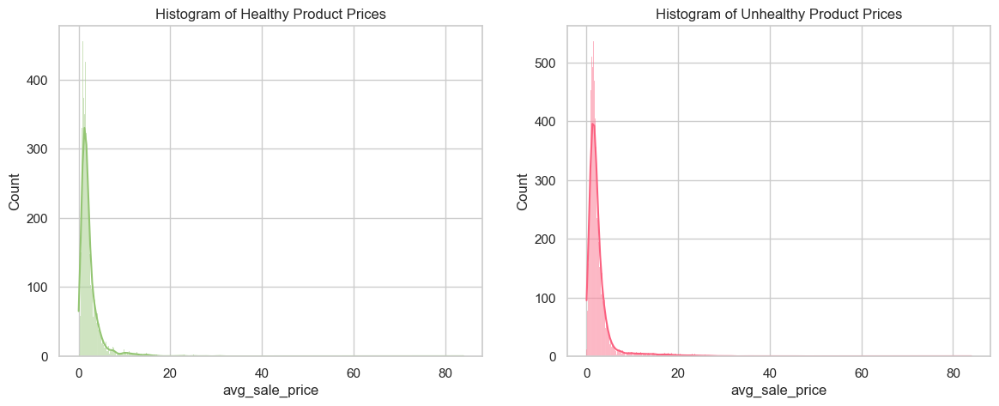

In [305]:
# 1. Visual Inspection
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.histplot(healthy_prices, kde=True, color='#93c572')
plt.title('Histogram of Healthy Product Prices')

plt.subplot(1, 2, 2)
sns.histplot(unhealthy_prices, kde=True, color='#fb607f')
plt.title('Histogram of Unhealthy Product Prices')

plt.show()

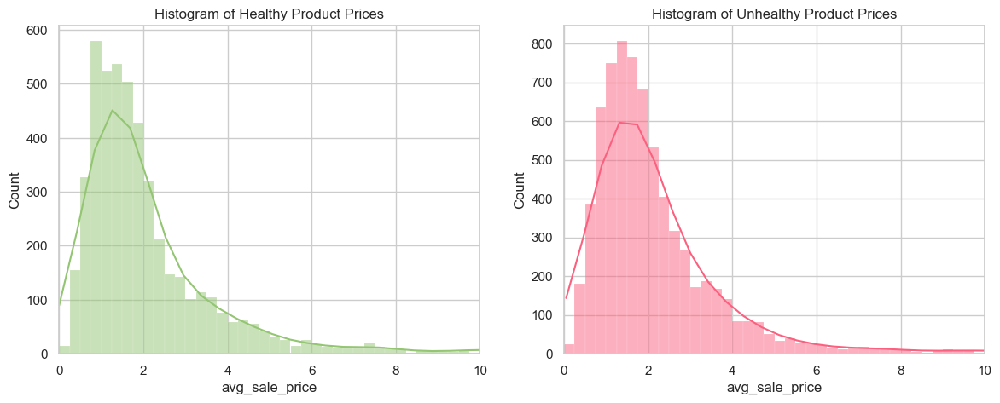

In [306]:
plt.figure(figsize=(14, 5))

# Define the bins from 0 to 20 with a step size of 0.5
bins = np.arange(0, 10, 0.25)

# Histogram for Healthy Product Prices
plt.subplot(1, 2, 1)
sns.histplot(healthy_prices, bins=bins, kde=True, color='#93c572')
plt.title('Histogram of Healthy Product Prices')
plt.xlim(0, 10)  # Set x-axis range from 0 to 20

# Histogram for Unhealthy Product Prices
plt.subplot(1, 2, 2)
sns.histplot(unhealthy_prices, bins=bins, kde=True, color='#fb607f')
plt.title('Histogram of Unhealthy Product Prices')
plt.xlim(0, 10)  # Set x-axis range from 0 to 20

plt.show()

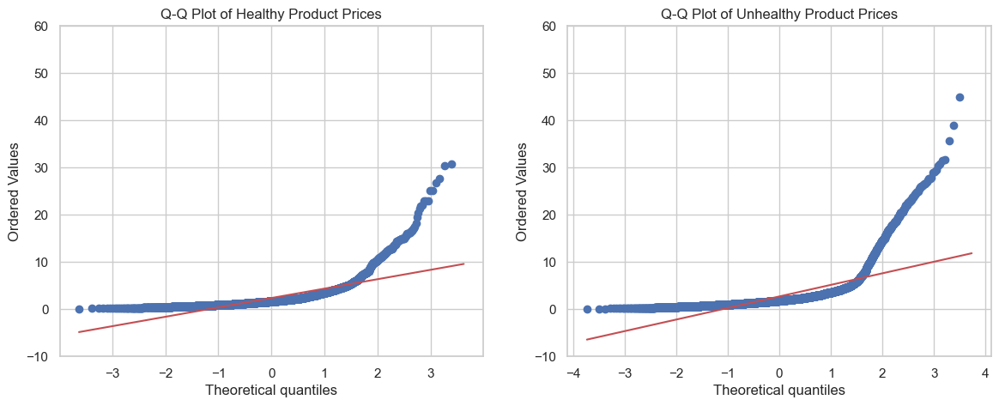

In [307]:
# Q-Q Plot
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
stats.probplot(healthy_prices, dist="norm", plot=plt)
plt.ylim(-10, 60)
plt.title('Q-Q Plot of Healthy Product Prices')

plt.subplot(1, 2, 2)
stats.probplot(unhealthy_prices, dist="norm", plot=plt)
plt.ylim(-10, 60)
plt.title('Q-Q Plot of Unhealthy Product Prices')

plt.show()

In [308]:
# 2. Shapiro-Wilk Test
shapiro_healthy = stats.shapiro(healthy_prices)
shapiro_unhealthy = stats.shapiro(unhealthy_prices)

print("Shapiro-Wilk Test for Healthy Product Prices:", shapiro_healthy)
print("Shapiro-Wilk Test for Unhealthy Product Prices:", shapiro_unhealthy)

Shapiro-Wilk Test for Healthy Product Prices: ShapiroResult(statistic=0.5229412317276001, pvalue=0.0)
Shapiro-Wilk Test for Unhealthy Product Prices: ShapiroResult(statistic=0.49120330810546875, pvalue=0.0)


C:\Users\USER\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


The Shapiro-Wilk test results for both healthy and unhealthy product prices have p-values of 0.0. This strongly rejects the null hypothesis that the data is normally distributed, confirming that **neither distribution follows a normal pattern**.

In [309]:
# T-test
t_stat, p_value = ttest_ind(healthy_prices, unhealthy_prices, equal_var=False)  # Use equal_var=False if variances are not assumed to be equal
print(f"T-test results -- Statistic: {t_stat}, P-value: {p_value}")

# Mann-Whitney U Test
u_stat, p_value_u = mannwhitneyu(healthy_prices, unhealthy_prices)
print(f"Mann-Whitney U test results -- Statistic: {u_stat}, P-value: {p_value_u}")

T-test results -- Statistic: -5.851672926524693, P-value: 4.995253566270012e-09
Mann-Whitney U test results -- Statistic: 16507480.0, P-value: 4.157490699754916e-12


In [310]:
# Print descriptive statistics for healthy and unhealthy prices
print("Descriptive Statistics for Healthy Product Prices:")
print(healthy_prices.describe())

print("\nDescriptive Statistics for Unhealthy Product Prices:")
print(unhealthy_prices.describe())

Descriptive Statistics for Healthy Product Prices:
count    4874.000000
mean        2.362452
std         2.753713
min         0.000000
25%         1.066502
50%         1.638794
75%         2.577048
max        84.000000
Name: avg_sale_price, dtype: float64

Descriptive Statistics for Unhealthy Product Prices:
count    7315.000000
mean        2.694899
std         3.497076
min         0.050000
25%         1.206254
50%         1.788017
75%         2.752572
max        84.000000
Name: avg_sale_price, dtype: float64


The T-test was not suitable for this analysis because the data did not have a normal distribution, as confirmed by the Shapiro-Wilk test (p < 0.05 for both healthy and unhealthy food prices). As a result, **the Mann-Whitney U test was used to compare the price distributions of healthy and unhealthy foods**. Despite the mean prices being relatively close (£2.36 for healthy foods and £2.69 for unhealthy foods), the Mann-Whitney U test revealed **a statistically significant difference in the overall price distributions** (p < 0.05).

This shows that, even though the average prices seem similar, there is a significant difference in the underlying distribution of prices between healthy and unhealthy foods. This variation could be due to **higher-priced items in the unhealthy food category**.

<br>

**2. Do Healthy Foods Receive More Discounts?**

In [311]:
# 1. Descriptive Statistics
healthy_discounts = df_hypotheses[df_hypotheses['is_healthy'] == 1]['avg_dis_perc']
unhealthy_discounts = df_hypotheses[df_hypotheses['is_healthy'] == 0]['avg_dis_perc']

In [312]:
print("Healthy Food Discounts:")
print(healthy_discounts.describe())
print("\nUnhealthy Food Discounts:")
print(unhealthy_discounts.describe())

Healthy Food Discounts:
count    4874.000000
mean        0.050300
std         0.106352
min         0.000000
25%         0.000000
50%         0.000000
75%         0.037146
max         1.000000
Name: avg_dis_perc, dtype: float64

Unhealthy Food Discounts:
count    7315.000000
mean        0.025648
std         0.074243
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.905726
Name: avg_dis_perc, dtype: float64


**Healthy foods receive slightly larger average discounts** (-0.1034) compared to unhealthy foods (-0.0417). The discounts on **healthy foods are also more variable** (standard deviation 0.3177 vs. 0.1205 for unhealthy foods).

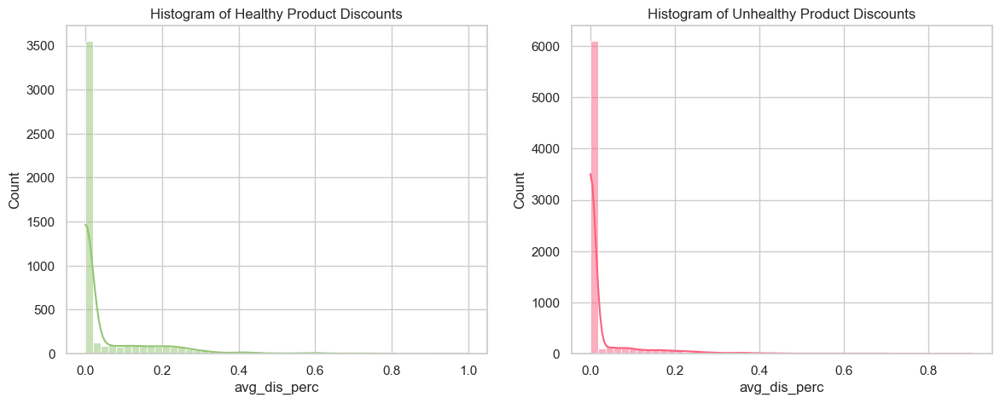

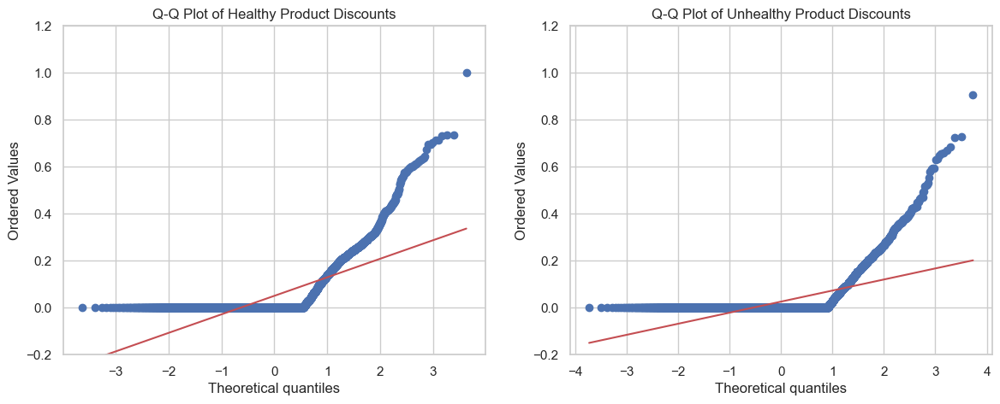

In [313]:
# Histogram Plot
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
sns.histplot(healthy_discounts, kde=True, bins=50, color='#93c572')
plt.title('Histogram of Healthy Product Discounts')
plt.subplot(1, 2, 2)
sns.histplot(unhealthy_discounts, kde=True, bins=50, color='#fb607f')
plt.title('Histogram of Unhealthy Product Discounts')
plt.show()

# Q-Q Plot
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
stats.probplot(healthy_discounts, dist="norm", plot=plt)
plt.ylim(-0.2, 1.2)
plt.title('Q-Q Plot of Healthy Product Discounts')

plt.subplot(1, 2, 2)
stats.probplot(unhealthy_discounts, dist="norm", plot=plt)
plt.ylim(-0.2, 1.2)
plt.title('Q-Q Plot of Unhealthy Product Discounts')

plt.show()

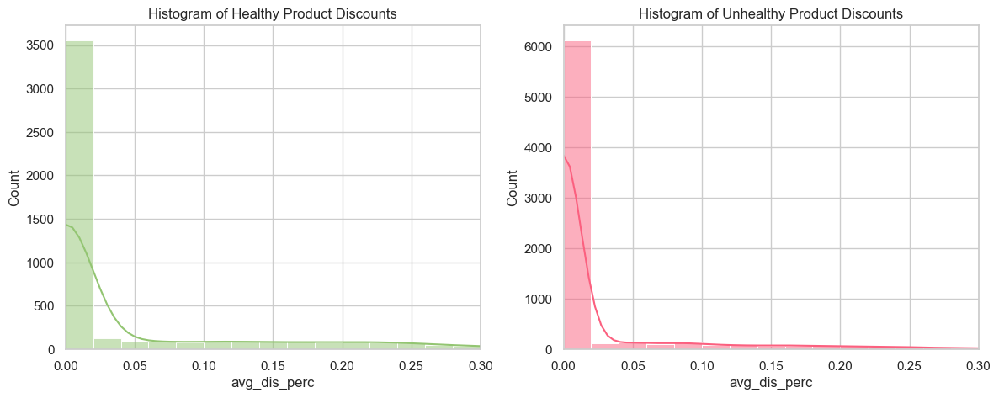

In [314]:
# Histogram Plot
plt.figure(figsize=(14, 5))

# Define custom bins from 0 to 0.3 with an interval of 0.05
bins = np.arange(0, 0.4, 0.02)

# Healthy Product Discounts
plt.subplot(1, 2, 1)
sns.histplot(healthy_discounts, kde=True, bins=bins, color='#93c572')
plt.title('Histogram of Healthy Product Discounts')
plt.xlim(0, 0.3)  # Set X-axis range from 0 to 0.3

# Unhealthy Product Discounts
plt.subplot(1, 2, 2)
sns.histplot(unhealthy_discounts, kde=True, bins=bins, color='#fb607f')
plt.title('Histogram of Unhealthy Product Discounts')
plt.xlim(0, 0.3)  # Set X-axis range from 0 to 0.3

plt.show()

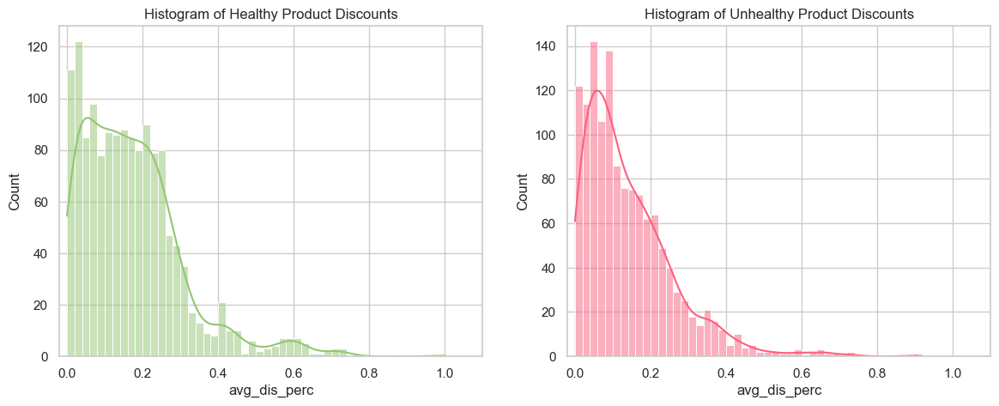

In [315]:
# Remove data with discount of 0
healthy_discounts_nonzero = healthy_discounts[healthy_discounts > 0]
unhealthy_discounts_nonzero = unhealthy_discounts[unhealthy_discounts > 0]

bins = np.arange(0, 1, 0.02)

# Histogram Plot
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.histplot(healthy_discounts_nonzero, kde=True, bins=bins, color='#93c572')
plt.title('Histogram of Healthy Product Discounts')
plt.xlim(-0.02, 1.1)

plt.subplot(1, 2, 2)
sns.histplot(unhealthy_discounts_nonzero, kde=True, bins=bins, color='#fb607f')
plt.title('Histogram of Unhealthy Product Discounts')
plt.xlim(-0.02, 1.1)

plt.show()

In [316]:
# Generate descriptive statistics for the non-zero discount percentages
healthy_discounts_nonzero_stats = healthy_discounts_nonzero.describe()
unhealthy_discounts_nonzero_stats = unhealthy_discounts_nonzero.describe()

# Print the descriptive statistics
print("Descriptive Statistics for Healthy Product Discounts (Non-Zero):")
print(healthy_discounts_nonzero_stats)

print("\nDescriptive Statistics for Unhealthy Product Discounts (Non-Zero):")
print(unhealthy_discounts_nonzero_stats)

Descriptive Statistics for Healthy Product Discounts (Non-Zero):
count    1435.000000
mean        0.170844
std         0.133520
min         0.000026
25%         0.068396
50%         0.150028
75%         0.236137
max         1.000000
Name: avg_dis_perc, dtype: float64

Descriptive Statistics for Unhealthy Product Discounts (Non-Zero):
count    1327.000000
mean        0.141381
std         0.118443
min         0.000229
25%         0.053480
50%         0.109959
75%         0.200459
max         0.905726
Name: avg_dis_perc, dtype: float64


In [317]:
# Shapiro-Wilk Test for Normality
shapiro_healthy_discount = stats.shapiro(healthy_discounts)
shapiro_unhealthy_discount = stats.shapiro(unhealthy_discounts)

print("Shapiro-Wilk Test for Healthy Product Discounts:", shapiro_healthy_discount)
print("Shapiro-Wilk Test for Unhealthy Product Discounts:", shapiro_unhealthy_discount)


Shapiro-Wilk Test for Healthy Product Discounts: ShapiroResult(statistic=0.5497859716415405, pvalue=0.0)
Shapiro-Wilk Test for Unhealthy Product Discounts: ShapiroResult(statistic=0.4023171663284302, pvalue=0.0)


C:\Users\USER\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Shapiro-Wilk Test:

The Shapiro-Wilk test for **both healthy and unhealthy product discounts shows that the data is not normally distributed** (p-value = 0.0). This justifies using a non-parametric test, such as the Mann-Whitney U test, to compare the distributions.

In [318]:
# Mann-Whitney U Test
u_stat, p_value_u = mannwhitneyu(healthy_discounts, unhealthy_discounts)
print(f"Mann-Whitney U test results -- Statistic: {u_stat}, P-value: {p_value_u}")

Mann-Whitney U test results -- Statistic: 19974679.0, P-value: 1.7167400211655713e-53


The analysis indicates that **healthy foods usually receive larger discounts compared to unhealthy foods**, as shown by the higher average discount and the significant difference between the two groups. While healthy foods generally receive larger discounts on average, there is a greater variability in these discounts, meaning that **some healthy foods may receive substantial discounts while others may not receive any at all**. This uneven distribution of discounts could impact consumer perceptions and behaviors, potentially affecting the affordability of healthier dietary options.

<br>

### 2. Shopping Patterns at ASDA Morley Store

From 1 January to 31 May 2023, the ASDA Morley store processed a total of 372,967 transactions focusing exclusively on food and drink items. In this analysis, **a 'basket' refers to a transaction with the same basket ID, purchased by a single customer, representing one shopping session at the store.**  

__Essential Metrics to Analyse Customer Behaviour at ASDA Morley__:
 
- **Typical Spending per Visit**: Investigate the average amount customers spend each time they shop.
- **Average Items per Basket**: Quantify the typical number of items customers buy in a single visit.
- **Standardised NPM Score Distribution**: Assess the overall healthiness of customer baskets based on the NPM score.
score.
- **Usage of Discounts**: Examine how often discounts influence customer purchases and their overall impact.

Standardised NPM Score Distribution: Assess the overall healthiness of customer baskets based on the NPM score.

This analysis aims to characterise and understand customer shopping behaviors at the ASDA Morley store through descriptive statistics and visualizations.

<br>

In [319]:
df_basket = pd.read_csv(r'Results\Dataset\dataset2_basket.csv')
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


In [320]:
df_basket.columns

Index(['basket_id', 'total_spend', 'total_discounts', 'product_count',
       'has_linksave', 'total_NPM_stand_score', 'healthy_count',
       'unhealthy_count', 'healthy_spend', 'unhealthy_spend', 'sale_price',
       'discount_%', 'NPM_per_prod', 'healthy_count_%', 'healthy_spend_%',
       'is_healthy', 'Assorted Snacks', 'Baking Supplies & Desserts',
       'Beers & Ales', 'Beverages & Sweeteners', 'Breakfast Cereals',
       'Brought-In Bacon & Sausages', 'Brought-In Fish',
       'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
       'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
       'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
       'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
       'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
       'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
       'Non-alcoholic Beverages', 'Pre-Packaged Cheeses',
       'Pre-Packaged Cooked Meats', '

- **Typical Spending per Visit**: Investigate the average amount customers spend each time they shop.

In [321]:
print('-------------------Total Spend-------------------')
print(df_basket['total_spend'].describe())

-------------------Total Spend-------------------
count    372967.000000
mean         23.032428
std          25.251482
min           0.040000
25%           5.140000
50%          13.800000
75%          32.490000
max         965.000000
Name: total_spend, dtype: float64


In [322]:
# Calculate the total spend per basket
total_spending_per_basket = df_basket.groupby('basket_id')['sale_price'].sum()

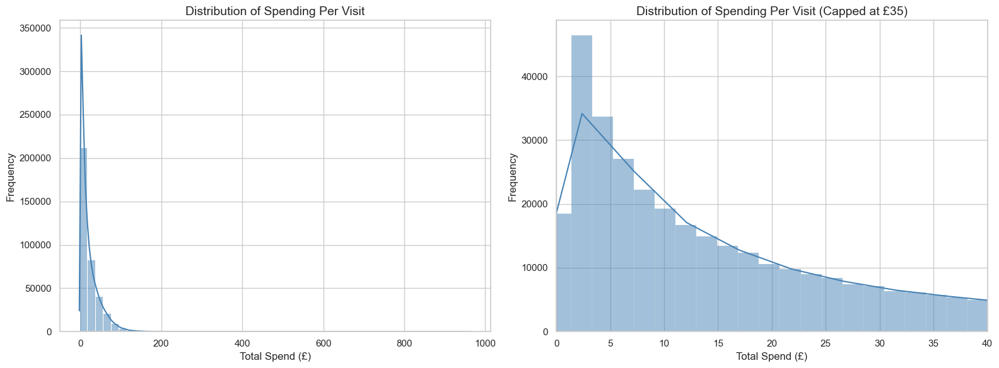

In [323]:
# Plotting the distribution of spending per visit on two scales
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# First plot for the complete distribution
sns.histplot(total_spending_per_basket, bins=50, color='#4682b4', kde=True, ax=axes[0])
axes[0].set_title('Distribution of Spending Per Visit', fontsize=14)
axes[0].set_xlabel('Total Spend (£)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].grid(True)

# Second plot with x-axis limited to 0 to £35
sns.histplot(total_spending_per_basket, bins=500, color='#4682b4', kde=True, ax=axes[1])
axes[1].set_title('Distribution of Spending Per Visit (Capped at £35)', fontsize=14)
axes[1].set_xlabel('Total Spend (£)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].grid(True)
axes[1].set_xlim(0, 40)

# Display the plot
plt.tight_layout()
plt.show()

##### Comparing Spending on Healthy vs. Unhealthy Baskets

In [324]:
print('-------------------Healthy Spend-------------------')
print(df_basket['healthy_spend'].describe())
print('-------------------Unhealthy Spend-------------------')
print(df_basket['unhealthy_spend'].describe())

-------------------Healthy Spend-------------------
count    372967.000000
mean         11.113753
std          13.577814
min           0.000000
25%           1.970000
50%           6.040000
75%          15.790000
max         965.000000
Name: healthy_spend, dtype: float64
-------------------Unhealthy Spend-------------------
count    372967.000000
mean         10.920385
std          13.373530
min           0.000000
25%           1.710000
50%           6.000000
75%          15.450000
max         226.750000
Name: unhealthy_spend, dtype: float64


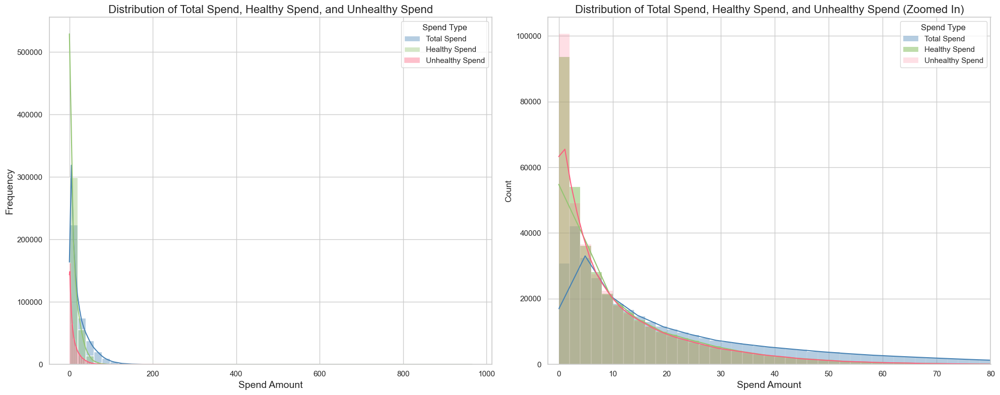

In [325]:
# Set up the figure and axes for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Histogram settings
bin_settings_total_healthy = np.arange(0, 1001, 2)  # Bins from £0 to £1000 with £10 width
bin_settings_unhealthy = np.arange(0, 251, 2)        # Bins from £0 to £250 with £5 width

# Create the histogram for total spend on the first plot
sns.histplot(data=df_basket, x='total_spend', bins=50, kde=True, color='#4682b4', alpha=0.4, label='Total Spend', ax=axes[0])
sns.histplot(data=df_basket, x='healthy_spend', bins=50, kde=True, color='#93c572', alpha=0.4, label='Healthy Spend', ax=axes[0])
sns.histplot(data=df_basket, x='unhealthy_spend', bins=50, kde=True, color='#fb607f', alpha=0.4, label='Unhealthy Spend', ax=axes[0])

# Create the histogram for total spend on the second plot with limited X-axis
sns.histplot(data=df_basket, x='total_spend', bins=bin_settings_total_healthy, kde=True, color='#4682b4', alpha=0.4, label='Total Spend', ax=axes[1])
sns.histplot(data=df_basket, x='healthy_spend', bins=bin_settings_total_healthy, kde=True, color='#93c572', alpha=0.6, label='Healthy Spend', ax=axes[1])
sns.histplot(data=df_basket, x='unhealthy_spend', bins=bin_settings_unhealthy, kde=True, color='#fb607f', alpha=0.2, label='Unhealthy Spend', ax=axes[1])

# Add titles and labels for the plots
axes[0].set_title('Distribution of Total Spend, Healthy Spend, and Unhealthy Spend', fontsize=16)
axes[0].set_xlabel('Spend Amount', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)
axes[0].legend(title='Spend Type')
axes[0].grid(True)

axes[1].set_title('Distribution of Total Spend, Healthy Spend, and Unhealthy Spend (Zoomed In)', fontsize=16)
axes[1].set_xlabel('Spend Amount', fontsize=14)
axes[1].legend(title='Spend Type', title_fontsize='12', loc='upper right')
axes[1].grid(True)
axes[1].set_xlim(-2, 80)

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

The analysis of customer spending at the ASDA Morley store reveals that the average basket spend is £23.03, with similar amounts spent on healthy (£11.11) and unhealthy (£10.92) items. This suggests **a balanced expenditure pattern**. The spending distributions for both categories are comparable, typically peaking below £6.

<br>

- **Average Items per Basket**: Quantify the typical number of items customers buy in a single visit.

In [326]:
# Print descriptive statistics for product counts
print('-------------------Total Product Count-------------------')
print(df_basket['product_count'].describe())
print('-------------------Healthy Product Count-------------------')
print(df_basket['healthy_count'].describe())
print('-------------------Unhealthy Product Count-------------------')
print(df_basket['unhealthy_count'].describe())

-------------------Total Product Count-------------------
count    372967.000000
mean         13.137119
std          14.260906
min           1.000000
25%           3.000000
50%           8.000000
75%          18.000000
max         197.000000
Name: product_count, dtype: float64
-------------------Healthy Product Count-------------------
count    372967.000000
mean          6.958020
std           8.080456
min           0.000000
25%           1.000000
50%           4.000000
75%          10.000000
max         128.000000
Name: healthy_count, dtype: float64
-------------------Unhealthy Product Count-------------------
count    372967.000000
mean          6.097585
std           7.389270
min           0.000000
25%           1.000000
50%           3.000000
75%           9.000000
max         192.000000
Name: unhealthy_count, dtype: float64


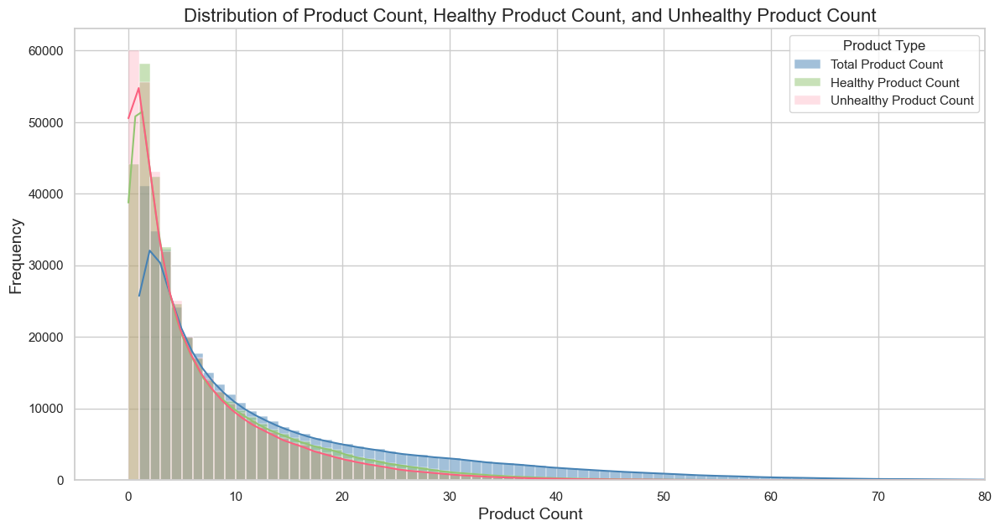

In [327]:
# Set up the figure and axes
plt.figure(figsize=(14, 7))

# Create the histogram for total product count
sns.histplot(data=df_basket, x='product_count', bins=range(0, 201, 1), kde=True, color='#4682b4', alpha=0.5, label='Total Product Count')

# Create the histogram for healthy product count
sns.histplot(data=df_basket, x='healthy_count', bins=range(0, 201, 1), kde=True, color='#93c572', alpha=0.5, label='Healthy Product Count')

# Create the histogram for unhealthy product count
sns.histplot(data=df_basket, x='unhealthy_count', bins=range(0, 201, 1), kde=True, color='#fb607f', alpha=0.2, label='Unhealthy Product Count')

# Add titles and labels
plt.title('Distribution of Product Count, Healthy Product Count, and Unhealthy Product Count', fontsize=16)
plt.xlabel('Product Count', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Limit the X-axis to remove extreme values
plt.xlim(-5, 80)

# Show the legend
plt.legend(title='Product Type', title_fontsize='12', loc='upper right')

# Show the plot
plt.grid(True)
plt.show()

**The distributions of healthy and unhealthy product counts in baskets are similar**. On average, each basket contains 13 products, with 7 being healthy and 6 unhealthy.

Both categories **peak for small quantities**, especially below five items per basket. An interesting difference is seen at a product count of one, where purchases of unhealthy products outnumber healthy ones. This suggests that **customers who buy only one item are more likely to choose an unhealthy product**.

<br>

- **Standardised NPM Score Distribution**: Assess the overall healthiness of customer baskets based on the NPM score.

In [328]:
print(df_basket['total_NPM_stand_score'].describe())

count    372967.000000
mean         -3.987143
std           8.550516
min        -121.189000
25%          -6.507000
50%          -1.587000
75%           0.346000
max         206.558000
Name: total_NPM_stand_score, dtype: float64


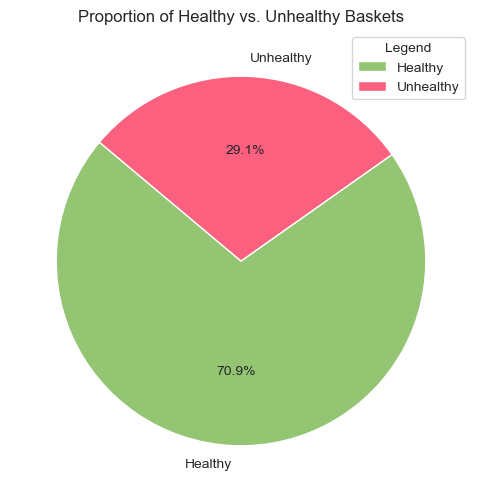

In [329]:
# Count the number of healthy and unhealthy baskets
basket_counts = df_basket['is_healthy'].value_counts()

# Set up the figure for the pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart and store the returned 'patches' for the legend
patches, texts, autotexts = plt.pie(basket_counts, labels=['Healthy', 'Unhealthy'], autopct='%1.1f%%', startangle=140, colors=['#93c572', '#fb607f'])

# Add a title with a specified font size
plt.title('Proportion of Healthy vs. Unhealthy Baskets', fontsize=12)

# Customize the font size for labels and percentage texts
for text in texts + autotexts:
    text.set_fontsize(10)

# Add a legend with a custom font size
plt.legend(patches, ['Healthy', 'Unhealthy'], title='Legend', fontsize=10, title_fontsize=10)

# Show the plot
plt.show()

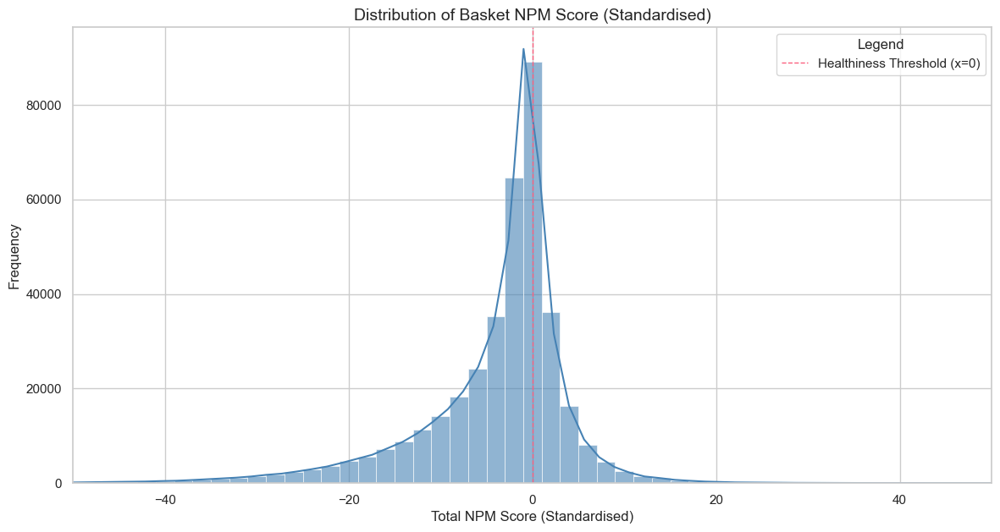

In [330]:
# Set up the figure and axes
plt.figure(figsize=(14, 7))

# Create the histogram for NPM score
sns.histplot(data=df_basket, x='total_NPM_stand_score', bins=range(-125, 210, 2), kde=True, color='#4682b4', alpha=0.6)

# Add titles and labels
plt.title('Distribution of Basket NPM Score (Standardised)', fontsize=14)
plt.xlabel('Total NPM Score (Standardised)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Limit the X-axis to remove extreme values
plt.xlim(-50, 50)

# Add a red dashed line at x=0
plt.axvline(x=0, color='#fb607f', linestyle='--', linewidth=1, label='Healthiness Threshold (x=0)')

# Show the plot
plt.grid(True)
plt.legend(title='Legend')
plt.show()

The distribution of Basket NPM scores is mainly centered around zero, suggesting a balance between healthy and unhealthy product choices among customers. However, the histogram shows a slight skew to the left, indicating that overall, more baskets tend to be healthier.

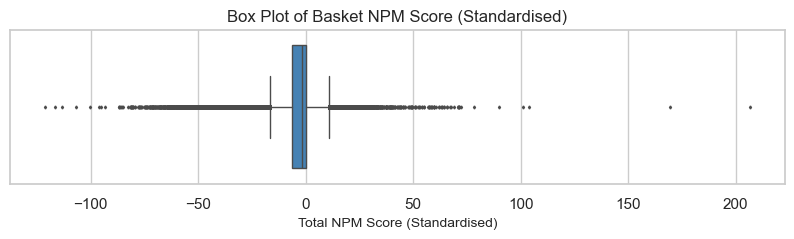

In [331]:
# Set the style of the plot (optional, for a cleaner look)
sns.set(style="whitegrid")

# Set up the figure and axes
plt.figure(figsize=(10, 2))

# Create the box plot for NPM score
sns.boxplot(data=df_basket, x='total_NPM_stand_score', color='#4682b4', 
            fliersize=1.5, linewidth=1, saturation=5)

# Add titles and labels
plt.title('Box Plot of Basket NPM Score (Standardised)', fontsize=12)
plt.xlabel('Total NPM Score (Standardised)', fontsize=10)

# Show the plot
plt.show()

The standardized Basket NPM scores' box plot indicates that most baskets are neutral in healthiness, with a median near zero. The narrow interquartile range suggests **consistent healthiness in most purchases, with limited variation**. There are more outliers on the unhealthy side, indicating occasional significantly skewed purchases towards less healthy choices. These outliers suggest **greater variability in extremely unhealthy purchases** compared to healthy ones.

<br>

- **Usage of Discounts**: Examine how often discounts influence customer purchases and their overall impact.

In [332]:
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


In [333]:
df_basket['discount_%'].describe()

count    372967.000000
mean         -0.037903
std           0.080606
min          -1.548673
25%          -0.041667
50%           0.000000
75%           0.000000
max           0.571734
Name: discount_%, dtype: float64

In [334]:
# Filter to keep only data within the specified range
filtered_discounts = df_basket[(df_basket['discount_%'] >= -1) & (df_basket['discount_%'] <= 0)]
print(len(df_basket))
print(len(filtered_discounts))

372967
372952


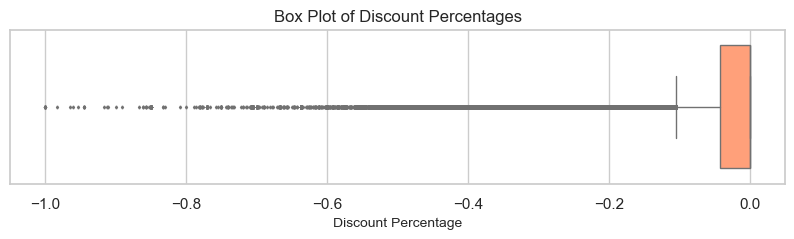

In [335]:
# Set the style of the plot (optional, for a cleaner look)
sns.set(style="whitegrid")

# Set up the figure and axes
plt.figure(figsize=(10, 2))

# Create the box plot for NPM score
sns.boxplot(data=filtered_discounts, x='discount_%', color='#ffa07a', 
            fliersize=1.5, linewidth=1, saturation=5)

# Add titles and labels
plt.title('Box Plot of Discount Percentages', fontsize=12)
plt.xlabel('Discount Percentage', fontsize=10)

# Show the plot
plt.show()

In [336]:
filtered_discounts['discount_%'].describe()

count    372952.000000
mean         -0.037858
std           0.080233
min          -1.000000
25%          -0.041667
50%           0.000000
75%           0.000000
max           0.000000
Name: discount_%, dtype: float64

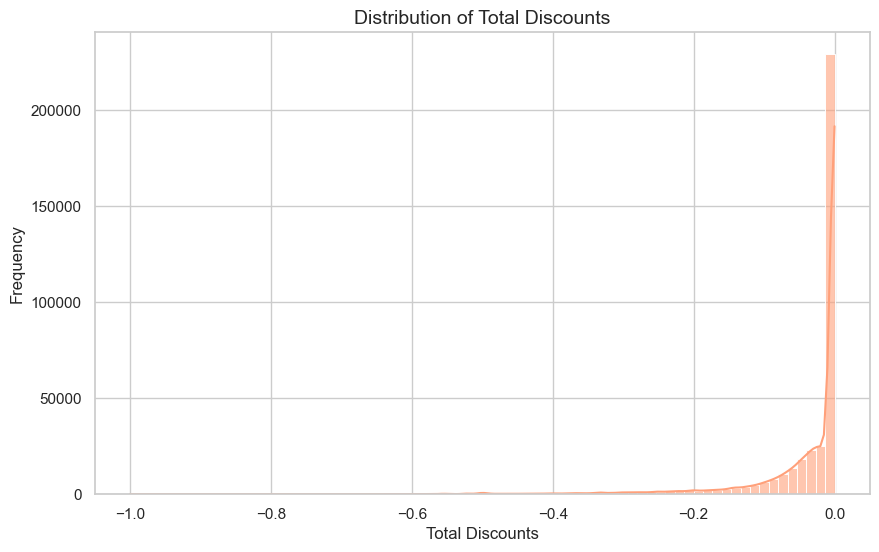

In [337]:
# Set up the figure
plt.figure(figsize=(10, 6))

# Create the histogram for total discounts
sns.histplot(data=filtered_discounts, x='discount_%', bins=75, kde=True, color='#ffa07a', alpha=0.6)

# Add titles and labels
plt.title('Distribution of Total Discounts', fontsize=14)
plt.xlabel('Total Discounts', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add grid lines for better readability
plt.grid(True)

# Show the plot
plt.show()

<br><br>

## 3.4 Data Analysis

##### 1. Interrelations of Spending, Discounts, and Health Scores in Baskets
##### 2. Category Interactions and NPM Score Correlations
##### 3. Analysing Shopping Behavior in Morley Store Through K-Means Clustering
##### 4. Analysing Customer Shopping Patterns Through Basket Clusters
##### 5. Clustering Customers by Basket Behaviour Profiles
##### 6. Clustering Customers by Shopping Frequency
##### 7. Geographical Distribution of Healthy and Unhealthy Customers

<br>

#### 1. Interrelations of Spending, Discounts, and Health Scores in Baskets
This correlation matrix is utilized to examine the intricate connections between consumer spending habits, applied discounts, and health score metrics within the basket data from the Morley Store. It sheds light on how these financial and health-related factors interrelate, offering insights into how discounts affect spending behavior and the potential influence of product healthiness on consumer choices.

In [338]:
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,0,0,0,2023-01-01 10:01:00+00:00,352c54c7-8987-49a3-af37-f9f97a4680f0,1,52,6,2023-01-01,10


In [339]:
# Print the column names
print("Column names:")
print(df_basket.columns)

# Check the data types of each column
print("\nData types:")
print(df_basket.dtypes)

Column names:
Index(['basket_id', 'total_spend', 'total_discounts', 'product_count',
       'has_linksave', 'total_NPM_stand_score', 'healthy_count',
       'unhealthy_count', 'healthy_spend', 'unhealthy_spend', 'sale_price',
       'discount_%', 'NPM_per_prod', 'healthy_count_%', 'healthy_spend_%',
       'is_healthy', 'Assorted Snacks', 'Baking Supplies & Desserts',
       'Beers & Ales', 'Beverages & Sweeteners', 'Breakfast Cereals',
       'Brought-In Bacon & Sausages', 'Brought-In Fish',
       'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
       'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
       'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
       'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
       'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
       'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
       'Non-alcoholic Beverages', 'Pre-Packaged Cheeses',
       'Pre-Packaged Co

In [340]:
df_basket['total_NPM_stand_score'].describe()

count    372967.000000
mean         -3.987143
std           8.550516
min        -121.189000
25%          -6.507000
50%          -1.587000
75%           0.346000
max         206.558000
Name: total_NPM_stand_score, dtype: float64

In [341]:
df_basket_corr = df_basket[['total_spend', 'total_discounts', 'sale_price', 'product_count', 'total_NPM_stand_score',
                            'healthy_count', 'unhealthy_count', 'healthy_spend', 'unhealthy_spend']]
# Calculate the correlation matrix
corr_basket = df_basket_corr.corr()

# Display the correlation matrix
corr_basket

,total_spend,total_discounts,sale_price,product_count,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend
total_spend,1.000000,-0.495670,0.997276,0.902967,-0.425992,0.822574,0.829076,0.884088,0.869105
total_discounts,-0.495670,1.000000,-0.430263,-0.420711,0.206498,-0.394478,-0.376558,-0.533197,-0.375100
sale_price,0.997276,-0.430263,1.000000,0.902788,-0.425227,0.821458,0.829739,0.873615,0.871467
product_count,0.902967,-0.420711,0.902788,1.000000,-0.528715,0.927252,0.912098,0.791029,0.878197
total_NPM_stand_score,-0.425992,0.206498,-0.425227,-0.528715,1.000000,-0.765977,-0.182386,-0.596211,-0.193249
healthy_count,0.822574,-0.394478,0.821458,0.927252,-0.765977,1.000000,0.693907,0.841799,0.682814
unhealthy_count,0.829076,-0.376558,0.829739,0.912098,-0.182386,0.693907,1.000000,0.601593,0.946286
healthy_spend,0.884088,-0.533197,0.873615,0.791029,-0.596211,0.841799,0.601593,1.000000,0.618887
unhealthy_spend,0.869105,-0.375100,0.871467,0.878197,-0.193249,0.682814,0.946286,0.618887,1.000000


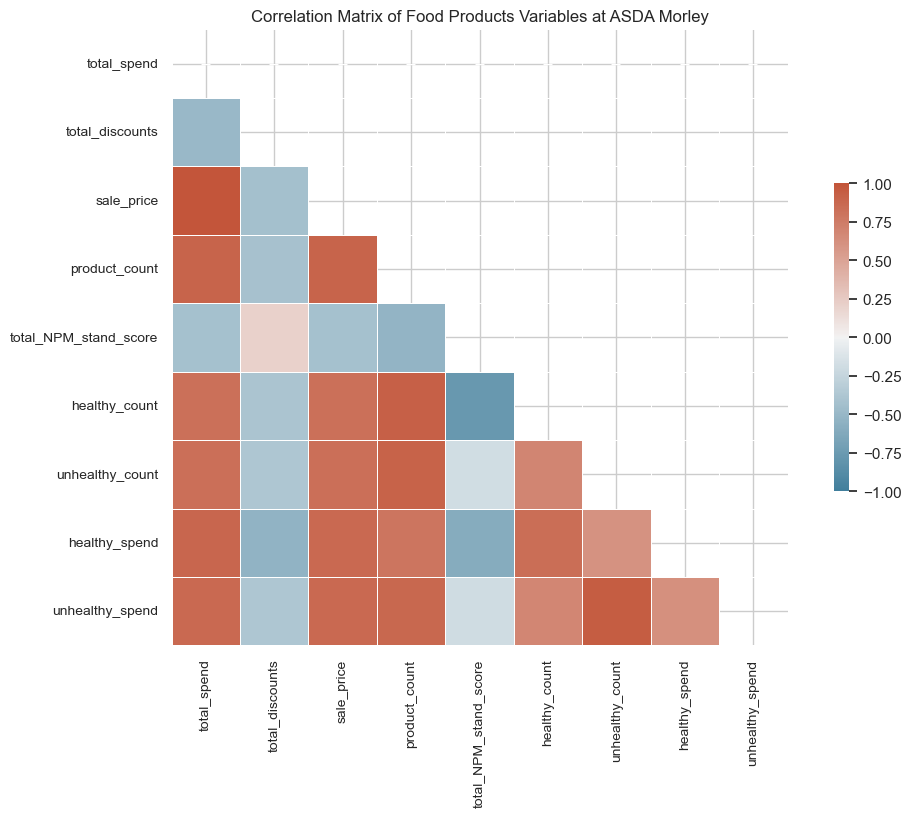

In [342]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_basket, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns_heatmap = sns.heatmap(corr_basket, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                          square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

# Reduce the size of the axis labels
sns_heatmap.set_xticklabels(sns_heatmap.get_xticklabels(), fontsize=10, rotation=90)
sns_heatmap.set_yticklabels(sns_heatmap.get_yticklabels(), fontsize=10)

plt.title("Correlation Matrix of Food Products Variables at ASDA Morley", fontsize=12)

plt.show()

<br>

—  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  — 



<br>

#### 2. Category Interactions and NPM Score Correlations

In [343]:
df_basket.columns

Index(['basket_id', 'total_spend', 'total_discounts', 'product_count',
       'has_linksave', 'total_NPM_stand_score', 'healthy_count',
       'unhealthy_count', 'healthy_spend', 'unhealthy_spend', 'sale_price',
       'discount_%', 'NPM_per_prod', 'healthy_count_%', 'healthy_spend_%',
       'is_healthy', 'Assorted Snacks', 'Baking Supplies & Desserts',
       'Beers & Ales', 'Beverages & Sweeteners', 'Breakfast Cereals',
       'Brought-In Bacon & Sausages', 'Brought-In Fish',
       'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
       'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
       'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
       'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
       'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
       'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
       'Non-alcoholic Beverages', 'Pre-Packaged Cheeses',
       'Pre-Packaged Cooked Meats', '

In [344]:
df_basket_cate_corr = df_basket[['total_NPM_stand_score', 'healthy_count', 'unhealthy_count', 
                                 'Assorted Snacks', 'Baking Supplies & Desserts', 'Beers & Ales', 
                                 'Beverages & Sweeteners', 'Breakfast Cereals', 'Brought-In Bacon & Sausages',
                                 'Brought-In Fish', 'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
                                 'Chips, Potatoes & Vegetables', 'Cookies & Biscuits', 'Cooking Condiments',
                                 'Dairy Products', 'Desserts and Ice Cream', 'Distilled Spirits', 'Fresh Pizza',
                                 'Fresh Potatoes', 'Fresh Salads', 'Fresh Vegetables', 'Frozen Meats & Poultry',
                                 'Grab & Go Foods', 'In-Store Bakery & Snacks', 'In-Store Meat & Poultry', 
                                 'Non-alcoholic Beverages', 'Pre-Packaged Cheeses', 'Pre-Packaged Cooked Meats',
                                 'Pre-Packaged Pies', 'Ready-to-Eat Meals', 'Rice and Pasta', 'Specialty Fruits & Nuts',
                                 'Standard Cakes']]

# Calculate the correlation matrix
corr_basket_cate = df_basket_cate_corr.corr()

# Display the correlation matrix
corr_basket_cate

,total_NPM_stand_score,healthy_count,unhealthy_count,Assorted Snacks,Baking Supplies & Desserts,Beers & Ales,Beverages & Sweeteners,Breakfast Cereals,Brought-In Bacon & Sausages,Brought-In Fish,...,In-Store Bakery & Snacks,In-Store Meat & Poultry,Non-alcoholic Beverages,Pre-Packaged Cheeses,Pre-Packaged Cooked Meats,Pre-Packaged Pies,Ready-to-Eat Meals,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes
total_NPM_stand_score,1.000000,-0.765977,-0.182386,-0.085237,-0.128949,-0.070179,-0.006804,-0.207990,-0.142854,-0.224261,...,-0.083282,0.001867,-0.151725,-0.156286,-0.183813,-0.101951,-0.103184,-0.340455,-0.551150,0.055641
healthy_count,-0.765977,1.000000,0.693907,0.357293,0.296961,0.148598,0.269830,0.391047,0.362156,0.274862,...,0.184253,-0.002130,0.402769,0.466919,0.449997,0.330971,0.264355,0.493033,0.587230,0.084238
unhealthy_count,-0.182386,0.693907,1.000000,0.556464,0.303597,0.050742,0.348110,0.400032,0.440995,0.221605,...,0.204983,-0.001772,0.350918,0.564031,0.536492,0.446858,0.334245,0.460866,0.355610,0.216637
Assorted Snacks,-0.085237,0.357293,0.556464,1.000000,0.099735,0.053381,0.124959,0.207999,0.191580,0.075027,...,0.084137,-0.000360,0.247621,0.256694,0.257321,0.222860,0.151513,0.202296,0.182105,0.095297
Baking Supplies & Desserts,-0.128949,0.296961,0.303597,0.099735,1.000000,-0.004398,0.148174,0.125833,0.092706,0.060265,...,0.048020,-0.001182,0.080921,0.149421,0.110525,0.080713,0.072263,0.122871,0.146266,0.041661
Beers & Ales,-0.070179,0.148598,0.050742,0.053381,-0.004398,1.000000,0.021236,0.004778,0.049915,0.020632,...,0.017116,-0.001056,0.048537,0.033075,0.041145,0.032809,0.014127,0.023860,-0.001826,-0.009030
Beverages & Sweeteners,-0.006804,0.269830,0.348110,0.124959,0.148174,0.021236,1.000000,0.140216,0.134411,0.072923,...,0.053170,-0.001388,0.095567,0.156842,0.145344,0.106634,0.086860,0.140590,0.121626,0.031739
Breakfast Cereals,-0.207990,0.391047,0.400032,0.207999,0.125833,0.004778,0.140216,1.000000,0.146892,0.084489,...,0.069702,-0.001448,0.149547,0.212815,0.199215,0.134788,0.131128,0.194520,0.204498,0.055995
Brought-In Bacon & Sausages,-0.142854,0.362156,0.440995,0.191580,0.092706,0.049915,0.134411,0.146892,1.000000,0.117585,...,0.107230,-0.001519,0.146482,0.239847,0.248844,0.185669,0.121416,0.199086,0.157388,0.045095
Brought-In Fish,-0.224261,0.274862,0.221605,0.075027,0.060265,0.020632,0.072923,0.084489,0.117585,1.000000,...,0.049082,-0.000963,0.056081,0.144077,0.141446,0.104006,0.031125,0.125493,0.174072,0.020727


In [345]:
# Calculate the correlation between 'healthy_count' and other categories
correlation_with_healthy = corr_basket_cate['healthy_count']

# Sort the results by correlation values from high to low
sorted_correlations = correlation_with_healthy.sort_values(ascending=False)

# Output the top 10 sorted correlation values, rounded to two decimal places
print(sorted_correlations.head(10).round(2))
print('---------------------------------------------')
# Output the bottom 10 sorted correlation values, rounded to two decimal places
print(sorted_correlations.tail(10).round(2))

healthy_count              1.00
unhealthy_count            0.69
Fresh Vegetables           0.68
Fresh Salads               0.63
Dairy Products             0.63
Specialty Fruits & Nuts    0.59
Canned Goods & Savories    0.56
Fresh Potatoes             0.52
Rice and Pasta             0.49
Pre-Packaged Cheeses       0.47
Name: healthy_count, dtype: float64
---------------------------------------------
Desserts and Ice Cream      0.22
In-Store Bakery & Snacks    0.18
Beers & Ales                0.15
Chilled Cakes               0.13
Fresh Pizza                 0.12
Standard Cakes              0.08
Distilled Spirits           0.04
In-Store Meat & Poultry    -0.00
Grab & Go Foods            -0.05
total_NPM_stand_score      -0.77
Name: healthy_count, dtype: float64


In [346]:
# Calculate the correlation between 'healthy_count' and other categories
correlation_with_healthy = corr_basket_cate['unhealthy_count']

# Sort the results by correlation values from high to low
sorted_correlations = correlation_with_healthy.sort_values(ascending=False)

# Output the top 10 sorted correlation values, rounded to two decimal places
print(sorted_correlations.head(10).round(2))
print('---------------------------------------------')
# Output the bottom 10 sorted correlation values, rounded to two decimal places
print(sorted_correlations.tail(10).round(2))

unhealthy_count              1.00
healthy_count                0.69
Dairy Products               0.64
Pre-Packaged Cheeses         0.56
Assorted Snacks              0.56
Cookies & Biscuits           0.56
Canned Goods & Savories      0.55
Pre-Packaged Cooked Meats    0.54
Cooking Condiments           0.48
Rice and Pasta               0.46
Name: unhealthy_count, dtype: float64
---------------------------------------------
Desserts and Ice Cream      0.25
Brought-In Fish             0.22
Fresh Pizza                 0.22
Standard Cakes              0.22
In-Store Bakery & Snacks    0.20
Beers & Ales                0.05
Distilled Spirits           0.03
In-Store Meat & Poultry    -0.00
Grab & Go Foods            -0.04
total_NPM_stand_score      -0.18
Name: unhealthy_count, dtype: float64


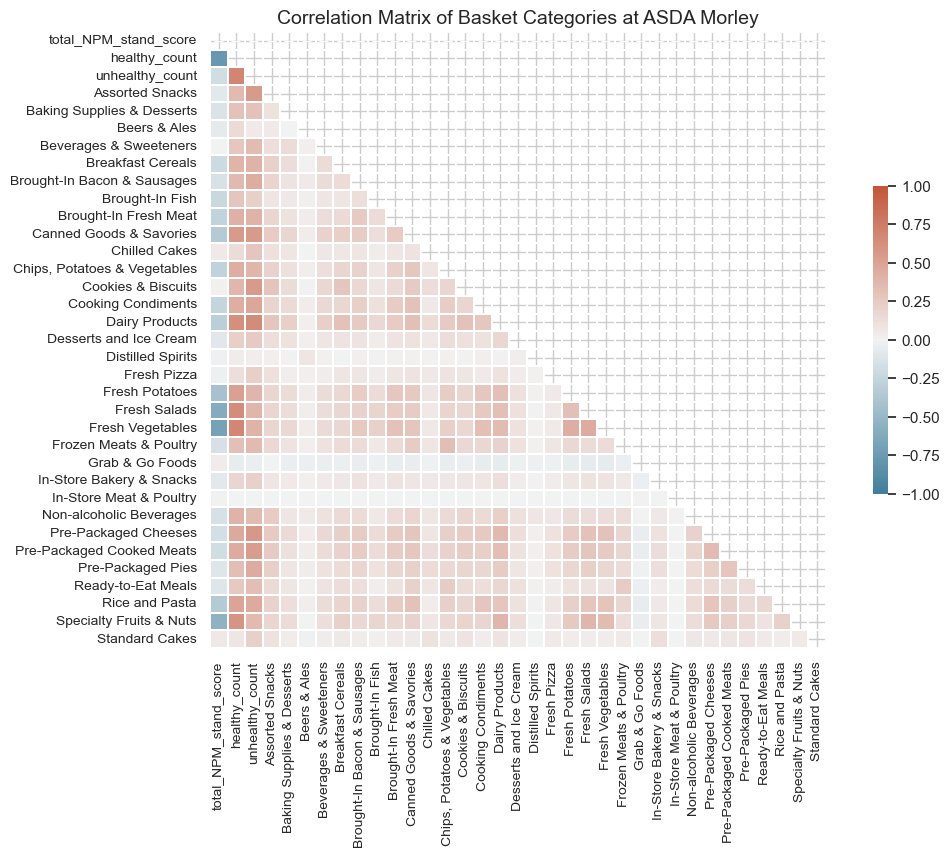

In [347]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_basket_cate, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns_heatmap = sns.heatmap(corr_basket_cate, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                          square=True, linewidths=0.3, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

# Adjust the size and rotation of the axis labels for better readability
sns_heatmap.set_xticklabels(sns_heatmap.get_xticklabels(), fontsize=10, rotation=90)
sns_heatmap.set_yticklabels(sns_heatmap.get_yticklabels(), fontsize=10, rotation=0)

# Title for the heatmap
plt.title("Correlation Matrix of Basket Categories at ASDA Morley", fontsize=14)

plt.show()

In [348]:
# List of categories to examine
categories = [
    'Assorted Snacks', 'Baking Supplies & Desserts', 'Beers & Ales',
    'Beverages & Sweeteners', 'Breakfast Cereals', 'Brought-In Bacon & Sausages',
    'Brought-In Fish', 'Brought-In Fresh Meat', 'Canned Goods & Savories', 
    'Chilled Cakes', 'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
    'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
    'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
    'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
    'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
    'Non-alcoholic Beverages', 'Pre-Packaged Cheeses', 'Pre-Packaged Cooked Meats',
    'Pre-Packaged Pies', 'Ready-to-Eat Meals', 'Rice and Pasta', 
    'Specialty Fruits & Nuts', 'Standard Cakes'
]

# Loop through each category and find the top 5 correlations with other categories
for category in categories:
    # Calculate the correlation with other categories
    correlation_with_category = corr_basket_cate[category]

    # Exclude unwanted columns
    correlation_with_category = correlation_with_category.drop(labels=['unhealthy_count', 'healthy_count', 'total_NPM_stand_score'])

    # Sort the results by correlation values from high to low
    sorted_correlations = correlation_with_category.sort_values(ascending=False)

    # Output the top 5 sorted correlation values, rounded to two decimal places
    print(f"Top correlations for {category}:")
    print(sorted_correlations.head(4).round(2))
    print('-------------------------------------------------------')

Top correlations for Assorted Snacks:
Assorted Snacks              1.00
Cookies & Biscuits           0.29
Dairy Products               0.28
Pre-Packaged Cooked Meats    0.26
Name: Assorted Snacks, dtype: float64
-------------------------------------------------------
Top correlations for Baking Supplies & Desserts:
Baking Supplies & Desserts    1.00
Dairy Products                0.22
Canned Goods & Savories       0.17
Fresh Vegetables              0.16
Name: Baking Supplies & Desserts, dtype: float64
-------------------------------------------------------
Top correlations for Beers & Ales:
Beers & Ales                   1.00
Distilled Spirits              0.08
Assorted Snacks                0.05
Brought-In Bacon & Sausages    0.05
Name: Beers & Ales, dtype: float64
-------------------------------------------------------
Top correlations for Beverages & Sweeteners:
Beverages & Sweeteners     1.00
Dairy Products             0.22
Canned Goods & Savories    0.20
Cookies & Biscuits         

<br>

—  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  — 



<br>

### 3. Analsing Shopping Behavior in Morley Store Through K-Means Clustering
To understand the shopping patterns of consumers at the Morley store, K-means clustering was applied to group baskets with similar features. his technique is particularly suited for this purpose because it effectively segments large datasets by finding commonalities in multidimensional attributes, allowing us to reveal distinct shopping behaviors based on transactional data. Three different clustering trials were conducted to explore which feature set would provide the most valuable insights.

__📌 Trial 1: Basic Shopping Metrics Clustering__
- **Features Used**: `Total NPM Score`, `Sale Price`, `Total Discounts`, `Product Count`, `Healthy Product Count`
- **Description**: This initial cluster analysis used a set of basic shopping metrics to group baskets. The focus was on general spending behaviors and health-oriented purchases.

__📌 Trial 2: Enhanced Metric Clustering__
- **Features Used**: `Total NPM Score`, `Sale Price`, `Product Count`, `Discount Percentage`, `NPM Score Per Product`, `Percentage of Healthy Products`
- **Description**: The second clustering approach incorporated additional metrics, such as discount percentage and normalized NPM scores per product. This trial aimed to refine the clusters by including more detailed aspects of consumer behavior, focusing on discounts and health metrics.

__📌 Trial 3: Outlier-Filtered Clustering__
- **Features Used**: Same as Trial 1, but with outliers removed using the **Mahalanobis distance**
- **Description**: Building on the second trial, this iteration filtered out outliers to focus on more typical shopping patterns. Removing extreme values aimed to enhance the clustering results by reducing noise and focusing on more representative data.  

  
**🤔 Where Are the Unhealthy Baskets?**  
Upon analyzing the results, the next step is to identify the basket clusters where the majority of unhealthy purchases are concentrated. This analysis will pinpoint specific clusters that are more likely to include unhealthy basket characteristics, enabling targeted interventions.

In [349]:
df_basket = pd.read_csv(r'Results\Dataset\dataset2_basket.csv')
df_basket.head(1)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.3,0.0,2,False,0.184,0,2,0.0,3.3,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9


In [350]:
df_basket.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372967 entries, 0 to 372966
Data columns (total 55 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   basket_id                     372967 non-null  object 
 1   total_spend                   372967 non-null  float64
 2   total_discounts               372967 non-null  float64
 3   product_count                 372967 non-null  int64  
 4   has_linksave                  372967 non-null  bool   
 5   total_NPM_stand_score         372967 non-null  float64
 6   healthy_count                 372967 non-null  int64  
 7   unhealthy_count               372967 non-null  int64  
 8   healthy_spend                 372967 non-null  float64
 9   unhealthy_spend               372967 non-null  float64
 10  sale_price                    372967 non-null  float64
 11  discount_%                    372967 non-null  float64
 12  NPM_per_prod                  372967 non-nul

In [351]:
# Check if there any NA value in each column
df_basket.isna().sum()

basket_id                       0
total_spend                     0
total_discounts                 0
product_count                   0
has_linksave                    0
total_NPM_stand_score           0
healthy_count                   0
unhealthy_count                 0
healthy_spend                   0
unhealthy_spend                 0
sale_price                      0
discount_%                      0
NPM_per_prod                    0
healthy_count_%                 0
healthy_spend_%                 0
is_healthy                      0
Assorted Snacks                 0
Baking Supplies & Desserts      0
Beers & Ales                    0
Beverages & Sweeteners          0
Breakfast Cereals               0
Brought-In Bacon & Sausages     0
Brought-In Fish                 0
Brought-In Fresh Meat           0
Canned Goods & Savories         0
Chilled Cakes                   0
Chips, Potatoes & Vegetables    0
Cookies & Biscuits              0
Cooking Condiments              0
Dairy Products

In [352]:
df_basket.columns

Index(['basket_id', 'total_spend', 'total_discounts', 'product_count',
       'has_linksave', 'total_NPM_stand_score', 'healthy_count',
       'unhealthy_count', 'healthy_spend', 'unhealthy_spend', 'sale_price',
       'discount_%', 'NPM_per_prod', 'healthy_count_%', 'healthy_spend_%',
       'is_healthy', 'Assorted Snacks', 'Baking Supplies & Desserts',
       'Beers & Ales', 'Beverages & Sweeteners', 'Breakfast Cereals',
       'Brought-In Bacon & Sausages', 'Brought-In Fish',
       'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
       'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
       'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
       'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
       'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
       'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
       'Non-alcoholic Beverages', 'Pre-Packaged Cheeses',
       'Pre-Packaged Cooked Meats', '

#### Trial 1: Basic Shopping Metrics Clustering  
- **Features Used**:  
  `Total NPM Score`, `Sale Price`, `Total Discounts`, `Product Count`, `Healthy Product Count`
- **Description**: This initial cluster analysis used a set of basic shopping metrics to group baskets. The focus was on general spending behaviors and health-oriented purchases.

In [353]:
# Selecting the K-means features 
df_basket_kmeans_1 = df_basket[['basket_id', 'total_NPM_stand_score', 'sale_price',
                                'total_discounts', 'product_count', 'healthy_count']]

In [354]:
features = df_basket_kmeans_1.drop(columns=['basket_id'])

# Feature Standardization
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [355]:
features.head(3)

,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
0,0.184,3.30,0.00,2,0
1,0.049,4.80,-1.31,12,0
2,-1.587,1.77,-0.24,3,3


In [356]:
features_scaled[:3]

array([[ 0.48782417, -0.77561324,  0.43085747, -0.78095558, -0.86109367],
       [ 0.47203563, -0.71387209, -0.20409665, -0.07973693, -0.86109367],
       [ 0.28070189, -0.83858921,  0.31453   , -0.71083372, -0.48982701]])

##### Use the **Elbow Method** to Determine the Optimal Number of Clusters

In [357]:
# Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(features_scaled)
    wcss.append(kmeans.inertia_)

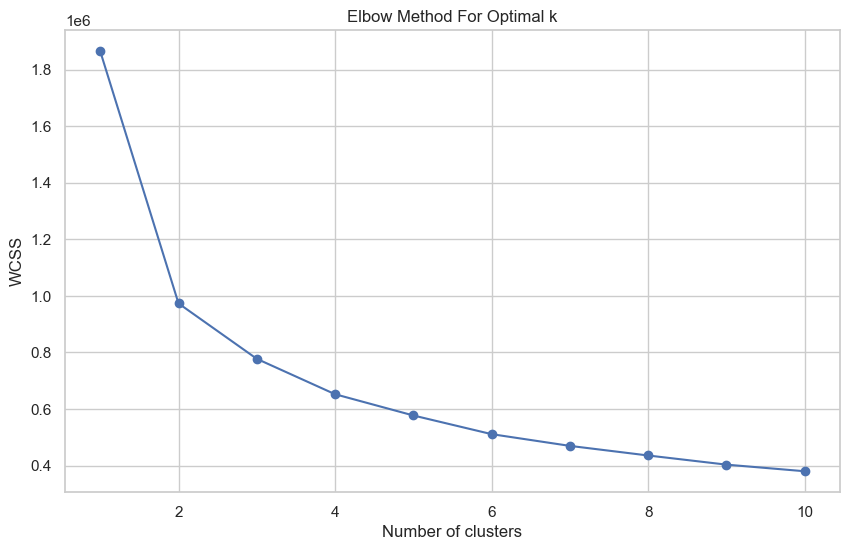

In [358]:
# Plotting the results
plt.figure(figsize=(10, 6))

# Plotting the WCSS values for different numbers of clusters
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

To stabilize the clustering outcome and secure the most accurate model, the KMeans algorithm is executed ten times with the same number of clusters. This approach leverages multiple initializations to minimize the total squared error, thus potentially circumventing local optima issues inherent to KMeans.

__K=4__

In [359]:
# # Apply the Elbow method, which suggests k=4 as the optimal number of clusters for our data
# kmeans = KMeans(n_clusters=4)
# kmeans.fit(features_scaled)

In [360]:
# Start measuring time
start_time = time.time()

# Initialize the variables to track the best score and model
best_score = float('inf') # Set to infinity to ensure any first run's inertia is considered lower
best_kmeans = None # Will hold the model with the lowest inertia

# Execute KMeans clustering 10 times to find the most stable and accurate model
for _ in range(10):
    kmeans = KMeans(n_clusters=4, random_state=42)
    kmeans.fit(features_scaled)
    # Check if the current model's inertia is the lowest we've encountered
    if kmeans.inertia_ < best_score:  # Compare the total squared error
        best_score = kmeans.inertia_
        best_kmeans = kmeans

# best_kmeans now contains the best model

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 68.44 seconds


Cluster Labeling

In [361]:
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

In [362]:
df_basket_kmeans_1['Cluster'] = cluster_labels

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3834901825.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_basket_kmeans_1['Cluster'] = cluster_labels


Evaluate the clustering effectiveness using the silhouette score, which ranges between -1 and 1.  
A silhouette score of 1 indicates excellent separation between clusters, whereas -1 indicates poor separation.

In [363]:
# # Start measuring time
# start_time = time.time()

# silhouette_avg = silhouette_score(features_scaled, cluster_labels)
# print(f"Silhouette Score for k=4: {silhouette_avg}")

# # End measuring time
# end_time = time.time()

# # Calculate and print the time taken
# execution_time = end_time - start_time
# print(f"Execution time: {execution_time:.2f} seconds")

##### Utilize PCA to visualize the clustering results

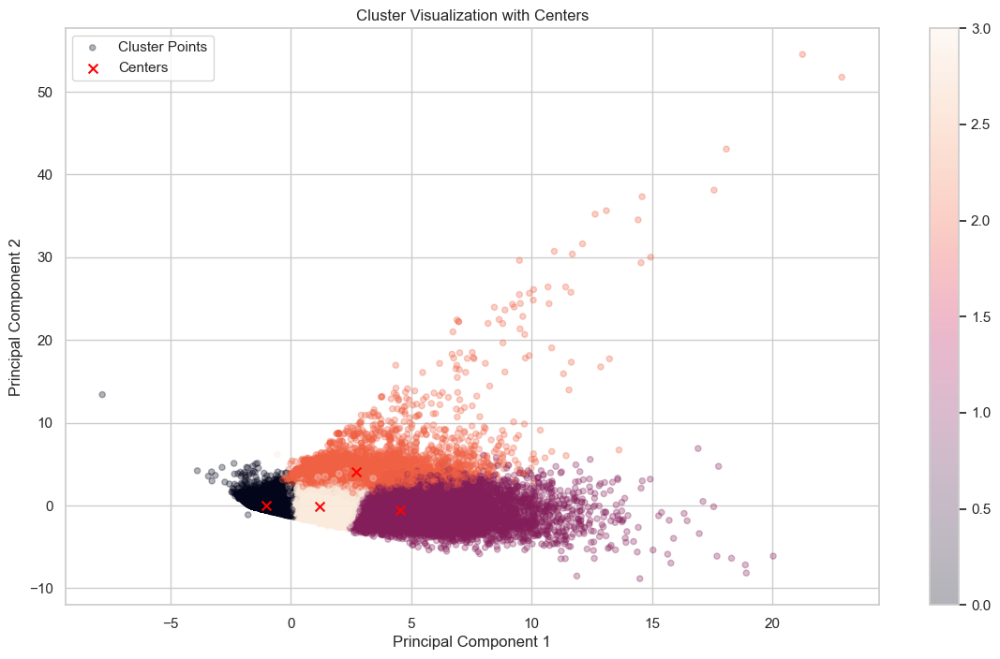

In [364]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Create a scatter plot for the PCA-transformed data
plt.figure(figsize=(14, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1], c=cluster_labels, 
                      alpha=0.3, s=20, label='Cluster Points')
plt.title('Cluster Visualization with Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Calculate the PCA coordinates for cluster centers
cluster_centers_transformed = pca.transform(cluster_centers)

# Plot the cluster centers on the PCA scatter plot
centers = plt.scatter(cluster_centers_transformed[:, 0], cluster_centers_transformed[:, 1], 
                      c='red', s=50, alpha=1, marker='x', label='Centers')

# Display the legend
plt.legend()

# Display the color bar associated with the cluster points
plt.colorbar(scatter)
plt.show()

In [365]:
df_basket_kmeans_1['Cluster'].value_counts()

Cluster
0    248462
3     87760
1     30195
2      6550
Name: count, dtype: int64

> __Evaluating and Interpreting Clusters__
> - ANOVA Testing to Assess Significant Differences Among Clusters
> - Analysis of Cluster Centroids

> - __ANOVA Testing to Assess Significant Differences Among Clusters__

In [366]:
df_basket_kmeans_1.columns

Index(['basket_id', 'total_NPM_stand_score', 'sale_price', 'total_discounts',
       'product_count', 'healthy_count', 'Cluster'],
      dtype='object')

In [367]:
# List of features to test for significant differences among clusters
features_to_test = [
    'total_NPM_stand_score', 'sale_price', 'total_discounts', 'product_count', 'healthy_count']

# Initialize a list or dictionary to store the ANOVA test results
anova_results = []

# Loop through each feature to perform the ANOVA test
for feature in features_to_test:
    # Prepare the data for each cluster
    data0 = df_basket_kmeans_1[df_basket_kmeans_1['Cluster'] == 0][feature]
    data1 = df_basket_kmeans_1[df_basket_kmeans_1['Cluster'] == 1][feature]
    data2 = df_basket_kmeans_1[df_basket_kmeans_1['Cluster'] == 2][feature]
    data3 = df_basket_kmeans_1[df_basket_kmeans_1['Cluster'] == 3][feature]

    # Perform the ANOVA test
    stat, p_value = f_oneway(data0, data1, data2, data3)
    
    # Store the results
    anova_results.append({'Feature': feature, 'ANOVA Statistic': stat, 'P-Value': p_value})

    # Print each feature's ANOVA test result
    print(f"ANOVA test for {feature}: Stat={stat:.2f}, P-value={p_value:.4f}")

ANOVA test for total_NPM_stand_score: Stat=104658.52, P-value=0.0000
ANOVA test for sale_price: Stat=248669.52, P-value=0.0000
ANOVA test for total_discounts: Stat=162471.71, P-value=0.0000
ANOVA test for product_count: Stat=387264.48, P-value=0.0000
ANOVA test for healthy_count: Stat=508947.66, P-value=0.0000


In [368]:
df_anova_results = pd.DataFrame(anova_results)

df_anova_results = df_anova_results.sort_values(by='ANOVA Statistic', ascending=False)
df_anova_results

,Feature,ANOVA Statistic,P-Value
4,healthy_count,508947.663576,0.0
3,product_count,387264.478872,0.0
1,sale_price,248669.518055,0.0
2,total_discounts,162471.713635,0.0
0,total_NPM_stand_score,104658.524750,0.0


-- description

> - __Analysis of Cluster Centroids__

In [369]:
# Exclude certain columns and create a new DataFrame
df_selected_features = df_basket_kmeans_1.drop(columns=['basket_id', 'Cluster'])

# Get the list of remaining column names
selected_features = df_selected_features.columns.tolist()
print("Selected features for clustering:", selected_features)

Selected features for clustering: ['total_NPM_stand_score', 'sale_price', 'total_discounts', 'product_count', 'healthy_count']


In [370]:
# Create a DataFrame for cluster centers, ensuring the number of columns matches the number of features
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)
df_cluster_centers

,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
0,0.377465,-0.517107,0.292206,-0.543541,-0.545932
1,-2.017197,2.137204,-0.861342,2.335181,2.487746
2,-0.016625,1.043784,-5.025153,0.813140,0.655346
3,-0.373344,0.650632,-0.155495,0.674583,0.640657


> 💡 **How to Interpret Standardized Data and Cluster Centroids?**
>
> **Standardization of Data:**
> After the standardization process, each column in the dataset is transformed to have an average (mean) of 0 and a standard deviation of 1. Consequently, the range of values typically extends from around -1 to 1 for most data points, aligning with the standard deviation spread.
>
> **Understanding Cluster Centroids:**
>
> **1. Positive and Negative Values:**
> - **Positive Values:** Indicate that the feature's average in the cluster is above the overall average of the dataset, suggesting a higher than typical presence or intensity of that attribute within the cluster.
> - **Negative Values:** Suggest that the feature's average in the cluster is below the dataset's overall average, indicating a lower prevalence or intensity of that attribute.
>
> **2. Magnitude of Values:**
> - The magnitude (absolute value) of a centroid's coordinate, regardless of being positive or negative, signifies the strength of the deviation from the overall dataset's average. A larger absolute value denotes a more significant deviation, highlighting features that are particularly characteristic or uncharacteristic of the cluster compared to the general population.


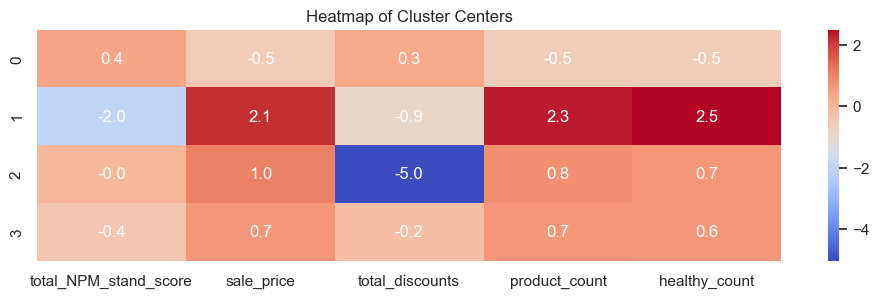

In [371]:
# Set the figure size
plt.figure(figsize=(12, 3))

# Create the heatmap, disable automatic annotations
ax = sns.heatmap(df_cluster_centers, cmap='coolwarm', fmt=".1f", annot=False)
plt.title("Heatmap of Cluster Centers")

# Use a for loop to manually add value labels
for (i, j), val in np.ndenumerate(df_cluster_centers):
    # Place text at the center of each cell using (j + 0.5, i + 0.5) to adjust for cell center
    ax.text(j + 0.5, i + 0.5, f'{val:.1f}', ha='center', va='center', color='white')

plt.show()

##### Reverse Standardization

In [372]:
# Create a DataFrame for the cluster centers
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)

# Reverse the standardization of the cluster centers
df_original_cluster_centers = pd.DataFrame(scaler.inverse_transform(df_cluster_centers), columns=selected_features)

# Display the original cluster centers
df_original_cluster_centers

,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
0,-0.759629,9.580408,-0.286058,5.385746,2.546643
1,-21.235196,74.066843,-2.665990,46.438877,27.060113
2,-4.129291,47.502227,-11.256521,24.733221,12.253508
3,-7.179419,37.950610,-1.209728,22.757278,12.134811


In [373]:
df_basket_kmeans_1['Cluster'].value_counts()

Cluster
0    248462
3     87760
1     30195
2      6550
Name: count, dtype: int64

<br>

#### Trial 2: Enhanced Metric Clustering
- **Features Used**:  
  `Total NPM Score`, `Sale Price`, `Product Count`, `Discount Percentage`, `NPM Score Per Product`
- **Description**: The second clustering approach incorporated additional metrics, such as discount percentage and normalized NPM scores per product. This trial aimed to refine the clusters by including more detailed aspects of consumer behavior, focusing on discounts and health metrics.

In [374]:
df_basket.columns

Index(['basket_id', 'total_spend', 'total_discounts', 'product_count',
       'has_linksave', 'total_NPM_stand_score', 'healthy_count',
       'unhealthy_count', 'healthy_spend', 'unhealthy_spend', 'sale_price',
       'discount_%', 'NPM_per_prod', 'healthy_count_%', 'healthy_spend_%',
       'is_healthy', 'Assorted Snacks', 'Baking Supplies & Desserts',
       'Beers & Ales', 'Beverages & Sweeteners', 'Breakfast Cereals',
       'Brought-In Bacon & Sausages', 'Brought-In Fish',
       'Brought-In Fresh Meat', 'Canned Goods & Savories', 'Chilled Cakes',
       'Chips, Potatoes & Vegetables', 'Cookies & Biscuits',
       'Cooking Condiments', 'Dairy Products', 'Desserts and Ice Cream',
       'Distilled Spirits', 'Fresh Pizza', 'Fresh Potatoes', 'Fresh Salads',
       'Fresh Vegetables', 'Frozen Meats & Poultry', 'Grab & Go Foods',
       'In-Store Bakery & Snacks', 'In-Store Meat & Poultry',
       'Non-alcoholic Beverages', 'Pre-Packaged Cheeses',
       'Pre-Packaged Cooked Meats', '

In [375]:
# Selecting the K-means features 
df_basket_kmeans_2 = df_basket[['basket_id', 'sale_price', 'product_count', 'discount_%', 'NPM_per_prod']]

In [376]:
features = df_basket_kmeans_2.drop(columns=['basket_id'])

# Feature Standardization
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [377]:
features.head(3)

,sale_price,product_count,discount_%,NPM_per_prod
0,3.30,2,0.000000,0.092000
1,4.80,12,-0.214403,0.004083
2,1.77,3,-0.119403,-0.529000


In [378]:
features_scaled[:3]

array([[-0.77561324, -0.78095558,  0.47023227,  0.57253393],
       [-0.71387209, -0.07973693, -2.18967177,  0.43341967],
       [-0.83858921, -0.71083372, -1.01109517, -0.41010062]])

##### Use the **Elbow Method** to Determine the Optimal Number of Clusters

In [379]:
# Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(features_scaled)
    wcss.append(kmeans.inertia_)

In [380]:
# # Start measuring time
# start_time = time.time()

# # Silhouette Score
# silhouette_scores = []
# for i in range(2, 10):  # At least 2 clusters are needed to calculate the silhouette score
#     kmeans = KMeans(n_clusters=i, random_state=0)
#     kmeans.fit(features_scaled)
#     score = silhouette_score(features_scaled, kmeans.labels_)
#     silhouette_scores.append(score)

# # End measuring time
# end_time = time.time()

# # Calculate and print the time taken
# execution_time = end_time - start_time
# print(f"Execution time: {execution_time:.2f} seconds")

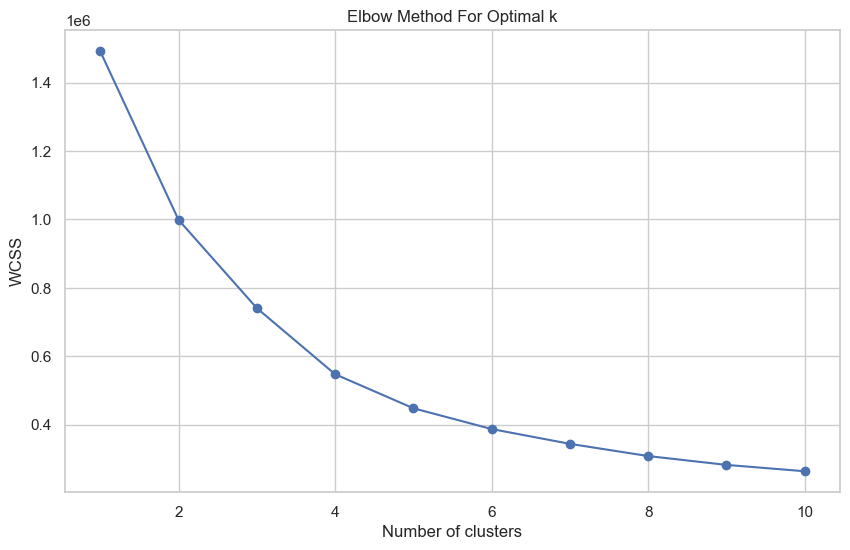

In [381]:
# Plotting the results
plt.figure(figsize=(10, 6))

# Plotting the WCSS values for different numbers of clusters
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

Evaluate the clustering effectiveness using the silhouette score, which ranges between -1 and 1.  
A silhouette score of 1 indicates excellent separation between clusters, whereas -1 indicates poor separation.

In [382]:
# Start measuring time
start_time = time.time()

silhouette_avg = silhouette_score(features_scaled, cluster_labels)
print(f"Silhouette Score for k=4: {silhouette_avg}")

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Silhouette Score for k=4: 0.22239408933529048
Execution time: 1767.41 seconds


To stabilize the clustering outcome and secure the most accurate model, the KMeans algorithm is executed ten times with the same number of clusters. This approach leverages multiple initializations to minimize the total squared error, thus potentially circumventing local optima issues inherent to KMeans.

__K=4__

In [383]:
# Start measuring time
start_time = time.time()

# Initialize the variables to track the best score and model
best_score = float('inf') # Set to infinity to ensure any first run's inertia is considered lower
best_kmeans = None # Will hold the model with the lowest inertia

# Execute KMeans clustering 10 times to find the most stable and accurate model
for _ in range(10):
    kmeans = KMeans(n_clusters=4, random_state=42)
    kmeans.fit(features_scaled)
    # Check if the current model's inertia is the lowest we've encountered
    if kmeans.inertia_ < best_score:  # Compare the total squared error
        best_score = kmeans.inertia_
        best_kmeans = kmeans

# best_kmeans now contains the best model

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 36.04 seconds


Cluster Labeling

In [384]:
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

In [385]:
df_basket_kmeans_2['Cluster'] = cluster_labels

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3842613150.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_basket_kmeans_2['Cluster'] = cluster_labels


##### Utilize PCA to visualize the clustering results

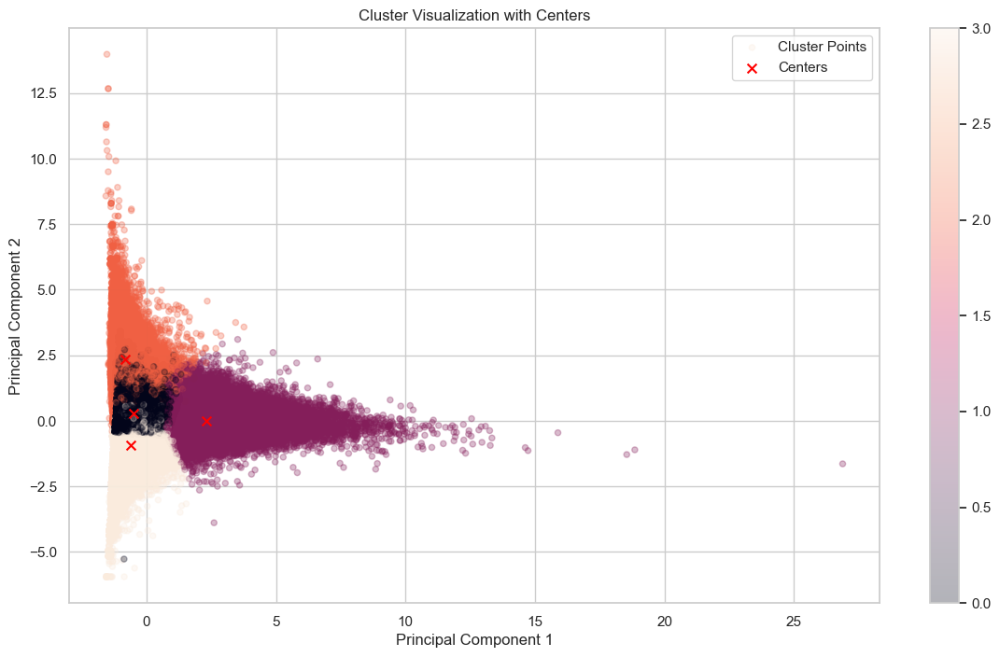

In [386]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Create a scatter plot for the PCA-transformed data
plt.figure(figsize=(14, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1], c=cluster_labels, 
                      alpha=0.3, s=20, label='Cluster Points')
plt.title('Cluster Visualization with Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Calculate the PCA coordinates for cluster centers
cluster_centers_transformed = pca.transform(cluster_centers)

# Plot the cluster centers on the PCA scatter plot
centers = plt.scatter(cluster_centers_transformed[:, 0], cluster_centers_transformed[:, 1], 
                      c='red', s=50, alpha=1, marker='x', label='Centers')

# Display the legend
plt.legend()

# Display the color bar associated with the cluster points
plt.colorbar(scatter)
plt.show()

In [387]:
df_basket_kmeans_2['Cluster'].value_counts()

Cluster
0    165230
3    109696
1     73983
2     24058
Name: count, dtype: int64

> __Evaluating and Interpreting Clusters__
> - ANOVA Testing to Assess Significant Differences Among Clusters
> - Analysis of Cluster Centroids

> - __ANOVA Testing to Assess Significant Differences Among Clusters__

In [388]:
df_basket_kmeans_2.columns

Index(['basket_id', 'sale_price', 'product_count', 'discount_%',
       'NPM_per_prod', 'Cluster'],
      dtype='object')

In [389]:
# List of features to test for significant differences among clusters
features_to_test = ['sale_price', 'product_count', 'discount_%', 'NPM_per_prod']

# Initialize a list or dictionary to store the ANOVA test results
anova_results = []

# Loop through each feature to perform the ANOVA test
for feature in features_to_test:
    # Prepare the data for each cluster
    data0 = df_basket_kmeans_2[df_basket_kmeans_2['Cluster'] == 0][feature]
    data1 = df_basket_kmeans_2[df_basket_kmeans_2['Cluster'] == 1][feature]
    data2 = df_basket_kmeans_2[df_basket_kmeans_2['Cluster'] == 2][feature]
    data3 = df_basket_kmeans_2[df_basket_kmeans_2['Cluster'] == 3][feature]

    # Perform the ANOVA test
    stat, p_value = f_oneway(data0, data1, data2, data3)
    
    # Store the results
    anova_results.append({'Feature': feature, 'ANOVA Statistic': stat, 'P-Value': p_value})

    # Print each feature's ANOVA test result
    print(f"ANOVA test for {feature}: Stat={stat:.2f}, P-value={p_value:.4f}")

ANOVA test for sale_price: Stat=226720.62, P-value=0.0000
ANOVA test for product_count: Stat=252479.34, P-value=0.0000
ANOVA test for discount_%: Stat=273056.55, P-value=0.0000
ANOVA test for NPM_per_prod: Stat=139556.42, P-value=0.0000


In [390]:
df_anova_results = pd.DataFrame(anova_results)

df_anova_results = df_anova_results.sort_values(by='ANOVA Statistic', ascending=False)
df_anova_results

,Feature,ANOVA Statistic,P-Value
2,discount_%,273056.547951,0.0
1,product_count,252479.335392,0.0
0,sale_price,226720.623302,0.0
3,NPM_per_prod,139556.423538,0.0


-- description

> - __Analysis of Cluster Centroids__

In [391]:
# Exclude certain columns and create a new DataFrame
df_selected_features = df_basket_kmeans_2.drop(columns=['basket_id', 'Cluster'])

# Get the list of remaining column names
selected_features = df_selected_features.columns.tolist()
print("Selected features for clustering:", selected_features)

Selected features for clustering: ['sale_price', 'product_count', 'discount_%', 'NPM_per_prod']


In [392]:
# Create a DataFrame for cluster centers, ensuring the number of columns matches the number of features
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)
df_cluster_centers

,sale_price,product_count,discount_%,NPM_per_prod
0,-0.388514,-0.377658,0.255768,-0.660786
1,1.614199,1.645504,0.023780,-0.052872
2,-0.569506,-0.493429,-3.133671,-0.137384
3,-0.376886,-0.431189,0.286506,1.065649


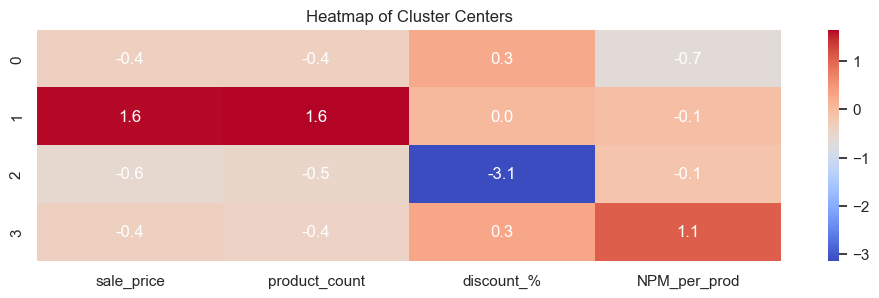

In [393]:
# Set the figure size
plt.figure(figsize=(12, 3))

# Create the heatmap, disable automatic annotations
ax = sns.heatmap(df_cluster_centers, cmap='coolwarm', fmt=".1f", annot=False)
plt.title("Heatmap of Cluster Centers")

# Use a for loop to manually add value labels
for (i, j), val in np.ndenumerate(df_cluster_centers):
    # Place text at the center of each cell using (j + 0.5, i + 0.5) to adjust for cell center
    ax.text(j + 0.5, i + 0.5, f'{val:.1f}', ha='center', va='center', color='white')

plt.show()

##### Reverse Standardization

In [394]:
# Create a DataFrame for the cluster centers
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)

# Reverse the standardization of the cluster centers
df_original_cluster_centers = pd.DataFrame(scaler.inverse_transform(df_cluster_centers), columns=selected_features)

# Display the original cluster centers
df_original_cluster_centers

,sale_price,product_count,discount_%,NPM_per_prod
0,12.704579,7.751386,-0.017287,-0.687427
1,61.360449,36.603473,-0.035986,-0.303240
2,8.307381,6.100378,-0.290494,-0.356650
3,12.987060,6.987983,-0.014809,0.403636


<br>

#### Trial 3: Outlier-Filtered Clustering
- **Features Used**: Same as Trial 2, but with outliers removed using the **Mahalanobis distance**
- **Description**: Building on the second trial, this iteration filtered out outliers to focus on more typical shopping patterns. Removing extreme values aimed to enhance the clustering results by reducing noise and focusing on more representative data.

> 💡 **What is Mahalanobis Distance?**
>
> **Mahalanobis distance** is a measure of the distance between a point and a distribution. Unlike traditional Euclidean distance, it accounts for the correlation between variables as well as the scale of the data. This makes it particularly useful in statistics and machine learning for tasks such as outlier detection and clustering analysis.
>
> **Why Use Mahalanobis Distance?**
> - **Scale Invariance:** Mahalanobis distance is unitless, making it applicable across data of different scales.
> - **Feature Correlation:** It factors in the correlation between features through the covariance matrix. High correlation between features diminishes their contribution to the distance calculation, facilitating a more nuanced understanding of distances in high-dimensional spaces.
> - **Outlier Detection:** Outliers typically lie far from the mean of a dataset. Mahalanobis distance effectively pinpoints these outliers by measuring how many standard deviations they are from the mean in terms of the overall data structure.
> - **Built-in Standardization:** The formula inherently adjusts for differences in scale among features, providing a standardized measure of distance.
>
> **Benefits in Clustering:**
> Using Mahalanobis distance in K-means clustering ensures that clusters are not unduly influenced by extreme values. This approach enhances the robustness of clustering results by focusing on the core, more representative data points, thereby improving the overall quality of the clusterin analysis.


While Mahalanobis distance calculates the distance across all columns for each sample, this computation can be time-consuming. Therefore, only the necessary columns for K-means clustering are extracted to optimize performance.

In [395]:
df_basket_filtered = df_basket[['basket_id', 'total_NPM_stand_score', 'sale_price',
                                'total_discounts', 'product_count', 'healthy_count']]

In [396]:
# Define the file path
file_path = 'Results/Dataset/dataset_basket_filtered.csv'

# Check if the file exists
if os.path.exists(file_path):
    print('The file is already generated.')
else:
    # Start measuring time
    start_time = time.time()

    # Assuming df_basket_filtered is already defined and contains the data
    # Select only numerical feature columns for computation (excluding basket_id)
    numerical_features = df_basket_filtered.drop(columns=['basket_id'])

    # Calculate the covariance matrix and its inverse
    cov_matrix = np.cov(numerical_features.values.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)

    # Compute the Mahalanobis distance and retain basket_id
    df_basket_filtered['mahalanobis'] = numerical_features.apply(
        lambda row: mahalanobis(row, numerical_features.mean(), inv_cov_matrix), axis=1
    )

    # Retain the basket_id and Mahalanobis distance for further analysis
    result_df = df_basket_filtered[['basket_id', 'mahalanobis']]

    # Define the threshold distance, remove samples exceeding this distance
    threshold = df_basket_filtered['mahalanobis'].quantile(0.99)
    df_basket_filtered = df_basket_filtered[df_basket_filtered['mahalanobis'] <= threshold]

    # End measuring time
    end_time = time.time()

    # Calculate and print the time taken
    execution_time = end_time - start_time
    print(f"Execution time: {execution_time:.2f} seconds")

    df_basket_filtered.to_csv('Results\Dataset\dataset_basket_filtered.csv', index=False)

The file is already generated.


In [397]:
df_basket_filtered = pd.read_csv('Results\Dataset\dataset_basket_filtered.csv')
df_basket_filtered.head(2)

,basket_id,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count,mahalanobis
0,202301014158300100008,0.184,3.3,0.00,2,0,0.990520
1,202301014158300100018,0.049,4.8,-1.31,12,0,3.717073


In [398]:
# Check the number of outliers removed
print(len(df_basket))
print(len(df_basket_filtered))

372967
369237


In [399]:
features = df_basket_filtered.drop(columns=['basket_id', 'mahalanobis'])
df_basket_filtered
# Feature Standardization
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [400]:
features.head(3)

,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
0,0.184,3.30,0.00,2,0
1,0.049,4.80,-1.31,12,0
2,-1.587,1.77,-0.24,3,3


In [401]:
features_scaled[:3]

array([[ 0.50468532, -0.80103543,  0.50710305, -0.7966054 , -0.87847723],
       [ 0.4881033 , -0.73474751, -0.31956776, -0.05925972, -0.87847723],
       [ 0.28715385, -0.86864912,  0.35565191, -0.72287084, -0.49059433]])

##### Use the **Elbow Method** to Determine the Optimal Number of Clusters

In [402]:
# Start measuring time
start_time = time.time()

# Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(features_scaled)
    wcss.append(kmeans.inertia_)

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 63.06 seconds


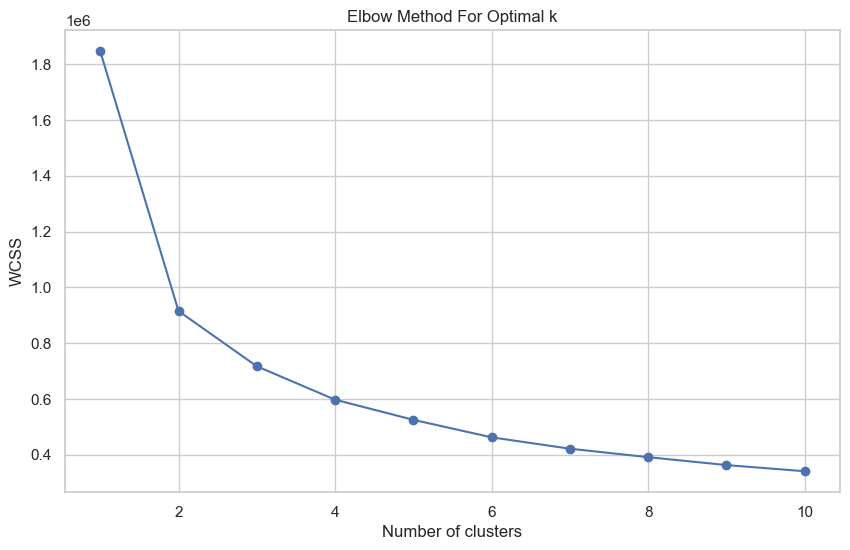

In [403]:
# Plotting the results
plt.figure(figsize=(10, 6))

# Plotting the WCSS values for different numbers of clusters
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

To stabilize the clustering outcome and secure the most accurate model, the KMeans algorithm is executed ten times with the same number of clusters. This approach leverages multiple initializations to minimize the total squared error, thus potentially circumventing local optima issues inherent to KMeans.

__K=4__

In [404]:
# Start measuring time
start_time = time.time()

# Initialize the variables to track the best score and model
best_score = float('inf') # Set to infinity to ensure any first run's inertia is considered lower
best_kmeans = None # Will hold the model with the lowest inertia

# Execute KMeans clustering 10 times to find the most stable and accurate model
for _ in range(10):
    kmeans = KMeans(n_clusters=4, random_state=42)
    kmeans.fit(features_scaled)
    # Check if the current model's inertia is the lowest we've encountered
    if kmeans.inertia_ < best_score:  # Compare the total squared error
        best_score = kmeans.inertia_
        best_kmeans = kmeans

# best_kmeans now contains the best model

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 58.15 seconds


Cluster Labeling

In [405]:
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

In [406]:
df_basket_kmeans_3 = df_basket_filtered.copy()
df_basket_kmeans_3['Cluster'] = cluster_labels

Evaluate the clustering effectiveness using the silhouette score, which ranges between -1 and 1.  
A silhouette score of 1 indicates excellent separation between clusters, whereas -1 indicates poor separation.

In [407]:
# # Start measuring time
# start_time = time.time()

# silhouette_avg = silhouette_score(features_scaled, cluster_labels)
# print(f"Silhouette Score for k=4: {silhouette_avg}")

# # End measuring time
# end_time = time.time()

# # Calculate and print the time taken
# execution_time = end_time - start_time
# print(f"Execution time: {execution_time:.2f} seconds")

##### Utilize PCA to visualize the clustering results

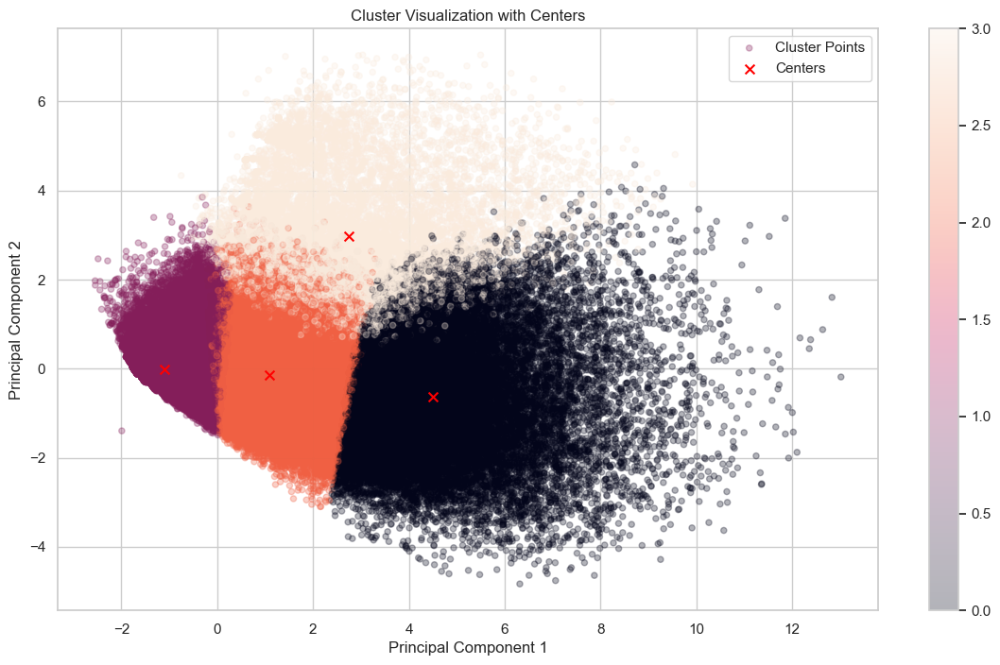

In [408]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Create a scatter plot for the PCA-transformed data
plt.figure(figsize=(14, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1], c=cluster_labels, 
                      alpha=0.3, s=20, label='Cluster Points')
plt.title('Cluster Visualization with Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Calculate the PCA coordinates for cluster centers
cluster_centers_transformed = pca.transform(cluster_centers)

# Plot the cluster centers on the PCA scatter plot
centers = plt.scatter(cluster_centers_transformed[:, 0], cluster_centers_transformed[:, 1], 
                      c='red', s=50, alpha=1, marker='x', label='Centers')

# Display the legend
plt.legend()

# Display the color bar associated with the cluster points
plt.colorbar(scatter)
plt.show()

In [409]:
df_basket_kmeans_3['Cluster'].value_counts()

Cluster
1    241184
2     85481
0     30824
3     11748
Name: count, dtype: int64

> __Evaluating and Interpreting Clusters__
> - ANOVA Testing to Assess Significant Differences Among Clusters
> - Analysis of Cluster Centroids

> - __ANOVA Testing to Assess Significant Differences Among Clusters__

In [410]:
df_basket_kmeans_3.columns

Index(['basket_id', 'total_NPM_stand_score', 'sale_price', 'total_discounts',
       'product_count', 'healthy_count', 'mahalanobis', 'Cluster'],
      dtype='object')

In [411]:
# List of features to test for significant differences among clusters
features_to_test = ['total_NPM_stand_score', 'sale_price', 
                    'total_discounts', 'product_count', 'healthy_count']

# Initialize a list or dictionary to store the ANOVA test results
anova_results = []

# Loop through each feature to perform the ANOVA test
for feature in features_to_test:
    # Prepare the data for each cluster
    data0 = df_basket_kmeans_3[df_basket_kmeans_3['Cluster'] == 0][feature]
    data1 = df_basket_kmeans_3[df_basket_kmeans_3['Cluster'] == 1][feature]
    data2 = df_basket_kmeans_3[df_basket_kmeans_3['Cluster'] == 2][feature]
    data3 = df_basket_kmeans_3[df_basket_kmeans_3['Cluster'] == 3][feature]

    # Perform the ANOVA test
    stat, p_value = f_oneway(data0, data1, data2, data3)
    
    # Store the results
    anova_results.append({'Feature': feature, 'ANOVA Statistic': stat, 'P-Value': p_value})

    # Print each feature's ANOVA test result
    print(f"ANOVA test for {feature}: Stat={stat:.2f}, P-value={p_value:.4f}")

ANOVA test for total_NPM_stand_score: Stat=118256.34, P-value=0.0000
ANOVA test for sale_price: Stat=270842.40, P-value=0.0000
ANOVA test for total_discounts: Stat=203228.70, P-value=0.0000
ANOVA test for product_count: Stat=406409.45, P-value=0.0000
ANOVA test for healthy_count: Stat=541508.56, P-value=0.0000


In [412]:
df_anova_results = pd.DataFrame(anova_results)

df_anova_results = df_anova_results.sort_values(by='ANOVA Statistic', ascending=False)
df_anova_results

,Feature,ANOVA Statistic,P-Value
4,healthy_count,541508.555578,0.0
3,product_count,406409.446068,0.0
1,sale_price,270842.404057,0.0
2,total_discounts,203228.699612,0.0
0,total_NPM_stand_score,118256.335831,0.0


The ANOVA results show that all the features analysed—**healthy count, product count, sale price, total discounts, and total NPM standard score**—have statistically significant differences across the groups. This is indicated by the very high ANOVA statistics and P-values of 0.0 for each feature, suggesting that these differences are not due to random chance.

> - __Analysis of Cluster Centroids__

In [413]:
# Exclude certain columns and create a new DataFrame
df_selected_features = df_basket_kmeans_3.drop(columns=['basket_id', 'mahalanobis', 'Cluster'])

# Get the list of remaining column names
selected_features = df_selected_features.columns.tolist()
print("Selected features for clustering:", selected_features)

Selected features for clustering: ['total_NPM_stand_score', 'sale_price', 'total_discounts', 'product_count', 'healthy_count']


In [414]:
# Create a DataFrame for cluster centers, ensuring the number of columns matches the number of features
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)
df_cluster_centers

,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
0,-2.060339,2.107105,-0.918680,2.276944,2.450284
1,0.397642,-0.540486,0.343848,-0.564168,-0.565672
2,-0.374242,0.612078,-0.108769,0.621352,0.599337
3,-0.034000,1.111031,-3.849542,1.084152,0.820913


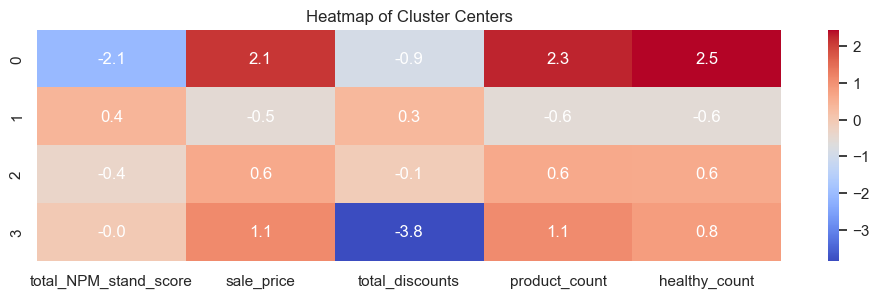

In [415]:
# Set the figure size
plt.figure(figsize=(12, 3))

# Create the heatmap, disable automatic annotations
ax = sns.heatmap(df_cluster_centers, cmap='coolwarm', fmt=".1f", annot=False)
plt.title("Heatmap of Cluster Centers")

# Use a for loop to manually add value labels
for (i, j), val in np.ndenumerate(df_cluster_centers):
    # Place text at the center of each cell using (j + 0.5, i + 0.5) to adjust for cell center
    ax.text(j + 0.5, i + 0.5, f'{val:.1f}', ha='center', va='center', color='white')

plt.show()

##### Reverse Standardization

In [416]:
# Create a DataFrame for the cluster centers
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)

# Reverse the standardization of the cluster centers
df_original_cluster_centers = pd.DataFrame(scaler.inverse_transform(df_cluster_centers), columns=selected_features)

# Display the original cluster centers
df_original_cluster_centers

,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
0,-20.698762,69.107021,-2.259395,43.683970,25.745612
1,-0.687475,9.195864,-0.258706,5.152349,2.419326
2,-6.971658,35.276707,-0.975954,21.230566,11.429850
3,-4.201625,46.567304,-6.903843,27.507137,13.143585


From the table showing the characteristics of each cluster centre, it is evident that all four clusters have a healthy centroid centre.

- **Cluster 0:** This cluster contains the healthiest baskets, with health scores significantly lower than the average (-1.19). Consumers of this cluster spend the most money, purchase the highest number of products, and account for approximately 45% of all purchased items, indicating a strong preference for healthy products.

- **Cluster 1:** The only cluster with a health score above the average, indicating comparatively less healthy baskets. This cluster spends the least amount of money, buys the fewest products, and receives the least discount. The percentage of healthy products in this cluster is around 33%, making it the least healthy among the four clusters.

- **Cluster 2:** Similar to Cluster 2, but characterized by lower spending and fewer products. Despite these differences, the baskets in this cluster remain relatively healthy.

- **Cluster 3:** This cluster is most influenced by discounts, which may cause an overlap in spending patterns with Clusters 1 and 2. The emphasis on discounts suggests a diverse range of spending habits within this cluster, making it less condensed compared to the others.

In [417]:
df_basket_kmeans_3.head(2)

,basket_id,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count,mahalanobis,Cluster
0,202301014158300100008,0.184,3.3,0.00,2,0,0.990520,1
1,202301014158300100018,0.049,4.8,-1.31,12,0,3.717073,1


In [768]:
df_basket_filtered = df_basket_kmeans_3.copy()

In [769]:
# Define the mapping from Cluster_4 values to shopping pattern names
shopping_patterns = {
    0: "Premium Health Basket",
    1: "Economy Less Healthy Basket",
    2: "Moderate Balance Basket",
    3: "Value Discount Basket"
}

# Map the Cluster_4 values to their corresponding shopping patterns and create a new column
df_basket_filtered['shopping_pattern'] = df_basket_filtered['Cluster'].map(shopping_patterns)

# Display the updated DataFrame to verify the changes
df_basket_filtered.head()

,basket_id,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count,mahalanobis,Cluster,shopping_pattern
0,202301014158300100008,0.184,3.30,0.00,2,0,0.990520,1,Economy Less Healthy Basket
1,202301014158300100018,0.049,4.80,-1.31,12,0,3.717073,1,Economy Less Healthy Basket
2,202301014158300100022,-1.587,1.77,-0.24,3,3,1.123730,1,Economy Less Healthy Basket
3,202301014158300100023,-1.261,7.00,0.00,4,3,0.857594,1,Economy Less Healthy Basket
4,202301014158300100024,-10.957,12.63,-0.80,12,8,1.348504,2,Moderate Balance Basket


In [796]:
# Calculate the proportion of each basket type
basket_counts = df_basket_filtered['shopping_pattern'].value_counts()
basket_counts

shopping_pattern
Economy Less Healthy Basket    241184
Moderate Balance Basket         85481
Premium Health Basket           30824
Value Discount Basket           11748
Name: count, dtype: int64

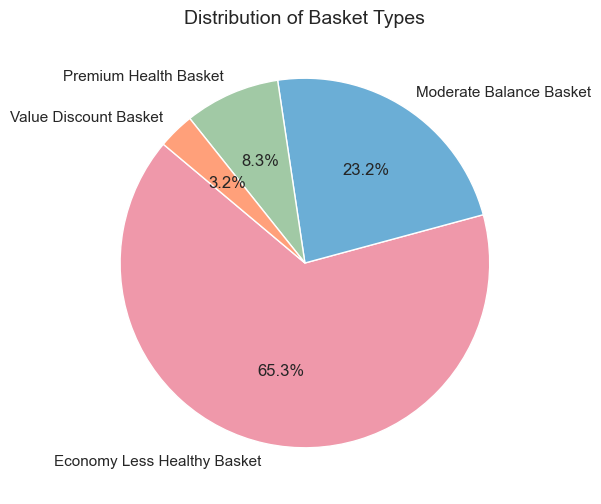

In [815]:
# Plot the pie chart
plt.figure(figsize=(12, 6))
plt.pie(basket_counts, labels=basket_counts.index, autopct='%1.1f%%', startangle=140, colors = ['#ef98aa', '#6baed6', '#a1c9a5', '#ffa07a'])

# colors=['#e78ac3', '#8da0cb', '#66c2a5', '#fc8d62']
#ef98aa: Light Pink
#a1c9a5: Light Green
#6baed6: Light Blue
#ffa07a: Light Salmon

plt.title('Distribution of Basket Types', fontsize=14)

# Save the figure
plt.savefig(r'Results\Img\basket_distribution_pie_chart.png', dpi=300)

plt.show()

The most common is the Economy Less Healthy (Type 1) basket, which accounts for over 65% of all shopping sessions. This basket type is characterized by the highest standardised NPM score, indicating it is the least healthy. These baskets also have the lowest total spending and the fewest products, with healthy items comprising only one-third of the total products. 

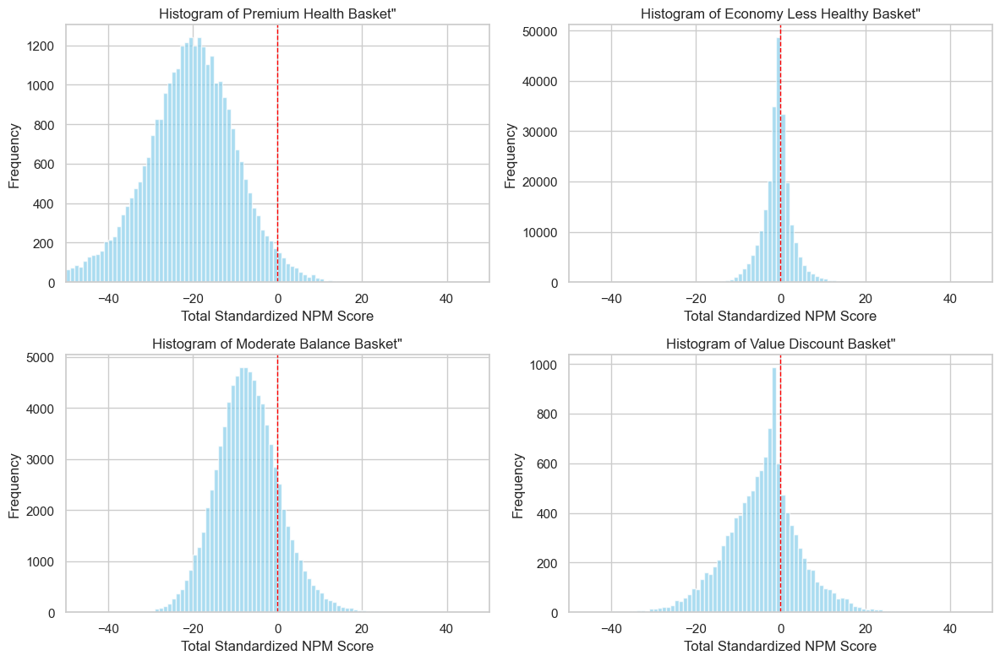

In [826]:
# Define the mapping from Cluster_4 values to shopping pattern names
shopping_patterns = {
    0: "Premium Health Basket",
    1: "Economy Less Healthy Basket",
    2: "Moderate Balance Basket",
    3: "Value Discount Basket"
}

# Set the overall figure size
plt.figure(figsize=(12, 8))

# Define the number of clusters
num_clusters = 4

# Loop through each cluster to create a histogram
for i in range(num_clusters):
    # Create a subplot for each histogram
    plt.subplot(2, 2, i+1)  # This arranges the plots in a 2x2 grid
    # Filter the data for the current cluster
    cluster_data = df_basket_filtered[df_basket_filtered['Cluster'] == i]['total_NPM_stand_score']
    # Plot the histogram
    plt.hist(cluster_data, bins=range(-50, 50, 1), color='skyblue', alpha=0.7)  # Adjust the number of bins and color as needed
    # Set the title for each histogram using the shopping pattern name
    plt.title(f'Histogram of {shopping_patterns[i]}"')
    plt.xlabel('Total Standardized NPM Score')
    plt.ylabel('Frequency')
    # Set x-axis limit
    plt.xlim(-50, 50)
    # Add a red dashed line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Health Threshold')

    # Optional: Add legend if needed
    # plt.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
# Show the plot
plt.show()

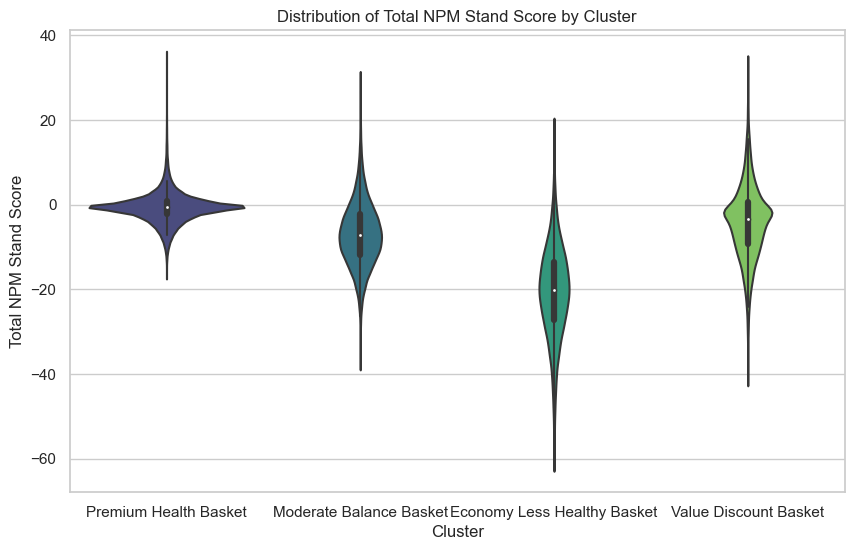

In [422]:
# Create a violin plot to visualize the distribution of 'total_NPM_stand_score' for each cluster
plt.figure(figsize=(10, 6))
sns.violinplot(x='shopping_pattern', y='total_NPM_stand_score', data=df_basket_filtered, palette='viridis')

# Add a title and labels
plt.title('Distribution of Total NPM Stand Score by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Total NPM Stand Score')

# Show the plot
plt.show()

<br>

- __🤔 Where Are the Unhealthy Baskets?__

In [423]:
# df_basket_unhealthy = df_basket_no_extre[df_basket_no_extre['total_NPM_stand_score'] > 0]
df_basket_unhealthy = df_basket_filtered[df_basket_filtered['total_NPM_stand_score'] > 0]
df_basket_unhealthy = df_basket_unhealthy.sort_values(by='total_NPM_stand_score', ascending=False)

In [424]:
# Count of unhealthy samples in each cluster
# This counts the number of samples in df_basket_unhealthy grouped by 'Cluster_4'
unhealthy_counts = df_basket_unhealthy['Cluster'].value_counts()
print(unhealthy_counts)

# Total count of samples in each cluster
# This counts the number of samples in the complete dataset grouped by 'Cluster_4'
total_counts = df_basket_filtered['Cluster'].value_counts()
print(total_counts)

# Calculate the proportion of unhealthy samples in each cluster
# Divide the count of unhealthy samples by the total count of samples in each cluster
# Multiply by 100 to convert to percentage
unhealthy_ratios = (unhealthy_counts / total_counts) * 100

# Round the percentages to two decimal places
unhealthy_ratios = unhealthy_ratios.round(2)

# Output the result
# Print the proportion of unhealthy samples in each cluster
print("Proportion of Unhealthy Samples in Each Cluster (%):")
print(unhealthy_ratios)

Cluster
1    87805
2    14070
3     3187
0      747
Name: count, dtype: int64
Cluster
1    241184
2     85481
0     30824
3     11748
Name: count, dtype: int64
Proportion of Unhealthy Samples in Each Cluster (%):
Cluster
0     2.42
1    36.41
2    16.46
3    27.13
Name: count, dtype: float64


In [425]:
# Calculate the total number of samples
total_samples = total_counts.sum()

# Calculate the percentage of each cluster
cluster_percentages = (total_counts / total_samples) * 100

# Round the percentages to two decimal places
cluster_percentages = cluster_percentages.round(2)

# Output the result
print("Percentage of Total Samples in Each Cluster (%):")
print(cluster_percentages)

Percentage of Total Samples in Each Cluster (%):
Cluster
1    65.32
2    23.15
0     8.35
3     3.18
Name: count, dtype: float64


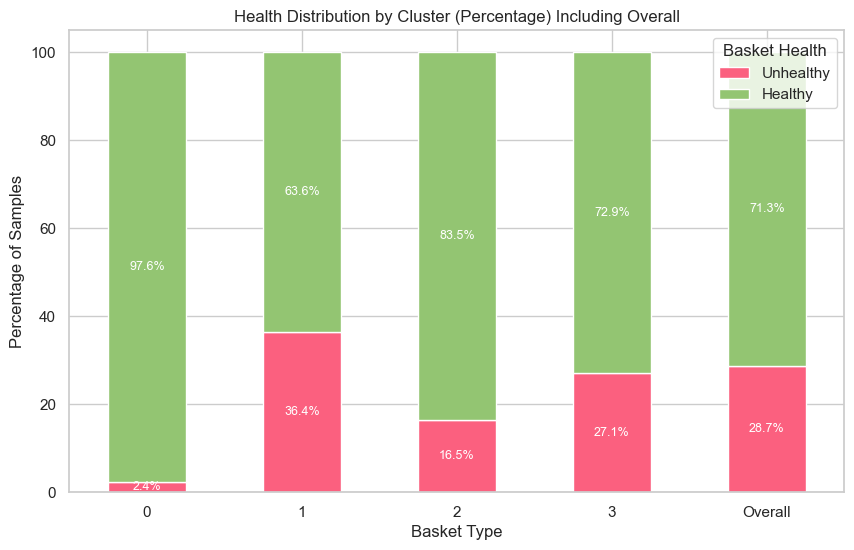

In [821]:
# Calculate the total number of baskets in each cluster
total_counts = df_basket_filtered['Cluster'].value_counts()

# Calculate the number of unhealthy baskets in each cluster
unhealthy_counts = df_basket_unhealthy['Cluster'].value_counts()

# Calculate the number of healthy baskets in each cluster
healthy_counts = total_counts - unhealthy_counts

# Combine the healthy and unhealthy counts into a DataFrame
health_data = pd.DataFrame({
    'Unhealthy': unhealthy_counts,
    'Healthy': healthy_counts
})

# Fill any missing values with 0 (in case there are clusters without unhealthy samples)
health_data = health_data.fillna(0)

# Normalize the data to percentages
health_data_percentage = health_data.div(health_data.sum(axis=1), axis=0) * 100

# Calculate the overall healthy and unhealthy percentages
overall_healthy = health_data['Healthy'].sum() / total_counts.sum() * 100
overall_unhealthy = health_data['Unhealthy'].sum() / total_counts.sum() * 100

# Add the overall summary to the data
overall_data = pd.DataFrame({
    'Unhealthy': [overall_unhealthy],
    'Healthy': [overall_healthy]
}, index=['Overall'])

# Append the overall summary to the existing data
health_data_percentage_with_overall = pd.concat([health_data_percentage, overall_data])

# Plotting the stacked bar plot with percentage Y-axis including the overall summary
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the data as a stacked bar plot
health_data_percentage_with_overall.plot(kind='bar', stacked=True, color=['#fb607f', '#93c572'], ax=ax)

# Set labels and title
ax.set_ylabel('Percentage of Samples')
ax.set_xlabel('Basket Type')
ax.set_title('Health Distribution by Cluster (Percentage) Including Overall')

# Rotate X-axis labels to 0 degrees
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# Display the legend
ax.legend(title='Basket Health')

# Add percentage labels on the bars
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Only add labels if the height is greater than 0
        x = p.get_x() + p.get_width() / 2
        y = p.get_y() + height / 2
        percentage = f'{height:.1f}%'
        ax.text(x, y, percentage, ha='center', va='center', fontsize=9, color='white')

# Save the figure
plt.savefig(r'Results\Img\Health Distribution by basket cluster.png', dpi=300)

# Show plot
plt.show()

| Basket Type                             | 0                    | 1                          | 2                   | 3               |
|-----------------------------------------|----------------------|----------------------------|---------------------|-----------------|
| **Basket Name**                          | Premium Health       | Economy Less Healthy       | Moderate Balance    | Value Discount  |
| **Number of Baskets**                    | 30,775 (8.3%)        | 241,276 (65.3%)            | 85,297 (23.1%)      | 11,889 (3.2%)   |
| **Standardised NPM Score**               | -20.49               | -0.69                      | -7.0                | -4.09           |
| **Total Spending (£)**                   | 69.02                | 9.22                       | 35.23               | 46.86           |
| **Total Discount (£)**                   | -2.25 (3.2%)         | -0.26 (2.8%)               | -0.97 (2.7%)        | -6.87 (14.7%)   |
| **Number of Products**                   | 43.62                | 5.17                       | 21.19               | 27.71           |
| **Proportion of Healthy Products**       | 19.67 (45.09%)       | 1.74 (33.66%)              | 8.53 (40.25%)       | 9.74 (35.15%)   |
| **Percentage of Unhealthy Baskets**      | 2.42%                | 36.41%                     | 16.46%              | 27.13%          |

The analysis indicates that Type 1 (Economy Less Healthy) baskets contain a higher proportion of unhealthy items compared to other types, suggesting that this shopping behaviour is more likely to result in unhealthy purchases. In contrast, Type 0 (Premium Health) baskets have the lowest proportion of unhealthy items, indicating a stronger preference for healthier shopping choices. 

In [427]:
# Calculate the total number of unhealthy baskets
# Sum the counts of all unhealthy baskets
total_unhealthy = unhealthy_counts.sum()

# Calculate the proportion of unhealthy baskets in each cluster
# Divide the count of unhealthy baskets by the total number of unhealthy baskets and multiply by 100 to get the percentage
unhealthy_distribution = (unhealthy_counts / total_unhealthy) * 100

# Output the proportion of unhealthy baskets in each cluster
# Print the percentage of unhealthy samples in each cluster, rounded to two decimal places
print("Proportion of Unhealthy Samples in Each Cluster (%):")
print(unhealthy_distribution.round(2))

Proportion of Unhealthy Samples in Each Cluster (%):
Cluster
1    82.98
2    13.30
3     3.01
0     0.71
Name: count, dtype: float64


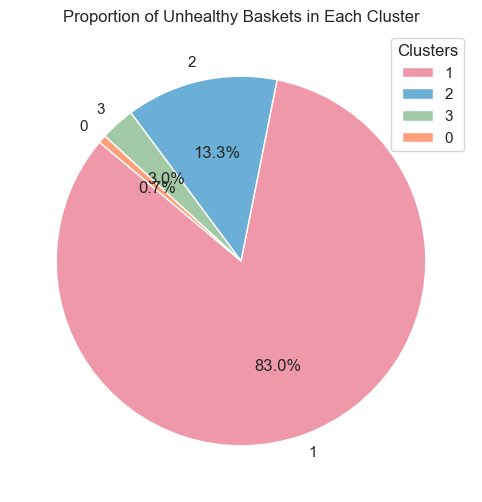

In [822]:
# Define custom colors for the pie chart
colors = ['#ef98aa', '#6baed6', '#a1c9a5', '#ffa07a']
# Plot the pie chart
plt.figure(figsize=(8, 6))
plt.pie(unhealthy_distribution, labels=unhealthy_distribution.index, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Proportion of Unhealthy Baskets in Each Cluster')

# Add legend
plt.legend(labels=unhealthy_distribution.index, title="Clusters", loc="best")

# Display the chart
plt.show()

In [429]:
# Calculating descriptive statistics for the specified columns in the df_basket_unhealthy DataFrame
df_describe_unhealthy = df_basket_unhealthy[['total_NPM_stand_score', 'sale_price', 'total_discounts', 'product_count', 'healthy_count']].describe()

# Rounding the descriptive statistics to two decimal places
df_describe_unhealthy_rounded = df_describe_unhealthy.round(3)

# Print the descriptive statistics to the console
print("Descriptive Statistics of Unhealthy Baskets:")
df_describe_unhealthy_rounded

Descriptive Statistics of Unhealthy Baskets:


,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count
count,105809.000,105809.000,105809.000,105809.000,105809.000
mean,2.946,17.477,-0.575,9.738,2.936
std,3.419,19.107,1.297,10.649,4.127
min,0.000,-2.000,-13.910,1.000,0.000
25%,0.741,4.410,-0.750,3.000,0.000
50%,1.774,10.450,0.000,6.000,1.000
75%,3.853,23.430,0.000,13.000,4.000
max,35.588,152.360,0.000,85.000,35.000


80% of the unhealthy baskets are concentrated in Cluster 0, indicating that baskets in this cluster typically exhibit the unhealthiest shopping patterns compared to those in other clusters. Notably, these baskets feature the lowest spending levels and the fewest items per transaction, which may suggest behaviours like quick check-outs or infrequent shopping occasions.

<br>

—  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  — 



<br>

### 4. Analysing Customer Shopping Patterns Through Basket Clusters
This analysis utilizes basket clustering to gain insights into customer shopping behaviors with a descriptive approach:  

- **Monthly Basket Cluster Counts**: Calculate the number of times each customer interacts with different basket clusters monthly.
- **Basket Cluster Analysis for Shopping Behavior Insights**: Uses basket cluster composition to identify common shopping behaviors, revealing key purchasing trends.
- **Correlation Analysis**:
  Utilizes a correlation matrix to uncover relationships among different basket clusters, helping to understand how various shopping behaviors interconnect.

Concluding the Analysis:  
- Upon completion of the outlined steps, the customer dataset will be updated with the revised customer cluster and frequency results, ensuring that the latest insights are accurately reflected in the records.

<br>

- **Monthly Basket Cluster Counts**  
  Calculate the number of times each customer interacts with different basket clusters monthly.

In [430]:
df_basket.head(1)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,Rice and Pasta,Specialty Fruits & Nuts,Standard Cakes,visit_ts,customer_id,month,week,day_of_week,date,hour
0,202301014158300100008,3.3,0.0,2,False,0.184,0,2,0.0,3.3,...,0,0,0,2023-01-01 09:36:00+00:00,ddd1142a-8fb8-4e7c-abbc-4be9b7c7189b,1,52,6,2023-01-01,9


In [431]:
df_basket_filtered.head(1)

,basket_id,total_NPM_stand_score,sale_price,total_discounts,product_count,healthy_count,mahalanobis,Cluster,shopping_pattern
0,202301014158300100008,0.184,3.3,0.0,2,0,0.99052,1,Premium Health Basket


In [432]:
df_basket_cluster = df_basket_filtered[['basket_id', 'Cluster', 'shopping_pattern']]

# Generate dummy variables for 'Cluster'
cluster_dummies = pd.get_dummies(df_basket_filtered['Cluster'], prefix='cluster')
# Concatenate the dummy variables with the original DataFrame
df_basket_cluster = pd.concat([df_basket_cluster, cluster_dummies], axis=1)

In [433]:
df_basket_cluster.head()

,basket_id,Cluster,shopping_pattern,cluster_0,cluster_1,cluster_2,cluster_3
0,202301014158300100008,1,Premium Health Basket,False,True,False,False
1,202301014158300100018,1,Premium Health Basket,False,True,False,False
2,202301014158300100022,1,Premium Health Basket,False,True,False,False
3,202301014158300100023,1,Premium Health Basket,False,True,False,False
4,202301014158300100024,2,Moderate Balance Basket,False,False,True,False


In [434]:
df_basket = df_basket.merge(df_basket_cluster, on='basket_id', how='left')

In [435]:
df_basket.head(1)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,week,day_of_week,date,hour,Cluster,shopping_pattern,cluster_0,cluster_1,cluster_2,cluster_3
0,202301014158300100008,3.3,0.0,2,False,0.184,0,2,0.0,3.3,...,52,6,2023-01-01,9,1.0,Premium Health Basket,False,True,False,False


In [436]:
# Group by 'customer_id' and 'month' and aggregate various metrics
df_customer_cluster_months = df_basket.groupby(['customer_id', 'month']).agg({
    'cluster_0': 'sum',  # Total number of products in cluster_0 per month
    'cluster_1': 'sum',  # Total number of products in cluster_1 per month
    'cluster_2': 'sum',  # Total number of products in cluster_2 per month
    'cluster_3': 'sum',  # Total number of products in cluster_3 per month
}).reset_index()

In [437]:
# Flatten the MultiIndex for columns
df_customer_cluster_months.columns = ['_'.join(col).rstrip('_') if type(col) is tuple else col for col in df_customer_cluster_months.columns]

# Rename the columns for better readability
df_customer_cluster_months.rename(columns={
    'cluster_0_sum': 'cluster_0',
    'cluster_1_sum': 'cluster_1',
    'cluster_2_sum': 'cluster_2',
    'cluster_3_sum': 'cluster_3'}, inplace=True)

In [438]:
# Display the resulting DataFrame
df_customer_cluster_months.head()

,customer_id,month,cluster_0,cluster_1,cluster_2,cluster_3
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,5,0,3,1,0
1,00038e5e-5784-41bf-9c15-c411af57b82f,3,False,True,False,False
2,00038e5e-5784-41bf-9c15-c411af57b82f,4,False,True,False,False
3,000990fa-5578-4c00-8146-767117716477,2,False,True,False,False
4,000990fa-5578-4c00-8146-767117716477,4,False,False,True,False


In [439]:
# Group by customer_id and calculate sums for necessary fields and averages where specified
df_customer_cluster_monthly = df_customer_cluster_months.groupby('customer_id').agg({
    'cluster_0': 'sum', 'cluster_1': 'sum', 'cluster_2': 'sum', 'cluster_3': 'sum'})

In [440]:
df_customer_cluster_monthly.head()

,cluster_0,cluster_1,cluster_2,cluster_3
customer_id,,,,
00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,0,3,1,0
00038e5e-5784-41bf-9c15-c411af57b82f,0,2,0,0
000990fa-5578-4c00-8146-767117716477,0,1,1,0
000ba767-5074-49ba-aba1-989ad3c47a9e,0,5,1,0
000c6b12-334d-425b-bb9c-57bae1f72ccd,0,9,0,0


In [441]:
# Calculate the number of unique months each customer has data for
group_sizes = df_customer_cluster_months.groupby('customer_id')['month'].nunique()

In [442]:
# Calculate monthly averages or totals divided by the number of months
for column in ['cluster_0', 'cluster_1', 'cluster_2', 'cluster_3']:
    df_customer_cluster_monthly[column] /= group_sizes

# Optionally, rename the columns to reflect that they are averages or total per month
df_customer_cluster_monthly.rename(columns={
    'cluster_0': 'bk_c0', 'cluster_1': 'bk_c1',
    'cluster_2': 'bk_c2', 'cluster_3': 'bk_c3'}, inplace=True)

In [443]:
print(len(df_customer_cluster_monthly))
df_customer_cluster_monthly.head()

26621


,bk_c0,bk_c1,bk_c2,bk_c3
customer_id,,,,
00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,0.0,3.0,1.0,0.0
00038e5e-5784-41bf-9c15-c411af57b82f,0.0,1.0,0.0,0.0
000990fa-5578-4c00-8146-767117716477,0.0,0.5,0.5,0.0
000ba767-5074-49ba-aba1-989ad3c47a9e,0.0,1.25,0.25,0.0
000c6b12-334d-425b-bb9c-57bae1f72ccd,0.0,3.0,0.0,0.0


In [444]:
# Reset the index of the DataFrame to turn 'customer_id' back into a column
df_customer_cluster_monthly.reset_index(inplace=True)

In [445]:
df_customer_cluster_monthly.head(2)

,customer_id,bk_c0,bk_c1,bk_c2,bk_c3
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,0.0,3.0,1.0,0.0
1,00038e5e-5784-41bf-9c15-c411af57b82f,0.0,1.0,0.0,0.0


In [446]:
# Check for duplicated values in the 'customer_id' column
duplicates = df_customer_cluster_monthly['customer_id'].duplicated()

# Print out the customer IDs that are duplicated
print(df_customer_cluster_monthly[duplicates]['customer_id'])

Series([], Name: customer_id, dtype: object)


In [889]:
df_customer_monthly = pd.read_csv(r'Results\Dataset\df_customer_monthly.csv')

In [890]:
df_customer_monthly.head(2)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,avg_total_unhealthy_products_count_per_month,avg_unhealthy_products_per_basket,avg_healthy_product_pct,avg_total_spent_on_healthy_per_month,avg_spent_on_healthy_per_basket,avg_total_spent_on_unhealthy_per_month,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,avg_number_of_healthy_baskets_per_month
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4.0,64.930,16.2325,-19.0050,-4.75125,47.0,11.75,27.0,6.75,20.0,5.0,0.546465,36.54,9.135,33.590,8.3975,0.495473,-0.095164,3.0
1,00038e5e-5784-41bf-9c15-c411af57b82f,1.0,2.875,2.8750,-1.5085,-1.50850,3.5,3.50,1.5,1.50,2.0,2.0,0.300000,1.50,1.500,1.675,1.6750,0.375000,-0.075000,0.5


In [891]:
df_customer_monthly = df_customer_monthly.merge(df_customer_cluster_monthly, on='customer_id', how='left')

In [892]:
print(len(df_customer_monthly))
df_customer_monthly.head(2)

26621


,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,avg_spent_on_healthy_per_basket,avg_total_spent_on_unhealthy_per_month,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,avg_number_of_healthy_baskets_per_month,bk_c0,bk_c1,bk_c2,bk_c3
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,4.0,64.930,16.2325,-19.0050,-4.75125,47.0,11.75,27.0,6.75,...,9.135,33.590,8.3975,0.495473,-0.095164,3.0,0.0,3.0,1.0,0.0
1,00038e5e-5784-41bf-9c15-c411af57b82f,1.0,2.875,2.8750,-1.5085,-1.50850,3.5,3.50,1.5,1.50,...,1.500,1.675,1.6750,0.375000,-0.075000,0.5,0.0,1.0,0.0,0.0


In [893]:
df_customer_monthly.to_csv('Results\Dataset\df_customer_monthly_cluster.csv', index=False)

<br>

- **Basket Cluster Composition Analysis**:  
  By examining the composition and distribution of basket clusters, this analysis identifies the most common shopping behaviors among customers. It provides a clear understanding of prevailing purchasing trends, allowing for better insights into customer preferences and behavior.

In [894]:
# Calculate the proportion of each basket cluster as a percentage of the total baskets
df_customer_monthly['bk_c0_%'] = df_customer_monthly['bk_c0'] / df_customer_monthly['avg_baskets_count_per_month']
df_customer_monthly['bk_c1_%'] = df_customer_monthly['bk_c1'] / df_customer_monthly['avg_baskets_count_per_month']
df_customer_monthly['bk_c2_%'] = df_customer_monthly['bk_c2'] / df_customer_monthly['avg_baskets_count_per_month']
df_customer_monthly['bk_c3_%'] = df_customer_monthly['bk_c3'] / df_customer_monthly['avg_baskets_count_per_month']

# Display the first 5 rows of the new percentage columns
df_customer_monthly[['customer_id', 'bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']].head()

,customer_id,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,0.0,0.75,0.25,0.0
1,00038e5e-5784-41bf-9c15-c411af57b82f,0.0,1.0,0.0,0.0
2,000990fa-5578-4c00-8146-767117716477,0.0,0.5,0.5,0.0
3,000ba767-5074-49ba-aba1-989ad3c47a9e,0.0,0.833333,0.166667,0.0
4,000c6b12-334d-425b-bb9c-57bae1f72ccd,0.0,1.0,0.0,0.0


In [895]:
# Sort values by the percentages of the second cluster (bk_c2_%)
df_customer_monthly = df_customer_monthly.sort_values(by=['bk_c2_%', 'bk_c0_%', 'bk_c3_%', 'bk_c1_%'], ascending=[False, False, False, False])
df_customer_monthly[['customer_id', 'bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']].head()

,customer_id,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
161,0169f084-cf16-491f-bf37-5c2e9de7bddf,0.0,0.0,1.0,0.0
2637,19c8b2a9-90e6-4467-ac91-3d4287b83540,0.0,0.0,1.0,0.0
21039,c9b3a693-bdb5-4945-b8e8-4039d3da165b,0.0,0.0,1.0,0.0
10,0013676a-f7a3-4169-9417-9ac3ed6fe97c,0.0,0.0,1.0,0.0
116,00fe8beb-9e77-4015-95b6-73caa9e207db,0.0,0.0,1.0,0.0


In [896]:
df_customer_monthly.to_csv('Results\Dataset\df_customer_monthly_cluster_%.csv', index=False)

In [455]:
df_customer_monthly_grouped = df_customer_monthly.groupby(['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']).size().reset_index(name='count')
df_customer_monthly_grouped

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count
0,0.000000,0.000000,0.000000,0.000000,19
1,0.000000,0.000000,0.000000,0.083333,1
2,0.000000,0.000000,0.000000,0.142857,1
3,0.000000,0.000000,0.000000,0.250000,1
4,0.000000,0.000000,0.000000,0.333333,1
...,...,...,...,...,...
7028,0.954545,0.000000,0.045455,0.000000,2
7029,0.954545,0.045455,0.000000,0.000000,1
7030,0.956522,0.043478,0.000000,0.000000,1
7031,1.000000,0.000000,0.000000,0.000000,176


In [456]:
total_count = df_customer_monthly_grouped['count'].sum()
total_count

26621

In [457]:
df_customer_monthly_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7033 entries, 0 to 7032
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   bk_c0_%  7033 non-null   float64
 1   bk_c1_%  7033 non-null   float64
 2   bk_c2_%  7033 non-null   float64
 3   bk_c3_%  7033 non-null   float64
 4   count    7033 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 274.9 KB


In [458]:
# Calculate the sum of percentages
df_customer_monthly_grouped['total_%'] = df_customer_monthly_grouped[['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']].sum(axis=1)

In [459]:
# Round the cluster percentages to the nearest 0.01
df_customer_monthly_grouped_round = df_customer_monthly_grouped.round(1)
df_customer_monthly_grouped_round

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count,total_%
0,0.0,0.0,0.0,0.0,19,0.0
1,0.0,0.0,0.0,0.1,1,0.1
2,0.0,0.0,0.0,0.1,1,0.1
3,0.0,0.0,0.0,0.2,1,0.2
4,0.0,0.0,0.0,0.3,1,0.3
...,...,...,...,...,...,...
7028,1.0,0.0,0.0,0.0,2,1.0
7029,1.0,0.0,0.0,0.0,1,1.0
7030,1.0,0.0,0.0,0.0,1,1.0
7031,1.0,0.0,0.0,0.0,176,1.0


In [460]:
total_count = df_customer_monthly_grouped_round['count'].sum()
total_count

26621

In [461]:
# Filter rows where 'total_%' is not approximately 1.0 within a small tolerance
rows_not_equal_one = df_customer_monthly_grouped_round[~np.isclose(df_customer_monthly_grouped_round['total_%'], 1.0, atol=1e-5)]
rows_not_equal_one

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count,total_%
0,0.0,0.0,0.0,0.0,19,0.0
1,0.0,0.0,0.0,0.1,1,0.1
2,0.0,0.0,0.0,0.1,1,0.1
3,0.0,0.0,0.0,0.2,1,0.2
4,0.0,0.0,0.0,0.3,1,0.3
...,...,...,...,...,...,...
6999,0.9,0.0,0.0,0.0,1,0.9
7003,0.9,0.0,0.1,0.0,1,0.9
7005,0.9,0.1,0.0,0.0,1,0.9
7010,0.9,0.0,0.0,0.0,1,0.9


In [462]:
# Define a function to adjust percentages and ensure total sums to 1.0
def adjust_percentages(row):
    total = row[['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']].sum()
    if total != 1.0:
        # Adjust each column proportionally
        row['bk_c0_%'] = round((row['bk_c0_%'] / total), 1)
        row['bk_c1_%'] = round((row['bk_c1_%'] / total), 1)
        row['bk_c2_%'] = round((row['bk_c2_%'] / total), 1)
        row['bk_c3_%'] = round((row['bk_c3_%'] / total), 1)
    return row

In [463]:
# Apply the function to adjust percentages and recalculate 'total_%' for accuracy
df_customer_monthly_grouped_adjusted = df_customer_monthly_grouped_round.apply(adjust_percentages, axis=1)

df_customer_monthly_grouped_adjusted

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3890780711.py:6: RuntimeWarning: invalid value encountered in scalar divide
  row['bk_c0_%'] = round((row['bk_c0_%'] / total), 1)
C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3890780711.py:7: RuntimeWarning: invalid value encountered in scalar divide
  row['bk_c1_%'] = round((row['bk_c1_%'] / total), 1)
C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3890780711.py:8: RuntimeWarning: invalid value encountered in scalar divide
  row['bk_c2_%'] = round((row['bk_c2_%'] / total), 1)
C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3890780711.py:9: RuntimeWarning: invalid value encountered in scalar divide
  row['bk_c3_%'] = round((row['bk_c3_%'] / total), 1)


,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count,total_%
0,NaN,NaN,NaN,NaN,19.0,0.0
1,0.0,0.0,0.0,1.0,1.0,0.1
2,0.0,0.0,0.0,1.0,1.0,0.1
3,0.0,0.0,0.0,1.0,1.0,0.2
4,0.0,0.0,0.0,1.0,1.0,0.3
...,...,...,...,...,...,...
7028,1.0,0.0,0.0,0.0,2.0,1.0
7029,1.0,0.0,0.0,0.0,1.0,1.0
7030,1.0,0.0,0.0,0.0,1.0,1.0
7031,1.0,0.0,0.0,0.0,176.0,1.0


In [464]:
total_count = df_customer_monthly_grouped_adjusted['count'].sum()
total_count

26621.0

In [465]:
df_customer_monthly_grouped_adjusted['count'] = df_customer_monthly_grouped_adjusted['count'].astype(int)

In [466]:
df_customer_monthly_grouped = df_customer_monthly_grouped_adjusted.groupby(['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%'])['count'].sum().reset_index(name='count')
df_customer_monthly_grouped

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count
0,0.0,0.0,0.0,1.0,77
1,0.0,0.0,0.2,0.7,2
2,0.0,0.0,0.2,0.8,5
3,0.0,0.0,0.3,0.7,10
4,0.0,0.0,0.4,0.6,3
...,...,...,...,...,...
451,0.8,0.2,0.0,0.0,47
452,0.9,0.0,0.0,0.1,14
453,0.9,0.0,0.1,0.0,36
454,0.9,0.1,0.0,0.0,27


In [467]:
total_count = df_customer_monthly_grouped['count'].sum()
total_count

26602

In [468]:
df_customer_monthly_grouped = df_customer_monthly_grouped.sort_values(by='count', ascending=False)
print(len(df_customer_monthly_grouped))
df_customer_monthly_grouped.head(15)

456


,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count
95,0.0,1.0,0.0,0.0,8324
92,0.0,0.8,0.2,0.0,2039
94,0.0,0.9,0.1,0.0,1793
89,0.0,0.7,0.3,0.0,1550
75,0.0,0.5,0.5,0.0,1027
81,0.0,0.6,0.4,0.0,797
10,0.0,0.0,1.0,0.0,572
53,0.0,0.3,0.7,0.0,494
66,0.0,0.4,0.6,0.0,398
39,0.0,0.2,0.8,0.0,280


In [469]:
# Calculate the total count
total_count = df_customer_monthly_grouped['count'].sum()

# Calculate the percentage of each row's count relative to the total count and add it directly to the DataFrame
df_customer_monthly_grouped['percentage'] = (df_customer_monthly_grouped['count'] / total_count * 100).round(2)

# Display the updated DataFrame to verify the values
df_customer_monthly_grouped.head(20)

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,count,percentage
95,0.0,1.0,0.0,0.0,8324,31.29
92,0.0,0.8,0.2,0.0,2039,7.66
94,0.0,0.9,0.1,0.0,1793,6.74
89,0.0,0.7,0.3,0.0,1550,5.83
75,0.0,0.5,0.5,0.0,1027,3.86
81,0.0,0.6,0.4,0.0,797,3.00
10,0.0,0.0,1.0,0.0,572,2.15
53,0.0,0.3,0.7,0.0,494,1.86
66,0.0,0.4,0.6,0.0,398,1.50
39,0.0,0.2,0.8,0.0,280,1.05


In [470]:
total_count

26602

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\861475634.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data['label'] = plot_data.apply(lambda x: f"Count: {x['count']} - {x['bk_c0_%']:.0%}, {x['bk_c1_%']:.0%}, {x['bk_c2_%']:.0%}, {x['bk_c3_%']:.0%}", axis=1)


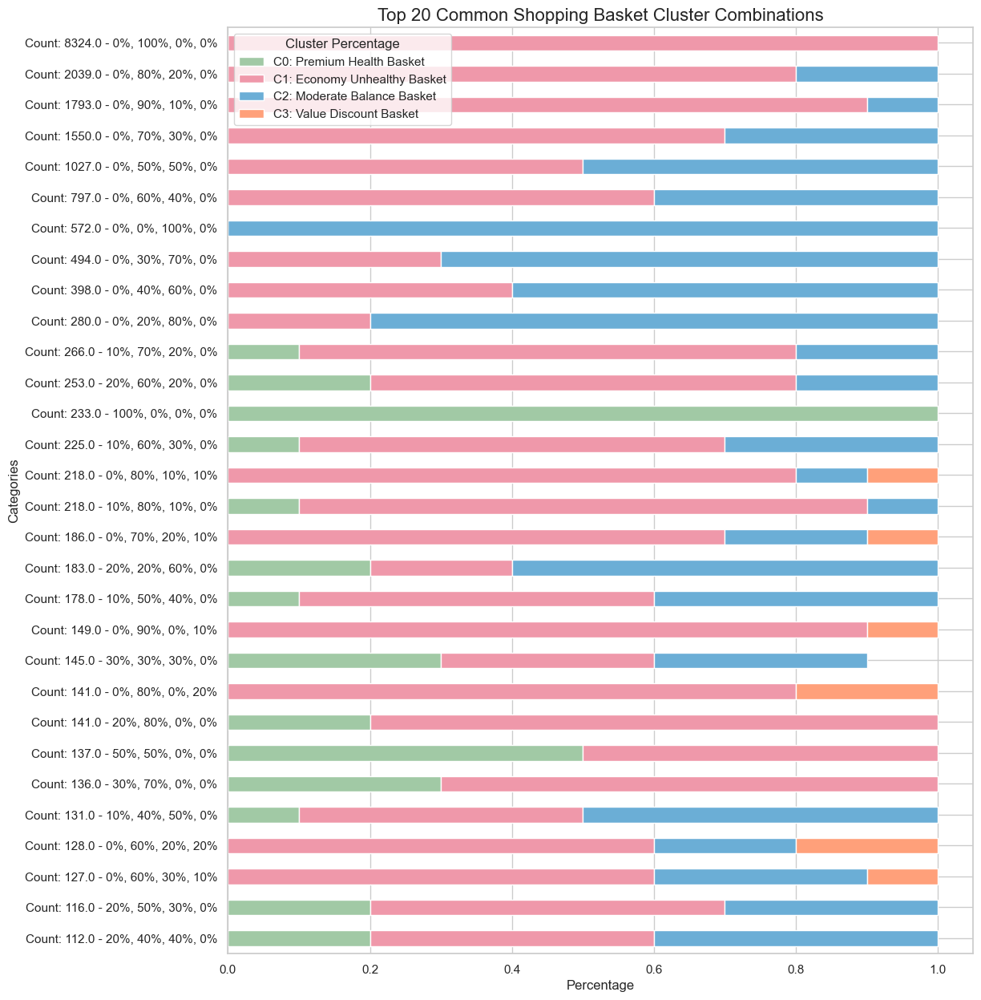

In [824]:
# Sort the data by 'count' in descending order
df_sorted = df_customer_monthly_grouped.sort_values(by='count', ascending=False)

# Exclude 'count' and 'percentage' columns for plotting after sorting
plot_data = df_sorted.head(30)

# Prepare Y-axis labels by combining count with cluster details
plot_data['label'] = plot_data.apply(lambda x: f"Count: {x['count']} - {x['bk_c0_%']:.0%}, {x['bk_c1_%']:.0%}, {x['bk_c2_%']:.0%}, {x['bk_c3_%']:.0%}", axis=1)

# Reverse the DataFrame to match top rows with top bars in the plot
plot_data = plot_data.iloc[::-1]

# Color mapping
# Define the colors according to the specified order
#colors = ['#fb607f', '#93c572', '#4682b4', '#ffa07a']
colors = ['#a1c9a5', '#ef98aa', '#6baed6', '#ffa07a']
#colors=['#66c2a5', '#e78ac3', '#8da0cb', '#fc8d62']

#8da0cb: Light Blue
#66c2a5: Light Green
#e78ac3: Light Pink
#fc8d62: Light Orange

# Cluster names mapping
cluster_names = [
    "C0: Premium Health Basket",
    "C1: Economy Unhealthy Basket",
    "C2: Moderate Balance Basket",
    "C3: Value Discount Basket"
]

# Create a horizontal stacked bar chart
ax = plot_data.plot(kind='barh', stacked=True, x='label', y=['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%'], color=colors, figsize=(12, 15))
ax.set_xlabel('Percentage')
ax.set_ylabel('Categories')
ax.set_title('Top 20 Common Shopping Basket Cluster Combinations', fontsize=16)
plt.legend(cluster_names, title='Cluster Percentage', loc='upper left')

# Display the plot
plt.show()

# Save the plot as an image file
fig.savefig(r'Results\Img\Top 20 Common Shopping Basket Cluster Combinations.png', dpi=300, bbox_inches='tight')

The plot shows the top 30 most common customer shopping behavior compositions at ASDA Morley store. The basket clusters `C1: Economy Unhealthy Basket` and `C2: Moderate Balance Basket` are the most frequently observed, appearing in various combinations and accounting for about half of the observed customer behaviors. This suggests that the **majority of customers prefer purchasing a small number of products with moderate spending, and health concerns may not be their primary consideration.**

Although `C0: Premium Health Basket` represents the healthiest shopping behavior, it generally makes up only 10-20% of the basket combinations, and tends to be the exclusive choice only when it dominates the basket composition. On the other hand, `C3: Value Discount Basket` is the least prevalent among the popular basket combinations, appearing in only 10-20% of the cases.

This plot helps in understanding customer preferences and tailoring product offerings and marketing strategies accordingly.

<br>

- **Correlation Analysis**

In [472]:
df_customer_monthly.columns

Index(['customer_id', 'avg_baskets_count_per_month',
       'avg_total_spent_per_month', 'avg_spent_per_basket',
       'avg_NPM_score_total_per_month', 'NPM_score_per_basket',
       'avg_total_products_count_per_month', 'avg_products_per_basket',
       'avg_total_healthy_products_count_per_month',
       'avg_healthy_products_per_basket',
       'avg_total_unhealthy_products_count_per_month',
       'avg_unhealthy_products_per_basket', 'avg_healthy_product_pct',
       'avg_total_spent_on_healthy_per_month',
       'avg_spent_on_healthy_per_basket',
       'avg_total_spent_on_unhealthy_per_month',
       'avg_spent_on_unhealthy_per_basket', 'avg_healthy_spend_pct',
       'avg_discount_rate', 'avg_number_of_healthy_baskets_per_month', 'bk_c0',
       'bk_c1', 'bk_c2', 'bk_c3', 'bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%'],
      dtype='object')

In [473]:
df_customer_monthly_corr = df_customer_monthly[['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']]

In [474]:
df_customer_monthly_corr.head(3)

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
161,0.0,0.0,1.0,0.0
2637,0.0,0.0,1.0,0.0
21039,0.0,0.0,1.0,0.0


In [475]:
# Calculate the correlation matrix
df_customer_monthly_corr = df_customer_monthly_corr.corr()
#df_customer_monthly_corr = df_customer_monthly_corr_standardized.corr()

# Display the correlation matrix
df_customer_monthly_corr

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
bk_c0_%,1.000000,-0.560365,-0.000458,0.032793
bk_c1_%,-0.560365,1.000000,-0.746254,-0.326639
bk_c2_%,-0.000458,-0.746254,1.000000,0.002625
bk_c3_%,0.032793,-0.326639,0.002625,1.000000


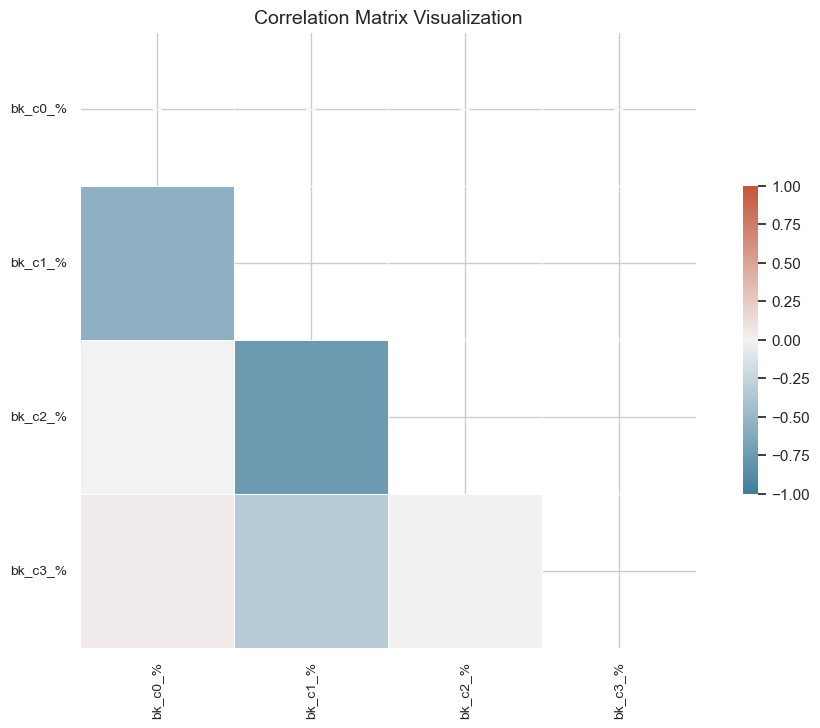

In [476]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(df_customer_monthly_corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns_heatmap = sns.heatmap(df_customer_monthly_corr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                          square=True, linewidths=0.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

# Adjust the size and rotation of the axis labels for better readability
sns_heatmap.set_xticklabels(sns_heatmap.get_xticklabels(), fontsize=10, rotation=90)
sns_heatmap.set_yticklabels(sns_heatmap.get_yticklabels(), fontsize=10, rotation=0)

# Title for the heatmap
plt.title("Correlation Matrix Visualization", fontsize=14)

# Display the plot
plt.show()

__Correlation Matrix Summary:__  

- **Negative correlation between C0 (Premium Health) and C1 (Economy Less Healthy) (-0.560365)**: This indicates a significant negative relationship between baskets with a higher proportion of healthy products (Premium Health) and those with a higher proportion of unhealthy products (Economy Less Healthy). It suggests that customers who tend to select healthier items are less likely to choose unhealthy items.

- **Strong negative correlation between C1 (Economy Less Healthy) and C2 (Moderate Balance) (-0.746254)**: There is a strong negative correlation between baskets with more unhealthy products (Economy Less Healthy) and those with a moderate mix of healthy and unhealthy products (Moderate Balance). This suggests that customers typically favour one of these basket types over the other, rather than selecting both.

- **Near-zero correlation between C0 (Premium Health) and C2 (Moderate Balance) (-0.000458)**: The near-zero correlation between baskets with more healthy products (Premium Health) and those with a moderate mix (Moderate Balance) indicates that these shopping patterns are largely independent of each other.

- **Weak correlations involving C3 (Value Discount)**: The Value Discount basket, focused on discount-driven purchases, shows weak correlations with the other basket types. This suggests that discount-oriented shopping behaviour is not strongly linked to the healthiness of the other basket types.

<br>

—  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  — 



<br>

### 5. Clustering Customers by Basket Behaviour Profiles  
**The analysis will involve a second round of K-means clustering, this time specifically focusing on customers**. Previously, baskets were clustered to categorize them into different types, a process completed in an earlier chapter. This revealed patterns such as high spending, health consciousness, and sensitivity to discounts.  
  
As a customer's shopping behavior often encompasses multiple basket types, this subsequent round of clustering **aims to group customers based on similar patterns of basket composition**. This approach will allow us to examine the combinations of basket types a customer frequently uses, facilitating the identification of groups of customers with comparable shopping behaviors and preferences.

**Fields used in this analysis include**:

- `bk_c0_%`: Percentage of Premium Health Basket
- `bk_c1_%`: Percentage of Economy Less Healthy Basket
- `bk_c2_%`: Percentage of Moderate Balance Basket
- `bk_c3_%`: Percentage of Value Discount Basket

Each field represents the frequency at which customers choose a specific basket type, aiding in the identification of common customer profiles.

**🤔 Where Are the Unhealthy Customers?**  
Upon analysing the results, the next step is to determine in which customer clusters the majority of unhealthy customers are predominantly found. This will enable us to identify specific clusters that exhibit unhealthy shopping patterns.

<br>

In [477]:
df_customer_basket_cluster_kmeans = df_customer_monthly.copy()

In [478]:
features = df_customer_monthly[['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']]

In [479]:
features.head(3)

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
161,0.0,0.0,1.0,0.0
2637,0.0,0.0,1.0,0.0
21039,0.0,0.0,1.0,0.0


##### Use the **Elbow Method** to Determine the Optimal Number of Clusters

In [480]:
# Start measuring time
start_time = time.time()

# Elbow Method
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 15.46 seconds


In [481]:
# Start measuring time
start_time = time.time()

# Silhouette Score
silhouette_scores = []
for i in range(2, 10):  # At least 2 clusters are needed to calculate the silhouette score
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(features)
    score = silhouette_score(features, kmeans.labels_)
    silhouette_scores.append(score)

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 122.13 seconds


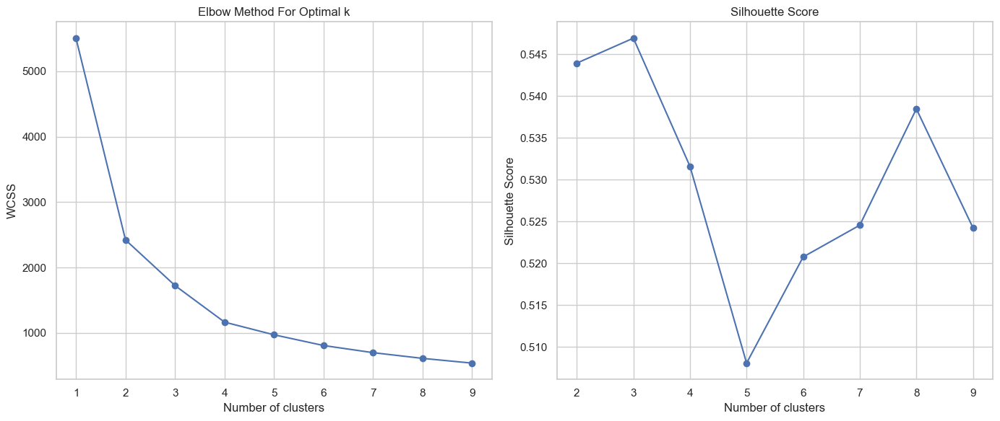

In [482]:
# Plotting the results
plt.figure(figsize=(14, 6))

# Plot for Elbow Method
plt.subplot(1, 2, 1)
plt.plot(range(1, 10), wcss, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

# Plot for Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

To stabilize the clustering outcome and secure the most accurate model, the KMeans algorithm is executed ten times with the same number of clusters. This approach leverages multiple initializations to minimize the total squared error, thus potentially circumventing local optima issues inherent to KMeans.

__K=3__

In [483]:
# Start measuring time
start_time = time.time()

# Initialize the variables to track the best score and model
best_score = float('inf') # Set to infinity to ensure any first run's inertia is considered lower
best_kmeans = None # Will hold the model with the lowest inertia

# Execute KMeans clustering 10 times to find the most stable and accurate model
for _ in range(10):
    kmeans = KMeans(n_clusters=3, random_state=42)
    kmeans.fit(features)
    # Check if the current model's inertia is the lowest we've encountered
    if kmeans.inertia_ < best_score:  # Compare the total squared error
        best_score = kmeans.inertia_
        best_kmeans = kmeans

# best_kmeans now contains the best model

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 15.43 seconds


Cluster Labeling

In [484]:
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

In [485]:
df_customer_basket_cluster_kmeans['Cluster_3'] = cluster_labels

##### Utilize PCA to visualize the clustering results

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


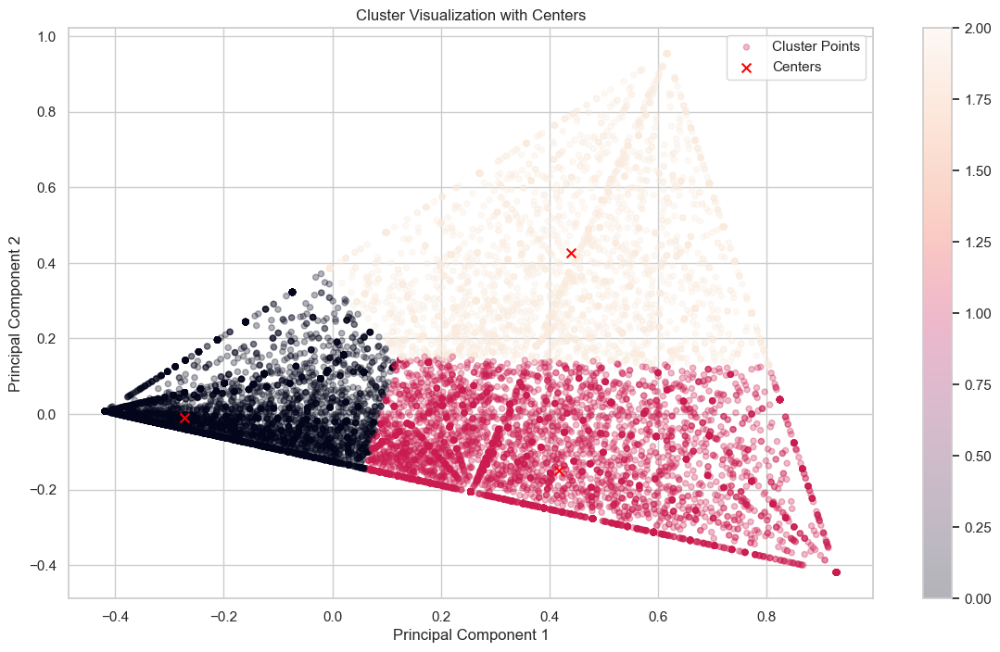

In [486]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)

# Create a scatter plot for the PCA-transformed data
plt.figure(figsize=(14, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1], c=cluster_labels, 
                      alpha=0.3, s=20, label='Cluster Points')
plt.title('Cluster Visualization with Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Calculate the PCA coordinates for cluster centers
cluster_centers_transformed = pca.transform(cluster_centers)

# Plot the cluster centers on the PCA scatter plot
centers = plt.scatter(cluster_centers_transformed[:, 0], cluster_centers_transformed[:, 1], 
                      c='red', s=50, alpha=1, marker='x', label='Centers')

# Display the legend
plt.legend()

# Display the color bar associated with the cluster points
plt.colorbar(scatter)
plt.show()

> __Evaluating and Interpreting Clusters__
> - ANOVA Testing to Assess Significant Differences Among Clusters
> - Analysis of Cluster Centroids

> - __ANOVA Testing to Assess Significant Differences Among Clusters__

In [487]:
df_customer_basket_cluster_kmeans.columns

Index(['customer_id', 'avg_baskets_count_per_month',
       'avg_total_spent_per_month', 'avg_spent_per_basket',
       'avg_NPM_score_total_per_month', 'NPM_score_per_basket',
       'avg_total_products_count_per_month', 'avg_products_per_basket',
       'avg_total_healthy_products_count_per_month',
       'avg_healthy_products_per_basket',
       'avg_total_unhealthy_products_count_per_month',
       'avg_unhealthy_products_per_basket', 'avg_healthy_product_pct',
       'avg_total_spent_on_healthy_per_month',
       'avg_spent_on_healthy_per_basket',
       'avg_total_spent_on_unhealthy_per_month',
       'avg_spent_on_unhealthy_per_basket', 'avg_healthy_spend_pct',
       'avg_discount_rate', 'avg_number_of_healthy_baskets_per_month', 'bk_c0',
       'bk_c1', 'bk_c2', 'bk_c3', 'bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%',
       'Cluster_3'],
      dtype='object')

In [488]:
# List of features to test for significant differences among clusters
features_to_test = ['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']

# Initialize a list or dictionary to store the ANOVA test results
anova_results = []

# Loop through each feature to perform the ANOVA test
for feature in features_to_test:
    # Prepare the data for each cluster
    data0 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_3'] == 0][feature]
    data1 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_3'] == 1][feature]
    data2 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_3'] == 2][feature]

    # Perform the ANOVA test
    stat, p_value = f_oneway(data0, data1, data2)
    
    # Store the results
    anova_results.append({'Feature': feature, 'ANOVA Statistic': stat, 'P-Value': p_value})

    # Print each feature's ANOVA test result
    print(f"ANOVA test for {feature}: Stat={stat:.2f}, P-value={p_value:.4f}")

ANOVA test for bk_c0_%: Stat=28363.50, P-value=0.0000
ANOVA test for bk_c1_%: Stat=42843.15, P-value=0.0000
ANOVA test for bk_c2_%: Stat=24893.51, P-value=0.0000
ANOVA test for bk_c3_%: Stat=906.01, P-value=0.0000


In [489]:
df_anova_results = pd.DataFrame(anova_results)

df_anova_results = df_anova_results.sort_values(by='ANOVA Statistic', ascending=False)
df_anova_results

,Feature,ANOVA Statistic,P-Value
1,bk_c1_%,42843.147492,0.0
0,bk_c0_%,28363.503851,0.0
2,bk_c2_%,24893.509404,0.0
3,bk_c3_%,906.014882,0.0


The ANOVA results indicate that the percentages of the different basket types (**bk_c1_%, bk_c0_%, bk_c2_%, and bk_c3_%**) all show statistically significant differences across the groups, as evidenced by the high ANOVA statistics and P-values of 0.0 for each feature. This suggests that the variation in the distribution of these basket types is not due to random chance.

> - __Analysis of Cluster Centroids__

In [490]:
features.head()

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
161,0.0,0.0,1.0,0.0
2637,0.0,0.0,1.0,0.0
21039,0.0,0.0,1.0,0.0
10,0.0,0.0,1.0,0.0
116,0.0,0.0,1.0,0.0


In [491]:
feature_names = features.columns.tolist()  # Retrieve the list of feature names

# Create a new DataFrame for cluster centers, using feature names as column names
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=feature_names)
df_cluster_centers

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
0,0.014532,0.881383,0.084732,0.015051
1,0.060141,0.344828,0.536746,0.046259
2,0.485871,0.203228,0.179207,0.088412


In [492]:
df_customer_basket_cluster_kmeans['Cluster_3'].value_counts()

Cluster_3
0    16197
1     7436
2     2988
Name: count, dtype: int64

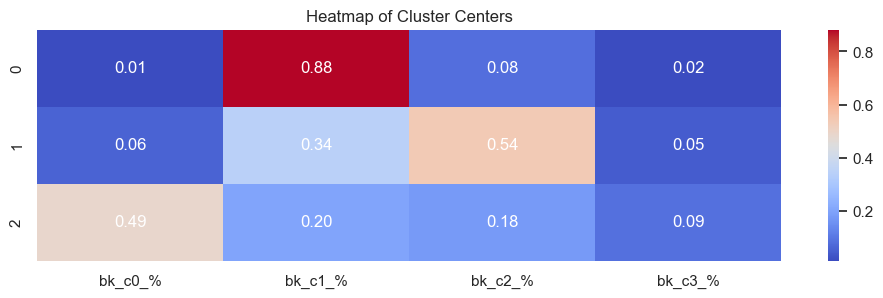

In [493]:
# Set the figure size
plt.figure(figsize=(12, 3))

# Create the heatmap, disable automatic annotations
ax = sns.heatmap(df_cluster_centers, cmap='coolwarm', fmt=".2f", annot=False)
plt.title("Heatmap of Cluster Centers")

# Use a for loop to manually add value labels
for (i, j), val in np.ndenumerate(df_cluster_centers):
    # Place text at the center of each cell using (j + 0.5, i + 0.5) to adjust for cell center
    ax.text(j + 0.5, i + 0.5, f'{val:.2f}', ha='center', va='center', color='white')

plt.show()

<br>

__K=4__

In [494]:
# Start measuring time
start_time = time.time()

# Initialize the variables to track the best score and model
best_score = float('inf') # Set to infinity to ensure any first run's inertia is considered lower
best_kmeans = None # Will hold the model with the lowest inertia

# Execute KMeans clustering 10 times to find the most stable and accurate model
for _ in range(10):
    kmeans = KMeans(n_clusters=4, random_state=42)
    kmeans.fit(features)
    # Check if the current model's inertia is the lowest we've encountered
    if kmeans.inertia_ < best_score:  # Compare the total squared error
        best_score = kmeans.inertia_
        best_kmeans = kmeans

# best_kmeans now contains the best model

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 11.87 seconds


Cluster Labeling

In [495]:
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

In [496]:
df_customer_basket_cluster_kmeans['Cluster_4'] = cluster_labels

##### Utilize PCA to visualize the clustering results

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


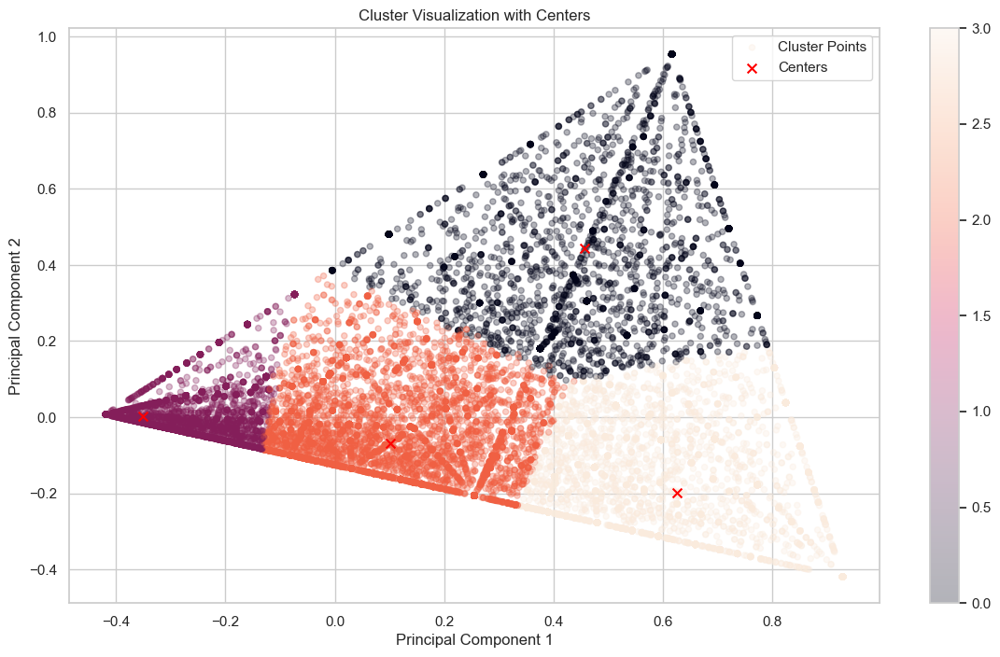

In [497]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)

# Create a scatter plot for the PCA-transformed data
plt.figure(figsize=(14, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1], c=cluster_labels, 
                      alpha=0.3, s=20, label='Cluster Points')
plt.title('Cluster Visualization with Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Calculate the PCA coordinates for cluster centers
cluster_centers_transformed = pca.transform(cluster_centers)

# Plot the cluster centers on the PCA scatter plot
centers = plt.scatter(cluster_centers_transformed[:, 0], cluster_centers_transformed[:, 1], 
                      c='red', s=50, alpha=1, marker='x', label='Centers')

# Display the legend
plt.legend()

# Display the color bar associated with the cluster points
plt.colorbar(scatter)
plt.show()

> __Evaluating and Interpreting Clusters__
> - ANOVA Testing to Assess Significant Differences Among Clusters
> - Analysis of Cluster Centroids

> - __ANOVA Testing to Assess Significant Differences Among Clusters__

In [498]:
# List of features to test for significant differences among clusters
features_to_test = ['bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%']

# Initialize a list or dictionary to store the ANOVA test results
anova_results = []

# Loop through each feature to perform the ANOVA test
for feature in features_to_test:
    # Prepare the data for each cluster
    data0 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_4'] == 0][feature]
    data1 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_4'] == 1][feature]
    data2 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_4'] == 2][feature]
    data3 = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_4'] == 3][feature]
    
    # Perform the ANOVA test
    stat, p_value = f_oneway(data0, data1, data2, data3)
    
    # Store the results
    anova_results.append({'Feature': feature, 'ANOVA Statistic': stat, 'P-Value': p_value})

    # Print each feature's ANOVA test result
    print(f"ANOVA test for {feature}: Stat={stat:.2f}, P-value={p_value:.4f}")

ANOVA test for bk_c0_%: Stat=19636.52, P-value=0.0000
ANOVA test for bk_c1_%: Stat=63710.37, P-value=0.0000
ANOVA test for bk_c2_%: Stat=33872.69, P-value=0.0000
ANOVA test for bk_c3_%: Stat=644.68, P-value=0.0000


In [499]:
df_anova_results = pd.DataFrame(anova_results)

df_anova_results = df_anova_results.sort_values(by='ANOVA Statistic', ascending=False)
df_anova_results

,Feature,ANOVA Statistic,P-Value
1,bk_c1_%,63710.369773,0.0
2,bk_c2_%,33872.689715,0.0
0,bk_c0_%,19636.520177,0.0
3,bk_c3_%,644.682631,0.0


The ANOVA results show that the percentages of different basket types (**bk_c1_%, bk_c2_%, bk_c0_%, and bk_c3_%**) differ significantly across the groups. The high ANOVA statistics and P-values of 0.0 for each feature indicate that these differences are statistically significant, meaning that the variation in these basket type distributions is unlikely to be due to random chance.

> - __Analysis of Cluster Centroids__

In [500]:
features.head()

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
161,0.0,0.0,1.0,0.0
2637,0.0,0.0,1.0,0.0
21039,0.0,0.0,1.0,0.0
10,0.0,0.0,1.0,0.0
116,0.0,0.0,1.0,0.0


In [501]:
feature_names = features.columns.tolist()  # Retrieve the list of feature names

# Create a new DataFrame for cluster centers, using feature names as column names
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=feature_names)
df_cluster_centers

,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
0,0.504962,0.186395,0.178882,0.086567
1,0.009102,0.944397,0.035540,0.008593
2,0.046107,0.583899,0.314349,0.042212
3,0.073140,0.187057,0.682466,0.047911


In [502]:
df_customer_basket_cluster_kmeans['Cluster_4'].value_counts()

Cluster_4
1    12341
2     7877
3     3664
0     2739
Name: count, dtype: int64

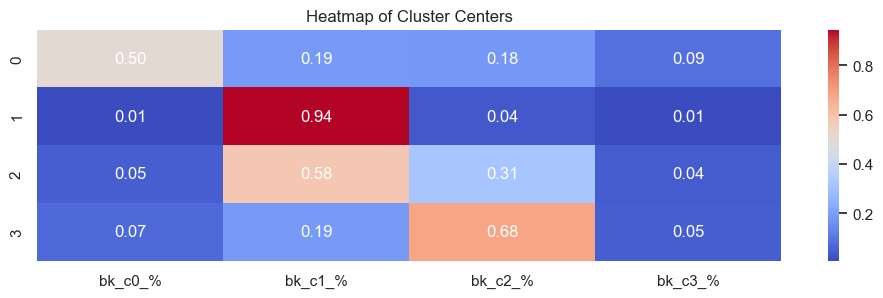

In [503]:
# Set the figure size
plt.figure(figsize=(12, 3))

# Create the heatmap, disable automatic annotations
ax = sns.heatmap(df_cluster_centers, cmap='coolwarm', fmt=".2f", annot=False)
plt.title("Heatmap of Cluster Centers")

# Use a for loop to manually add value labels
for (i, j), val in np.ndenumerate(df_cluster_centers):
    # Place text at the center of each cell using (j + 0.5, i + 0.5) to adjust for cell center
    ax.text(j + 0.5, i + 0.5, f'{val:.2f}', ha='center', va='center', color='white')

plt.show()

- **Calculate the health score for each basket in the customer clusters**

In [504]:
df_customer_basket_cluster_kmeans.columns

Index(['customer_id', 'avg_baskets_count_per_month',
       'avg_total_spent_per_month', 'avg_spent_per_basket',
       'avg_NPM_score_total_per_month', 'NPM_score_per_basket',
       'avg_total_products_count_per_month', 'avg_products_per_basket',
       'avg_total_healthy_products_count_per_month',
       'avg_healthy_products_per_basket',
       'avg_total_unhealthy_products_count_per_month',
       'avg_unhealthy_products_per_basket', 'avg_healthy_product_pct',
       'avg_total_spent_on_healthy_per_month',
       'avg_spent_on_healthy_per_basket',
       'avg_total_spent_on_unhealthy_per_month',
       'avg_spent_on_unhealthy_per_basket', 'avg_healthy_spend_pct',
       'avg_discount_rate', 'avg_number_of_healthy_baskets_per_month', 'bk_c0',
       'bk_c1', 'bk_c2', 'bk_c3', 'bk_c0_%', 'bk_c1_%', 'bk_c2_%', 'bk_c3_%',
       'Cluster_3', 'Cluster_4'],
      dtype='object')

In [505]:
df_customer_basket_cluster_kmeans.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0,bk_c1,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,Cluster_3,Cluster_4
161,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.5,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,1,3


In [506]:
# Calculate the mean health scores for each cluster
avg_health_scores = df_customer_basket_cluster_kmeans.groupby('Cluster_4')['avg_NPM_score_total_per_month'].mean()

# Print the average health scores
print("Average Health Scores by Cluster:")
print(avg_health_scores)

# Get the descriptive statistics for the average health scores
description = avg_health_scores.describe()

# Print the descriptive statistics
print("\nDescriptive Statistics for Average Health Scores:")
print(description)

Average Health Scores by Cluster:
Cluster_4
0   -39.869501
1    -3.623086
2   -14.871465
3   -18.481911
Name: avg_NPM_score_total_per_month, dtype: float64

Descriptive Statistics for Average Health Scores:
count     4.000000
mean    -19.211491
std      15.156075
min     -39.869501
25%     -23.828808
50%     -16.676688
75%     -12.059370
max      -3.623086
Name: avg_NPM_score_total_per_month, dtype: float64


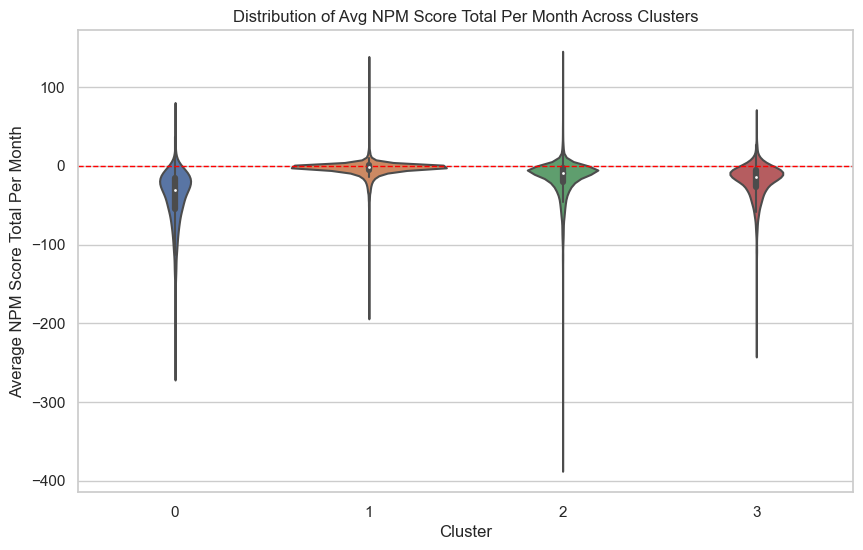

In [507]:
# Set the size of the figure
plt.figure(figsize=(10, 6))

# Create a violin plot to display the distribution of 'avg_NPM_score_total_per_month' across each cluster in 'Cluster_4'
sns.violinplot(x='Cluster_4', y='avg_NPM_score_total_per_month', data=df_customer_basket_cluster_kmeans)

# Set the title of the chart and the labels for the axes
plt.title('Distribution of Avg NPM Score Total Per Month Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Average NPM Score Total Per Month')

# Add a horizontal red dashed line at y=0
plt.axhline(y=0, color='red', linestyle='--', linewidth=1, label='Neutral Score Threshold')

# Display the plot
plt.show()

In [508]:
# Group the data by 'Cluster_4' and obtain descriptive statistics for 'avg_NPM_score_total_per_month'
description = df_customer_basket_cluster_kmeans.groupby('Cluster_4')['avg_NPM_score_total_per_month'].describe()

# Print the descriptive statistics for health scores across different clusters
print("Descriptive Statistics for Health Scores Across Clusters:")
description

Descriptive Statistics for Health Scores Across Clusters:


,count,mean,std,min,25%,50%,75%,max
Cluster_4,,,,,,,,
0,2739.0,-39.869501,35.986008,-257.2198,-55.040600,-30.203000,-15.842875,65.6230
1,12341.0,-3.623086,10.042882,-191.2610,-5.378250,-1.631500,0.563000,135.8026
2,7877.0,-14.871465,22.805694,-380.3432,-20.311200,-8.893750,-3.050500,137.9578
3,3664.0,-18.481911,22.049376,-234.1944,-26.952188,-13.811167,-5.467000,62.7146


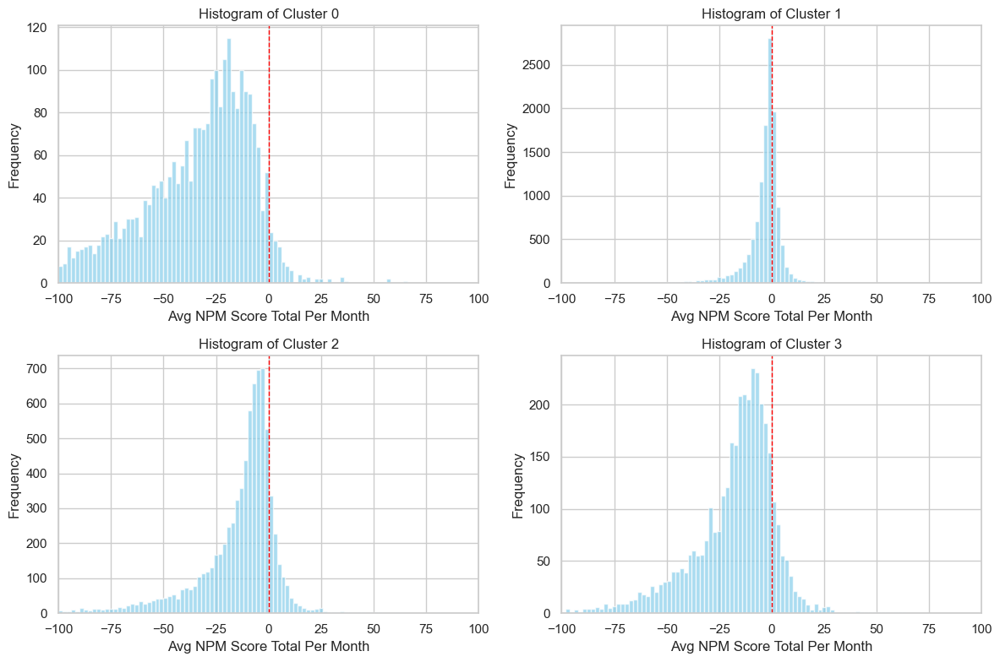

In [509]:
# Set the overall figure size
plt.figure(figsize=(12, 8))

# Define the number of clusters
num_clusters = 4

# Loop through each cluster to create a histogram
for i in range(num_clusters):
    # Create a subplot for each histogram
    plt.subplot(2, 2, i+1)  # This arranges the plots in a 2x2 grid
    # Filter the data for the current cluster
    cluster_data = df_customer_basket_cluster_kmeans[df_customer_basket_cluster_kmeans['Cluster_4'] == i]['avg_NPM_score_total_per_month']
    # Plot the histogram
    plt.hist(cluster_data, bins=range(-100, 100, 2), color='skyblue', alpha=0.7)  # Adjust the number of bins and color as needed
    # Set the title for each histogram using the cluster number
    plt.title(f'Histogram of Cluster {i}')
    plt.xlabel('Avg NPM Score Total Per Month')
    plt.ylabel('Frequency')
    # Set x-axis limit
    plt.xlim(-100, 100)
    # Add a red dashed line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Health Threshold')

    # Optionally, add a legend if needed (uncomment the line below if you want to see the legend in each subplot)
    # plt.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
# Show the plot
plt.show()

##### Rename the customer clusters based on the findings

In [880]:
# Define the new cluster names based on your shopping patterns dictionary
shopping_patterns = {
    0: "C0: Health-Conscious Shoppers",
    1: "C1: Cost-Driven, Less-Health-Conscious Shoppers",
    2: "C2: Cost-Conscious Balanced Shoppers",
    3: "C3: Balanced Economy Shoppers"
}

In [881]:
df_customer_basket_cluster_kmeans.head()

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0,bk_c1,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,Cluster_3,Cluster_4
161,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.500000,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,1,3
2637,19c8b2a9-90e6-4467-ac91-3d4287b83540,2.333333,75.443333,30.395833,-17.777667,-8.933167,53.333333,21.916667,29.000000,12.916667,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,1,3
21039,c9b3a693-bdb5-4945-b8e8-4039d3da165b,3.333333,117.723333,34.915833,-18.082667,-5.617250,77.666667,22.916667,41.000000,11.833333,...,0.0,0.0,3.333333,0.0,0.0,0.0,1.0,0.0,1,3
10,0013676a-f7a3-4169-9417-9ac3ed6fe97c,1.000000,12.900000,12.900000,-9.372000,-9.372000,10.000000,10.000000,7.000000,7.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1,3
116,00fe8beb-9e77-4015-95b6-73caa9e207db,1.000000,56.430000,56.430000,-6.614000,-6.614000,36.000000,36.000000,17.000000,17.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1,3


In [882]:
df_customer_basket_cluster = df_customer_basket_cluster_kmeans[['customer_id', 'Cluster_4']]

In [883]:
# Map the cluster numbers to the new names in the DataFrame
df_customer_basket_cluster['shopping_pattern'] = df_customer_basket_cluster['Cluster_4'].map(shopping_patterns)

# Display the first few rows of the DataFrame to confirm the changes
df_customer_basket_cluster.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\1883524130.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customer_basket_cluster['shopping_pattern'] = df_customer_basket_cluster['Cluster_4'].map(shopping_patterns)


,customer_id,Cluster_4,shopping_pattern
161,0169f084-cf16-491f-bf37-5c2e9de7bddf,3,C3: Balanced Economy Shoppers
2637,19c8b2a9-90e6-4467-ac91-3d4287b83540,3,C3: Balanced Economy Shoppers
21039,c9b3a693-bdb5-4945-b8e8-4039d3da165b,3,C3: Balanced Economy Shoppers
10,0013676a-f7a3-4169-9417-9ac3ed6fe97c,3,C3: Balanced Economy Shoppers
116,00fe8beb-9e77-4015-95b6-73caa9e207db,3,C3: Balanced Economy Shoppers


In [884]:
# Rename the 'Cluster_4' column to 'shopping_pattern_cluster'
df_customer_basket_cluster = df_customer_basket_cluster.rename(columns={
    'Cluster_4': 'shopping_pattern_cluster'})

In [885]:
df_customer_basket_cluster.columns

Index(['customer_id', 'shopping_pattern_cluster', 'shopping_pattern'], dtype='object')

In [900]:
df_customer_monthly = pd.read_csv(r'Results\Dataset\df_customer_monthly_cluster_%.csv')

In [901]:
df_customer_monthly.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,avg_discount_rate,avg_number_of_healthy_baskets_per_month,bk_c0,bk_c1,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.5,...,-0.016941,2.333333,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0


In [902]:
df_customer_monthly = df_customer_monthly.merge(df_customer_basket_cluster, on='customer_id', how='left')

In [903]:
df_customer_monthly.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0,bk_c1,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.5,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers


In [904]:
df_customer_monthly.to_csv(r'Results\Dataset\df_customer_monthlycustomer_shopping_pattern_cluster.csv', index=False)

<br>

- **🤔 Where Are the Unhealthy Customers?**:  
  This analysis seeks to determine which customer cluster primarily consists of "Unhealthy Customers," defined as those whose total monthly NPM basket score exceeds 0. The goal is to validate the hypothesis that certain consumer behavior combinations are more likely to purchase unhealthy products..

In [851]:
df_customer_monthly['avg_NPM_score_total_per_month'].head()

0   -19.005000
1    -1.508500
2   -10.749500
3    -0.998750
4    -2.674667
Name: avg_NPM_score_total_per_month, dtype: float64

In [852]:
df_unhealthy_customers = df_customer_monthly[df_customer_monthly['avg_NPM_score_total_per_month'] > 0]
print(len(df_customer_monthly))
print(len(df_unhealthy_customers))
df_unhealthy_customers.head(2)

26621
5421


,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,avg_spent_on_unhealthy_per_basket,avg_healthy_spend_pct,avg_discount_rate,avg_number_of_healthy_baskets_per_month,bk_c0,bk_c1,bk_c2,bk_c3,shopping_pattern_cluster,shopping_pattern
5,000da57f-ebb0-4281-954f-d6e27aa1bae2,1.0,7.525,7.525000,0.9075,0.907500,6.5,6.500000,2.5,2.50,...,3.525000,0.543714,0.000000,0.5,0.0,1.0,0.0,0.0,1,"C1: Cost-Driven, Less-Health-Conscious"
7,0010397f-0c78-48e3-a357-39a6be3324fd,4.4,201.422,47.488786,14.7724,2.076639,161.2,38.677143,57.0,14.44,...,32.079129,0.423703,-0.045609,1.8,0.4,1.0,1.8,0.6,3,C3: Balanced Economy Shoppers


In [853]:
# Calculate the number of unhealthy customers
num_unhealthy_customers = len(df_unhealthy_customers)
# Calculate the number of healthy customers
num_healthy_customers = len(df_customer_basket_cluster_kmeans) - num_unhealthy_customers

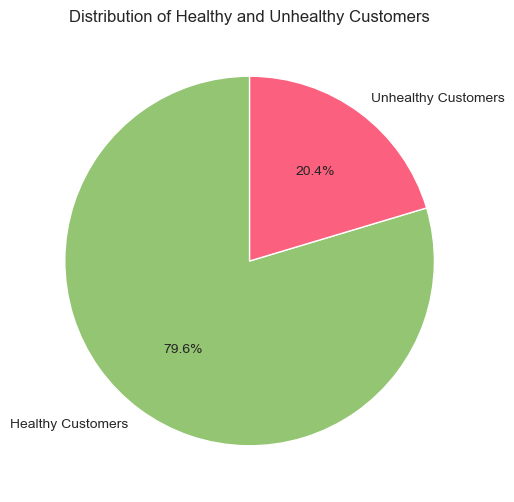

In [854]:
# Labels for the sections of our pie chart
labels = ['Healthy Customers', 'Unhealthy Customers']
# Values for each section
sizes = [num_healthy_customers, num_unhealthy_customers]
# Colors for each section
colors = ['#93c572', '#fb607f']

# Set up the figure for the pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart and capture the returned text objects for autopct
patches, texts, autotexts = plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)

# Set font size for the labels
for text in texts:
    text.set_fontsize(10)

# Set font size for the percentage annotations
for autotext in autotexts:
    autotext.set_fontsize(10)

# Set the title of the pie chart
plt.title('Distribution of Healthy and Unhealthy Customers', fontsize=12)

# Show the pie chart
plt.show()

In [905]:
df_customer_monthly['shopping_pattern'].value_counts()

shopping_pattern
C1: Cost-Driven, Less-Health-Conscious Shoppers    12341
C2: Cost-Conscious Balanced Shoppers                7877
C3: Balanced Economy Shoppers                       3664
C0: Health-Conscious Shoppers                       2739
Name: count, dtype: int64

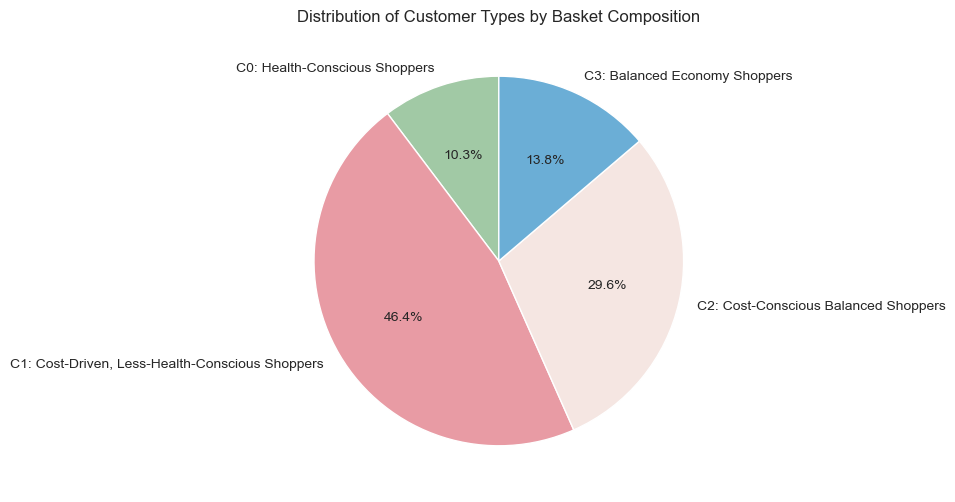

In [913]:
# Manually specify the order of the categories
order = [
    "C0: Health-Conscious Shoppers",
    "C1: Cost-Driven, Less-Health-Conscious Shoppers",
    "C2: Cost-Conscious Balanced Shoppers",
    "C3: Balanced Economy Shoppers"
]

# Calculate the frequency distribution and reorder it according to the specified order
pattern_counts = df_customer_monthly['shopping_pattern'].value_counts().reindex(order)

# Define colors for each segment of the pie chart
colors = ['#a1c9a5', '#e89ba4', '#f5e6e2', '#6baed6']
#f4bdc9: Pale Pink
#6baed6: Light Blue
#e0cbe0: Pale Lavender
#a1c9a5: Light Sage Green

# Create the pie chart
plt.figure(figsize=(8, 6))  # Set the figure size
patches, texts, autotexts = plt.pie(pattern_counts, labels=pattern_counts.index, autopct='%1.1f%%',
                                    startangle=90, colors=colors)

# Adjust font size for labels and percentages
for text in texts:
    text.set_fontsize(10)
for autotext in autotexts:
    autotext.set_fontsize(10)

# Set a title with a custom font size
plt.title('Distribution of Customer Types by Basket Composition', fontsize=12)

# Save the plot as a file (e.g., PNG)
plt.savefig(r'Results\Dataset\customer_type_distribution.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

Basket composition offers valuable insights into customer shopping habits. Customers were categorised into four distinct types based on the contents of their baskets, each reflecting different purchasing behaviours: `Health-Conscious Shoppers (Type 0)`, `Cost-Driven, Less-Health-Conscious Shoppers (Type 1)`, , `Cost-Conscious Balanced Shoppers (Type 2)`, and `Balanced Economy Shoppers (Type 3)`. Approximately 40% of customers fall into the `Cost-Driven, Less-Health-Conscious (Type 1)` category, while around 10% are identified as `Health-Conscious Shoppers (Type 0)`.

In [916]:
# Calculate the frequency of each cluster within the unhealthy customers DataFrame
cluster_distribution = df_unhealthy_customers['shopping_pattern'].value_counts()

# Optionally, sort the index if you want the clusters to be in numerical order
cluster_distribution = cluster_distribution.sort_index()

# Print the cluster distribution
print("Distribution of unhealthy customers across clusters:")
cluster_distribution

Distribution of unhealthy customers across clusters:


shopping_pattern
C0: ShoppersHealth-Conscious Shoppers      107
C1: Cost-Driven, Less-Health-Conscious    3784
C2: Cost-Conscious Balanced Shoppers      1091
C3: Balanced Economy Shoppers              439
Name: count, dtype: int64

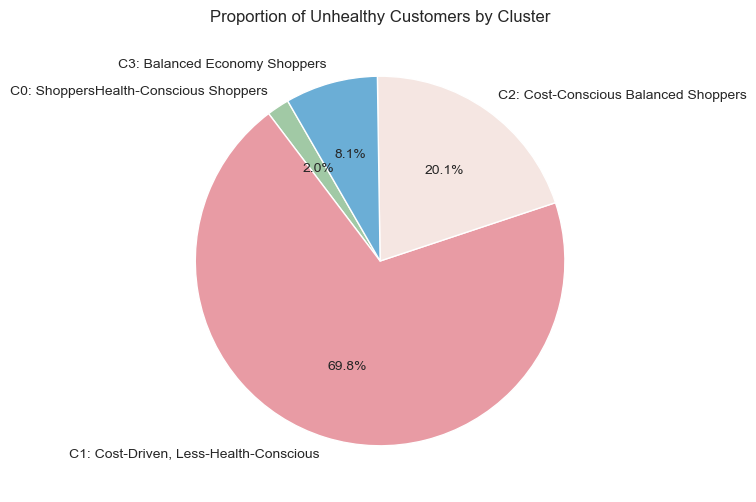

In [918]:
# Calculate the proportions for the pie chart
cluster_proportions = cluster_distribution / cluster_distribution.sum()

# Set up the figure for the pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart and store the label texts and the percentage texts
patches, texts, autotexts = plt.pie(cluster_proportions, labels=cluster_proportions.index,
                                    autopct='%1.1f%%', startangle=120,
                                    colors = ['#a1c9a5', '#e89ba4', '#f5e6e2', '#6baed6'])

# Customize the font size for labels and percentage texts
for text in texts:
    text.set_fontsize(10)  # Increase the font size for labels
for autotext in autotexts:
    autotext.set_fontsize(10)  # Increase the font size for percentage annotations

# Add a title with a custom font size
plt.title('Proportion of Unhealthy Customers by Cluster', fontsize=12)

# Show the plot
plt.show()

The data shows that **70% of unhealthy customers**, as identified by their average NPM basket scores, **are primarily found in Customer Cluster 0**. This particular cluster is characterized by cost-driven shopping habits, minimal spending, and a limited selection of products, with little regard for healthiness. Customer Cluster 2 also has a high number of unhealthy customers. In contrast, Customer Cluster 3, which shows a strong inclination toward health-conscious shopping behaviors (representing 50% of their shopping choices), contains the fewest unhealthy customers.  

The main point highlighted here is that **unhealthy customers are mostly part of clusters that prioritize cost over health, particularly Cluster 0**. This emphasizes **a clear connection between cost-focused shopping patterns and less healthy purchasing decisions**.

In [528]:
# Determine if each basket is healthy or unhealthy
df_customer_monthly['basket_health'] = df_customer_monthly['avg_NPM_score_total_per_month'].apply(lambda x: 'Unhealthy' if x > 0 else 'Healthy')

In [529]:
# Group by 'shopping_pattern' and 'basket_health' to get counts
pattern_health_counts = df_customer_monthly.groupby(['shopping_pattern', 'basket_health']).size().unstack(fill_value=0)

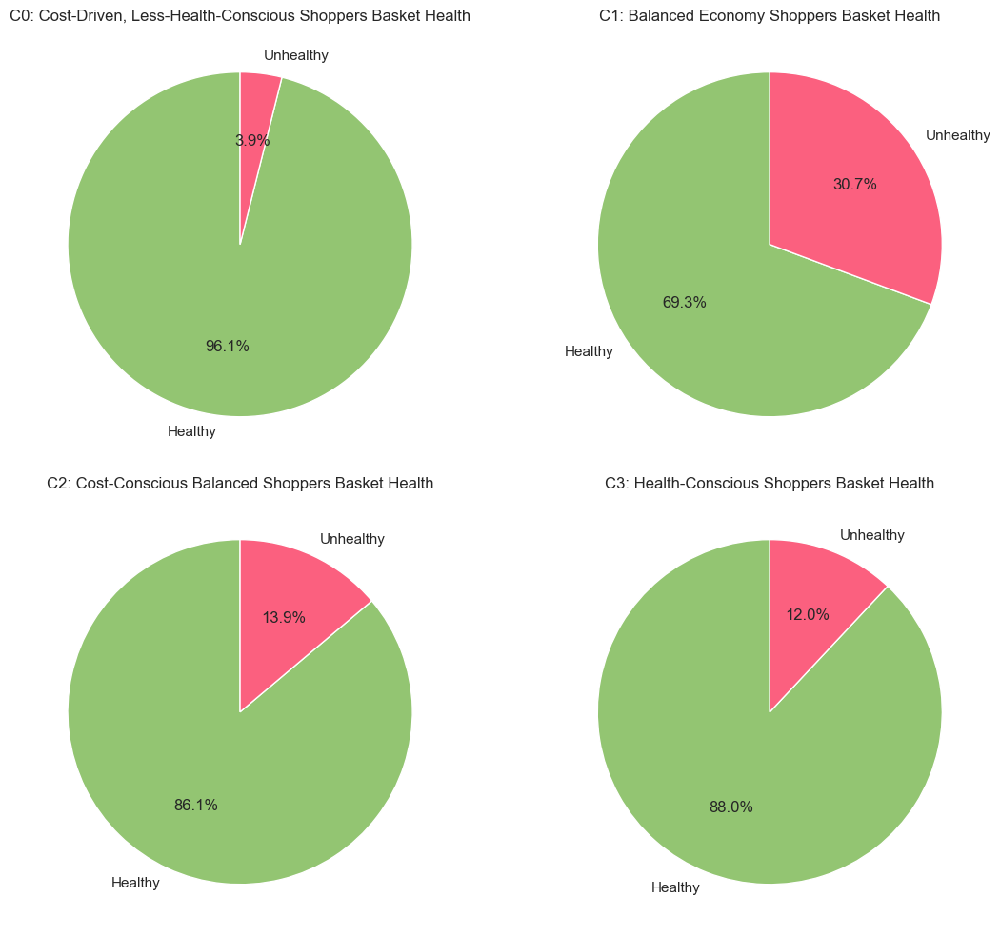

In [530]:
colors = ['#93c572', '#fb607f']  # Green for healthy, red for unhealthy

# Plotting each pie chart in two rows and two columns
fig, axs = plt.subplots(2, 2, figsize=(12, 10))  # Adjust figure size as needed

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Iterate over each type of shopper
for i, pattern in enumerate(pattern_health_counts.index):
    sizes = pattern_health_counts.loc[pattern]
    if sizes.sum() == 0:  # Avoid plotting when sum is zero
        continue
    labels = sizes.index
    proportions = sizes / sizes.sum()
    
    # Plot each pie chart
    axs[i].pie(proportions, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
    axs[i].set_title(f'{pattern} Basket Health')

# Adjust layout to display properly without label overlap
plt.tight_layout()

# Show the plots
plt.show()

| Customer Type           | 0                          | 1                                   | 2                              | 3                          |
|-------------------------|----------------------------|-------------------------------------|--------------------------------|----------------------------|
| **Customer Type Name**   | Health-Conscious Shoppers  | Cost-Driven, Less-Health-Conscious Shoppers | Cost-Conscious Balanced Shoppers | Balanced Economy Shoppers   |
| **Number of Customers**  | 2,739 (9.45%)              | 12,341 (42.68%)                     | 3,664 (12.66%)                 | 7,877 (27.22%)              |
| **Basket Type 0: Economy Less healthy** | 19%   | 94%                                | 58%                             | 19%                         |
| **Basket Type 1: Premium Health**        | 50%   | 1%                                 | 5%                              | 7%                          |
| **Basket Type 2: Moderate Balance**      | 18%   | 4%                                 | 31%                             | 68%                         |
| **Basket Type 3: Value Discount**        | 9%    | 1%                                 | 4%                              | 5%                          |
| **Percentage of Unhealthy Customers per Type** | 3.9% | 30.7%                             | 13.9%                           | 12%                         |


These shopper types exhibit markedly different behaviours. For `Cost-Driven, Less-Health-Conscious Shoppers (Type 1)`, the `Economy Less Healthy basket` dominates, with 94% of their purchases in this category. This group is characterised by lower spending, fewer products, and minimal focus on health. In contrast, other shopper types display more diverse purchasing patterns, often incorporating a mix of basket types. `Cost-Conscious Balanced Shoppers (Type 2)` primarily use the `Economy Less Healthy basket` but also include more balanced shopping in their habits. `Health-Conscious Shoppers (Type 3)` most frequently choose the Premium Health basket, although 20% of their purchases still consist of the `Economy Less Healthy basket`.

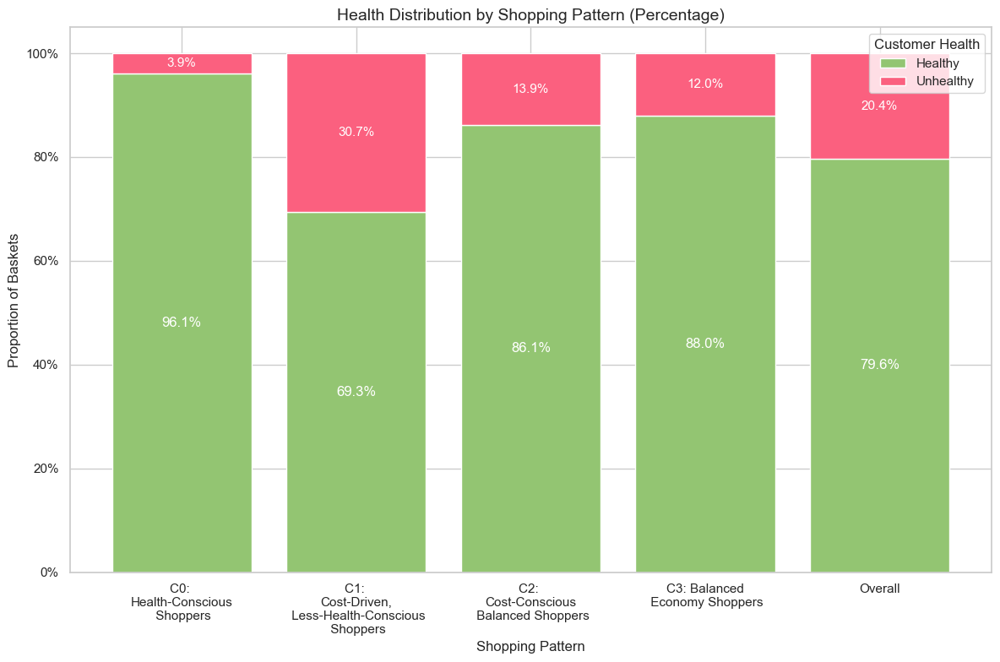

In [1012]:
# Define colors: Green for healthy, Red for unhealthy
colors = ['#93c572', '#fb607f']

# Set up the figure and axes for the stacked bar chart
fig, ax = plt.subplots(figsize=(12, 8))  # Adjust figure size as needed

# Prepare data for the stacked bar chart with line breaks in x-axis labels
patterns = [
    "C0: \nHealth-Conscious\n Shoppers",
    "C1: \nCost-Driven,\n Less-Health-Conscious\n Shoppers",
    "C2: \nCost-Conscious\n Balanced Shoppers",
    "C3: Balanced\n Economy Shoppers",
    "Overall"
]

total_counts = pattern_health_counts.sum(axis=1)

# Normalize the counts to get proportions for individual patterns
healthy_proportions = list(pattern_health_counts.loc[:, 'Healthy'] / total_counts)
unhealthy_proportions = list(pattern_health_counts.loc[:, 'Unhealthy'] / total_counts)

# Calculate the overall proportions dynamically
overall_healthy_proportion = pattern_health_counts['Healthy'].sum() / total_counts.sum()
overall_unhealthy_proportion = pattern_health_counts['Unhealthy'].sum() / total_counts.sum()

# Add overall proportions to the list
healthy_proportions.append(overall_healthy_proportion)
unhealthy_proportions.append(overall_unhealthy_proportion)

# Create the stacked bar chart with proportions
bars1 = ax.bar(patterns, healthy_proportions, label='Healthy', color=colors[0])
bars2 = ax.bar(patterns, unhealthy_proportions, bottom=healthy_proportions, label='Unhealthy', color=colors[1])

# Add percentage labels on top of the bars using black text
for i, (bar1, bar2) in enumerate(zip(bars1, bars2)):
    height1 = bar1.get_height()
    height2 = bar2.get_height()
    ax.text(bar1.get_x() + bar1.get_width() / 2, height1 / 2, f'{height1 * 100:.1f}%', ha='center', va='center', color='white', fontsize=12)
    ax.text(bar2.get_x() + bar2.get_width() / 2, height1 + height2 / 2, f'{height2 * 100:.1f}%', ha='center', va='center', color='white', fontsize=11)

# Set the title and labels
ax.set_title('Health Distribution by Shopping Pattern (Percentage)', fontsize=14)
ax.set_xlabel('Shopping Pattern', fontsize=12)
ax.set_ylabel('Proportion of Baskets', fontsize=12)

# Set y-axis to show percentages
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x*100:.0f}%'))

# Rotate x-axis labels for better readability
plt.xticks(rotation=0, ha='center')

# Add the legend
ax.legend(title='Customer Health')

# Save the plot as an image file
fig.savefig('Results/Img/Basket_Health_Distribution_by_Shopping_Pattern_Percentage.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.tight_layout()
plt.show()

Overall, 20% of customers in the store are classified as unhealthy. The `Cost-Driven, Less-Health-Conscious Shoppers (Type 1)` group is the only type with a higher percentage of unhealthy customers (31%) than the   store average, indicating a strong tendency towards unhealthy shopping behaviour. Conversely, only 4% of `Health-Conscious Shoppers (Type 0)` are classified as unhealthy. In conclusion, **Cost-Driven, Less-Health-Conscious Shoppers (Type 1) exhibit the unhealthiest shopping behaviour, while Health-Conscious Shoppers (Type 0) represent the healthiest**.

In [532]:
print(overall_healthy_proportion)
print(overall_unhealthy_proportion)

0.7963637729611961
0.20363622703880396


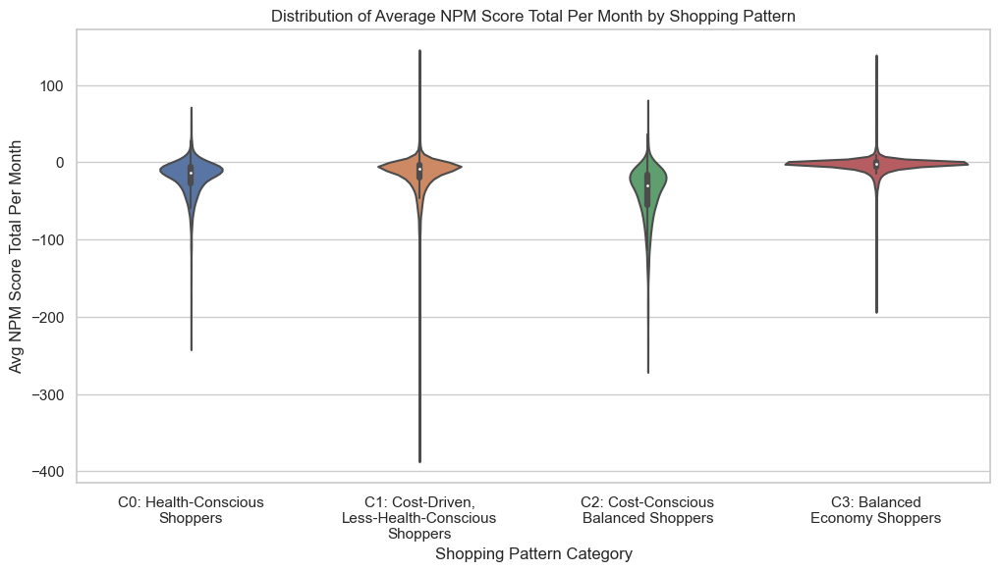

In [921]:
# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Create the violin plot
plt.figure(figsize=(12, 6))  # Adjust the size as needed
violin = sns.violinplot(x='shopping_pattern', y='avg_NPM_score_total_per_month', data=df_customer_monthly)

# Set the titles and labels
plt.title('Distribution of Average NPM Score Total Per Month by Shopping Pattern')
plt.xlabel('Shopping Pattern Category')
plt.ylabel('Avg NPM Score Total Per Month')

# Prepare custom x-axis labels with line breaks
categories = [
    'C0: Health-Conscious\nShoppers',
    'C1: Cost-Driven,\nLess-Health-Conscious\nShoppers',
    'C2: Cost-Conscious\nBalanced Shoppers',
    'C3: Balanced\nEconomy Shoppers'
]

# Set custom x-axis labels with line breaks
plt.xticks(ticks=range(len(categories)), labels=categories, rotation=0)

# Show the plot
plt.show()

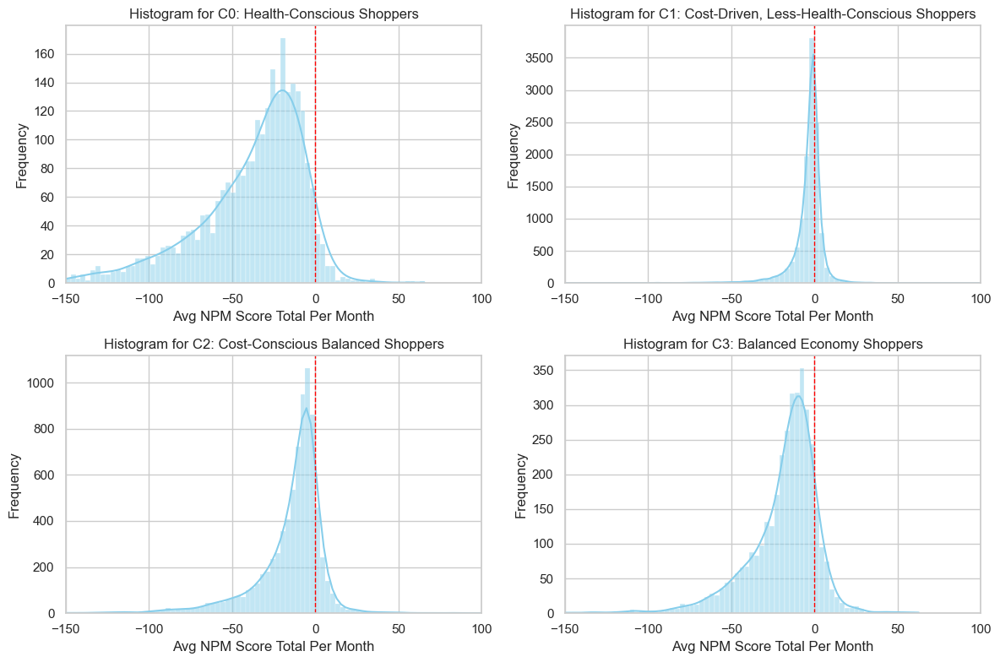

In [922]:
# Set the overall figure size
plt.figure(figsize=(12, 8))

# Get unique categories from the 'shopping_pattern' column and sort them if necessary
categories = df_customer_monthly['shopping_pattern'].unique()
categories.sort()  # Sort the categories to maintain a consistent order

# Loop through each category to create a histogram
for i, category in enumerate(categories):
    # Create a subplot for each histogram in a 2x2 grid
    plt.subplot(2, 2, i+1)
    # Filter the data for the current category
    category_data = df_customer_monthly[df_customer_monthly['shopping_pattern'] == category]['avg_NPM_score_total_per_month']
    
    # Plot the histogram with Kernel Density Estimate (KDE)
    sns.histplot(category_data, bins=range(-150, 100, 3), color='skyblue', kde=True)
    # Set the title, labels, and x-axis limits for each histogram
    plt.title(f'Histogram for {category}')
    plt.xlabel('Avg NPM Score Total Per Month')
    plt.ylabel('Frequency')  # Corrected from 'Shopping Pattern' to 'Frequency'
    plt.xlim(-150, 100)

    # Add a red dashed line at x=0 to denote the health threshold
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)

# Adjust layout to prevent overlap and ensure readability
plt.tight_layout()
# Display the plot
plt.show()

<br>

- **The Meat Selection of Four Distinct Types of Customers**

In [928]:
df_customer_monthly.head(2)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0,bk_c1,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.500000,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers
1,19c8b2a9-90e6-4467-ac91-3d4287b83540,2.333333,75.443333,30.395833,-17.777667,-8.933167,53.333333,21.916667,29.000000,12.916667,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers


In [929]:
df_customer_monthly['shopping_pattern'].unique()

array(['C3: Balanced Economy Shoppers',
       'C2: Cost-Conscious Balanced Shoppers',
       'C0: Health-Conscious Shoppers',
       'C1: Cost-Driven, Less-Health-Conscious Shoppers'], dtype=object)

In [932]:
# Create a dictionary to store customer IDs by shopping pattern
customer_ids_by_pattern = {}

# Get unique shopping patterns
unique_patterns = df_customer_monthly['shopping_pattern'].unique()

# Loop through each unique pattern and store the customer IDs
for pattern in unique_patterns:
    customer_ids = df_customer_monthly[df_customer_monthly['shopping_pattern'] == pattern]['customer_id'].unique()
    customer_ids_by_pattern[pattern] = customer_ids

# A dictionary where the keys are the shopping patterns and the values are the customer IDs
balanced_economy_ids = customer_ids_by_pattern.get('C3: Balanced Economy Shoppers')
cost_driven_less_health_ids = customer_ids_by_pattern.get('C1: Cost-Driven, Less-Health-Conscious Shoppers')
cost_conscious_ids = customer_ids_by_pattern.get('C2: Cost-Conscious Balanced Shoppers')
premium_health_ids = customer_ids_by_pattern.get('C0: Health-Conscious Shoppers')

print(balanced_economy_ids)
print(cost_driven_less_health_ids)
print(cost_conscious_ids)
print(premium_health_ids)

['0169f084-cf16-491f-bf37-5c2e9de7bddf'
 '19c8b2a9-90e6-4467-ac91-3d4287b83540'
 'c9b3a693-bdb5-4945-b8e8-4039d3da165b' ...
 'be04308b-bd87-4010-8063-d0e9317cd209'
 '2c9b9bd5-ff9f-49fc-8fde-d21f37c8c9c4'
 'f885c5b0-e2b5-4aa5-a942-8c195bf9bafc']
['3a3c3aff-615a-4cd2-a6b7-910211a7f769'
 'fe84c8db-a31a-4978-a7d3-b99c55c3b6d0'
 '17f7c2fc-c288-4562-88bd-e27c97166021' ...
 'c1dcdb1b-a498-4670-9788-f79571afa508'
 'c1f52fdf-b5d8-452b-b8ed-a269b857b1f0'
 'eb3da2ee-ff1a-4c64-a858-3215fb8437e1']
['aa656ca1-028b-4d21-8346-2d7bcdf80678'
 'ec277967-a620-4a91-b4bc-f76505202812'
 '05c611ee-0c9d-466d-8807-6c006ee326fd' ...
 'b5e5a669-7baa-4180-b909-d5e4e9dd5ee6'
 'ea8c906b-f969-4564-bd15-22278c89aeb4'
 '4c9268b1-7619-4ca5-88d0-c4babf0ad504']
['0e2f38a4-4762-4c91-af40-9fdf7a3b08eb'
 '13c4f695-1225-4dcc-b6fe-57b7c815fedc'
 '64f100fb-249d-4403-8aa6-e8c13c4c94d0' ...
 'd1d80856-9225-432d-8c24-7667d0bfb355'
 'db296daa-83ee-47fa-bdd9-9cf420db45e3'
 'df8e7d19-bea1-45e1-8345-5f5610a41746']


In [933]:
df_basket.head(2)

,basket_id,total_spend,total_discounts,product_count,has_linksave,total_NPM_stand_score,healthy_count,unhealthy_count,healthy_spend,unhealthy_spend,...,week,day_of_week,date,hour,Cluster,shopping_pattern,cluster_0,cluster_1,cluster_2,cluster_3
0,202301014158300100008,3.30,0.00,2,False,0.184,0,2,0.0,3.30,...,52,6,2023-01-01,9,1.0,Premium Health Basket,False,True,False,False
1,202301014158300100018,6.11,-1.31,12,True,0.049,0,12,0.0,6.11,...,52,6,2023-01-01,10,1.0,Premium Health Basket,False,True,False,False


- **Cost-Driven, Less-Health-Conscious Shoppers**

In [934]:
# Filter df_basket to get the basket_id values corresponding to the customer IDs in cost_driven_less_health_ids
cost_driven_customer_basket_ids = df_basket[df_basket['customer_id'].isin(cost_driven_less_health_ids)]['basket_id'].unique()
cost_driven_customer_basket_ids

array(['202301014158300100023', '202301014158300100026',
       '202301014158300100034', ..., '202305314158315106599',
       '202305314158315106600', '202305314158315106604'], dtype=object)

In [935]:
print(len(df_basket_product_food_drink_Morley))
df_basket_product_food_drink_Morley.head(2)

4899712


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
4,202305224158314206827,4715670,1,2.50,0.00,NaN,2.50,0.000000
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave,2.46,0.098901


In [936]:
# Filter df_basket_product_food_drink_Morley to include only rows with basket_ids in cost_driven_customer_basket_ids
df_basket_cost_driven_customer = df_basket_product_food_drink_Morley[df_basket_product_food_drink_Morley['basket_id'].isin(cost_driven_customer_basket_ids)]
print(len(df_basket_cost_driven_customer))
df_basket_cost_driven_customer.head(2)

941343


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
31,202305224158314205492,4296160,1,1.25,0.0,NaN,1.25,0.0
36,202305224158314206356,1218243,1,1.40,0.0,NaN,1.40,0.0


In [937]:
# Group by prod_id and calculate the total sum and average values
product_purchase_summary_cost_driven_customer = df_basket_cost_driven_customer.groupby('prod_id').agg(
    total_quantity=('unmeasured_qty', 'sum'),    # Sum the unmeasured_qty to get total purchase quantity
    avg_sale_amount=('sale_amt_inc_vat', 'mean'), # Calculate the mean of sale_amt_inc_vat to get the average sale amount
    avg_sale_price=('sale_price', 'mean')     # Calculate the mean of sale_price to get the average sale price
).reset_index()   

product_purchase_summary_cost_driven_customer.head(3)

,prod_id,total_quantity,avg_sale_amount,avg_sale_price
0,156,19,5.905263,5.905263
1,170,108,15.212963,15.212963
2,209,14,11.846429,11.846429


In [938]:
# Merge the two DataFrames on 'prod_id' to get the product names, categories, health status, and brand names
df_merged_cost_driven_customer = pd.merge(product_purchase_summary_cost_driven_customer, df_product_food_all_score[['prod_id', 'prod_disp_nm', 'brand_nm', 'category', 'is_healthy', 'NPM_score']], on='prod_id')

df_merged_cost_driven_customer.head(1)

,prod_id,total_quantity,avg_sale_amount,avg_sale_price,prod_disp_nm,brand_nm,category,is_healthy,NPM_score
0,156,19,5.905263,5.905263,Original Green Ginger Wine,Stones,Distilled Spirits,NaN,NaN


In [939]:
# Define the categories of interest
categories = ['Brought-In Fresh Meat', 'Frozen Meats & Poultry', 'Brought-In Bacon & Sausages', 'Pre-Packaged Cooked Meats']

# Filter the DataFrame to include only rows with the specified categories
df_merged_cost_driven_customer_meat = df_merged_cost_driven_customer[df_merged_cost_driven_customer['category'].isin(categories)]

# Sort the filtered DataFrame by total_quantity in descending order
df_merged_cost_driven_customer_meat = df_merged_cost_driven_customer_meat.sort_values(by='total_quantity', ascending=False)

df_merged_cost_driven_customer_meat.head(5)

,prod_id,total_quantity,avg_sale_amount,avg_sale_price,prod_disp_nm,brand_nm,category,is_healthy,NPM_score
5994,4446022,1584,1.943832,1.837595,10 Unsmoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,0.0,14.0
3858,3717794,1445,3.256782,3.256782,Lean Beef Mince (Typically Less Than 5% Fat),ASDA Butcher's Selection,Brought-In Fresh Meat,1.0,-2.0
5869,4422589,1232,1.954976,1.861420,10 Smoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,0.0,14.0
2952,3133680,1009,2.061754,1.806987,12 Pork Chipolatas,ASDA Extra Special,Brought-In Bacon & Sausages,0.0,17.0
2971,3144631,785,2.394102,2.034637,6 Pork Sausages,ASDA Extra Special,Brought-In Bacon & Sausages,0.0,17.0


- **Health-Conscious Shoppers**

In [940]:
# Filter df_basket to get the basket_id values corresponding to the customer IDs in cost_driven_less_health_ids
premium_health_customer_basket_ids = df_basket[df_basket['customer_id'].isin(premium_health_ids)]['basket_id'].unique()
premium_health_customer_basket_ids

array(['202301014158300100008', '202301014158300100047',
       '202301014158300100140', ..., '202305314158315106480',
       '202305314158315106498', '202305314158315106513'], dtype=object)

In [941]:
print(len(df_basket_product_food_drink_Morley))
df_basket_product_food_drink_Morley.head(2)

4899712


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
4,202305224158314206827,4715670,1,2.50,0.00,NaN,2.50,0.000000
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave,2.46,0.098901


In [942]:
# Filter df_basket_product_food_drink_Morley to include only rows with basket_ids in cost_driven_customer_basket_ids
df_basket_premium_health_customer = df_basket_product_food_drink_Morley[df_basket_product_food_drink_Morley['basket_id'].isin(premium_health_customer_basket_ids)]
print(len(df_basket_premium_health_customer))
df_basket_premium_health_customer.head(2)

1167826


,basket_id,prod_id,unmeasured_qty,sale_amt_inc_vat,offer_disc_inc_vat,asda_promo_type,sale_price,disc_perc
6,202305224158314202882,5379382,1,2.73,-0.27,Linksave,2.46,0.098901
28,202305224158314202316,4296160,1,1.25,0.00,NaN,1.25,0.000000


In [943]:
# Group by prod_id and calculate the total sum and average values
product_purchase_summary_premium_health_customer = df_basket_premium_health_customer.groupby('prod_id').agg(
    total_quantity=('unmeasured_qty', 'sum'),    # Sum the unmeasured_qty to get total purchase quantity
    avg_sale_amount=('sale_amt_inc_vat', 'mean'), # Calculate the mean of sale_amt_inc_vat to get the average sale amount
    avg_sale_price=('sale_price', 'mean')     # Calculate the mean of sale_price to get the average sale price
).reset_index()   

product_purchase_summary_premium_health_customer.head(3)

,prod_id,total_quantity,avg_sale_amount,avg_sale_price
0,156,10,5.860000,5.860000
1,170,53,15.470755,15.470755
2,209,14,12.178571,12.178571


In [944]:
# Merge the two DataFrames on 'prod_id' to get the product names, categories, health status, and brand names
df_merged_premium_health_customer = pd.merge(product_purchase_summary_premium_health_customer, df_product_food_all_score[['prod_id', 'prod_disp_nm', 'brand_nm', 'category', 'is_healthy', 'NPM_score']], on='prod_id')

df_merged_premium_health_customer.head(1)

,prod_id,total_quantity,avg_sale_amount,avg_sale_price,prod_disp_nm,brand_nm,category,is_healthy,NPM_score
0,156,10,5.86,5.86,Original Green Ginger Wine,Stones,Distilled Spirits,NaN,NaN


In [945]:
# Define the categories of interest
categories = ['Brought-In Fresh Meat', 'Frozen Meats & Poultry', 'Brought-In Bacon & Sausages', 'Pre-Packaged Cooked Meats']

# Filter the DataFrame to include only rows with the specified categories
df_merged_premium_health_customer_meat = df_merged_premium_health_customer[df_merged_premium_health_customer['category'].isin(categories)]

# Sort the filtered DataFrame by total_quantity in descending order
df_merged_premium_health_customer_meat = df_merged_premium_health_customer_meat.sort_values(by='total_quantity', ascending=False)

df_merged_premium_health_customer_meat.head(5)

,prod_id,total_quantity,avg_sale_amount,avg_sale_price,prod_disp_nm,brand_nm,category,is_healthy,NPM_score
3822,3717794,3776,3.420593,3.420593,Lean Beef Mince (Typically Less Than 5% Fat),ASDA Butcher's Selection,Brought-In Fresh Meat,1.0,-2.0
5924,4446022,2731,1.945872,1.820505,10 Unsmoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,0.0,14.0
5805,4422589,1959,1.955436,1.835360,10 Smoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,0.0,14.0
7358,4752071,1535,1.812007,1.408202,Thick Sliced Corned Beef 4 Slices,ASDA,Pre-Packaged Cooked Meats,0.0,14.0
5855,4432583,1500,1.902880,1.763240,6 Thick Cut Unsmoked Back Bacon Rashers,ASDA Butcher's Selection,Brought-In Bacon & Sausages,0.0,14.0


<br>

—  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  — 



<br>

### 6. Clustering Customers by Shopping Frequency
This step involves clustering customers based on their visit frequency to categorize them potentially as regulars or one-time shoppers. This analysis aims to explore if there is a correlation between visit frequency and health-conscious shopping behaviors.

The fields used include:

- `avg_baskets_per_week`: Shows the average number of visits per week, indicating how frequently a customer shops.
- `actual_weekly_basket`: Calculated as the total number of baskets divided by the number of weeks covered by the data, this metric helps identify whether a customer tends to make one-time visits or is a regular shopper.

**🤔 Where Are the Unhealthy Customers?**  
Upon analyzing the results, the next step is to determine which customer clusters predominantly contain the majority of unhealthy customers. This will help to understand the tendencies of frequent shoppers and whether more consistent shoppers tend to be healthier.

<br>

In [551]:
df_customer_frequency.head(3)

,customer_id,avg_baskets_per_week,avg_baskets_per_month,total_baskets_count,actual_weekly_basket
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,1.333333,4.0,4,0.173913
1,00038e5e-5784-41bf-9c15-c411af57b82f,1.000000,1.0,2,0.086957
2,000990fa-5578-4c00-8146-767117716477,1.000000,1.0,2,0.086957


In [552]:
df_customer_frequency.columns

Index(['customer_id', 'avg_baskets_per_week', 'avg_baskets_per_month',
       'total_baskets_count', 'actual_weekly_basket'],
      dtype='object')

In [553]:
df_customer_frequency_kmeans = df_customer_frequency.copy()

In [554]:
features = df_customer_frequency[['avg_baskets_per_week', 'actual_weekly_basket']]

In [555]:
# Feature Standardization
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

##### Use the **Elbow Method** to Determine the Optimal Number of Clusters

In [556]:
# Start measuring time
start_time = time.time()

# Elbow Method
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(features_scaled)
    wcss.append(kmeans.inertia_)

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 13.24 seconds


In [557]:
# Start measuring time
start_time = time.time()

# Silhouette Score
silhouette_scores = []
for i in range(2, 10):  # At least 2 clusters are needed to calculate the silhouette score
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(features)
    score = silhouette_score(features_scaled, kmeans.labels_)
    silhouette_scores.append(score)

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 110.77 seconds


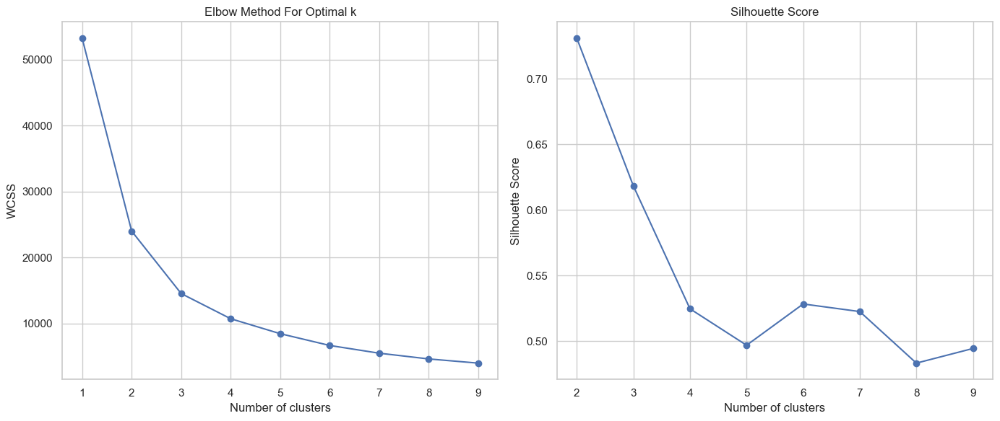

In [558]:
# Plotting the results
plt.figure(figsize=(14, 6))

# Plot for Elbow Method
plt.subplot(1, 2, 1)
plt.plot(range(1, 10), wcss, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

# Plot for Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

To stabilize the clustering outcome and secure the most accurate model, the KMeans algorithm is executed ten times with the same number of clusters. This approach leverages multiple initializations to minimize the total squared error, thus potentially circumventing local optima issues inherent to KMeans.

__K=3__

In [559]:
# Start measuring time
start_time = time.time()

# Initialize the variables to track the best score and model
best_score = float('inf') # Set to infinity to ensure any first run's inertia is considered lower
best_kmeans = None # Will hold the model with the lowest inertia

# Execute KMeans clustering 10 times to find the most stable and accurate model
for _ in range(10):
    kmeans = KMeans(n_clusters=3, random_state=42)
    kmeans.fit(features_scaled)
    # Check if the current model's inertia is the lowest we've encountered
    if kmeans.inertia_ < best_score:  # Compare the total squared error
        best_score = kmeans.inertia_
        best_kmeans = kmeans

# best_kmeans now contains the best model

# End measuring time
end_time = time.time()

# Calculate and print the time taken
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 12.11 seconds


Cluster Labeling

In [560]:
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

In [561]:
df_customer_frequency_kmeans['Cluster_3'] = cluster_labels

In [562]:
df_customer_frequency_kmeans['Cluster_3'].value_counts()

Cluster_3
0    21591
1     4412
2      618
Name: count, dtype: int64

##### Utilize PCA to visualize the clustering results

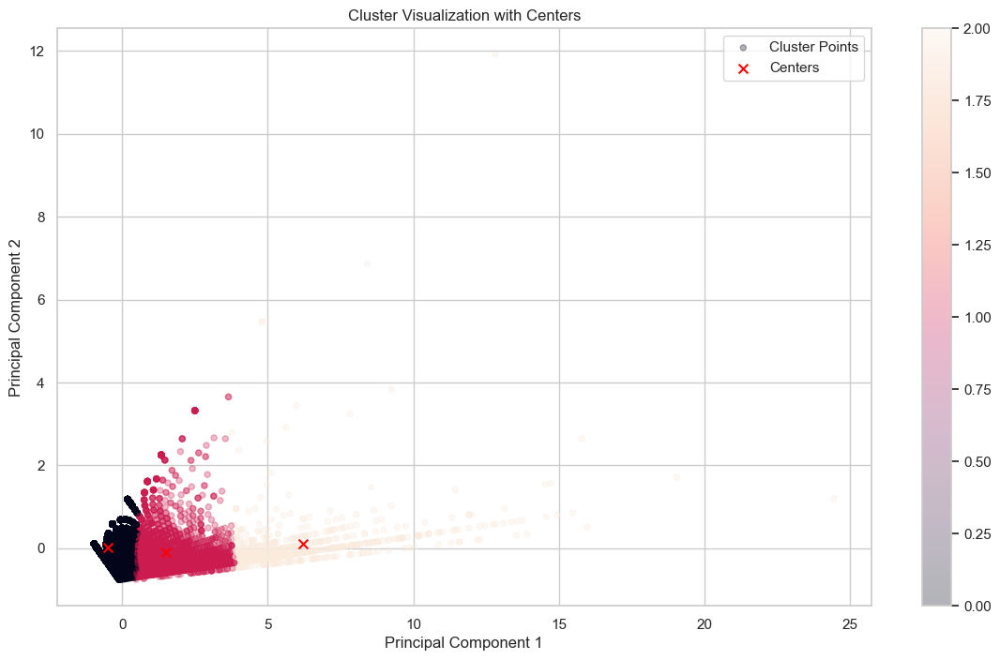

In [563]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Create a scatter plot for the PCA-transformed data
plt.figure(figsize=(14, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1], c=cluster_labels, 
                      alpha=0.3, s=20, label='Cluster Points')
plt.title('Cluster Visualization with Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Calculate the PCA coordinates for cluster centers
cluster_centers_transformed = pca.transform(cluster_centers)

# Plot the cluster centers on the PCA scatter plot
centers = plt.scatter(cluster_centers_transformed[:, 0], cluster_centers_transformed[:, 1], 
                      c='red', s=50, alpha=1, marker='x', label='Centers')

# Display the legend
plt.legend()

# Display the color bar associated with the cluster points
plt.colorbar(scatter)
plt.show()

> __Evaluating and Interpreting Clusters__
> - ANOVA Testing to Assess Significant Differences Among Clusters
> - Analysis of Cluster Centroids

> - __ANOVA Testing to Assess Significant Differences Among Clusters__

In [564]:
df_customer_frequency_kmeans.columns

Index(['customer_id', 'avg_baskets_per_week', 'avg_baskets_per_month',
       'total_baskets_count', 'actual_weekly_basket', 'Cluster_3'],
      dtype='object')

In [565]:
# List of features to test for significant differences among clusters
features_to_test = ['avg_baskets_per_week', 'actual_weekly_basket']

# Initialize a list or dictionary to store the ANOVA test results
anova_results = []

# Loop through each feature to perform the ANOVA test
for feature in features_to_test:
    # Prepare the data for each cluster
    data0 = df_customer_frequency_kmeans[df_customer_frequency_kmeans['Cluster_3'] == 0][feature]
    data1 = df_customer_frequency_kmeans[df_customer_frequency_kmeans['Cluster_3'] == 1][feature]
    
    # Perform the ANOVA test
    stat, p_value = f_oneway(data0, data1)
    
    # Store the results
    anova_results.append({'Feature': feature, 'ANOVA Statistic': stat, 'P-Value': p_value})

    # Print each feature's ANOVA test result
    print(f"ANOVA test for {feature}: Stat={stat:.2f}, P-value={p_value:.4f}")

ANOVA test for avg_baskets_per_week: Stat=31433.94, P-value=0.0000
ANOVA test for actual_weekly_basket: Stat=40328.13, P-value=0.0000


In [566]:
df_anova_results = pd.DataFrame(anova_results)

df_anova_results = df_anova_results.sort_values(by='ANOVA Statistic', ascending=False)
df_anova_results

,Feature,ANOVA Statistic,P-Value
1,actual_weekly_basket,40328.126373,0.0
0,avg_baskets_per_week,31433.936929,0.0


The ANOVA results show that both features—**actual weekly basket** and **average baskets per week**—have statistically significant differences across the groups. The high ANOVA statistics (40,328.13 and 31,433.94, respectively) and P-values of 0.0 indicate that the variation in these features is highly unlikely to be due to random chance, suggesting meaningful differences in these metrics across the groups.

> - __Analysis of Cluster Centroids__

In [567]:
df_customer_frequency_kmeans.head(1)

,customer_id,avg_baskets_per_week,avg_baskets_per_month,total_baskets_count,actual_weekly_basket,Cluster_3
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,1.333333,4.0,4,0.173913,0


In [568]:
# Exclude certain columns and create a new DataFrame
df_selected_features = df_customer_frequency_kmeans.drop(columns=['customer_id', 'total_baskets_count',
                                                                  'avg_baskets_per_month', 'Cluster_3'])

# Get the list of remaining column names
selected_features = df_selected_features.columns.tolist()
print("Selected features for clustering:", selected_features)

Selected features for clustering: ['avg_baskets_per_week', 'actual_weekly_basket']


In [569]:
# Create a DataFrame for cluster centers, ensuring the number of columns matches the number of features
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)
df_cluster_centers

,avg_baskets_per_week,actual_weekly_basket
0,-0.329029,-0.353885
1,0.984957,1.129073
2,4.463498,4.303010


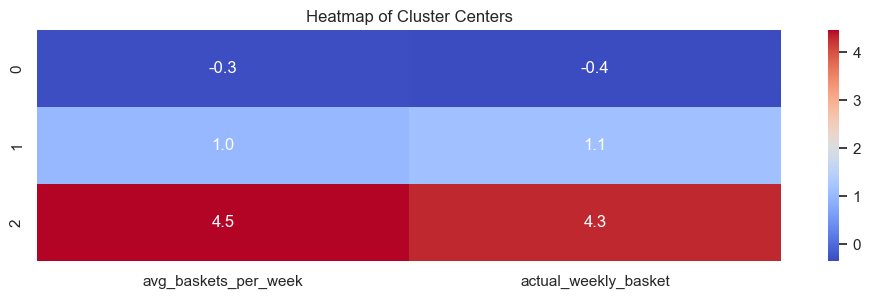

In [570]:
# Set the figure size
plt.figure(figsize=(12, 3))

# Create the heatmap, disable automatic annotations
ax = sns.heatmap(df_cluster_centers, cmap='coolwarm', fmt=".1f", annot=False)
plt.title("Heatmap of Cluster Centers")

# Use a for loop to manually add value labels
for (i, j), val in np.ndenumerate(df_cluster_centers):
    # Place text at the center of each cell using (j + 0.5, i + 0.5) to adjust for cell center
    ax.text(j + 0.5, i + 0.5, f'{val:.1f}', ha='center', va='center', color='white')

plt.show()

##### Reverse Standardization

In [571]:
# Create a DataFrame for the cluster centers
df_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=selected_features)

# Reverse the standardization of the cluster centers
df_original_cluster_centers = pd.DataFrame(scaler.inverse_transform(df_cluster_centers), columns=selected_features)

# Display the original cluster centers
df_original_cluster_centers

,avg_baskets_per_week,actual_weekly_basket
0,1.177374,0.344391
1,2.012388,1.453831
2,4.222938,3.828338


In [572]:
df_customer_frequency_kmeans['Cluster_3'].value_counts()

Cluster_3
0    21591
1     4412
2      618
Name: count, dtype: int64

##### Rename the customer clusters based on the findings

In [947]:
# Create a mapping from cluster numbers to names
customer_cluster_names = {
    0: 'C0: Occasional Shoppers',
    1: 'C1: Frequent Shoppers',
    2: 'C2: Consistent Shoppers'
}

In [948]:
df_customer_frequency_cluster = df_customer_frequency_kmeans[['customer_id', 'Cluster_3']]

In [949]:
# Use .loc[] to safely create a new column 'Frequency' with the descriptive names
df_customer_frequency_cluster.loc[:, 'frequency'] = df_customer_frequency_cluster['Cluster_3'].map(customer_cluster_names)

# Display the updated DataFrame to verify the changes
df_customer_frequency_cluster.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_24120\3672460010.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customer_frequency_cluster.loc[:, 'frequency'] = df_customer_frequency_cluster['Cluster_3'].map(customer_cluster_names)


,customer_id,Cluster_3,frequency
0,00037d7b-67b2-4a0e-ac2e-a6bff3e8ea77,0,C0: Occasional Shoppers
1,00038e5e-5784-41bf-9c15-c411af57b82f,0,C0: Occasional Shoppers
2,000990fa-5578-4c00-8146-767117716477,0,C0: Occasional Shoppers
3,000ba767-5074-49ba-aba1-989ad3c47a9e,0,C0: Occasional Shoppers
4,000c6b12-334d-425b-bb9c-57bae1f72ccd,0,C0: Occasional Shoppers


- **Concluding the Analysis**
  Upon completion of analysis, the customer dataset will be updated with the revised customer cluster and frequency results, ensuring that the latest insights are accurately reflected in the records.

In [950]:
df_customer_monthly = pd.read_csv(r'Results\Dataset\df_customer_monthlycustomer_shopping_pattern_cluster.csv')

In [951]:
df_customer_monthly.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0,bk_c1,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.5,...,0.0,0.0,2.333333,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers


In [952]:
df_customer_monthly = df_customer_monthly.merge(df_customer_frequency_cluster, on='customer_id', how='left')

In [953]:
df_customer_monthly.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern,Cluster_3,frequency
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.5,...,2.333333,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers


In [954]:
df_customer_monthly.to_csv(r'Results\Dataset\customer_clusters.csv', index=False)

<br>

- **🤔 Where Are the Unhealthy Customers?**  
Upon analysing the results, the next step is to determine which customer clusters predominantly contain the majority of unhealthy customers. This will help to understand the tendencies of frequent shoppers and whether more consistent shoppers tend to be healthier.

In [955]:
df_customer_monthly['avg_NPM_score_total_per_month'].head()

0   -21.367667
1   -17.777667
2   -18.082667
3    -9.372000
4    -6.614000
Name: avg_NPM_score_total_per_month, dtype: float64

In [956]:
df_unhealthy_customers = df_customer_monthly[df_customer_monthly['avg_NPM_score_total_per_month'] > 0]
print(len(df_customer_monthly))
print(len(df_unhealthy_customers))
df_unhealthy_customers.head(2)

26621
5421


,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern,Cluster_3,frequency
8,0251c86a-f217-4cb0-a93d-a7ba65430446,1.0,65.53,65.530000,3.805,3.805000,52.0,52.000000,16.0,16.000000,...,1.0,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers
12,05215f69-ac3f-4114-8789-ec1885644647,3.0,130.87,43.623333,21.425,7.141667,73.0,24.333333,23.0,7.666667,...,3.0,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers


In [957]:
# Calculate the number of unhealthy customers
num_unhealthy_customers = len(df_unhealthy_customers)
# Calculate the number of healthy customers
num_healthy_customers = len(df_customer_basket_cluster_kmeans) - num_unhealthy_customers

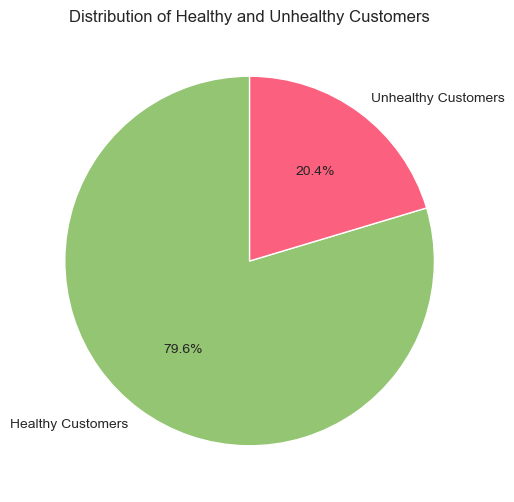

In [958]:
# Labels for the sections of our pie chart
labels = ['Healthy Customers', 'Unhealthy Customers']
# Values for each section
sizes = [num_healthy_customers, num_unhealthy_customers]
# Colors for each section
colors = ['#93c572', '#fb607f']

# Set up the figure for the pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart and capture the returned text objects for autopct
patches, texts, autotexts = plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)

# Set font size for the labels
for text in texts:
    text.set_fontsize(10)

# Set font size for the percentage annotations
for autotext in autotexts:
    autotext.set_fontsize(10)

# Set the title of the pie chart
plt.title('Distribution of Healthy and Unhealthy Customers', fontsize=12)

# Show the pie chart
plt.show()

In [959]:
df_customer_monthly['frequency'].value_counts()

frequency
C0: Occasional Shoppers    21591
C1: Frequent Shoppers       4412
C2: Consistent Shoppers      618
Name: count, dtype: int64

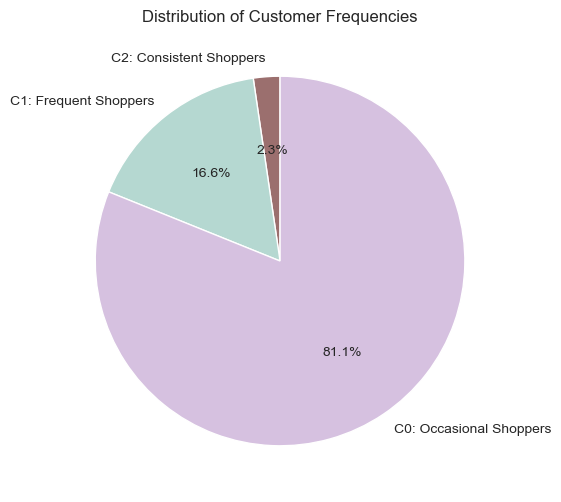

In [1011]:
# Manually specify the order of categories
order = ['C2: Consistent Shoppers', 'C1: Frequent Shoppers', 'C0: Occasional Shoppers']

# Calculate the frequency distribution of the 'frequency' column and reorder it
frequency_counts = df_customer_monthly['frequency'].value_counts().reindex(order)

# Define colors for the pie chart in the correct order
colors = ['#9b6f6e', '#b5d8d1', '#d6c1e0']

# Create the pie chart
plt.figure(figsize=(8, 6))  # Set the figure size
patches, texts, autotexts = plt.pie(frequency_counts, labels=frequency_counts.index,
                                    autopct='%1.1f%%', startangle=90, colors=colors)

# Adjust font size for labels
for text in texts:
    text.set_fontsize(10)  # Increase the font size for better readability

# Adjust font size for percentage annotations
for autotext in autotexts:
    autotext.set_fontsize(10)  # Increase the font size for percentage labels

# Set title with a custom font size
plt.title('Distribution of Customer Frequencies', fontsize=12)

plt.savefig(r'Results\Img\customers_by_cluster.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

Customers were categorised into three distinct types based on their visiting frequency: `occasional shoppers`,  `frequent shoppers`, and `consistent shoppers`. `Occasional shoppers` visit the store approximately once every three weeks. `Frequent shoppers` make regular visits, averaging about two purchases per week, while consistent shoppers visit even more frequently, with around four purchases per week.` Occasional shopper`s are the most prevalent, accounting for over 80% of the customer base, whereas only 2.3% of customers fall into the consistent shopper category.


In [976]:
# Calculate the frequency of each cluster within the unhealthy customers DataFrame
cluster_distribution = df_unhealthy_customers['frequency'].value_counts()

# Optionally, sort the index if you want the clusters to be in numerical order
cluster_distribution = cluster_distribution.sort_index()

# Print the cluster distribution
print("Distribution of unhealthy customers across frequency clusters:")
cluster_distribution

Distribution of unhealthy customers across frequency clusters:


frequency
C0: Occasional Shoppers    4719
C1: Frequent Shoppers       629
C2: Consistent Shoppers      73
Name: count, dtype: int64

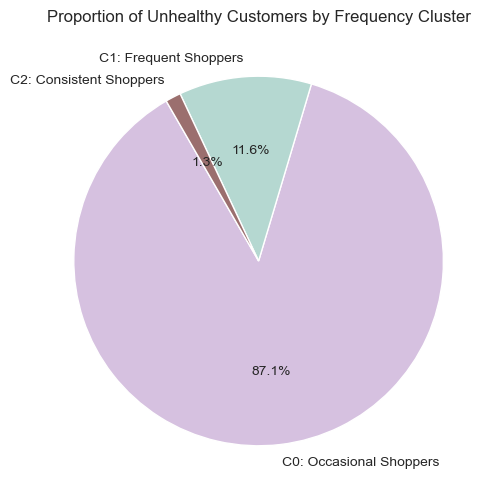

In [995]:
# Calculate the proportions for the pie chart
cluster_proportions = cluster_distribution / cluster_distribution.sum()

# Set up the figure for the pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart and store the label texts and the percentage texts
patches, texts, autotexts = plt.pie(cluster_proportions, labels=cluster_proportions.index,
                                    autopct='%1.1f%%', startangle=120,
                                    colors = ['#d6c1e0', '#b5d8d1', '#9b6f6e'])

# Customize the font size for labels and percentage texts
for text in texts:
    text.set_fontsize(10)  # Increase the font size for labels
for autotext in autotexts:
    autotext.set_fontsize(10)  # Increase the font size for percentage annotations

# Add a title with a custom font size
plt.title('Proportion of Unhealthy Customers by Frequency Cluster', fontsize=12)

# Show the plot
plt.show()

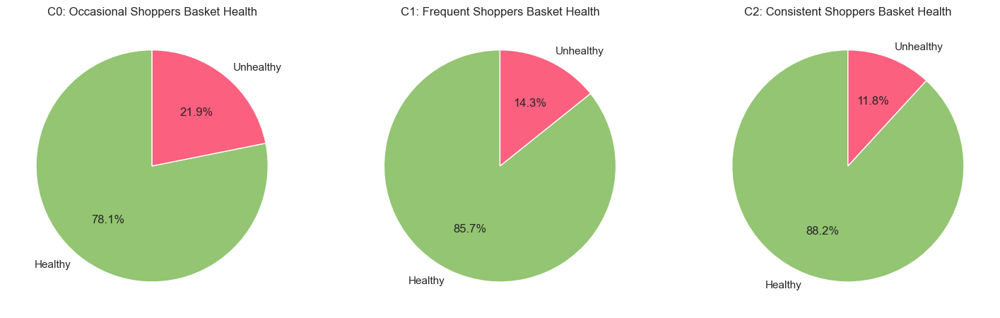

In [992]:
# Determine if each basket is healthy or unhealthy
df_customer_monthly['customer_basket_health'] = df_customer_monthly['avg_NPM_score_total_per_month'].apply(lambda x: 'Unhealthy' if x > 0 else 'Healthy')

# Group by 'frequency' and 'basket_health' to get counts
grouped = df_customer_monthly.groupby(['frequency', 'customer_basket_health']).size().unstack(fill_value=0)

# Plotting each pie chart
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
colors = ['#93c572', '#fb607f']

for i, (index, row) in enumerate(grouped.iterrows()):
    axs[i].pie(row, labels=row.index, autopct='%1.1f%%', startangle=90, colors=colors)
    axs[i].set_title(f'{index} Basket Health')

plt.show()

| Customer Type                          | 0                      | 1                  | 2                    |
|----------------------------------------|------------------------|--------------------|----------------------|
| **Customer Type Name**                 | Occasional Shoppers    | Frequent Shoppers  | Consistent Shoppers  |
| **Number of Customers**                | 21,591 (81.1%)         | 4,412 (16.6%)      | 618 (2.3%)           |
| **Average Baskets per Week**           | 1.18                   | 2.01               | 4.22                 |
| **Total Baskets per Week**             | 0.35                   | 1.45               | 3.82                 |
| **Description**                        | Infrequent visitors, making few purchases as needed | Regular visitors, making about two purchases per week | Highly engaged, with consistent and frequent purchases nearly every week |
| **Proportion of Unhealthy Customers per Type** | 21.9% | 14.3% | 11.8% |


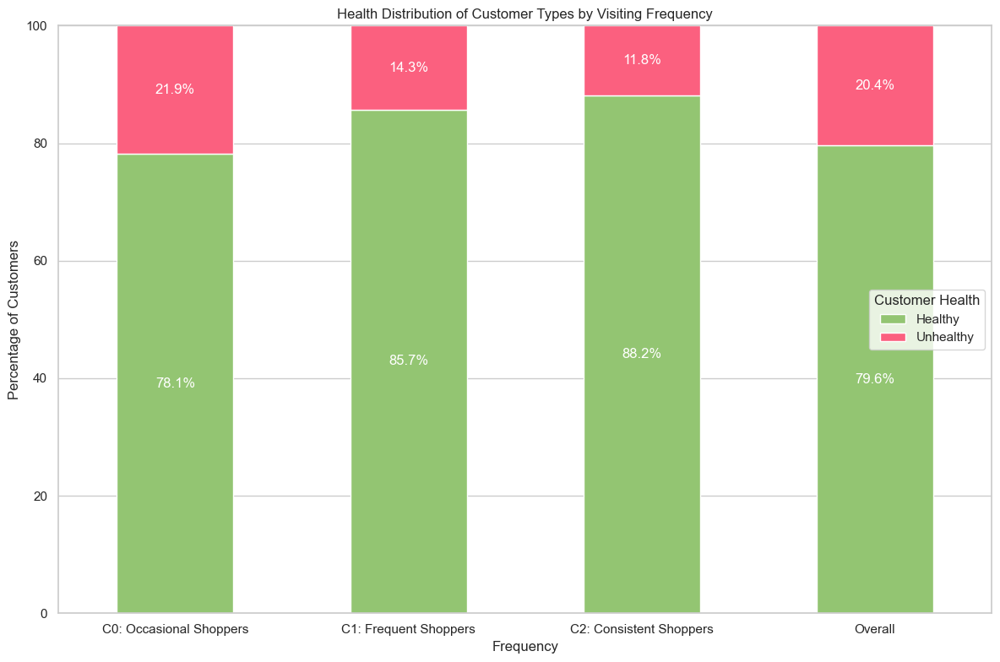

In [1013]:
# Determine if each basket is healthy or unhealthy
df_customer_monthly['customer_basket_health'] = df_customer_monthly['avg_NPM_score_total_per_month'].apply(lambda x: 'Unhealthy' if x > 0 else 'Healthy')

# Group by 'frequency' and 'customer_basket_health' to get counts
grouped = df_customer_monthly.groupby(['frequency', 'customer_basket_health']).size().unstack(fill_value=0)

# Create the overall summary as a DataFrame
overall_data = pd.DataFrame({'Healthy': [79.6], 'Unhealthy': [20.4]}, index=['Overall'])

# Use pd.concat to add the overall summary to the grouped DataFrame
grouped = pd.concat([grouped, overall_data])

# Normalize the data to ensure Y-axis represents 100%
grouped = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Plotting the stacked bar plot
fig, ax = plt.subplots(figsize=(12, 8))
colors = ['#93c572', '#fb607f']

# Plot the data as a stacked bar plot with percentages
bars = grouped.plot(kind='bar', stacked=True, color=colors, ax=ax)

# Set labels and title
ax.set_ylabel('Percentage of Customers')
ax.set_xlabel('Frequency')
ax.set_title('Health Distribution of Customer Types by Visiting Frequency')

# Ensure the Y-axis is 0 to 100%
ax.set_ylim(0, 100)

# Ensure X-axis labels are not rotated
ax.tick_params(axis='x', rotation=0)

# Adding percentage labels on the bars
for bar in bars.containers:
    ax.bar_label(bar, label_type='center', fmt='%.1f%%', color='white')

# Display the legend in the upper right corner
ax.legend(title='Customer Health', loc='center right')

# Save the plot as an image file
fig.savefig('Results/Img/customer_basket_health_by_frequency.png', dpi=300, bbox_inches='tight')

# Show plot
plt.tight_layout()
plt.show()

Despite being the least common, consistent shoppers have a higher proportion of healthy customers compared to the other groups. In contrast, occasional shoppers, who form the majority, have the lowest proportion of healthy customers. This suggests that more frequent store visits are associated with healthier shopping habits. 

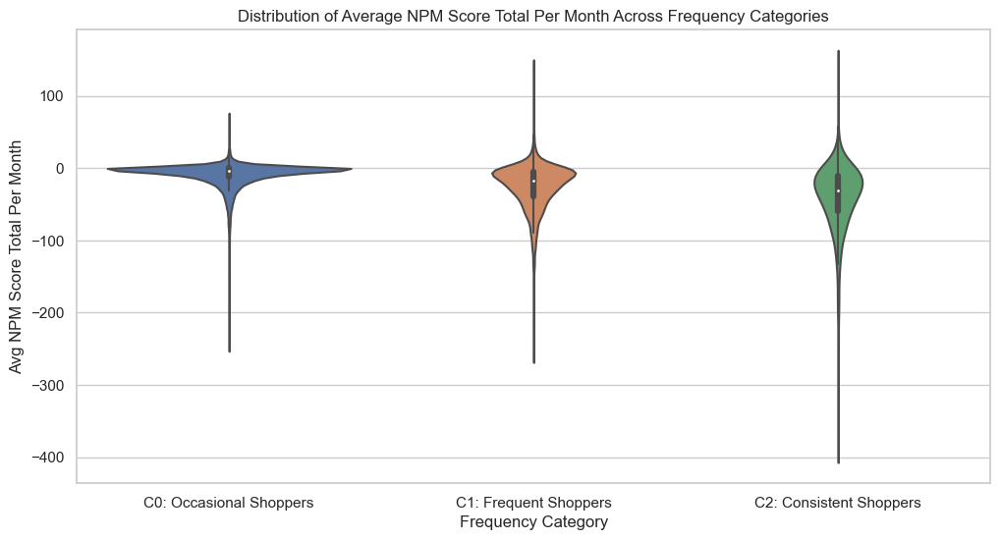

In [591]:
# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Create the violin plot
plt.figure(figsize=(12, 6))  # Adjust the size as needed
violin = sns.violinplot(x='frequency', y='avg_NPM_score_total_per_month', data=df_customer_monthly)

# Set the titles and labels
plt.title('Distribution of Average NPM Score Total Per Month Across Frequency Categories')
plt.xlabel('Frequency Category')
plt.ylabel('Avg NPM Score Total Per Month')

# Show the plot
plt.show()

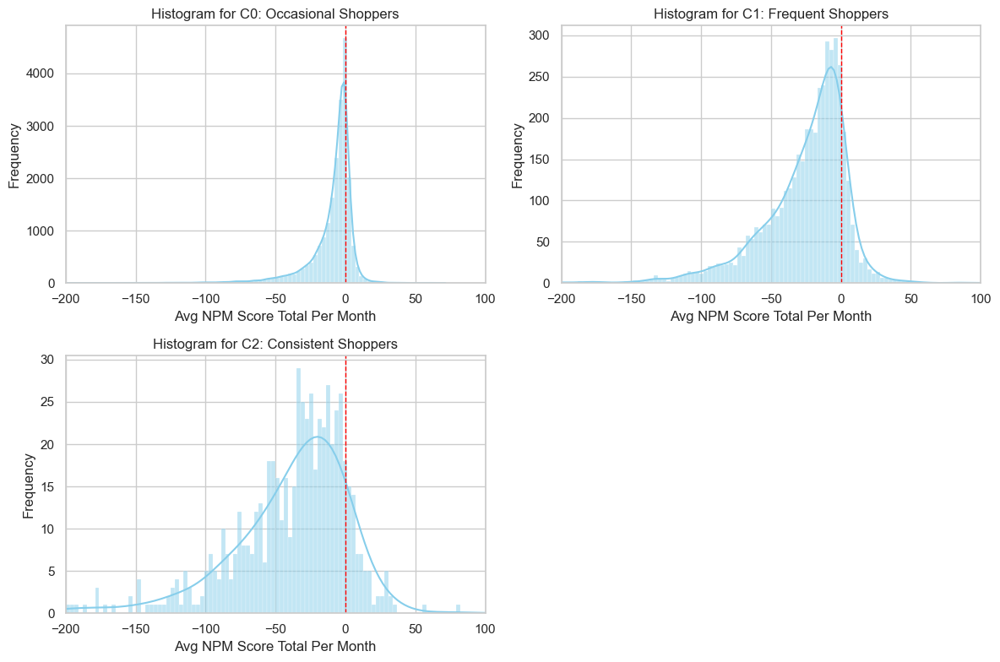

In [592]:
# Set the overall figure size
plt.figure(figsize=(12, 8))

# Titles for each subplot based on the frequency categories
categories = df_customer_monthly['frequency'].unique()
categories.sort()  # Sort the categories if necessary

# Loop through each category to create a histogram
for i, category in enumerate(categories):
    # Create a subplot for each histogram
    plt.subplot(2, 2, i+1)  # This arranges the plots in a 2x2 grid
    # Filter the data for the current category
    category_data = df_customer_monthly[df_customer_monthly['frequency'] == category]['avg_NPM_score_total_per_month']
    
    # Plot the histogram
    sns.histplot(category_data, bins=range(-200, 100, 3), color='skyblue', kde=True)  # Adjust the number of bins and color as needed
    # Set the title for each histogram using the category
    plt.title(f'Histogram for {category}')
    plt.xlabel('Avg NPM Score Total Per Month')
    plt.ylabel('Frequency')
    plt.xlim(-200, 100)

    # Add a red dashed line at x=0 to denote the healthiness threshold
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)

# Adjust layout to prevent overlap
plt.tight_layout()
# Show the plot
plt.show()

<br>

—  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  —  — 



<br>

### 7. Geographical Distribution of Customer Types 

<br>

In [593]:
gdf_customer_postcode = gpd.read_file(r'Results\Dataset\customer_postcode_target.gpkg', layer='customer_data')

In [594]:
print(len(gdf_customer_postcode))
gdf_customer_postcode.head()

548


,customer_id,pc_first_part,geometry
0,000fccf4-a7f5-4bbe-8e98-e9a586519dcb,LS12,"POLYGON ((-1.63911 53.77541, -1.63909 53.77543..."
1,00196c7c-3ad0-4ced-907b-e98ee11957cd,LS10,"POLYGON ((-1.56866 53.75389, -1.56250 53.75387..."
2,01a3f518-d8d3-4371-9ca4-083adb8520a3,LS12,"POLYGON ((-1.63911 53.77541, -1.63909 53.77543..."
3,0358f9b6-1d8c-4716-84b0-19d73b3b3dd8,LS11,"POLYGON ((-1.55692 53.79003, -1.55710 53.79165..."
4,03952704-e7ee-47d9-9c35-fa1de03b1787,LS10,"POLYGON ((-1.56866 53.75389, -1.56250 53.75387..."


In [1016]:
df_customer_cluster = pd.read_csv(r'Results\Dataset\customer_clusters.csv')

In [1017]:
df_customer_cluster.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c2,bk_c3,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern,Cluster_3,frequency
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.5,...,2.333333,0.0,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers


In [1018]:
df_customer_cluster_postcode = df_customer_cluster.merge(gdf_customer_postcode, on='customer_id', how='left')
df_customer_cluster_postcode.head(2)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern,Cluster_3,frequency,pc_first_part,geometry
0,0169f084-cf16-491f-bf37-5c2e9de7bddf,2.333333,77.576667,33.520556,-21.367667,-9.289889,42.333333,18.166667,26.666667,11.500000,...,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers,NaN,None
1,19c8b2a9-90e6-4467-ac91-3d4287b83540,2.333333,75.443333,30.395833,-17.777667,-8.933167,53.333333,21.916667,29.000000,12.916667,...,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers,NaN,None


In [1019]:
print(len(df_customer_cluster_postcode))

26621


In [1020]:
nan_count = df_customer_cluster_postcode['pc_first_part'].isna().sum()
nan_count

26073

In [1021]:
# Remove rows where 'pc_first_part' is NaN
df_customer_cluster_postcode = df_customer_cluster_postcode.dropna(subset=['pc_first_part'])
print(len(df_customer_cluster_postcode))
df_customer_cluster_postcode.head(2)

548


,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern,Cluster_3,frequency,pc_first_part,geometry
10,03952704-e7ee-47d9-9c35-fa1de03b1787,1.0,19.55,19.55,-12.894,-12.894,18.0,18.0,13.0,13.0,...,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers,LS10,"POLYGON ((-1.56866 53.75389, -1.56250 53.75387..."
75,1f67540c-e5e1-4a52-b67d-17feebd41fc4,1.0,13.30,13.30,-20.123,-20.123,16.0,16.0,14.0,14.0,...,0.0,0.0,1.0,0.0,3,C3: Balanced Economy Shoppers,0,C0: Occasional Shoppers,LS10,"POLYGON ((-1.56866 53.75389, -1.56250 53.75387..."


In [1022]:
gdf_customer_cluster_postcode = gpd.GeoDataFrame(df_customer_cluster_postcode, geometry='geometry')

In [1023]:
gdf_customer_cluster_postcode.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 548 entries, 10 to 26539
Data columns (total 34 columns):
 #   Column                                        Non-Null Count  Dtype   
---  ------                                        --------------  -----   
 0   customer_id                                   548 non-null    object  
 1   avg_baskets_count_per_month                   548 non-null    float64 
 2   avg_total_spent_per_month                     548 non-null    float64 
 3   avg_spent_per_basket                          548 non-null    float64 
 4   avg_NPM_score_total_per_month                 548 non-null    float64 
 5   NPM_score_per_basket                          548 non-null    float64 
 6   avg_total_products_count_per_month            548 non-null    float64 
 7   avg_products_per_basket                       548 non-null    float64 
 8   avg_total_healthy_products_count_per_month    548 non-null    float64 
 9   avg_healthy_products_per_basket               54

In [1024]:
print(gdf_customer_cluster_postcode.crs)

EPSG:4326


In [1025]:
gdf_customer_cluster_postcode['avg_NPM_score_total_per_month'].describe()

count    548.000000
mean     -16.117764
std       25.202237
min     -141.059800
25%      -24.764100
50%       -8.193600
75%       -0.814000
max       95.510400
Name: avg_NPM_score_total_per_month, dtype: float64

In [1026]:
# Group by postcode and count the number of customers in each
postcode_counts = gdf_customer_cluster_postcode.groupby('pc_first_part').size().reset_index(name='count')

# Merge this count back into the GeoDataFrame to retain the geometries
gdf_postcode_counts = gdf_customer_cluster_postcode.dissolve(by='pc_first_part', as_index=False)
gdf_postcode_counts = gdf_postcode_counts.merge(postcode_counts, on='pc_first_part')

In [1027]:
postcode_counts

,pc_first_part,count
0,BD11,35
1,LS10,55
2,LS11,34
3,LS12,37
4,LS27,223
5,WF17,77
6,WF3,87


In [1028]:
# Reproject the GeoDataFrame to WGS 84 (latitude and longitude)
gdf_customer_cluster_postcode = gdf_customer_cluster_postcode.to_crs(epsg=27700)
# Verify the CRS has been updated
print(gdf_customer_cluster_postcode.crs)

EPSG:27700


In [1029]:
# Reproject the GeoDataFrame to WGS 84 (latitude and longitude)
gdf_postcode_counts = gdf_postcode_counts.to_crs(epsg=27700)
# Verify the CRS has been updated
print(gdf_postcode_counts.crs)

EPSG:27700


In [1030]:
# ASDA Morley Store location in longitude and latitude
morley_store_lon, morley_store_lat = -1.6103952894370475, 53.73540555909654

# Define the source (WGS84) and target (EPSG:27700) coordinate reference systems
wgs84 = pyproj.CRS('EPSG:4326')
british_national_grid = pyproj.CRS('EPSG:27700')

# Create a transformer object
transformer = pyproj.Transformer.from_crs(wgs84, british_national_grid, always_xy=True)

# Transform the coordinates to EPSG:27700
morley_store_x, morley_store_y = transformer.transform(morley_store_lon, morley_store_lat)

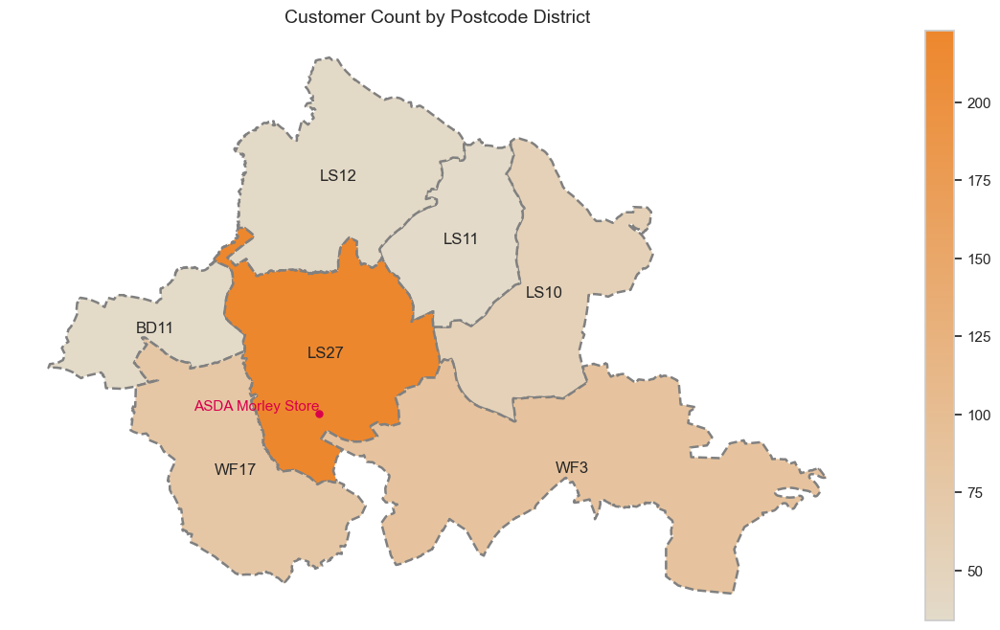

In [1031]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Define a custom color map: red for low values, white for intermediate, and blue for high values
cmap = LinearSegmentedColormap.from_list("custom_contrast", ["#e3dac9", "#ed872d"])

# Plot the GeoDataFrame with the counts
gdf_postcode_counts.plot(column='count', ax=ax, legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--')

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#d9004c', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#d9004c')

# Annotate the map with postcode labels
for x, y, label in zip(gdf_postcode_counts.geometry.centroid.x, 
                       gdf_postcode_counts.geometry.centroid.y, 
                       gdf_postcode_counts['pc_first_part']):
    ax.text(x, y, label, fontsize=12, ha='center', va='center')

# ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)
# Turn off the axis frame
ax.set_axis_off()

# Set title
ax.set_title('Customer Count by Postcode District', fontsize=14)

# Show plot
plt.show()

# Save the plot as an image file
fig.savefig('Results\Img\Customer Count by Postcode District.png', dpi=150, bbox_inches='tight')

 The ASDA Morley store is located in postcode district LS27, which has the highest number of customers. Nearby areas such as WF17 and WF3 also have a relatively high customer count due to their proximity to the store.

<br>

#### Shopping pattern across postcode district

In [1032]:
# Group by pc_first_part and shopping_pattern, then count the occurrences
postcode_pattern_counts = gdf_customer_cluster_postcode.groupby(['pc_first_part', 'shopping_pattern']).size().unstack(fill_value=0)

# Calculate the proportion for each shopping pattern within each postal code
postcode_pattern_proportions = postcode_pattern_counts.div(postcode_pattern_counts.sum(axis=1), axis=0)
postcode_pattern_proportions = postcode_pattern_proportions.round(2)

postcode_pattern_proportions

shopping_pattern,C0: Health-Conscious Shoppers,"C1: Cost-Driven, Less-Health-Conscious Shoppers",C2: Cost-Conscious Balanced Shoppers,C3: Balanced Economy Shoppers
pc_first_part,,,,
BD11,0.17,0.34,0.29,0.20
LS10,0.02,0.55,0.25,0.18
LS11,0.26,0.35,0.21,0.18
LS12,0.22,0.46,0.16,0.16
LS27,0.11,0.32,0.46,0.12
WF17,0.09,0.38,0.31,0.22
WF3,0.09,0.39,0.32,0.20


In [1034]:
postcode_pattern_proportions = postcode_pattern_proportions.round(2)
postcode_pattern_proportions

shopping_pattern,C0: Health-Conscious Shoppers,"C1: Cost-Driven, Less-Health-Conscious Shoppers",C2: Cost-Conscious Balanced Shoppers,C3: Balanced Economy Shoppers
pc_first_part,,,,
BD11,0.17,0.34,0.29,0.20
LS10,0.02,0.55,0.25,0.18
LS11,0.26,0.35,0.21,0.18
LS12,0.22,0.46,0.16,0.16
LS27,0.11,0.32,0.46,0.12
WF17,0.09,0.38,0.31,0.22
WF3,0.09,0.39,0.32,0.20


In [1035]:
# Normalize the pattern counts to get proportions for overall distribution
pattern_proportions = pattern_counts / pattern_counts.sum()

# Convert overall pattern proportions to a DataFrame
overall_proportions_df = pd.DataFrame([pattern_proportions], index=['Overall'])

# Concatenate the overall proportions with the original proportions DataFrame
postcode_pattern_proportions = pd.concat([postcode_pattern_proportions, overall_proportions_df])
postcode_pattern_proportions

shopping_pattern,C0: Health-Conscious Shoppers,"C1: Cost-Driven, Less-Health-Conscious Shoppers",C2: Cost-Conscious Balanced Shoppers,C3: Balanced Economy Shoppers
BD11,0.170000,0.340000,0.290000,0.200000
LS10,0.020000,0.550000,0.250000,0.180000
LS11,0.260000,0.350000,0.210000,0.180000
LS12,0.220000,0.460000,0.160000,0.160000
LS27,0.110000,0.320000,0.460000,0.120000
WF17,0.090000,0.380000,0.310000,0.220000
WF3,0.090000,0.390000,0.320000,0.200000
Overall,0.102889,0.463581,0.295894,0.137636


In [1036]:
# Sort the DataFrame by the specified order of shopping patterns
postcode_pattern_proportions = postcode_pattern_proportions.sort_values(
    by=['C1: Cost-Driven, Less-Health-Conscious Shoppers', 'C2: Cost-Conscious Balanced Shoppers',
        'C3: Balanced Economy Shoppers', 'C0: Health-Conscious Shoppers'],
    ascending=[False, False, False, False])

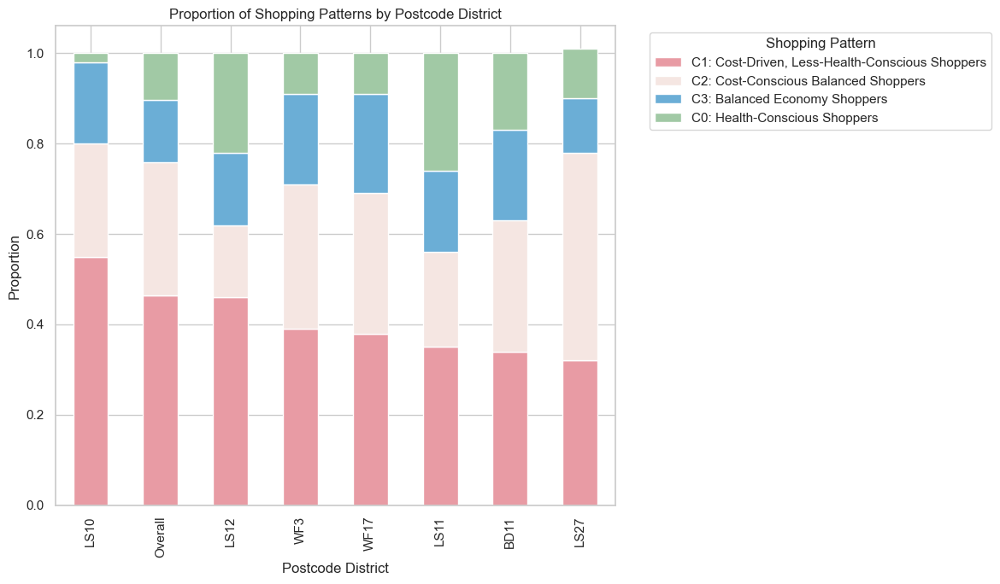

In [1041]:
# Sort the columns of postcode_pattern_proportions according to the desired order
ordered_columns = ['C1: Cost-Driven, Less-Health-Conscious Shoppers', 
                   'C2: Cost-Conscious Balanced Shoppers',
                   'C3: Balanced Economy Shoppers', 
                   'C0: Health-Conscious Shoppers']
postcode_pattern_proportions = postcode_pattern_proportions[ordered_columns]

# Define the colors according to the specified order
colors = ['#e89ba4', '#f5e6e2', '#6baed6', '#a1c9a5']

# Plot the stacked bar plot
fig, ax = plt.subplots(figsize=(12, 7))
postcode_pattern_proportions.plot(kind='bar', stacked=True, ax=ax, color=colors)

# Set the title and labels
plt.title('Proportion of Shopping Patterns by Postcode District')
plt.xlabel('Postcode District')
plt.ylabel('Proportion')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Place the legend outside the plot
plt.legend(title='Shopping Pattern', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

# Save the plot as an image file
fig.savefig('Results\Img\Proportion of Shopping Patterns by Postcode District.png', dpi=150, bbox_inches='tight')

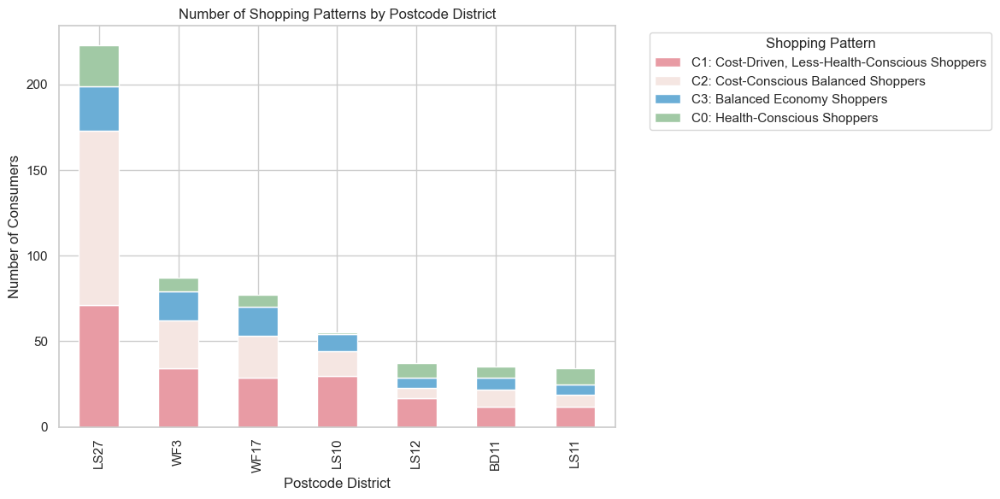

In [1040]:
# Sort the columns of postcode_pattern_proportions according to the desired order
ordered_columns = ['C1: Cost-Driven, Less-Health-Conscious Shoppers', 
                   'C2: Cost-Conscious Balanced Shoppers',
                   'C3: Balanced Economy Shoppers', 
                   'C0: Health-Conscious Shoppers']
postcode_pattern_counts = postcode_pattern_counts[ordered_columns]

# Calculate the total count for each postcode and sort by this total
postcode_pattern_counts['Total'] = postcode_pattern_counts.sum(axis=1)
postcode_pattern_counts = postcode_pattern_counts.sort_values(by='Total', ascending=False)
postcode_pattern_counts = postcode_pattern_counts.drop(columns='Total')

# Define the colors according to the specified order
colors = ['#e89ba4', '#f5e6e2', '#6baed6', '#a1c9a5']

# Plot the stacked bar plot
fig, ax = plt.subplots(figsize=(12, 6))
postcode_pattern_counts.plot(kind='bar', stacked=True, ax=ax, color=colors)

# Set the title and labels
plt.title('Number of Shopping Patterns by Postcode District')
plt.xlabel('Postcode District')
plt.ylabel('Number of Consumers')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Place the legend outside the plot
plt.legend(title='Shopping Pattern', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

# Save the plot as an image file
fig.savefig(r'Results\Img\Number of Shopping Patterns by Postcode District.png', dpi=150, bbox_inches='tight')

**Geographical Distribution of Shopping Pattern Percentages**

In [1042]:
postcode_pattern_proportions.reset_index(inplace=True)

In [1043]:
gdf_postcode.head(3)

,PostDist,geometry
0,AB10,"POLYGON ((392500.960 805927.935, 392536.991 80..."
1,AB11,"MULTIPOLYGON (((397283.458 805385.540, 397279...."
2,AB12,"MULTIPOLYGON (((381763.351 798479.977, 382316...."


In [1044]:
postcode_pattern_proportions = postcode_pattern_proportions.merge(gdf_postcode, left_on='index', right_on='PostDist', how='left')

postcode_pattern_proportions.head()

,index,"C1: Cost-Driven, Less-Health-Conscious Shoppers",C2: Cost-Conscious Balanced Shoppers,C3: Balanced Economy Shoppers,C0: Health-Conscious Shoppers,PostDist,geometry
0,LS10,0.550000,0.250000,0.180000,0.020000,LS10,"POLYGON ((428438.106 428725.078, 428843.895 42..."
1,Overall,0.463581,0.295894,0.137636,0.102889,NaN,None
2,LS12,0.460000,0.160000,0.160000,0.220000,LS12,"POLYGON ((423781.114 431092.400, 423782.054 43..."
3,WF3,0.390000,0.320000,0.200000,0.090000,WF3,"POLYGON ((428588.579 427861.305, 428593.723 42..."
4,WF17,0.380000,0.310000,0.220000,0.090000,WF17,"MULTIPOLYGON (((421333.824 427304.295, 421334...."


In [1045]:
postcode_pattern_proportions.head()

,index,"C1: Cost-Driven, Less-Health-Conscious Shoppers",C2: Cost-Conscious Balanced Shoppers,C3: Balanced Economy Shoppers,C0: Health-Conscious Shoppers,PostDist,geometry
0,LS10,0.550000,0.250000,0.180000,0.020000,LS10,"POLYGON ((428438.106 428725.078, 428843.895 42..."
1,Overall,0.463581,0.295894,0.137636,0.102889,NaN,None
2,LS12,0.460000,0.160000,0.160000,0.220000,LS12,"POLYGON ((423781.114 431092.400, 423782.054 43..."
3,WF3,0.390000,0.320000,0.200000,0.090000,WF3,"POLYGON ((428588.579 427861.305, 428593.723 42..."
4,WF17,0.380000,0.310000,0.220000,0.090000,WF17,"MULTIPOLYGON (((421333.824 427304.295, 421334...."


In [1046]:
gdf_postcode_pattern_proportions = gpd.GeoDataFrame(postcode_pattern_proportions, geometry='geometry')

In [1047]:
gdf_postcode_pattern_proportions.crs

<Projected CRS: PROJCS["Transverse_Mercator",GEOGCS["GCS_Airy 1830 ...>
Name: Transverse_Mercator
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: D_unknown
- Ellipsoid: airy
- Prime Meridian: Greenwich

In [1048]:
# Reproject the GeoDataFrame to WGS 84 (latitude and longitude)
gdf_postcode_pattern_proportions = gdf_postcode_pattern_proportions.to_crs(epsg=27700)
# Verify the CRS has been updated
print(gdf_postcode_pattern_proportions.crs)

EPSG:27700


In [1049]:
# ASDA Morley Store location in longitude and latitude
morley_store_lon, morley_store_lat = -1.6103952894370475, 53.73540555909654

# Define the source (WGS84) and target (EPSG:27700) coordinate reference systems
wgs84 = pyproj.CRS('EPSG:4326')
british_national_grid = pyproj.CRS('EPSG:27700')

# Create a transformer object
transformer = pyproj.Transformer.from_crs(wgs84, british_national_grid, always_xy=True)

# Transform the coordinates to EPSG:27700
morley_store_x, morley_store_y = transformer.transform(morley_store_lon, morley_store_lat)

posx and posy should be finite values
posx and posy should be finite values


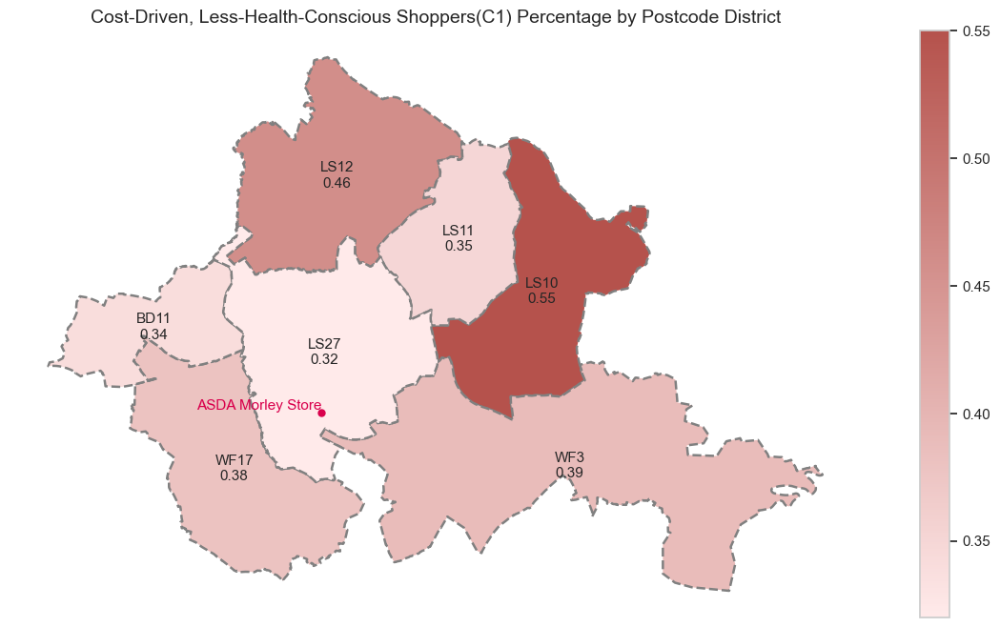

posx and posy should be finite values
posx and posy should be finite values


In [1055]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Define a custom color map
cmap = LinearSegmentedColormap.from_list("custom_contrast", ["#ffeaea", "#b5524c"])

# Plot the GeoDataFrame with the counts
gdf_postcode_pattern_proportions.plot(column='C1: Cost-Driven, Less-Health-Conscious Shoppers', ax=ax,
                                      legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--')

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#d9004c', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#d9004c')

# Annotate the map with postcode labels and proportions
for x, y, label, value in zip(gdf_postcode_pattern_proportions.geometry.centroid.x, 
                              gdf_postcode_pattern_proportions.geometry.centroid.y, 
                              gdf_postcode_pattern_proportions['index'],
                              gdf_postcode_pattern_proportions['C1: Cost-Driven, Less-Health-Conscious Shoppers']):
    ax.text(x, y, f'{label}\n{value:.2f}', fontsize=11, ha='center', va='center')

# ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)

# Turn off the axis frame
ax.set_axis_off()

# Set title
ax.set_title('Cost-Driven, Less-Health-Conscious Shoppers(C1) Percentage by Postcode District', fontsize=14)

# Show plot
plt.show()

# Save the plot as an image file
fig.savefig('Results\Img\Cost-Driven, Less-Health-Conscious Shoppers(C1) Percentage by Postcode District.png', dpi=150, bbox_inches='tight')

From the maps, **LS10** stands out as the only postcode where the percentage of Cost-Driven, Less-Health-Conscious Shoppers exceeds the overall percentage, and it also has the lowest proportion of Health-Conscious Shoppers. This suggests that residents in **LS10** tend to have less healthy shopping behaviours. In contrast, shoppers in **LS11** show a higher inclination towards healthier food choices ; however, it is crucial to consider that the sample size from **LS11** consists of only 30 customers, which may limit the reliability of these findings.

posx and posy should be finite values
posx and posy should be finite values


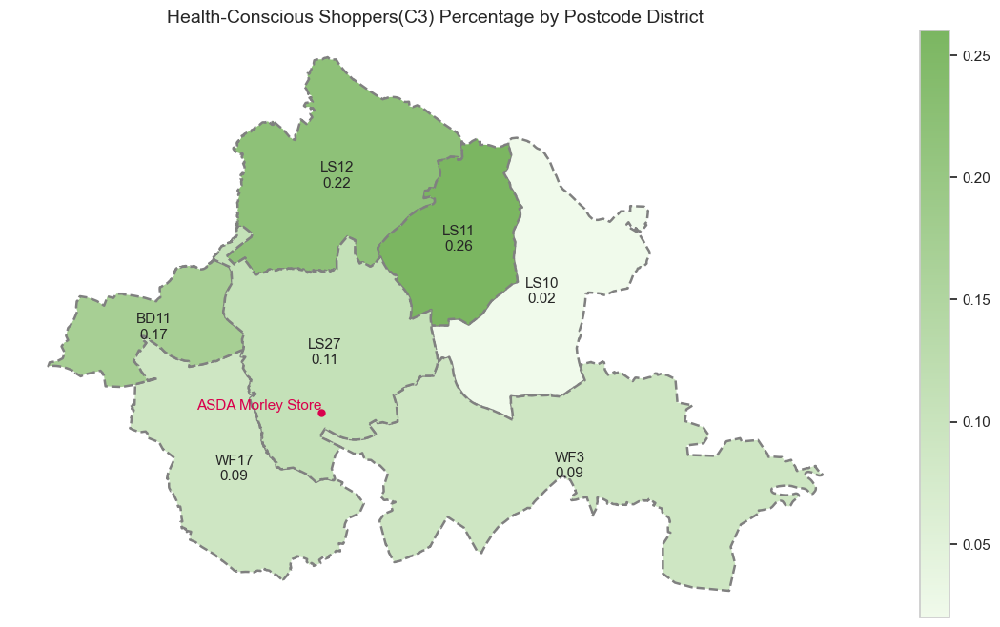

posx and posy should be finite values
posx and posy should be finite values


In [1056]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Define a custom color map
cmap = LinearSegmentedColormap.from_list("custom_contrast", ["#f0faeb", "#7bb661"])

# Plot the GeoDataFrame with the counts
gdf_postcode_pattern_proportions.plot(column='C0: Health-Conscious Shoppers', ax=ax,
                                      legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--')

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#d9004c', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#d9004c')


# Annotate the map with postcode labels and proportions
for x, y, label, value in zip(gdf_postcode_pattern_proportions.geometry.centroid.x, 
                              gdf_postcode_pattern_proportions.geometry.centroid.y, 
                              gdf_postcode_pattern_proportions['index'],
                              gdf_postcode_pattern_proportions['C0: Health-Conscious Shoppers']):
    ax.text(x, y, f'{label}\n{value:.2f}', fontsize=11, ha='center', va='center')

# ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)

# Turn off the axis frame
ax.set_axis_off()

# Set title
ax.set_title('Health-Conscious Shoppers(C3) Percentage by Postcode District', fontsize=14)

# Show plot
plt.show()

# Save the plot as an image file
fig.savefig('Results\Img\Health-Conscious Shoppers(C3) Percentage by Postcode District.png', dpi=150, bbox_inches='tight')

<br>

#### Shopping frequency across postcode district

In [627]:
# Group by pc_first_part and shopping_pattern, then count the occurrences
postcode_freq_counts = gdf_customer_cluster_postcode.groupby(['pc_first_part', 'frequency']).size().unstack(fill_value=0)

# Calculate the proportion for each shopping pattern within each postal code
postcode_freq_proportions = postcode_freq_counts.div(postcode_freq_counts.sum(axis=1), axis=0)
postcode_freq_proportions = postcode_freq_proportions.round(2)

postcode_freq_proportions

frequency,C0: Occasional Shoppers,C1: Frequent Shoppers,C2: Consistent Shoppers
pc_first_part,,,
BD11,0.71,0.26,0.03
LS10,0.91,0.09,0.00
LS11,0.91,0.06,0.03
LS12,0.86,0.14,0.00
LS27,0.60,0.35,0.04
WF17,0.78,0.19,0.03
WF3,0.69,0.25,0.06


In [628]:
# Define the overall transaction averages
overall_averages = {
    'C0: Occasional Shoppers': 0.81,
    'C1: Frequent Shoppers': 0.17,
    'C2: Consistent Shoppers': 0.02
}

# Create a DataFrame from the overall averages
overall_averages_df = pd.DataFrame([overall_averages], index=['Overall'])

# Concatenate the overall averages with the original proportions DataFrame
postcode_freq_proportions = pd.concat([postcode_freq_proportions, overall_averages_df])

# Display the updated DataFrame
postcode_freq_proportions

,C0: Occasional Shoppers,C1: Frequent Shoppers,C2: Consistent Shoppers
BD11,0.71,0.26,0.03
LS10,0.91,0.09,0.00
LS11,0.91,0.06,0.03
LS12,0.86,0.14,0.00
LS27,0.60,0.35,0.04
WF17,0.78,0.19,0.03
WF3,0.69,0.25,0.06
Overall,0.81,0.17,0.02


In [629]:
# Sort the DataFrame by the specified order of shopping patterns
postcode_freq_proportions = postcode_freq_proportions.sort_values(
    by=['C0: Occasional Shoppers', 'C1: Frequent Shoppers', 'C2: Consistent Shoppers'],
    ascending=[False, False, False])

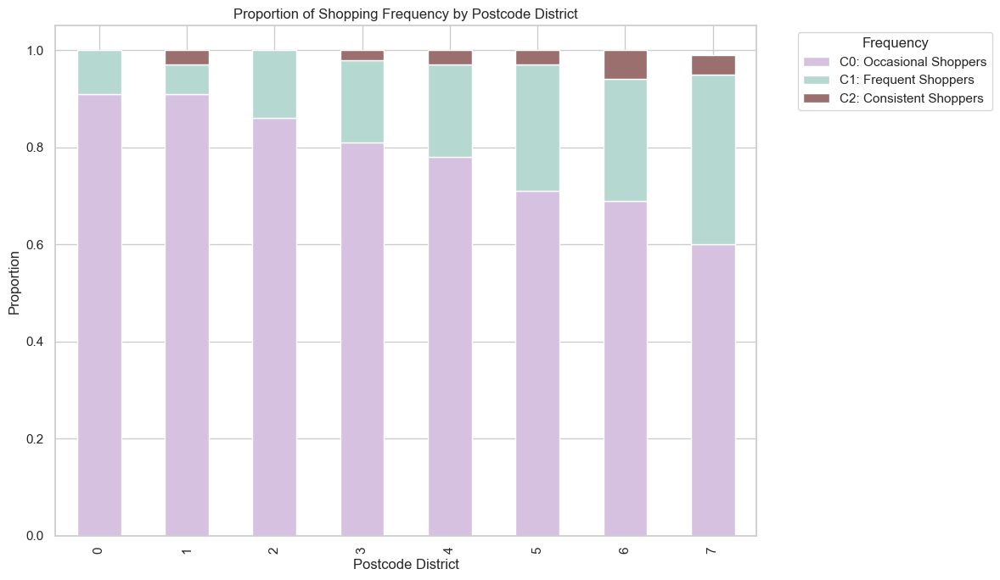

In [996]:
# Sort the columns of postcode_pattern_proportions according to the desired order
ordered_columns = ['C0: Occasional Shoppers', 'C1: Frequent Shoppers', 'C2: Consistent Shoppers']
postcode_freq_proportions = postcode_freq_proportions[ordered_columns]

# Define the colors according to the specified order
colors = ['#d6c1e0', '#b5d8d1', '#9b6f6e']

# Plot the stacked bar plot
fig, ax = plt.subplots(figsize=(12, 7))
postcode_freq_proportions.plot(kind='bar', stacked=True, ax=ax, color=colors)

# Set the title and labels
plt.title('Proportion of Shopping Frequency by Postcode District')
plt.xlabel('Postcode District')
plt.ylabel('Proportion')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Place the legend outside the plot
plt.legend(title='Frequency', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

# Save the plot as an image file
fig.savefig('Results\Img\Proportion of Shopping Frequency by Postcode District.png', dpi=150, bbox_inches='tight')

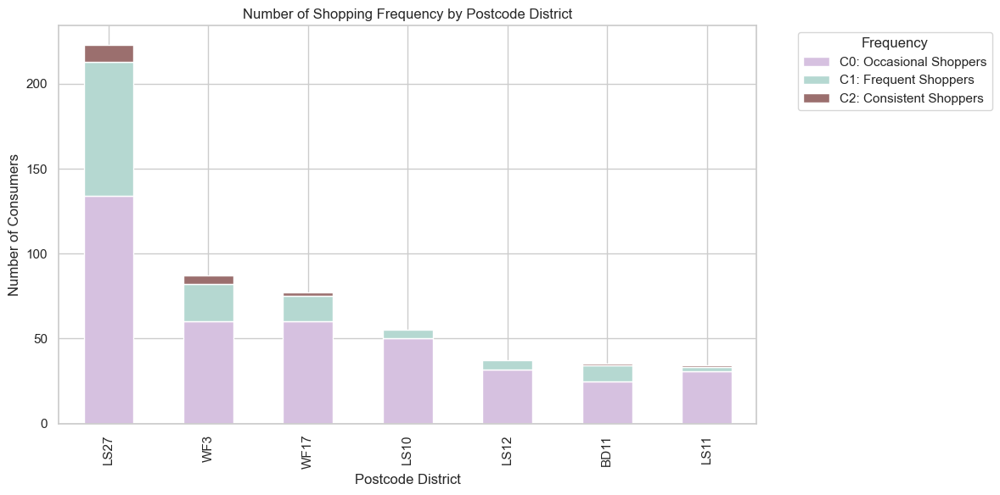

In [997]:
# Sort the columns of postcode_pattern_proportions according to the desired order
ordered_columns = ['C0: Occasional Shoppers', 'C1: Frequent Shoppers', 'C2: Consistent Shoppers']
postcode_freq_proportions = postcode_freq_proportions[ordered_columns]

# Calculate the total count for each postcode and sort by this total
postcode_freq_counts['Total'] = postcode_freq_counts.sum(axis=1)
postcode_freq_counts = postcode_freq_counts.sort_values(by='Total', ascending=False)
postcode_freq_counts = postcode_freq_counts.drop(columns='Total')

# Define the colors according to the specified order
colors = ['#d6c1e0', '#b5d8d1', '#9b6f6e']

# Plot the stacked bar plot
fig, ax = plt.subplots(figsize=(12, 6))
postcode_freq_counts.plot(kind='bar', stacked=True, ax=ax, color=colors)

# Set the title and labels
plt.title('Number of Shopping Frequency by Postcode District')
plt.xlabel('Postcode District')
plt.ylabel('Number of Consumers')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Place the legend outside the plot
plt.legend(title='Frequency', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

# Save the plot as an image file
fig.savefig(r'Results\Img\Number of Shopping Frequency by Postcode District.png', dpi=150, bbox_inches='tight')

**Geographical Distribution of Shopping Pattern Percentages**

In [632]:
postcode_freq_proportions.reset_index(inplace=True)

In [633]:
gdf_postcode.head(3)

,PostDist,geometry
0,AB10,"POLYGON ((392500.960 805927.935, 392536.991 80..."
1,AB11,"MULTIPOLYGON (((397283.458 805385.540, 397279...."
2,AB12,"MULTIPOLYGON (((381763.351 798479.977, 382316...."


In [634]:
postcode_freq_proportions = postcode_freq_proportions.merge(gdf_postcode, left_on='index', right_on='PostDist', how='left')

In [635]:
postcode_freq_proportions.head()

,index,C0: Occasional Shoppers,C1: Frequent Shoppers,C2: Consistent Shoppers,PostDist,geometry
0,LS10,0.91,0.09,0.00,LS10,"POLYGON ((428438.106 428725.078, 428843.895 42..."
1,LS11,0.91,0.06,0.03,LS11,"POLYGON ((429186.692 432749.546, 429173.524 43..."
2,LS12,0.86,0.14,0.00,LS12,"POLYGON ((423781.114 431092.400, 423782.054 43..."
3,Overall,0.81,0.17,0.02,NaN,None
4,WF17,0.78,0.19,0.03,WF17,"MULTIPOLYGON (((421333.824 427304.295, 421334...."


In [636]:
gdf_postcode_freq_proportions = gpd.GeoDataFrame(postcode_freq_proportions, geometry='geometry')

In [637]:
gdf_postcode_freq_proportions.crs

<Projected CRS: PROJCS["Transverse_Mercator",GEOGCS["GCS_Airy 1830 ...>
Name: Transverse_Mercator
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: D_unknown
- Ellipsoid: airy
- Prime Meridian: Greenwich

In [638]:
# Reproject the GeoDataFrame to WGS 84 (latitude and longitude)
gdf_postcode_freq_proportions = gdf_postcode_freq_proportions.to_crs(epsg=27700)
# Verify the CRS has been updated
print(gdf_postcode_freq_proportions.crs)

EPSG:27700


In [639]:
# ASDA Morley Store location in longitude and latitude
morley_store_lon, morley_store_lat = -1.6103952894370475, 53.73540555909654

# Define the source (WGS84) and target (EPSG:27700) coordinate reference systems
wgs84 = pyproj.CRS('EPSG:4326')
british_national_grid = pyproj.CRS('EPSG:27700')

# Create a transformer object
transformer = pyproj.Transformer.from_crs(wgs84, british_national_grid, always_xy=True)

# Transform the coordinates to EPSG:27700
morley_store_x, morley_store_y = transformer.transform(morley_store_lon, morley_store_lat)

posx and posy should be finite values
posx and posy should be finite values


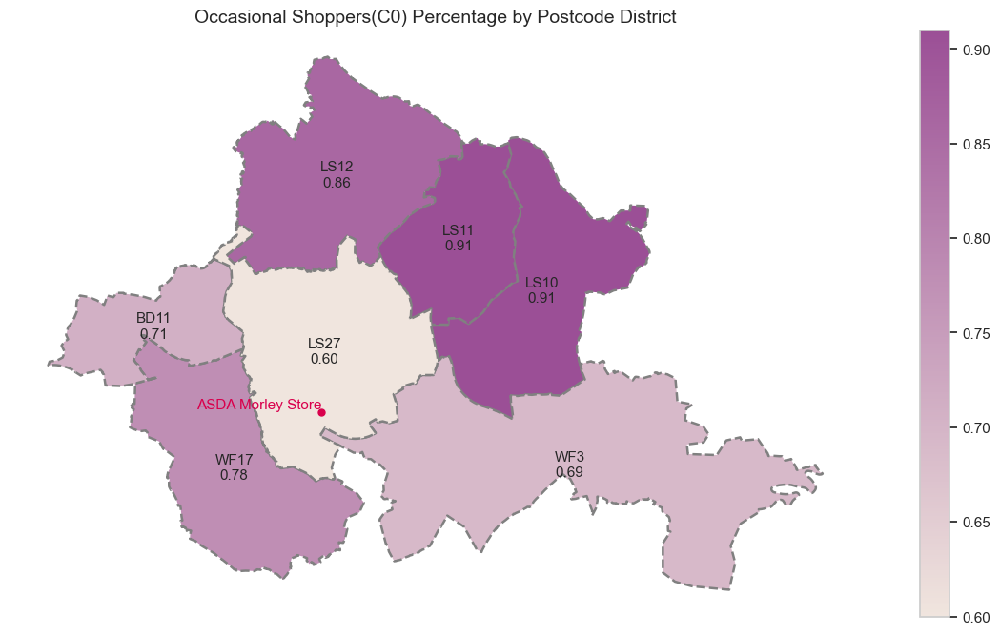

posx and posy should be finite values
posx and posy should be finite values


In [1001]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Define a custom color map
cmap = LinearSegmentedColormap.from_list("custom_contrast", ["#F0E5DE", "#9b4f96"])

# Plot the GeoDataFrame with the counts
gdf_postcode_freq_proportions.plot(column='C0: Occasional Shoppers', ax=ax, legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--')

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#e3dac9', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#d9004c', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#d9004c')

# Annotate the map with postcode labels and proportions
for x, y, label, value in zip(gdf_postcode_freq_proportions.geometry.centroid.x, 
                              gdf_postcode_freq_proportions.geometry.centroid.y, 
                              gdf_postcode_freq_proportions['index'],
                              gdf_postcode_freq_proportions['C0: Occasional Shoppers']):
    ax.text(x, y, f'{label}\n{value:.2f}', fontsize=11, ha='center', va='center')

# ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)

# Turn off the axis frame
ax.set_axis_off()

# Set title
ax.set_title('Occasional Shoppers(C0) Percentage by Postcode District', fontsize=14)

# Show plot
plt.show()

# Save the plot as an image file
fig.savefig(r'Results\Img\occasional_shoppers_percentage_by_postcode.png', dpi=150, bbox_inches='tight')

In terms of shopping frequency, over 60% of shoppers in all postcodes are occasional shoppers. **LS10** and **LS11** have the highest proportion of occasional shoppers, while **LS27**, where the ASDA Morley store is located, has a higher number of frequent shoppers, likely due to its proximity to the store. Consistent shoppers are the least common, making up around 10-20% of shoppers in each postcode district.

In [763]:
# Filter the DataFrame to find rows where 'C2: Consistent Shoppers' is exactly 0.00
postcode_zero_shoppers = gdf_postcode_freq_proportions[gdf_postcode_freq_proportions['C2: Consistent Shoppers'] == 0.00]
postcode_zero_shoppers['index']

0    LS10
2    LS12
Name: index, dtype: object

In [764]:
# Set a specific value for zero shoppers, for example -1
gdf_postcode_freq_proportions['plot_color'] = np.where(gdf_postcode_freq_proportions['C2: Consistent Shoppers'] == 0.00, -1, gdf_postcode_freq_proportions['C2: Consistent Shoppers'])

In [1004]:
# Update the color map to handle -1 as grey
cmap = LinearSegmentedColormap.from_list("custom_contrast", ["#eee2df", "#9b6f6e"])

# Replace -1 values with NaN so that the missing_kwds works
gdf_postcode_freq_proportions['plot_color'] = gdf_postcode_freq_proportions['plot_color'].replace(-1, np.nan)

posx and posy should be finite values
posx and posy should be finite values


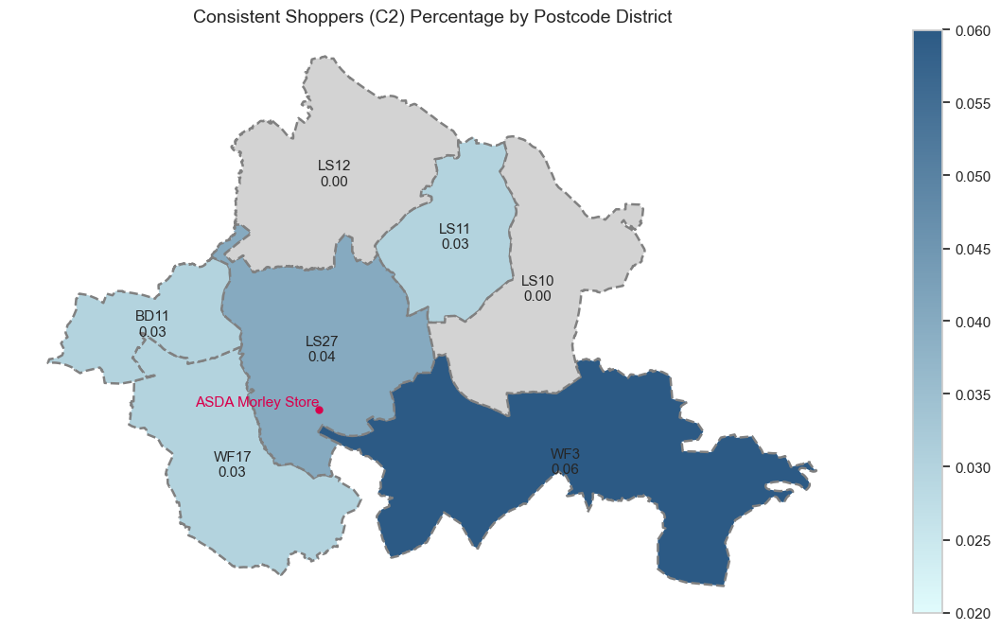

posx and posy should be finite values
posx and posy should be finite values


In [1014]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Plot the GeoDataFrame with the counts, applying the custom cmap
gdf_postcode_freq_proportions.plot(column='plot_color', ax=ax, legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--', 
                                   missing_kwds={"color": "#d3d3d3", "label": "No Consistent Shoppers"})

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#d9004c', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#d9004c')

# Annotate the map with postcode labels and proportions
for x, y, label, value in zip(gdf_postcode_freq_proportions.geometry.centroid.x, 
                              gdf_postcode_freq_proportions.geometry.centroid.y, 
                              gdf_postcode_freq_proportions['index'],
                              gdf_postcode_freq_proportions['C2: Consistent Shoppers']):
    ax.text(x, y, f'{label}\n{value:.2f}', fontsize=11, ha='center', va='center')

# Add grid and title
ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)
ax.set_axis_off()
ax.set_title('Consistent Shoppers (C2) Percentage by Postcode District', fontsize=14)

# Show plot
plt.show()

# Save the plot as an image file
fig.savefig(r'Results\Img\consistent_shoppers_percentage_by_postcode_area.png', dpi=150, bbox_inches='tight')

posx and posy should be finite values
posx and posy should be finite values


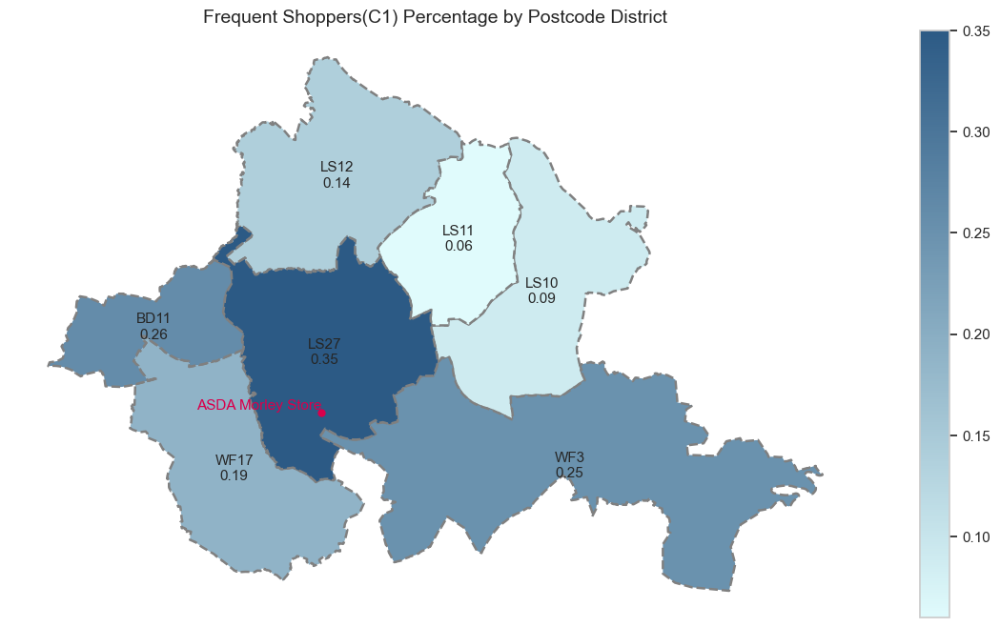

posx and posy should be finite values
posx and posy should be finite values


In [1015]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Define a custom color map
cmap = LinearSegmentedColormap.from_list("custom_contrast", ["#e0fbfc", "#2c5a85"])

# Plot the GeoDataFrame with the counts
gdf_postcode_freq_proportions.plot(column='C1: Frequent Shoppers', ax=ax, legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--')

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#d9004c', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#d9004c')

# Annotate the map with postcode labels and proportions
for x, y, label, value in zip(gdf_postcode_freq_proportions.geometry.centroid.x, 
                              gdf_postcode_freq_proportions.geometry.centroid.y, 
                              gdf_postcode_freq_proportions['index'],
                              gdf_postcode_freq_proportions['C1: Frequent Shoppers']):
    ax.text(x, y, f'{label}\n{value:.2f}', fontsize=11, ha='center', va='center')

# Turn off the axis frame
ax.set_axis_off()
# ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)

# Set title
ax.set_title('Frequent Shoppers(C1) Percentage by Postcode District', fontsize=14)

# Show plot
plt.show()

# Save the plot as an image file
fig.savefig(r'Results\Img\frequent_shoppers_percentage_by_postcode_area.png', dpi=150, bbox_inches='tight')

<br>

- **🤔 Where Are the Unhealthy Customers?**  
Upon analysing the results, the next step is to determine which customer clusters predominantly contain the majority of unhealthy customers. This will help to understand the tendencies of frequent shoppers and whether more consistent shoppers tend to be healthier.

In [651]:
gdf_customer_cluster_postcode.head(1)

,customer_id,avg_baskets_count_per_month,avg_total_spent_per_month,avg_spent_per_basket,avg_NPM_score_total_per_month,NPM_score_per_basket,avg_total_products_count_per_month,avg_products_per_basket,avg_total_healthy_products_count_per_month,avg_healthy_products_per_basket,...,bk_c0_%,bk_c1_%,bk_c2_%,bk_c3_%,shopping_pattern_cluster,shopping_pattern,Cluster_3,frequency,pc_first_part,geometry
10,03952704-e7ee-47d9-9c35-fa1de03b1787,1.0,19.55,19.55,-12.894,-12.894,18.0,18.0,13.0,13.0,...,0.0,0.0,1.0,0.0,3,C3: Health-Conscious Shoppers,0,C0: Occasional Shoppers,LS10,"POLYGON ((428539.237 428700.563, 428945.078 42..."


In [718]:
gdf_customer_cluster_postcode.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [719]:
# Reproject the GeoDataFrame to WGS 84 (latitude and longitude)
gdf_customer_cluster_postcode = gdf_customer_cluster_postcode.to_crs(epsg=27700)
# Verify the CRS has been updated
print(gdf_customer_cluster_postcode.crs)

EPSG:27700


In [720]:
# Step 1: Filter the GeoDataFrame to only include unhealthy customers
unhealthy_customers = gdf_customer_cluster_postcode[gdf_customer_cluster_postcode['avg_NPM_score_total_per_month'] > 0]

# Step 2: Group by 'pc_first_part' and count the number of unhealthy customers in each postcode area
unhealthy_counts = unhealthy_customers.groupby('pc_first_part').size().reset_index(name='unhealthy_count')

# Step 3: Group by 'pc_first_part' to get the total number of customers in each postcode area
total_counts = gdf_customer_cluster_postcode.groupby('pc_first_part').size().reset_index(name='total_count')

# Step 4: Merge the unhealthy counts with the total counts
percentage_counts = unhealthy_counts.merge(total_counts, on='pc_first_part')

# Step 5: Calculate the percentage of unhealthy customers
percentage_counts['unhealthy_percentage'] = (percentage_counts['unhealthy_count'] / percentage_counts['total_count']) * 100

# Step 6: Merge these percentages back with the GeoDataFrame to plot
gdf_unhealthy_percentage = gdf_customer_cluster_postcode.merge(percentage_counts[['pc_first_part', 'unhealthy_percentage']], on='pc_first_part', how='left')

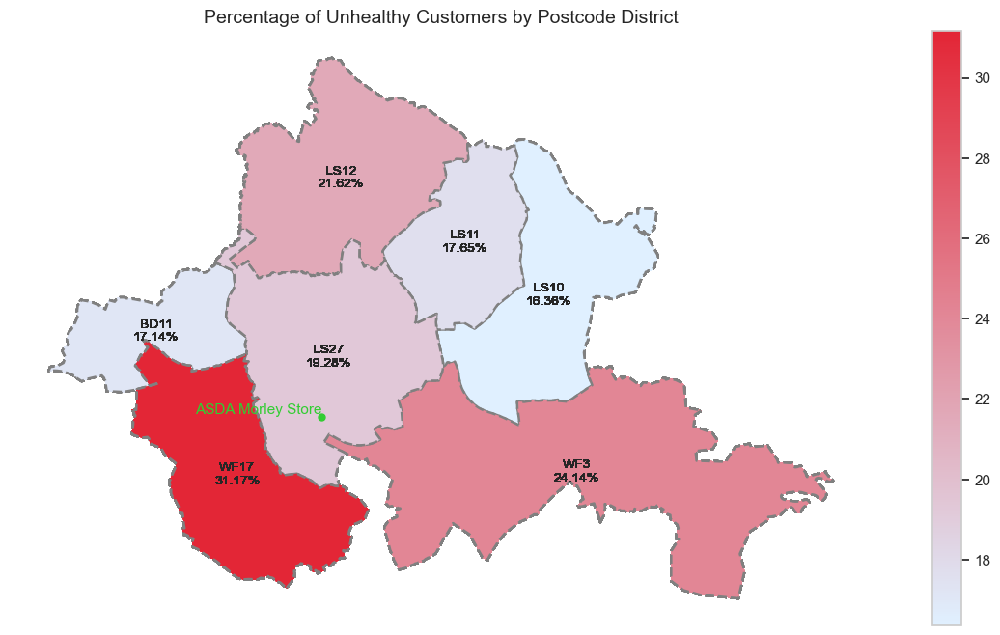

In [724]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Define a custom color map
cmap = LinearSegmentedColormap.from_list("custom_contrast",  ["#e0f0ff", "#e32636"])

# Plot the GeoDataFrame with the counts
gdf_unhealthy_percentage.plot(column='unhealthy_percentage', ax=ax, legend=True, cmap=cmap, edgecolor='gray', linewidth=1.8, linestyle='--')

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

# Add ASDA Morley Store location
ax.plot(morley_store_x, morley_store_y, marker='o', color='#32cd32', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#32cd32')

# Annotate the map with postcode labels and proportions
for x, y, label, value in zip(gdf_unhealthy_percentage.geometry.centroid.x, 
                              gdf_unhealthy_percentage.geometry.centroid.y, 
                              gdf_unhealthy_percentage['pc_first_part'],
                              gdf_unhealthy_percentage['unhealthy_percentage']):
    ax.text(x, y, f'{label}\n{value:.2f}%', fontsize=10, ha='center', va='center')

ax.grid(True, linestyle='--', color='gray', alpha=0.5, zorder=1)

# Turn off the axis frame
ax.set_axis_off()

# Set title
ax.set_title('Percentage of Unhealthy Customers by Postcode District', fontsize=14)

# Show plot
plt.show()

<br>

#### Compare the Cluster Results with Other Demographic Data  
- The Index of Multiple Deprivation (IMD) scores
- Priority Places for Food Index (PPFI)
- Health Status
- Highest Level of Education
- Car Availability

ASDA Morley Store Location in WGS2700 projection

In [654]:
# ASDA Morley Store location in longitude and latitude
morley_store_lon, morley_store_lat = -1.6103952894370475, 53.73540555909654

# Define the source (WGS84) and target (EPSG:27700) coordinate reference systems
wgs84 = pyproj.CRS('EPSG:4326')
british_national_grid = pyproj.CRS('EPSG:27700')

# Create a transformer object
transformer = pyproj.Transformer.from_crs(wgs84, british_national_grid, always_xy=True)

# Transform the coordinates to EPSG:27700
morley_store_x, morley_store_y = transformer.transform(morley_store_lon, morley_store_lat)

- **The Index of Multiple Deprivation (IMD) scores**  
  The Index of Multiple Deprivation (IMD) scores reflect the level of deprivation in different areas. The score is based on factors such as income, employment, health, education, crime, housing, and the living environment. Comparing cluster results with IMD scores helps to understand the socio-economic disparities across different regions.

In [655]:
gdf_imd.head(1)

,lsoa11cd,lsoa11nm,lsoa11nmw,st_areasha,st_lengths,IMD_Rank,IMD_Decile,LSOA01NM,LADcd,LADnm,...,IndDec,OutScore,OutRank,OutDec,TotPop,DepChi,Pop16_59,Pop60+,WorkPop,geometry
0,E01000001,City of London 001A,City of London 001A,133320.768872,2291.846072,29199,9,City of London 001A,E09000001,City of London,...,5,1.503,1615,1,1296,175,656,465,715.0,"POLYGON ((532105.092 182011.230, 532162.491 18..."


In [656]:
# Filter for Leeds area postcodes including 'LS10', 'LS11', 'LS12', 'LS27', 'WF3', 'WF17', 'BD11'
leeds_postcodes_target = gdf_postcode[gdf_postcode['PostDist'].str.startswith(('LS10', 'LS11', 'LS12', 'LS27', 'WF3', 'WF17', 'BD11'))]
leeds_postcodes_target

,PostDist,geometry
154,BD11,"MULTIPOLYGON (((423213.549 430306.395, 423587...."
1377,LS10,"POLYGON ((428438.106 428725.078, 428843.895 42..."
1378,LS11,"POLYGON ((429186.692 432749.546, 429173.524 43..."
1379,LS12,"POLYGON ((423781.114 431092.400, 423782.054 43..."
1395,LS27,"POLYGON ((423201.181 430347.434, 423207.720 43..."
2641,WF17,"MULTIPOLYGON (((421333.824 427304.295, 421334...."
2643,WF3,"POLYGON ((428588.579 427861.305, 428593.723 42..."


In [657]:
gdf_imd = gdf_imd.to_crs(epsg=27700)
leeds_postcodes_target = leeds_postcodes_target.to_crs(epsg=27700)

In [658]:
print(gdf_imd.crs)
print(leeds_postcodes_target.crs)

EPSG:27700
EPSG:27700


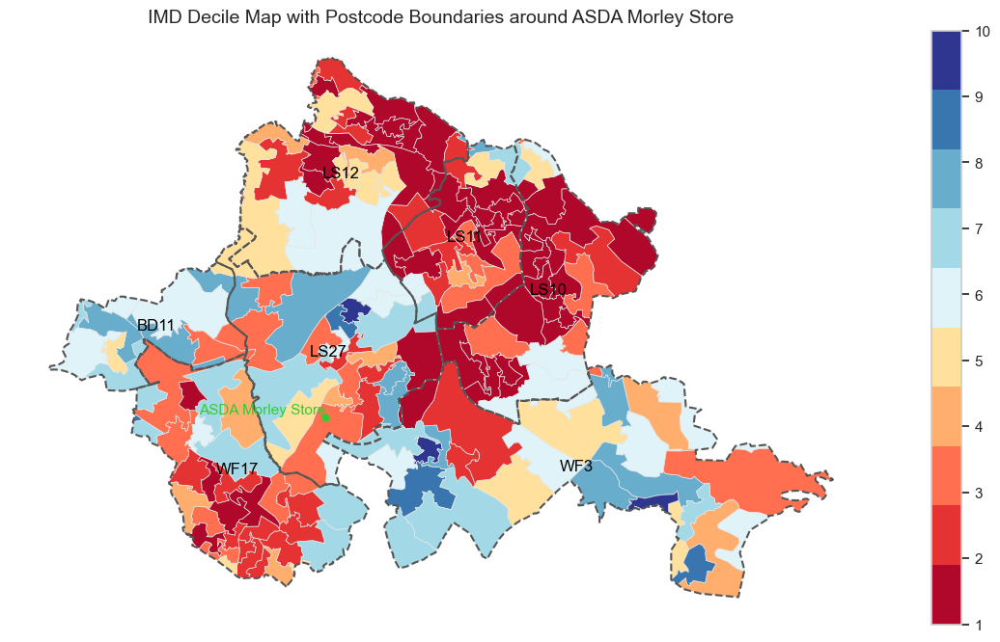

In [659]:
# Calculate intersection
gdf_intersection = gpd.overlay(gdf_imd, leeds_postcodes_target, how='intersection')

# Manually define the color for each IMD_Decile value
colors = {
    1: '#af082b', 2: '#e53333', 3: '#ff6f50', 4: '#ffae6e', 5: '#ffe09c',
    6: '#dff3f9', 7: '#a3d9e7', 8: '#68adcc', 9: '#3976af', 10: '#2f368f'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map, showing only the intersection area
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='IMD_Decile', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.9', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#555555', linestyle='--', linewidth=1.5)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#32cd32', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#32cd32')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='black')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

plt.title('IMD Decile Map with Postcode Boundaries around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file
fig.savefig('Results\Img\IMD Decile Map with Postcode Boundaries around ASDA Morley Store.png', dpi=150, bbox_inches='tight')

The analysis indicates that customers in the **LS10** area exhibit a higher tendency to purchase unhealthy food. This aligns with existing research showing that individuals with lower incomes are more likely to engage in unhealthy shopping behaviours. When compared to the Index of Multiple Deprivation (IMD) scores, **LS10** is predominantly covered by LSOAs (Lower Layer Super Output Areas) within the most deprived decile.

- **Priority Places for Food Index (PPFI)**  
  This index identifies areas with limited access to healthy and affordable food options. Comparing cluster results with this index can reveal how food accessibility influences various demographic or geographic clusters.

In [660]:
gdf_PPFI.head(1)

,LSOA21CD,LSOA21NM,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined,geometry
0,NaN,NaN,4,0,0,10,3,7,0,7,None


In [661]:
leeds_postcodes_target.head(1)

,PostDist,geometry
154,BD11,"MULTIPOLYGON (((423213.549 430306.395, 423587...."


In [706]:
leeds_postcodes_target = leeds_postcodes_target.to_crs(epsg=27700)
gdf_PPFI = gdf_PPFI.to_crs(epsg=27700)
print(leeds_postcodes_target.crs)
print(gdf_PPFI.crs)

EPSG:27700
EPSG:27700


In [707]:
# Calculate intersection
gdf_intersection = gpd.overlay(gdf_PPFI, leeds_postcodes_target, how='intersection', keep_geom_type=False)

In [708]:
gdf_intersection['pp_dec_combined'].isna().sum()

0

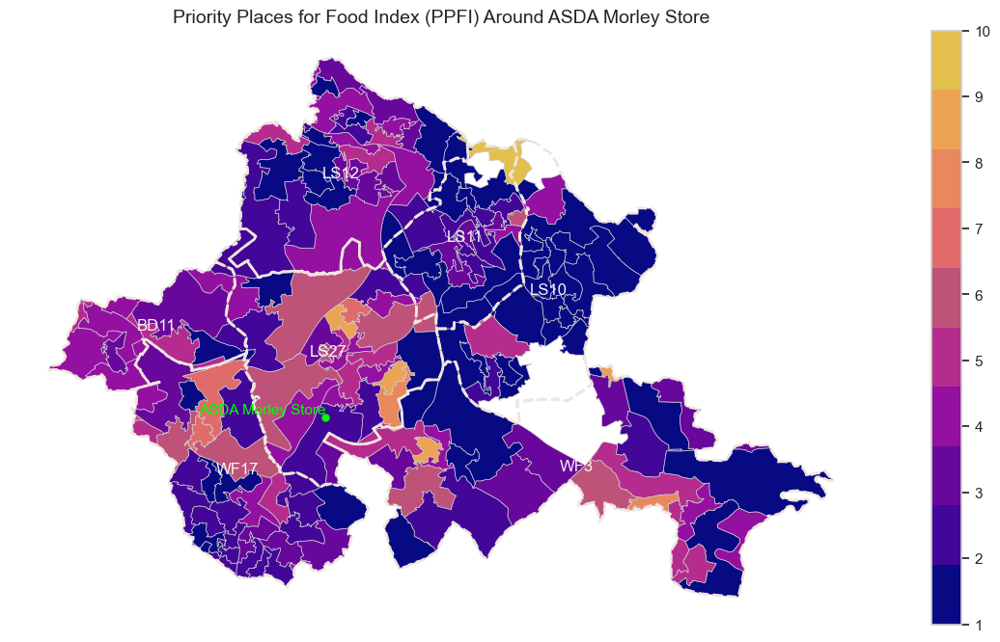

In [709]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_combined', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title
plt.title('Priority Places for Food Index (PPFI) Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

The Priority Places for Food Index (PPFI) highlights **LS10** as a high-priority area for food accessibility, further supporting the correlation between food insecurity and unhealthy shopping behaviour.

In [710]:
gdf_intersection.columns

Index(['LSOA21CD', 'LSOA21NM', 'pp_dec_domain_supermarket_proximity',
       'pp_dec_domain_supermarket_accessibility',
       'pp_dec_domain_ecommerce_access', 'pp_dec_domain_socio_demographic',
       'pp_dec_domain_nonsupermarket_proximity',
       'pp_dec_domain_food_for_families', 'pp_dec_domain_fuel_poverty',
       'pp_dec_combined', 'PostDist', 'geometry'],
      dtype='object')

##### -- 1. Supermarket Proximity Domain

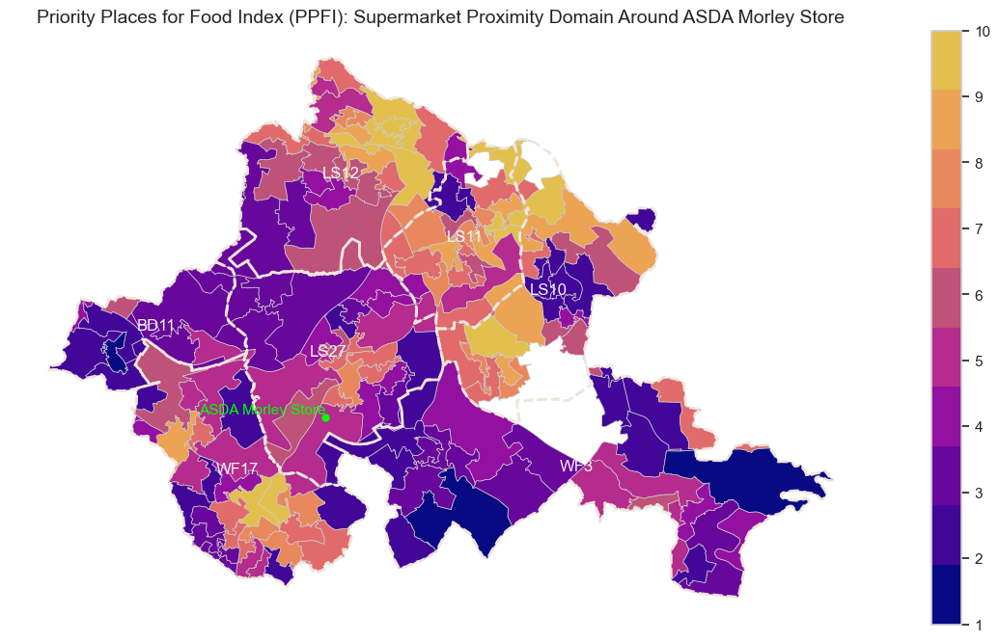

In [711]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_supermarket_proximity', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Supermarket Proximity Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Supermarket Proximity Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Supermarket_Proximity_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

##### --2. Supermarket Accessibility Domain

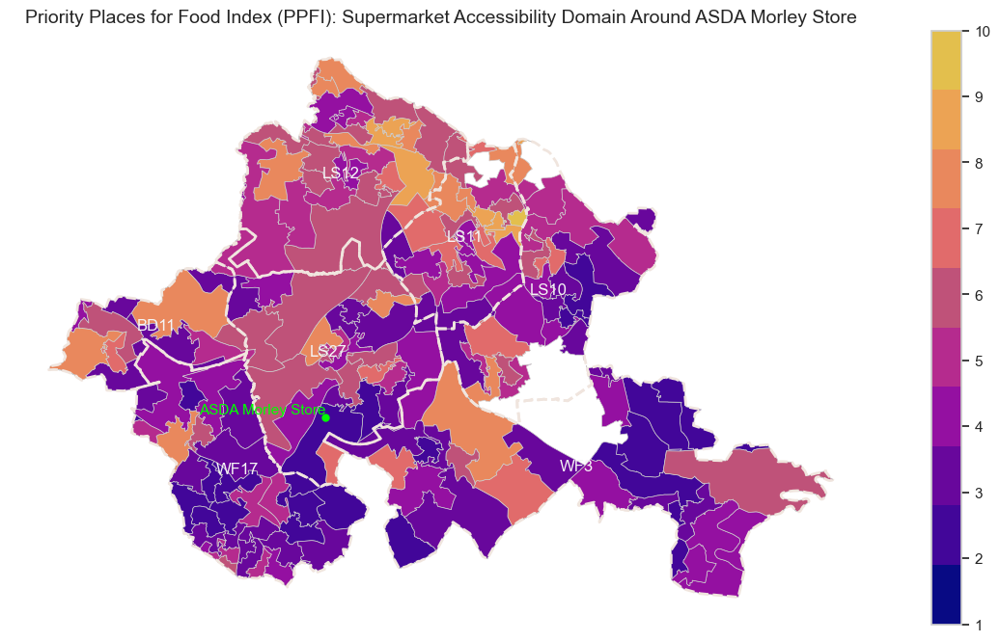

In [712]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_supermarket_accessibility', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Supermarket Accessibility Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Supermarket Accessibility Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Supermarket_Accessibility_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

##### --3. Ecommerce Access Domain

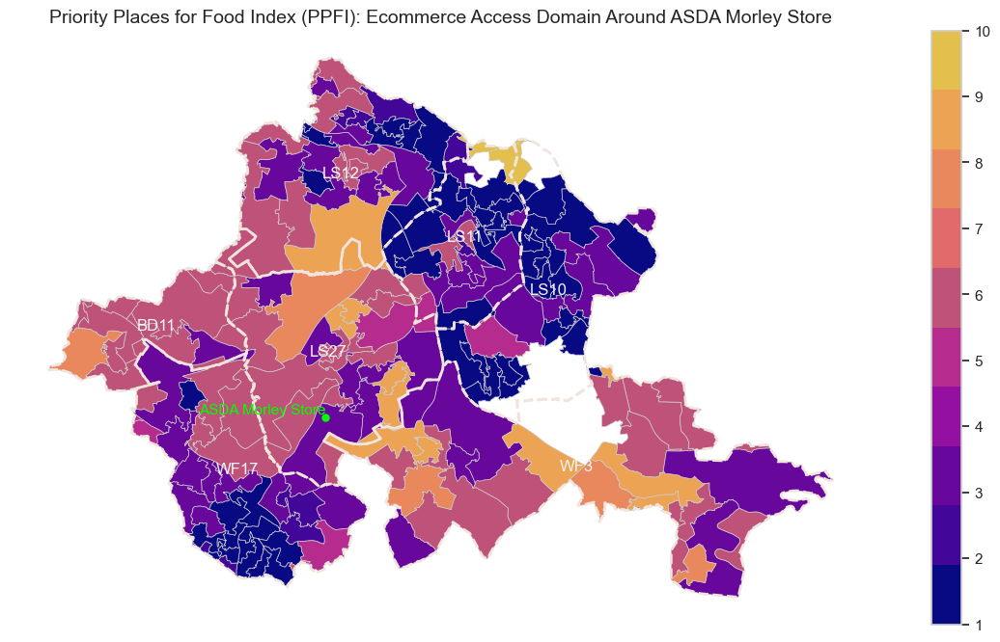

In [713]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_ecommerce_access', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Ecommerce Access Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Ecommerce Access Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Ecommerce_Access_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

##### --4. Socio Demographic Domain

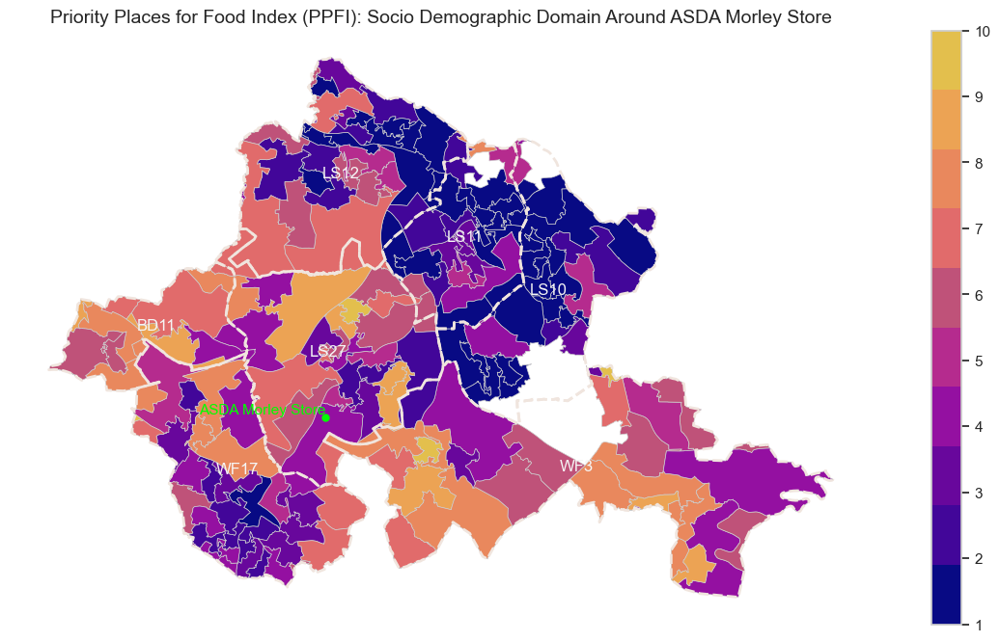

In [714]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_socio_demographic', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Socio Demographic Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Socio Demographic Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Socio_Demographic_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

##### -- 5. Nonsupermarket Proximity Domain

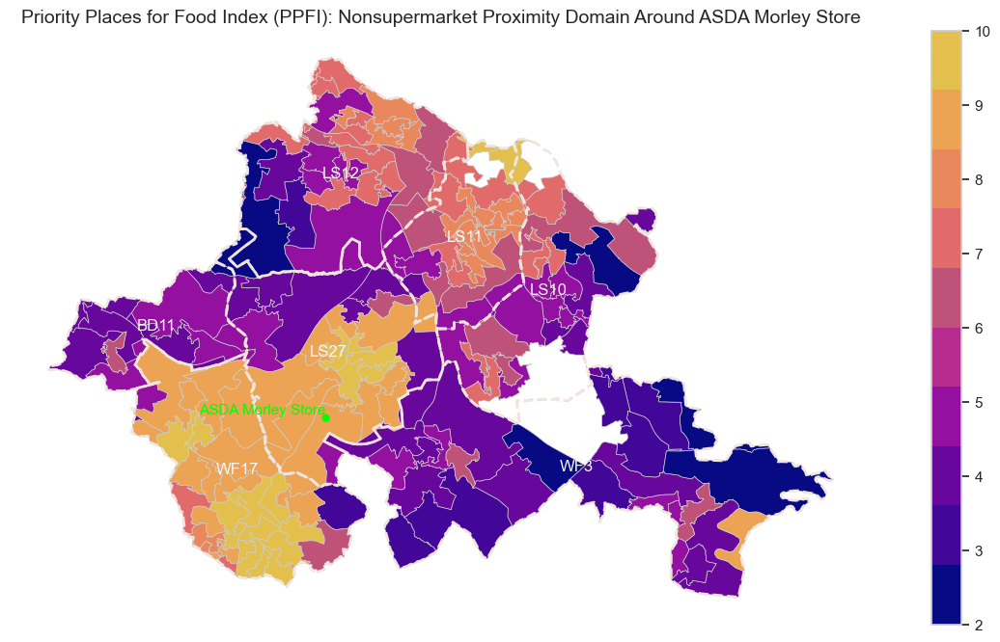

In [715]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_nonsupermarket_proximity', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Nonsupermarket Proximity Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Nonsupermarket Proximity Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Nonsupermarket_Proximity_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

##### -- 6. Food For Family Domain

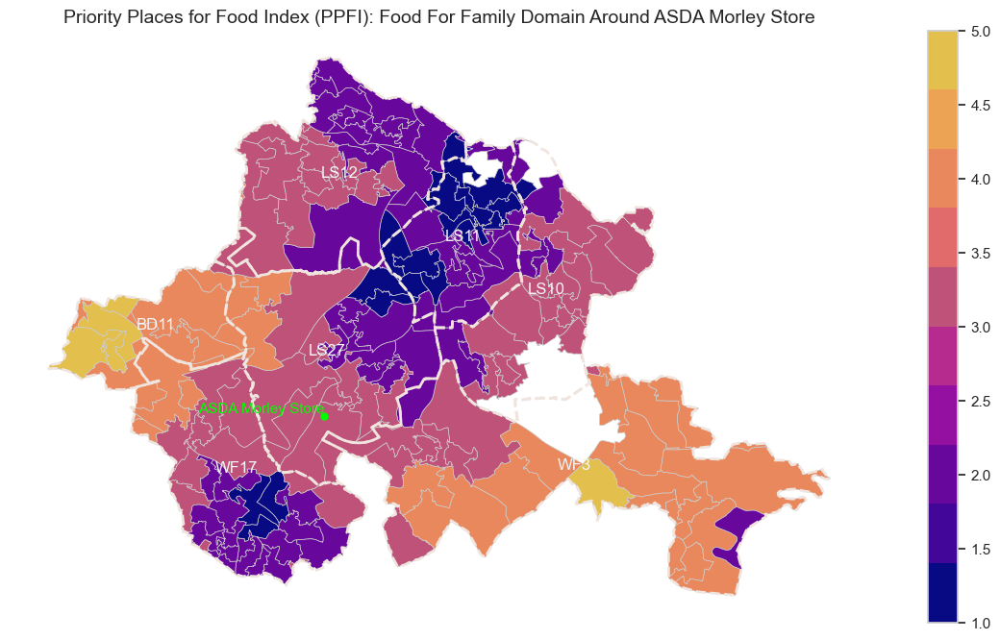

In [716]:
# Manually define the color for each IMD_Decile value
colors = {
    1: '#080a84', 2: '#420699', 3: '#68079c', 4: '#9410a1', 5: '#b52b8e',
    6: '#bf5279', 7: '#e16b6b', 8: '#e9885d', 9: '#eca354', 10: '#e3bf4d'
}

# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_food_for_families', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Food For Family Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Food For Family Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Food_For_Family_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

##### -- 7. Fuel Poverty Domain

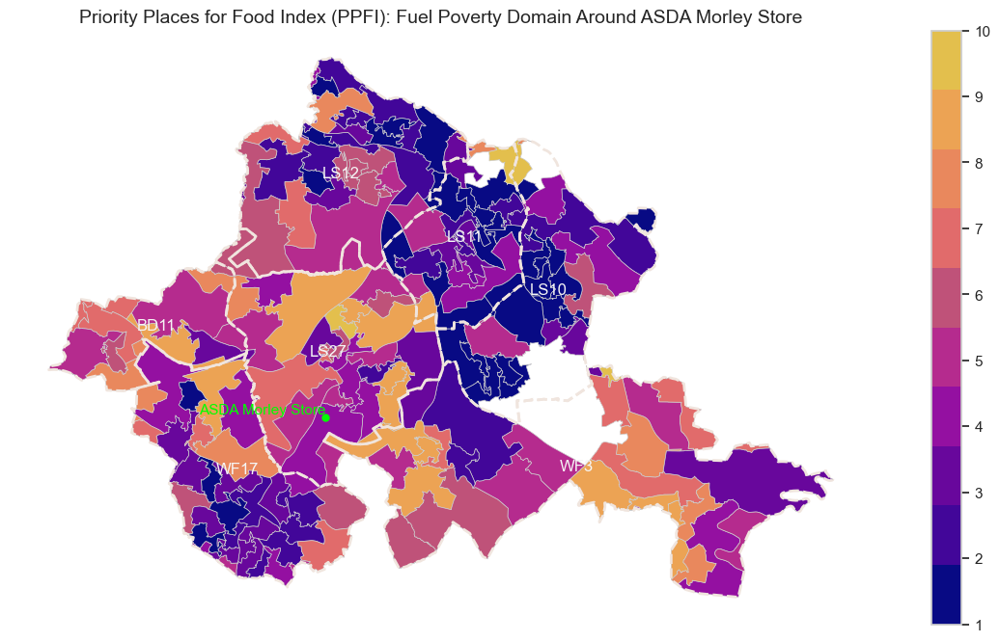

In [717]:
# Create a colormap
cmap = mcolors.ListedColormap([colors[i] for i in sorted(colors.keys())])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='pp_dec_domain_fuel_poverty', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#F0E5DE', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='#f5f5f5')

# Turn off the axis frame
ax.set_axis_off()

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=mcolors.BoundaryNorm(sorted(colors.keys()), cmap.N))

# Change the title to "Priority Places for Food Index (PPFI): Fuel Poverty Domain Around ASDA Morley Store"
plt.title('Priority Places for Food Index (PPFI): Fuel Poverty Domain Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file with a corrected filename
fig.savefig('Results/Img/Priority_Places_for_Food_Index_Fuel_Poverty_Domain_Around_ASDA_Morley_Store.png', dpi=150, bbox_inches='tight')

<br>

- **Health Status**  
  This refers to the overall health and well-being of populations within different clusters. It includes indicators like life expectancy, incidence of diseases, and general physical and mental health. By comparing cluster results with health status, you can identify potential health inequalities or areas needing targeted interventions.

In [1059]:
gdf_demographic.head(1)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,geometry
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1,"POLYGON ((421447.957 428468.095, 421451.399 42..."


In [1060]:
leeds_postcodes_target.head(1)

,PostDist,geometry
154,BD11,"MULTIPOLYGON (((423213.549 430306.395, 423587...."


In [1061]:
leeds_postcodes_target = leeds_postcodes_target.to_crs(epsg=27700)
gdf_demographic = gdf_demographic.to_crs(epsg=27700)
print(leeds_postcodes_target.crs)
print(gdf_demographic.crs)

EPSG:27700
EPSG:27700


In [1062]:
# Calculate intersection
gdf_intersection = gpd.overlay(gdf_demographic, leeds_postcodes_target, how='intersection')

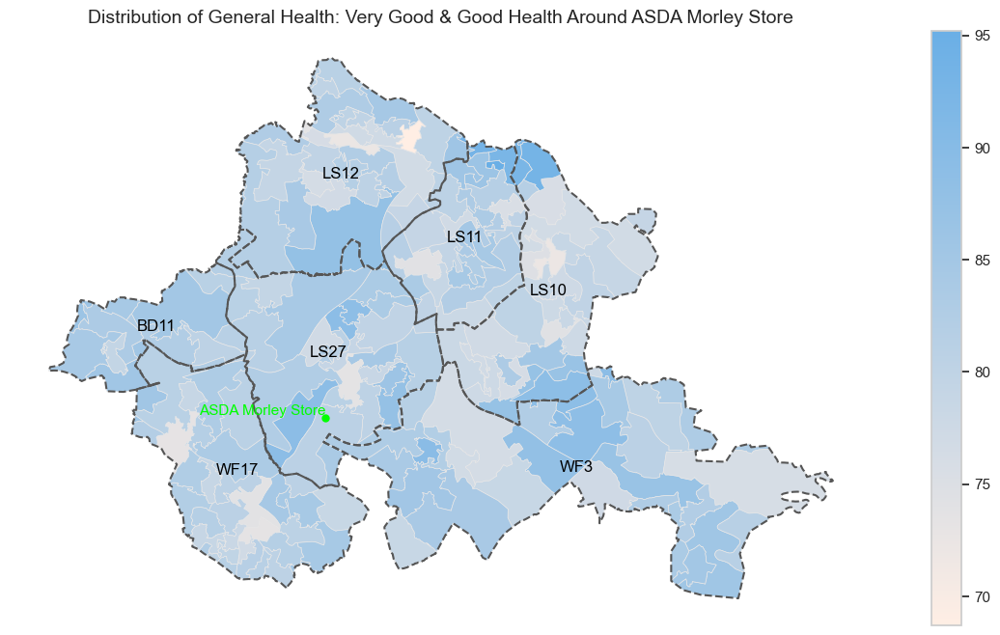

In [1080]:
cmap = mcolors.LinearSegmentedColormap.from_list("custom_blue", ["#FFEEE4", "#6AAFE6"])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='Very_good_and_good_health_%', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.9', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#555555', linestyle='--', linewidth=1.5)

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='black')

# Turn off the axis frame
ax.set_axis_off()

# Change the title to "General Health: Very Good & Good Health"
plt.title('Distribution of General Health: Very Good & Good Health Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file
fig.savefig(r'Results/Img/Distribution_of_General_Health_Very Good_&_Good Health_Around_ASDA Morley_Store.png', dpi=150, bbox_inches='tight')

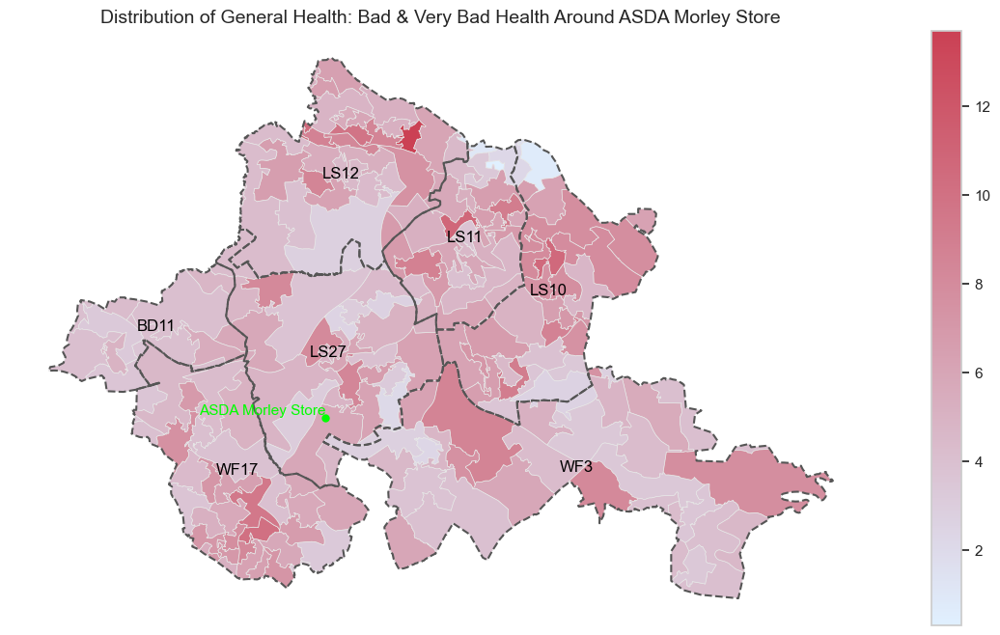

In [1079]:
cmap = mcolors.LinearSegmentedColormap.from_list("custom_blue", ["#e0f0ff", "#cb4154"])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='Bad_and_very_bad_health_%', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.9', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#555555', linestyle='--', linewidth=1.5)

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#ff0028', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='black')

# Turn off the axis frame
ax.set_axis_off()

# Change the title to "General Health: Very Good & Good Health"
plt.title('Distribution of General Health: Bad & Very Bad Health Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file
fig.savefig(r'Results/Img/Distribution_of_General_Health_Bad_&_Very_Bad_Health_Around_ASDA Morley_Store.png', dpi=150, bbox_inches='tight')

Although the distribution of good and bad health does not show significant variation across the seven postcodes, this aspect requires further investigation.

In [680]:
gdf_intersection[gdf_intersection['Very_good_and_good_health_%'].isna()]

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,PostDist,geometry


In [681]:
gdf_intersection[gdf_intersection['geometry'].isna()]

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,PostDist,geometry


<br>

- **Highest Level of Education**  
  This metric indicates the educational attainment levels within different clusters, such as the percentage of the population with no formal education, high school diplomas, or higher education degrees. Comparing cluster results with educational attainment levels can provide insights into the relationship between education and other socio-economic factors.

In [682]:
gdf_demographic.head(1)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,geometry
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1,"POLYGON ((421447.957 428468.095, 421451.399 42..."


In [683]:
leeds_postcodes_target = leeds_postcodes_target.to_crs(epsg=27700)
gdf_demographic = gdf_demographic.to_crs(epsg=27700)
print(leeds_postcodes_target.crs)
print(gdf_demographic.crs)

EPSG:27700
EPSG:27700


In [1073]:
# Calculate intersection
gdf_intersection = gpd.overlay(gdf_demographic, leeds_postcodes_target, how='intersection', keep_geom_type=False)

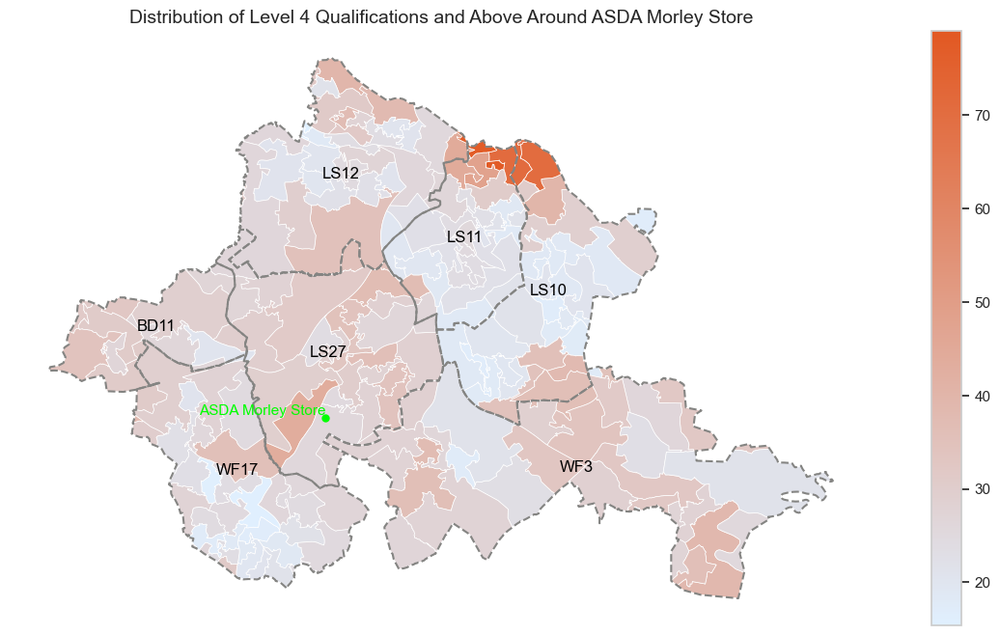

In [1078]:
# Create a more pronounced color gradient from very light to very dark #4682b4
cmap = mcolors.LinearSegmentedColormap.from_list("custom_blue", ["#e0f0ff", "#e25822"])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='L4_qua_or_above_%', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='1.0', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#848482', linestyle='--', linewidth=1.5)

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='black')

# Turn off the axis frame
ax.set_axis_off()

plt.title('Distribution of Level 4 Qualifications and Above Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file
fig.savefig('Results/Img/Distribution of Level 4 Qualifications and Above Around ASDA Morley Store.png', dpi=150, bbox_inches='tight')

 The education level in **LS10**, specifically the percentage of residents with qualifications at Level 4 and above, is generally below 20% in most LSOAs.

<br>

- **Car Availability**   
  This measures the proportion of households with access to a car or van. Comparing cluster results with car availability can help understand the 去超市的方便性, especially with the customer visting frequency

In [686]:
gdf_demographic.head(1)

,lsoa21cd,lsoa11nm,Very_good_and_good_health_%,Bad_and_very_bad_health_%,L4_qua_or_above_%,car_ownership_%,geometry
0,E01011051,Kirklees 001A,85.4,3.6,30.9,90.1,"POLYGON ((421447.957 428468.095, 421451.399 42..."


In [687]:
leeds_postcodes_target.head(1)

,PostDist,geometry
154,BD11,"MULTIPOLYGON (((423213.549 430306.395, 423587...."


In [688]:
leeds_postcodes_target = leeds_postcodes_target.to_crs(epsg=27700)
gdf_demographic = gdf_demographic.to_crs(epsg=27700)
print(leeds_postcodes_target.crs)
print(gdf_demographic.crs)

EPSG:27700
EPSG:27700


In [689]:
# Calculate intersection
gdf_intersection = gpd.overlay(gdf_demographic, leeds_postcodes_target, how='intersection')

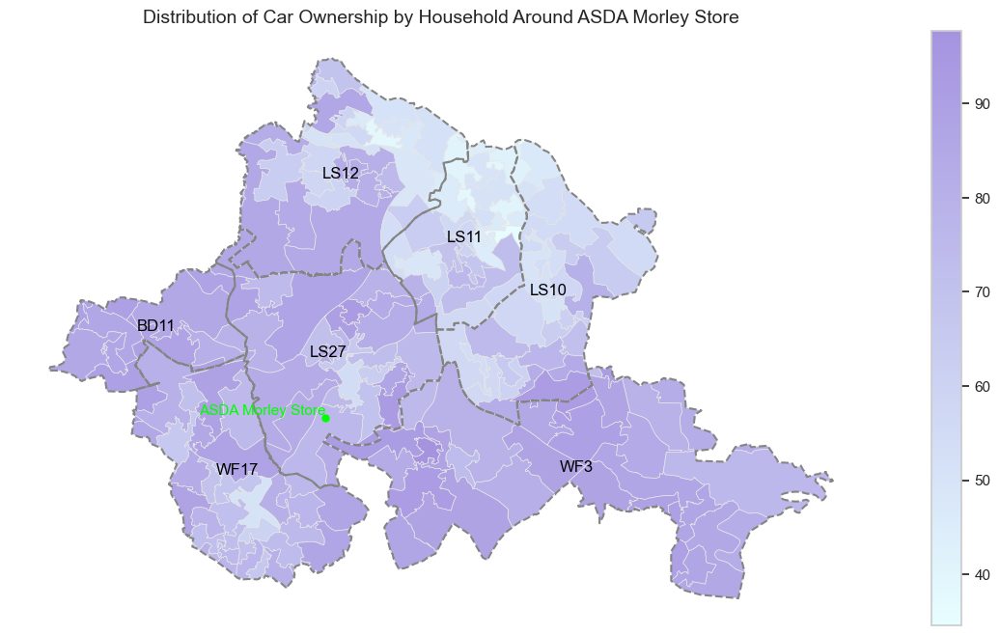

In [1077]:
# Create a more pronounced color gradient from very light to very dark #4682b4
cmap = mcolors.LinearSegmentedColormap.from_list("custom_blue", ["#e7feff", "#A593E0"])

# Plot the map with the updated color gradient
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
gdf_intersection.plot(column='car_ownership_%', cmap=cmap, linewidth=0.5, ax=ax, edgecolor='0.9', legend=True)

# Overlay postcode boundaries with dashed lines
leeds_postcodes_target.boundary.plot(ax=ax, color='#848482', linestyle='--', linewidth=1.5)

# # Highlight LS10 area with red dashed lines
# ls10_boundary = leeds_postcodes_target[leeds_postcodes_target['PostDist'] == 'LS10']
# ls10_boundary.boundary.plot(ax=ax, color='#f2003c', linestyle='--', linewidth=2)

# Add ASDA Morley Store location
text_offset_x = 10  # Adjust this value to move the text right/left
text_offset_y = 10  # Adjust this value to move the text up/down

ax.plot(morley_store_x, morley_store_y, marker='o', color='#00ff00', markersize=5, label='ASDA Morley Store')
ax.text(morley_store_x + text_offset_x, morley_store_y + text_offset_y, 'ASDA Morley Store', fontsize=11, ha='right', va='bottom', color='#00ff00')

# Add postcode names to the map
for idx, row in leeds_postcodes_target.iterrows():
    ax.annotate(text=row['PostDist'], xy=row['geometry'].centroid.coords[0],
                ha='center', fontsize=12, color='black')

# Turn off the axis frame
ax.set_axis_off()

# Change the title to "General Health: Very Good & Good Health"
plt.title('Distribution of Car Ownership by Household Around ASDA Morley Store', fontsize=14)
plt.show()

# Save the plot as an image file
fig.savefig('Results/Img/Distribution of Car Ownership by Household Around ASDA Morley Store.png', dpi=150, bbox_inches='tight')

Car ownership, which reflects both mobility and economic status, is also lower in **LS10** compared to other postcode districts.

Overall, in the case of **LS10**, the higher tendency towards unhealthy shopping is consistent with current research, where factors such as high deprivation, limited food accessibility, and low education levels contribute to less healthy food choices

<br><br><br><br>

---

<br>

## 4.1 Products in Morly Store

#### 4.1.1 Health Scores Vary Significantly Across Categories

policy -> Elevating health scores in various categories offers more choices to customers, enhancing overall health consumption.

<br><br><br><br>

# Implications for policy/practice

The findings from this study highlight several areas where improvements can be made to encourage healthier shopping behaviours:  

#### Increasing the Proportion of Healthy Foods and Improving Health Scores Across Categories in the Grocery Stores
By evaluating the NPM scores of all products, the overall healthiness of a store can be assessed. At ASDA Morley, nearly 60% of the products sold are classified as unhealthy. To promote healthier shopping environments, the government should consider regulating the proportion of healthy versus unhealthy foods available in stores. In addition to addressing the overall health score of the store, it is essential to focus on the health scores within specific food and drink categories, ensuring that each category offers healthy options.

#### Enhancing Product Health Knowledge: Simplifying Health Information on Labels
While all products are required to display nutritional information on their labels, it can be challenging for consumers to determine whether a product is healthy or not. The calculation of NPM scores is complex, making it difficult for customers to make informed decisions while shopping. Despite similar pricing and discounting between healthy and unhealthy products, consumers on a limited budget may still gravitate towards unhealthy options, possibly because they are unaware of the health implications of their purchases. This is supported by the fact that most of the top 10 unhealthy products, with the exception of "Milk Chocolate Digestives" and "Bourbon Biscuits," are everyday essentials.
Simplifying health labels to clearly indicate a product’s healthiness could empower consumers to make healthier choices. Grunert and Wills (2007) demonstrated that simplified labels are effective, though the design of these labels requires further investigation. While Borgmeier and Westenhoefer (2009) found the traffic light system to be the most effective, its impact on consumer choice remains limited. Turnwald and Crum (2019) recommended considering taste-focused labeling as an alternative, which may be more effective in promoting healthy food choices. Increasing transparency in this way would not only support healthier shopping habits but also encourage manufacturers to reformulate their products to improve their nutritional qualit  

__Top 10 Unhealthy Products sold in ASDA Morley Store:__  
<br>

| Product Name                     | Brand Name              | Category                  | NPM Score | Total Quantity Sold | Average Sale Price (£) |
|----------------------------------|-------------------------|---------------------------|-----------|---------------------|------------------------|
| Whole Milk                       | ASDA                    | Dairy Products            | 2.0       | 19,195              | 1.62                   |
| Whole Milk                       | ASDA                    | Dairy Products            | 2.0       | 12,501              | 2.38                   |
| 10 Unsmoked Back Bacon Rashers    | ASDA Butcher's Selection| Brought-In Bacon & Sausages| 14.0      | 11,004              | 1.84                   |
| Orange Juice from Concentrate     | ASDA Smart Price        | Dairy Products            | 2.0       | 9,559               | 0.89                   |
| Grated Cheddar                   | ASDA Smart Price        | Pre-Packaged Cheeses      | 21.0      | 8,727               | 2.71                   |
| Milk Chocolate Digestives         | ASDA                    | Cookies & Biscuits        | 20.0      | 8,041               | 0.78                   |
| 10 Smoked Back Bacon Rashers      | ASDA Butcher's Selection| Brought-In Bacon & Sausages| 14.0      | 7,999               | 1.85                   |
| Bourbon Biscuits                  | ASDA                    | Cookies & Biscuits        | 15.0      | 7,863               | 0.60                   |
| Granulated Sugar                  | Silver Spoon            | Beverages & Sweeteners    | 11.0      | 7,523               | 1.18                   |
| Grated Mozzarella Cheese          | ASDA                    | Pre-Packaged Cheeses      | 20.0      | 7,062               | 2.21                   |
.


#### Balancing the Price of Healthy and Unhealthy Products
Although the overall analysis of products in the ASDA store did not show a significant price difference between healthy and unhealthy options, specific product categories, such as meat, reveal that healthier options can indeed be more expensive. To address this disparity and make healthier foods more accessible, the government could consider reducing taxes on healthy options to enhance affordability. Additionally, providing targeted subsidies to households in need, specifically for essential healthy foods, could help alleviate the financial burden of choosing healthier options. Such a policy would encourage healthier shopping habits by making nutritious choices more affordable


#### IMD and PPFI can serve as tool to identifying areas with unhealthy shopping behaviours 
The geographical distribution of customers with a high tendency for unhealthy food choices closely aligns with the regions identified by the IMD and PPFI as top priorities for improvement. This alignment suggests that these indices are valuable in pinpointing areas where policy interventions are most needed. By focusing on these high-need regions, policymakers can better target efforts to improve access to healthier foods. Furthermore, considering additional factors such as car ownership and education levels could enhance the effectiveness of policies aimed at promoting healthier shopping habits.


<br><br><br>

# Limitation

1. **Limited Scope of Data**: The data used in this study only reflects purchases made at the ASDA Morley Store. The specific brand of the supermarket may limit the representativeness of the customer base, meaning that the analysis might not accurately reflect the entire population.

2. **NPM Calculation Limitations**: While the NPM calculation can be applied to various products, alcohol is excluded from this method. Treating alcohol using the same method as non-alcoholic products may lead to misjudgments.

3. **Incomplete Nutritional Information**: Some products at ASDA lack sufficient nutritional information. The solution applied in this study is to use the average NPM score for categories where over 50% of the products have available data. However, this substitution may introduce errors.

4. **Geographical Analysis Sample Size**: The geographical analysis is based on only 546 samples, accounting for just 3% of all customers who shopped at ASDA. Consequently, the geographical analysis reflects a small portion of the overall customer distribution.

5. **Postcode Assumptions**: Some customer postcodes were assumed, and customers may have moved or have multiple postcodes. It is challenging to determine the exact postcode of customers at the time of shopping. The solution was to prioritize the postcode closest to ASDA Morley Store, but this approach may still be inaccurate.

6. **Cluster Analysis Variability**: Each time the clustering algorithm is run, the results may vary slightly, and the number of clusters may differ. This variability is due to the K-means algorithm starting from different initial points each time it is executed.

<br><br><br>

<br>

# Future Work

The methodology developed from the analysis of the ASDA Morley store can be applied to other grocery stores, allowing retailers to evaluate the healthiness of their product offerings. This approach includes assessing the balance between healthy and unhealthy products and evaluating the nutritional quality of customer purchases. By calculating an overall health score for each store, greater transparency can be offered to customers, enabling them to make more informed decisions regarding the healthiness of their shopping environment. Both the UK Government's 2022 food strategy and recommendations from The Food Foundation (2022) advocate for increased transparency within the food system to encourage healthier diets.  


For grocery store owners, the methods used to analyse basket compositions and categorise customer types are valuable tools for assessing the effectiveness of health-focused marketing strategies. Monitoring changes in key metrics—such as average Nutrient Profile Model (NPM) scores, the proportion of healthy versus unhealthy baskets, and shifts in customer behaviour—can offer insights into the impact of these initiatives. Extending the observation period could further enhance understanding of long-term customer behaviour and the sustainability of healthier shopping habits  .


For policymakers, the nationwide application of this method to calculate health scores for food items, baskets, and entire stores can aid in evaluating the effectiveness of implemented policies. The effectiveness of policies such as the 2019 ban on promoting HFSS (high fat, salt, sugar) foods can be assessed more efficiently using this methodology, reducing the reliance on waiting for long-term health outcomes from the affected region.


<br><br><br><br>

# Conclusion

Customer shopping behaviour at the ASDA Morley store, like in many retail environments, is complex and influenced by various factors. Despite this complexity, clear patterns in food choices emerge, highlighting opportunities for targeted policy interventions. By tailoring policies to address the specific needs of different customer groups—particularly those who exhibit a tendency towards unhealthy purchasing behaviours—these interventions can be more effectively designed and implemented. Understanding the preferences and motivations behind customer choices is crucial for making these policies impactful.
Moreover, grocery stores themselves have a pivotal role in promoting healthier shopping habits. They are responsible for providing a diverse range of healthy options across all product categories and ensuring that product information is presented in a way that is easy for customers to understand. By addressing both consumer behaviour and the retail environment, it is possible to create a more supportive framework for healthier food choices, ultimately benefiting both customers and public health.


<br><br><br><br>

# References

- **Bedford, E. (2024)** Grocery market share in Great Britain 2017-2024, *Statista*, 3 May. Available at: <https://www.statista.com/statistics/market-share-of-grocery-stores-great-britain> (Accessed: 14 August 2024).

- **Borgmeier, I. and Westenhoefer, J. (2009)** 'Impact of different food label formats on healthiness evaluation and food choice of consumers: a randomized-controlled study', *BMC Public Health*, 9(184). Available at: <https://link.springer.com/article/10.1186/1471-2458-9-184> (Accessed: 14 August 2024).

- **Department of Health (2011)** *Nutrient Profiling Technical Guidance January 2011*. [pdf] London: Department of Health. Available at: <https://www.gov.uk/government/publications/the-nutrient-profiling-model> (Accessed: 14 August 2024).

- **Food Standards Agency (2022)** *Our food 2021: An annual review of food standards across the UK*. HC 229 SG/2022/34. London: The Stationery Office. Available at: <www.gov.uk/official-documents> (Accessed: 14 August 2024).

- **Food Standards Agency (2023)** *Our food 2022: An annual review of food standards across the UK*. HC 1859 SG/2023/139. London: The Stationery Office. Available at: <www.gov.uk/official-documents> (Accessed: 14 August 2024).

- **Grunert, K.G. and Wills, J.M. (2007)** 'A review of European research on consumer response to nutrition information on food labels', *Journal of Public Health*, 15, pp. 385–399. Available at: <https://link.springer.com/article/10.1007/s10389-007-0101-9> (Accessed: 14 August 2024).

- **Kantar (2024)** *Great Britain Grocery Market Share (12 weeks ending)*. Available at: <https://www.kantarworldpanel.com/en/grocery-market-share/great-britain> (Accessed: 14 August 2024).

- **Naidu, R. (2022)** 'Insight: In Britain's inflation crisis, healthy diets are a casualty', *Reuters*, 28 October. Available at: <https://www.reuters.com/world/uk/britains-inflation-crisis-healthy-diets-are-casualty-2022-10-28/> (Accessed: 14 August 2024).

- **National Food Strategy (2021)** *The National Food Strategy: Part Two*. Available at: <https://www.nationalfoodstrategy.org/the-report> (Accessed: 14 August 2024).

- **Rowlatt, J. (2021)** 'National Food Strategy: Tax sugar and salt and prescribe veg, report says', *BBC News*, 15 July. Available at: <https://www.bbc.com/news/health-57840825> (Accessed: 14 August 2024).

- **Shadbolt, P. (2015)** ‘How the discounters are beating the supermarkets’, *BBC News*, 23 September. Available at: <https://www.bbc.co.uk/news/business-34268492> (Accessed: 14 August 2024).

- **Sheridan, N. (no date)** 'ASDA Marketing Strategy 2024: A Case Study', *Latterly.org*. Available at: <https://www.latterly.org/asda-marketing-strategy/> (Accessed: 14 August 2024).

- **Simmonds, E. and Webb, C. (2024)** *Cheapest supermarkets 2024*, *Which?*, 2 August. Available at: <https://www.which.co.uk/reviews/supermarkets/article/supermarket-price-comparison-aPpYp9j1MFin> (Accessed: 14 August 2024).

- **The Food (Promotion and Placement) (England) Regulations 2021** SI 2021/1368. Available at: <https://www.legislation.gov.uk/uksi/2021/1368/made> (Accessed: 14 August 2024).

- **The Food Foundation (2022)** *The Broken Plate 2022: Major report highlights impact of Britain's disastrous food policy*. 18 July. Available at: <https://foodfoundation.org.uk/press-release/major-report-highlights-impact-britains-disastrous-food-policy> (Accessed: 14 August 2024).

- **The Food Foundation (2022)** *The Broken Plate 2022: The State of the Nation’s Food System*. Available at: <https://www.foodfoundation.org.uk/sites/default/files/2023-10/TFF_The%20Broken%20Plate%202023_Digital_FINAL..pdf> (Accessed: 14 August 2024).

- **Turnwald, B.P. and Crum, A.J. (2019)** 'Smart food policy for healthy food labeling: Leading with taste, not healthiness, to shift consumption and enjoyment of healthy foods', *Preventive Medicine*, 119, pp. 7–13. Available at: <https://doi.org/10.1016/j.ypmed.2018.11.021> (Accessed: 14 August 2024).

- **UK Government (2021)** *Restricting promotions of products high in fat, sugar and salt by location and by price: government response to public consultation*. Updated 19 July. Available at: <https://www.gov.uk/government/consultations/restricting-promotions-of-food-and-drink-that-is-high-in-fat-sugar-and-salt/outcome/restricting-promotions-of-products-high-in-fat-sugar-and-salt-by-location-and-by-price-government-response-to-public-consultation> (Accessed: 14 August 2024).

- **UK Government (2022)** *Government food strategy*. Presented to Parliament by the Secretary of State for Environment, Food and Rural Affairs by Command of Her Majesty, 13 June. Available at: <https://www.gov.uk/government/publications/government-food-strategy/government-food-strategy> (Accessed: 14 August 2024).


<br><br><br>